<h1 class="text-success text-center">
Projet 7: Implémentez un modèle de scoring
<br>
<p>
    <small>Chafaa BENHACINE |  Parcours : Data Scientist<small>
<br>
   Dernière mise à jour : 12/2021
 </p>
</h1>

# <span style='background:#7FFFD4'>Notebook_01 - EDA</span>

Ce notebook traite de l'analyse exploratoire des jeux de données **application_train.csv** et **application_test.csv** mis à notre disposition à partir d'un kernel Kaggle.

## <span>Sommaire</span> 

In [1]:
!pip install jyquickhelper

In [2]:
from jyquickhelper import add_notebook_menu
add_notebook_menu()

## <span>1. Introduction</span>

**Mission**

**`Développer un modèle de scoring de la probabilité de défaut de paiement du client`** pour étayer la décision d'accorder ou non un prêt à un client potentiel en s’appuyant sur des sources de données variées (données comportementales, données provenant d'autres institutions financières...).

**Objectifs**

- analyser le jeu de données,
- Construire **`un modèle de scoring`** qui donnera une prédiction sur la probabilité de faillite d'un client de façon automatique,
- réaliser un **`dashboard interactif`** permettant aux chargés de clientèles d'expliquer de manière transparente la décision d'octroi ou non de crédit

**Sources**

- [Data](https://www.kaggle.com/c/home-credit-default-risk/data)

Le **`Kernel Kaggle`** utilisé pour l'analyse exploratoire ayant l'EDA le plus de commentaires et effectuant une analyse exploratoire complète sur tout les fichiers csv mis à notre disposition a été livré par **`Rishabh Rao`** (Student at -Jaipur, Rajasthan, India).

- [Kernel Kaggle Rishabh Rao](https://www.kaggle.com/rishabhrao/home-credit-default-risk-extensive-eda)

Ce travail est complété par l'auteur par une présentation sur le site medium.com :

[Explications](https://medium.com/thecyphy/home-credit-default-risk-part-1-3bfe3c7ddd7a)

Les fonctions python utilisées pour l'EDA sont extraites du [github](https://github.com/rishabhrao1997/Home-Credit-Default-Risk) et stockées dans la librairie *EDA_KERNEL_FONCTIONS.py*.

**`Processus EDA`** (*extrait du Kernel Kaggle*)

Pour l'analyse des données, nous allons suivre les étapes suivantes :

- Pour chaque table, nous allons d'abord vérifier les **`statistiques de base`** comme :

    - le nombre d'enregistrements dans les tables;
    - le nombre de caractéristiques; 
    - le nombre de valeurs NaN, etc.
    
- Ensuite, nous allons **`explorer`** certaines des **`caractéristiques par rapport à la variable cible`** pour chaque table.

Nous utiliserons les graphiques suivants :

- Pour les caractéristiques catégorielles, nous utiliserons principalement des diagrammes à barres et des diagrammes circulaires.

- Pour les caractéristiques continues/numériques, nous utiliserons des Box-Plots, des Probability Density Function ([PDF](https://towardsdatascience.com/what-is-a-probability-density-function-d9b4b8bea121) [PDF](https://towardsdatascience.com/probability-distribution-functions-demystified-a6e882759af3)), des Cumulative Density Function [CDF](https://pub.towardsai.net/pdf-cdf-in-machine-learning-5a10f7abeef6) [CDF](https://sandeepdubey001.medium.com/pdf-probability-density-function-and-cdf-cumulative-distribution-function-a6a48945739e) et des Violin-Plots.

Enfin, nous tirerons des observations de chaque graphique et noterons les idées importantes générées par les graphiques.

In [3]:
!pip install lightgbm

In [4]:
!pip install phik

In [5]:
!pip install flake8 pycodestyle_magic

In [6]:
# Chargement des librairies
import datetime
import sys
import time
from datetime import datetime
import warnings
import jyquickhelper
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns

import P7_outils_data as outils_data
import P7_eda_kernel_fonctions as eda_kernel_fonctions
# import phik
# Plotly
import plotly
# import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Warnings
warnings.filterwarnings('ignore')
plotly.offline.init_notebook_mode(connected=True)

%matplotlib inline
# Chargement à chaud des librairies personnelles
%load_ext autoreload
%autoreload 2
# Valide code pep8
%load_ext pycodestyle_magic
%pycodestyle_on
# %pycodestyle_off

# Versions
print('\n____Version des librairies utilisées :____\n')
print('jyquickhelper         : ' + jyquickhelper.__version__)
print('Python                : ' + sys.version)
print('NumPy                 : ' + np.version.full_version)
print('Pandas                : ' + pd.__version__)
print('Outils dataframe      : ' + outils_data.__version__)
print('EDA KERNEL KAGGLE     : ' + eda_kernel_fonctions.__version__)
now = datetime.now().isoformat()
print('\nLancé le              : ' + now)


____Version des librairies utilisées :____

jyquickhelper         : 0.4.220
Python                : 3.8.8 (default, Apr 13 2021, 15:08:03) [MSC v.1916 64 bit (AMD64)]
NumPy                 : 1.19.5
Pandas                : 1.2.4
Outils dataframe      : 0.0.4
EDA KERNEL KAGGLE     : 0.0.0
Lancé le              : 2021-11-21T20:38:16.640484


In [7]:
dico_pd_option = {
    'display.max_rows': 400,
    'display.max_column': 200,
    'display.width': 300,
    'display.precision': 4,
    'display.max_colwidth': 1000,
    'mode.chained_assignment': None
    #     # pandas DataFrame column and row display limits
    #     'max_columns': None,
    #     'max_rows': None,
    #     'display.max_colwidth': 800
}
for cle, val in dico_pd_option.items():
    pd.set_option(cle, val)

## <span>2. Jeux de données</span>

### <span>2.1. Chargement</span>

In [8]:
# RECORD START TIME AND DATE
import datetime

timeStart = datetime.datetime.now()
print("__________________ START __________________")
print("\nDebut de traitement :\t" + timeStart.strftime("%d/%m/%Y %H:%M:%S"))
print("_" * 43)
print("\n")

__________________ START __________________

Debut de traitement :	21/11/2021 20:38:16
___________________________________________




In [9]:
# Répertoire de stockages des fichiers mis à notre disposition
path = 'DATA/'

**Liste des fichiers .csv**

In [10]:
outils_data.lister_fichiers_repertoire(path)

'10 fichiers présents dans ce répertoire :'

Nom_fichier,Size_en_MB
application_test.csv,25.3400
application_train.csv,158.4400
bureau.csv,162.1400
bureau_balance.csv,358.1900
credit_card_balance.csv,404.9100
HomeCredit_columns_description.csv,0.0400
installments_payments.csv,689.6200
POS_CASH_balance.csv,374.5100
previous_application.csv,386.2100
sample_submission.csv,0.5100


**Relation entre les différents fichiers**

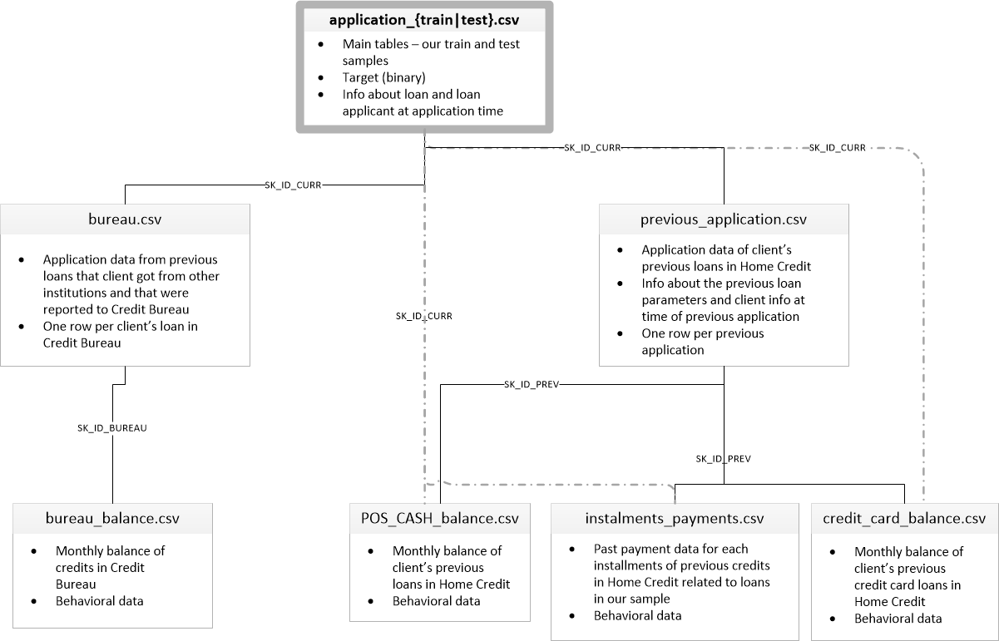

In [11]:
from IPython import display
display.Image('images/schema.png')

**Description des fichiers**

| Fichier | Description |
| --- | --- |
| <p style='text-align: justify;'>**application_train.csv** <br> **application_test.csv**</p> | <ul style='text-align: justify;'><li>Il s'agit du tableau principal, divisé en deux fichiers pour Train (avec TARGET) et Test (sans TARGET).</li> <li>Données statiques pour toutes les applications.</li><li>Une ligne représente un prêt dans notre échantillon de données.</li></ul> |
|  <p style='text-align: justify;'>**bureau.csv** |  <ul style='text-align: justify;'><li>Tous les crédits précédents du client fournis par d'autres institutions financières qui ont été rapportés au Credit Bureau (pour les clients qui ont un prêt dans notre échantillon). </li> <li> Pour chaque prêt de notre échantillon, il y a autant de lignes que le nombre de crédits que le client avait dans le Credit Bureau avant la date de la demande.</li> |
| <p style='text-align: justify;'>**bureau_balance.csv** | <ul style='text-align: justify;'><li>Soldes mensuels des crédits précédents dans Credit Bureau. </li> <li> Ce tableau a une ligne pour chaque mois d'historique de chaque crédit précédent rapporté au Credit Bureau - c'est-à-dire que le tableau a (#prêts dans l'échantillon * # de crédits précédents relatifs * # de mois où nous avons un historique observable pour les crédits précédents) des lignes.</li></ul> |
| <p style='text-align: justify;'>**POS_CASH_balance.csv** | <ul style='text-align: justify;'><li>Instantanés des soldes mensuels des prêts POS (point of sales) et cash précédents que le demandeur a eu avec Home Credit. </li> <li> Ce tableau comporte une ligne pour chaque mois de l'historique de chaque crédit précédent au Home Credit (crédit à la consommation et prêts au comptant) lié aux prêts de notre échantillon - c'est-à-dire que le tableau comporte (# de prêts dans l'échantillon * # de crédits précédents relatifs * # de mois dans lesquels nous avons un historique observable pour les crédits précédents) lignes.</li></ul> |
| <p style='text-align: justify;'>**credit_card_balance.csv** | <ul style='text-align: justify;'><li>Instantanés des soldes mensuels des cartes de crédit précédentes que le demandeur possède chez Home Credit. </li> <li>  Ce tableau comporte une ligne pour chaque mois de l'historique de chaque crédit précédent dans le Home Credit (crédit à la consommation et prêts de trésorerie) lié aux prêts de notre échantillon - c'est-à-dire que le tableau comporte (#prêts dans l'échantillon * # de cartes de crédit précédentes relatives * # de mois où nous avons un historique observable pour la carte de crédit précédente) lignes.</li></ul>|
| <p style='text-align: justify;'>**previous_application.csv** | <ul style='text-align: justify;'><li>Toutes les demandes précédentes de prêts pour le crédit immobilier des clients qui ont des prêts dans notre échantillon. </li> <li> Il y a une ligne pour chaque demande antérieure liée aux prêts dans notre échantillon de données.</li></ul> |
| <p style='text-align: justify;'>**installments_payments.csv** | <ul style='text-align: justify;'><li>Historique des remboursements pour les crédits précédemment déboursés dans Home Credit liés aux prêts de notre échantillon. </li> <li>  Il y a a) une ligne pour chaque paiement qui a été effectué plus b) une ligne pour chaque paiement manqué. Une ligne équivaut à un paiement d'un versement OU à un versement correspondant à un paiement d'un crédit précédent de Home Credit lié aux prêts de notre échantillon.</li></ul> |
| <p style='text-align: justify;'>**HomeCredit_columns_description.csv** | <ul style='text-align: justify;'><li>Ce fichier contient les descriptions des colonnes des différents fichiers de données.</li></ul> |

**Chargement des fichiers**

In [12]:
application_train, application_test, bureau, bureau_balance, cc_balance, \
    installments_payments, POS_CASH_balance, previous_application, \
    HomeCredit_columns_description = \
    eda_kernel_fonctions.load_all_tables(path)

Chargement des DATASETS...
____________________________________________________
Fichier application_train.csv chargé 	 --> dataframe : application_train
Fichier application_test.csv chargé 	 --> dataframe : application_test
Fichier bureau.csv chargé 		 --> dataframe : bureau
Fichier bureau_balance.csv chargé 	 --> dataframe : bureau_balance
Fichier credit_card_balance.csv chargé 	 --> dataframe : cc_balance
Fichier installments_payments.csv chargé  --> dataframe : installments_payments
Fichier POS_CASH_balance.csv chargé 	 --> dataframe : POS_CASH_balance
Fichier HomeCredit_columns_description.csv chargé  --> dataframe : HomeCredit_columns_description
Fichier previous_application.csv chargé  --> dataframe : previous_application
____________________________________________________
Le chargement des 9 datasets terminé en 0:00:25.604085 secondes


**Vue d'ensemble**

In [13]:
# Vue d'ensemble des 9 jeux de données
dataframes = [application_train, application_test, bureau, bureau_balance,
              cc_balance, installments_payments, POS_CASH_balance,
              previous_application, HomeCredit_columns_description]
noms = ['application_train', 'application_test', 'bureau', 'bureau_balance',
        'cc_balance', 'installments_payments', 'POS_CASH_balance',
        'previous_application', 'HomeCredit_columns_description']
outils_data.resume_datasets(dataframes, noms)

Les données se décomposent en 9 fichier(s).


Jeu de données,Nb lignes,Nb variables,Nb nan,% nan,Nb var avec nan,Var avec nan
application_train,307511,122,9152465,24.3959,67,"AMT_ANNUITY, AMT_GOODS_PRICE, NAME_TYPE_SUITE, OWN_CAR_AGE, OCCUPATION_TYPE, CNT_FAM_MEMBERS, EXT_SOURCE_1, EXT_SOURCE_2, EXT_SOURCE_3, APARTMENTS_AVG, BASEMENTAREA_AVG, YEARS_BEGINEXPLUATATION_AVG, YEARS_BUILD_AVG, COMMONAREA_AVG, ELEVATORS_AVG, ENTRANCES_AVG, FLOORSMAX_AVG, FLOORSMIN_AVG, LANDAREA_AVG, LIVINGAPARTMENTS_AVG, LIVINGAREA_AVG, NONLIVINGAPARTMENTS_AVG, NONLIVINGAREA_AVG, APARTMENTS_MODE, BASEMENTAREA_MODE, YEARS_BEGINEXPLUATATION_MODE, YEARS_BUILD_MODE, COMMONAREA_MODE, ELEVATORS_MODE, ENTRANCES_MODE, FLOORSMAX_MODE, FLOORSMIN_MODE, LANDAREA_MODE, LIVINGAPARTMENTS_MODE, LIVINGAREA_MODE, NONLIVINGAPARTMENTS_MODE, NONLIVINGAREA_MODE, APARTMENTS_MEDI, BASEMENTAREA_MEDI, YEARS_BEGINEXPLUATATION_MEDI, YEARS_BUILD_MEDI, COMMONAREA_MEDI, ELEVATORS_MEDI, ENTRANCES_MEDI, FLOORSMAX_MEDI, FLOORSMIN_MEDI, LANDAREA_MEDI, LIVINGAPARTMENTS_MEDI, LIVINGAREA_MEDI, NONLIVINGAPARTMENTS_MEDI, NONLIVINGAREA_MEDI, FONDKAPREMONT_MODE, HOUSETYPE_MODE, TOTALAREA_MODE, WALLSMATERIAL_MODE, EMERGENCYSTATE_MODE, OBS_30_CNT_SOCIAL_CIRCLE, DEF_30_CNT_SOCIAL_CIRCLE, OBS_60_CNT_SOCIAL_CIRCLE, DEF_60_CNT_SOCIAL_CIRCLE, DAYS_LAST_PHONE_CHANGE, AMT_REQ_CREDIT_BUREAU_HOUR, AMT_REQ_CREDIT_BUREAU_DAY, AMT_REQ_CREDIT_BUREAU_WEEK, AMT_REQ_CREDIT_BUREAU_MON, AMT_REQ_CREDIT_BUREAU_QRT, AMT_REQ_CREDIT_BUREAU_YEAR"
application_test,48744,121,1404419,23.8117,64,"AMT_ANNUITY, NAME_TYPE_SUITE, OWN_CAR_AGE, OCCUPATION_TYPE, EXT_SOURCE_1, EXT_SOURCE_2, EXT_SOURCE_3, APARTMENTS_AVG, BASEMENTAREA_AVG, YEARS_BEGINEXPLUATATION_AVG, YEARS_BUILD_AVG, COMMONAREA_AVG, ELEVATORS_AVG, ENTRANCES_AVG, FLOORSMAX_AVG, FLOORSMIN_AVG, LANDAREA_AVG, LIVINGAPARTMENTS_AVG, LIVINGAREA_AVG, NONLIVINGAPARTMENTS_AVG, NONLIVINGAREA_AVG, APARTMENTS_MODE, BASEMENTAREA_MODE, YEARS_BEGINEXPLUATATION_MODE, YEARS_BUILD_MODE, COMMONAREA_MODE, ELEVATORS_MODE, ENTRANCES_MODE, FLOORSMAX_MODE, FLOORSMIN_MODE, LANDAREA_MODE, LIVINGAPARTMENTS_MODE, LIVINGAREA_MODE, NONLIVINGAPARTMENTS_MODE, NONLIVINGAREA_MODE, APARTMENTS_MEDI, BASEMENTAREA_MEDI, YEARS_BEGINEXPLUATATION_MEDI, YEARS_BUILD_MEDI, COMMONAREA_MEDI, ELEVATORS_MEDI, ENTRANCES_MEDI, FLOORSMAX_MEDI, FLOORSMIN_MEDI, LANDAREA_MEDI, LIVINGAPARTMENTS_MEDI, LIVINGAREA_MEDI, NONLIVINGAPARTMENTS_MEDI, NONLIVINGAREA_MEDI, FONDKAPREMONT_MODE, HOUSETYPE_MODE, TOTALAREA_MODE, WALLSMATERIAL_MODE, EMERGENCYSTATE_MODE, OBS_30_CNT_SOCIAL_CIRCLE, DEF_30_CNT_SOCIAL_CIRCLE, OBS_60_CNT_SOCIAL_CIRCLE, DEF_60_CNT_SOCIAL_CIRCLE, AMT_REQ_CREDIT_BUREAU_HOUR, AMT_REQ_CREDIT_BUREAU_DAY, AMT_REQ_CREDIT_BUREAU_WEEK, AMT_REQ_CREDIT_BUREAU_MON, AMT_REQ_CREDIT_BUREAU_QRT, AMT_REQ_CREDIT_BUREAU_YEAR"
bureau,1716428,17,3939947,13.5026,7,"DAYS_CREDIT_ENDDATE, DAYS_ENDDATE_FACT, AMT_CREDIT_MAX_OVERDUE, AMT_CREDIT_SUM, AMT_CREDIT_SUM_DEBT, AMT_CREDIT_SUM_LIMIT, AMT_ANNUITY"
bureau_balance,27299925,3,0,0.0000,0,
cc_balance,3840312,23,5877356,6.6541,9,"AMT_DRAWINGS_ATM_CURRENT, AMT_DRAWINGS_OTHER_CURRENT, AMT_DRAWINGS_POS_CURRENT, AMT_INST_MIN_REGULARITY, AMT_PAYMENT_CURRENT, CNT_DRAWINGS_ATM_CURRENT, CNT_DRAWINGS_OTHER_CURRENT, CNT_DRAWINGS_POS_CURRENT, CNT_INSTALMENT_MATURE_CUM"
installments_payments,13605401,8,5810,0.0053,2,"DAYS_ENTRY_PAYMENT, AMT_PAYMENT"
POS_CASH_balance,10001358,8,52158,0.0652,2,"CNT_INSTALMENT, CNT_INSTALMENT_FUTURE"
previous_application,1670214,37,11109336,17.9769,16,"AMT_ANNUITY, AMT_CREDIT, AMT_DOWN_PAYMENT, AMT_GOODS_PRICE, RATE_DOWN_PAYMENT, RATE_INTEREST_PRIMARY, RATE_INTEREST_PRIVILEGED, NAME_TYPE_SUITE, CNT_PAYMENT, PRODUCT_COMBINATION, DAYS_FIRST_DRAWING, DAYS_FIRST_DUE, DAYS_LAST_DUE_1ST_VERSION, DAYS_LAST_DUE, DAYS_TERMINATION, NFLAG_INSURED_ON_APPROVAL"
HomeCredit_columns_description,219,4,133,15.1826,1,Special


### <span>2.2. Fichier application_train.csv</span>

#### <span>2.2.1. Description/statistiques</span>

<span>**Description**</span>

- Le fichier application_train.csv est constituée de données statiques relatives aux emprunteurs avec des étiquettes. 
- Chaque ligne représente une demande de prêt.

<span>**Compréhension des variables**</span>

In [14]:
df_var_appli_train = \
    HomeCredit_columns_description[HomeCredit_columns_description['Table']
                                   == 'application_{train|test}.csv']
df_var_appli_train.style.hide_index()

Table,Row,Description,Special
application_{train|test}.csv,SK_ID_CURR,ID of loan in our sample,nan
application_{train|test}.csv,TARGET,"Target variable (1 - client with payment difficulties: he/she had late payment more than X days on at least one of the first Y installments of the loan in our sample, 0 - all other cases)",nan
application_{train|test}.csv,NAME_CONTRACT_TYPE,Identification if loan is cash or revolving,nan
application_{train|test}.csv,CODE_GENDER,Gender of the client,nan
application_{train|test}.csv,FLAG_OWN_CAR,Flag if the client owns a car,nan
application_{train|test}.csv,FLAG_OWN_REALTY,Flag if client owns a house or flat,nan
application_{train|test}.csv,CNT_CHILDREN,Number of children the client has,nan
application_{train|test}.csv,AMT_INCOME_TOTAL,Income of the client,nan
application_{train|test}.csv,AMT_CREDIT,Credit amount of the loan,nan
application_{train|test}.csv,AMT_ANNUITY,Loan annuity,nan


<span>**Statistiques**</span>

In [15]:
eda_kernel_fonctions.afficher_stats_basic(application_train)

_______________________________________________________________________________
Le dataset contient 307511 lignes et 122 variables.
_______________________________________________________________________________
Nombre de valeurs dupliquées dans application_train : 0
_______________________________________________________________________________
Contenu des 3 premières lignes :


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.0188,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.0830,0.2629,0.1394,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.0035,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.3113,0.6222,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.0100,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.5559,0.7296,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

____________________________________________________
Type des variables



SK_ID_CURR                        int64
TARGET                            int64
NAME_CONTRACT_TYPE               object
CODE_GENDER                      object
FLAG_OWN_CAR                     object
FLAG_OWN_REALTY                  object
CNT_CHILDREN                      int64
AMT_INCOME_TOTAL                float64
AMT_CREDIT                      float64
AMT_ANNUITY                     float64
AMT_GOODS_PRICE                 float64
NAME_TYPE_SUITE                  object
NAME_INCOME_TYPE                 object
NAME_EDUCATION_TYPE              object
NAME_FAMILY_STATUS               object
NAME_HOUSING_TYPE                object
REGION_POPULATION_RELATIVE      float64
DAYS_BIRTH                        int64
DAYS_EMPLOYED                     int64
DAYS_REGISTRATION               float64
DAYS_ID_PUBLISH                   int64
OWN_CAR_AGE                     float64
FLAG_MOBIL                        int64
FLAG_EMP_PHONE                    int64
FLAG_WORK_PHONE                   int64


,Nombre par type de variable,% des types de variable
float64,65,53.2800
int64,41,33.6100
object,16,13.1100


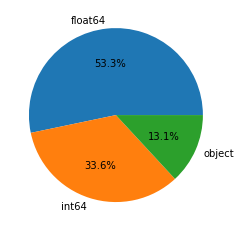

In [16]:
# Types des variables
outils_data.get_types_variables(application_train, True, True, True)

In [17]:
# Résumé des variables
desc_appli_train = outils_data.description_variables(application_train)
desc_appli_train

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
type,int64,int64,object,object,object,object,int64,float64,float64,float64,float64,object,object,object,object,object,float64,int64,int64,float64,int64,float64,int64,int64,int64,int64,int64,int64,object,float64,int64,int64,object,int64,int64,int64,int64,int64,int64,int64,object,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,object,object,float64,object,object,float64,float64,float64,float64,float64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,float64,float64,float64,float64,float64,float64
nb_nan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,12.0,278.0,1292.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,202929.0,0.0,0.0,0.0,0.0,0.0,0.0,96391.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,173378.0,660.0,60965.0,156061.0,179943.0,150007.0,204488.0,214865.0,163891.0,154828.0,153020.0,208642.0,182590.0,210199.0,154350.0,213514.0,169682.0,156061.0,179943.0,150007.0,204488.0,214865.0,163891.0,154828.0,153020.0,208642.0,182590.0,210199.0,154350.0,213514.0,169682.0,156061.0,179943.0,150007.0,204488.0,214865.0,163891.0,154828.0,153020.0,208642.0,182590.0,210199.0,154350.0,213514.0,169682.0,210295.0,154297.0,148431.0,156341.0,145755.0,1021.0,1021.0,1021.0,1021.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,41519.0,41519.0,41519.0,41519.0,41519.0,41519.0
%_nan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0007,0.0034,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.5409,0.0,0.0,0.0,0.0,0.0,

**Bilan** :
***
- Le fichier application_train.csv contient environ **307000 enregistrements** et **122 variables**. 
- Ces variables contiennent les **statistiques personnelles d'un demandeur particulier**, telles que son âge, ses revenus, le type de prêt, les statistiques de son appartement, etc.
- Il y a **307000 SK_ID_CURR uniques** qui représentent des demandes de prêt uniques.
- Le champ **TARGET** représente le **statut de défaut de paiement du prêt** :
    - 0 pour non défaillant,
    - et 1 pour défaillant.

<span>**Valeurs manquantes**</span>

Valeurs manquantes : 9152465 NaN pour 37516342 données (24.4 %)
____________________________________________________
Nombre et % de valeurs manquantes par variable



,Nombres de valeurs manquantes,% de valeurs manquantes
COMMONAREA_MEDI,214865,69.8700
COMMONAREA_AVG,214865,69.8700
COMMONAREA_MODE,214865,69.8700
NONLIVINGAPARTMENTS_MEDI,213514,69.4300
NONLIVINGAPARTMENTS_MODE,213514,69.4300
NONLIVINGAPARTMENTS_AVG,213514,69.4300
FONDKAPREMONT_MODE,210295,68.3900
LIVINGAPARTMENTS_MODE,210199,68.3500
LIVINGAPARTMENTS_MEDI,210199,68.3500
LIVINGAPARTMENTS_AVG,210199,68.3500


____________________________________________________
Heatmap de visualisation des valeurs manquantes


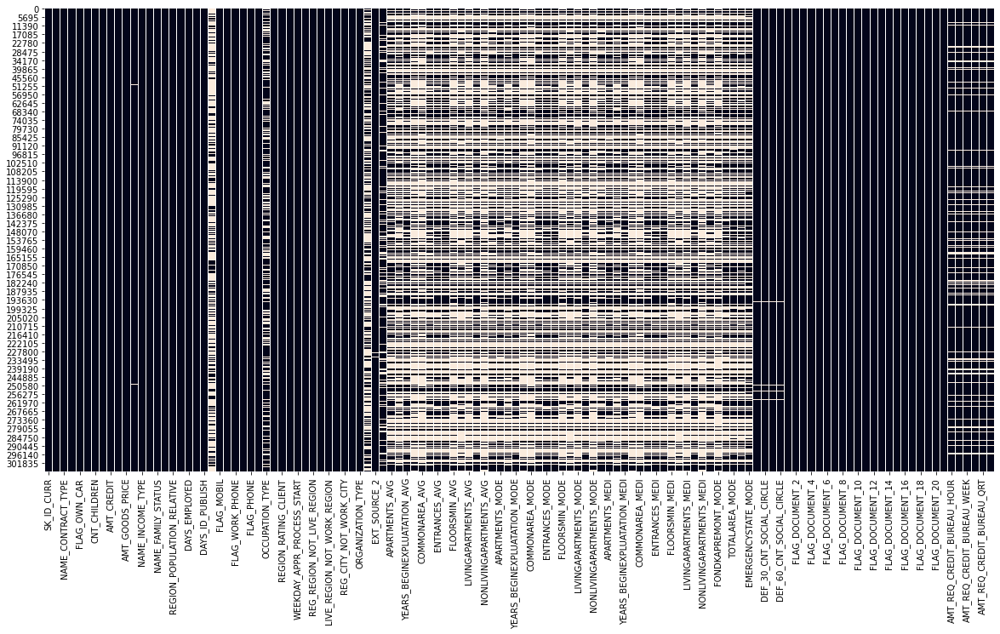

In [18]:
# Valeurs manquantes du dataframe
outils_data.get_missing_values(application_train, True, True)

Nombre de variables avec valeurs manquantes : 67


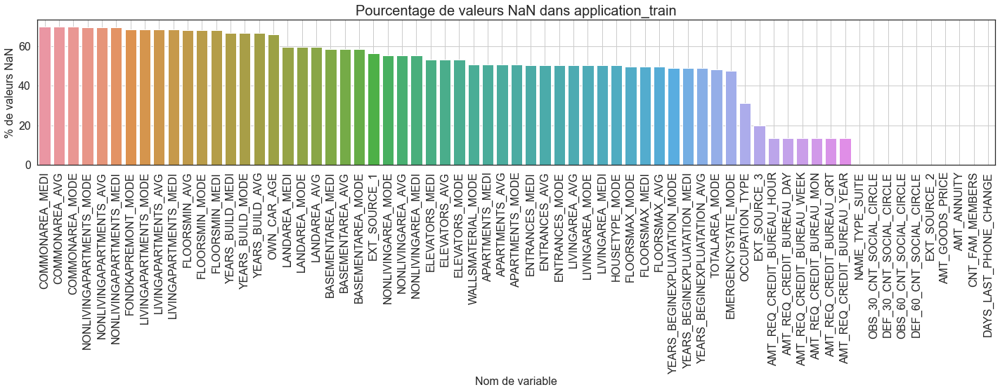

In [19]:
# Réprésentation visuelle des valeurs manquantes
df_nan = eda_kernel_fonctions.nan_df_create(application_train)
eda_kernel_fonctions.plot_nan_percent(df_nan, 'application_train', grid=True)

*****
**Conclusion** :

- Le graphique ci-dessus montre que `67` variables sur `122` contiennent des NaN.


- S'il n'y avait qu'une ou deux colonnes contenant des NaN, nous aurions pu nous en sortir en éliminant simplement ces variables, mais pour un si grand nombre de colonnes, nous ne pouvons pas les éliminer telles quelles, car la perte d'information pourrait être très élevée.


- Nous constatons que certaines variables comme celles relatives à "`COMMONAREA`", "`NONLIVINGAPARTMENT`", ont près de `70%` de NaN. Nous devrions trouver des techniques pour gérer ces nombreuses NaN et voir ce qui fonctionne le mieux pour nos données.


- Une autre chose à noter ici est que la plupart des variables qui ont plus de `50%` de NaN sont liées aux statistiques sur les appartements de l'emprunteur. Il est très probable que ces valeurs n'aient pas été enregistrées lors de la saisie des données et qu'elles soient facultatives.
******

#### <span>2.2.2. Analyse exploratoire univariée</span>

<span>**Distribution de la TARGET**</span>

- Variable cible :

    - **1** : demandeur ayant des difficultés de paiement "**`défaillant`**": c-à-d celui qui a eu un retard de paiement de plus de X jours sur au moins une des Y premières échéances du prêt dans notre échantillon.
    - **0** : tous les autres cas "**`non-défaillant`**".

In [20]:
target_distribution = application_train.TARGET.value_counts()
labels = ['Non-Defaulter', 'Defaulter']
colors = ["blue", "yellow"]

fig = go.Figure(data=[go.Pie(values=target_distribution, labels=labels,
                             textinfo='percent', pull=[0, 0.04],
                             marker=dict(colors=colors))],
                layout=go.Layout(title='Distribution de la TARGET'))

fig.show()

*****
**Conclusion** :

- D'après la **`distribution de la variable cible`** une chose que nous pouvons rapidement remarquer est le **`déséquilibre des données`**.


- Il n'y a que `8,07%` du total des prêts qui ont été mis en défaut. Cela signifie que les `défaillants` constituent la `classe minoritaire`;
    
    
- D'un autre côté, il y a `91,9%` de prêts qui n'ont pas été en défaut. Ainsi, les `Non-Défaillants` seront notre `classe majoritaire`.
        
        
- Les `défaillants` se sont vus attribuer une variable cible de `1` et les `non-défaillants` une variable cible de `0`.


- Pour les ensembles de données déséquilibrés, lors de la construction du **`modèle`**, nous ne pouvons **pas alimenter les données telles quelles à certains algorithmes**, qui sont **sensibles au déséquilibre**.


- Il en va de même pour les mesures de performance. Pour un tel jeu de données, la **`précision`** n'est généralement **pas la bonne mesure**, car elle est généralement **biaisée en faveur de la classe majoritaire**. Nous pouvons **utiliser d'autres métriques** telles que le **`score ROC-AUC`**, la **`perte logarithmique`**, le **`score F1`**, **`la matrice de confusion`** pour une meilleure évaluation du modèle.


- Une autre chose importante à noter ici est qu'il y a très peu de personnes qui font réellement défaut, et elles ont tendance à montrer une sorte de comportement différent. Ainsi, dans de tels cas de détection de fraude, de défaut de paiement et de détection d'anomalie, nous devons également nous concentrer sur les **`valeurs aberrantes`**, et nous ne pouvons **`pas les supprimer`**, car elles pourraient être le **`facteur de différenciation entre les personnes en défaut de paiement et celles qui ne le sont pas`**.
*****

<span>**Distribution des variables catégorielles**</span>

In [21]:
# Liste des variables qualitatives
cols_cat = \
    application_train.select_dtypes(exclude=[np.number]).columns.to_list()

In [22]:
cols_cat

['NAME_CONTRACT_TYPE',
 'CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'NAME_TYPE_SUITE',
 'NAME_INCOME_TYPE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'OCCUPATION_TYPE',
 'WEEKDAY_APPR_PROCESS_START',
 'ORGANIZATION_TYPE',
 'FONDKAPREMONT_MODE',
 'HOUSETYPE_MODE',
 'WALLSMATERIAL_MODE',
 'EMERGENCYSTATE_MODE']

<span>**Variable `NAME_CONTRACT_TYPE`**</span>

- Cette variable contient des informations sur le `type de prêt` pour le demandeur donné :


    * prêt cash;
    * prêt revolving. 
    
    
- Selon la documentation fournie par Home Credit, il existe deux types de prêts, à savoir `les prêts renouvelables` et `les prêts en espèces`.

In [23]:
# Voyons d'abord les catégories uniques de 'NAME_CONTRACT_TYPE'
eda_kernel_fonctions.print_unique_categories(application_train, 'NAME_CONTRACT_TYPE')

# Tracer le Pie Plot pour la colonne
eda_kernel_fonctions.plot_categorical_variables_pie(application_train, 'NAME_CONTRACT_TYPE')
# Note : en survol sur la répartition des défaillants seuls : 
# c'est le pourcentage des défaillants par catégorie sur le nombre total de cette catégorie.

_______________________________________________________________________________
Les catégories uniques de la variable 'NAME_CONTRACT_TYPE' sont :
['Cash loans' 'Revolving loans']
_______________________________________________________________________________


2:80: E501 line too long (85 > 79 characters)
5:80: E501 line too long (92 > 79 characters)
6:62: W291 trailing whitespace
7:80: E501 line too long (92 > 79 characters)


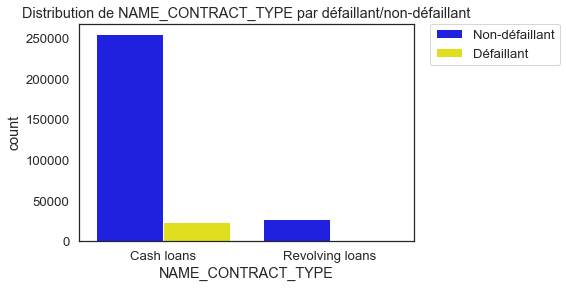

2:80: E501 line too long (86 > 79 characters)


In [24]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train, 'NAME_CONTRACT_TYPE')

*****
**Conclusion** :

A partir du graphique ci-dessus, nous pouvons tirer les observations et conclusions suivantes :


- A partir du premier sous-graphe, c'est-à-dire la distribution globale : 
    - On peut voir que la plupart des prêts que les demandeurs prennent sont des `prêts cash`. 
    - Seulement `9,52%` des personnes ont contracté des `prêts revolving`.
    
    
- Dans le deuxième sous-graphe, c'est-à-dire le pourcentage de défaillants :
    - Nous voyons qu'il y a un plus grand pourcentage de personnes qui ont fait défaut de paiement avec des prêts cash (`8,35%`) par rapport aux personnes qui ont fait défaut de paiement  avec des prêts revolving (`5,48%`).
*****

<span>**Variable `CODE_GENDER`**</span>

Cette variable contient des informations sur le sexe du client/demandeur :

- **`F`** pour **`Féminin`**;
    
- **`M`** pour **`Masculin`**. 

In [25]:
# Voyons d'abord les catégories uniques de 'CODE_GENDER'
eda_kernel_fonctions.print_unique_categories(application_train, 'CODE_GENDER', show_counts=True)

# Tracer le graphique à secteurs pour la colonne
eda_kernel_fonctions.plot_categorical_variables_pie(application_train, 'CODE_GENDER')

_______________________________________________________________________________
Les catégories uniques de la variable 'CODE_GENDER' sont :
['M' 'F' 'XNA']
_______________________________________________________________________________
Répartition dans chaque catégorie :
F      202448
M      105059
XNA         4
Name: CODE_GENDER, dtype: int64
_______________________________________________________________________________


2:80: E501 line too long (96 > 79 characters)
5:80: E501 line too long (85 > 79 characters)


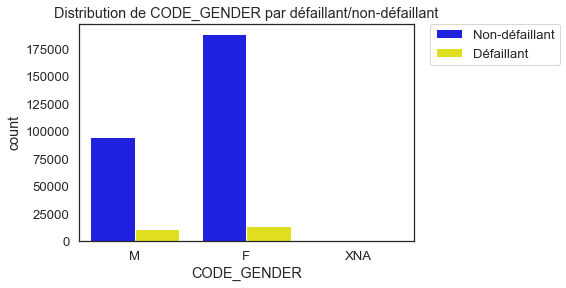

In [26]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train, 'CODE_GENDER')

*****
**Conclusion** :

La distribution de la variable `CODE_GENDER` semble intéressante!

Voici quelques points de discussion :

- **1**. Le premier point à observer est qu'il y a `4 lignes` dans la table `application_train` qui ont des genres '`XNA`', ce qui n'a pas beaucoup de sens, et peut être compté comme des valeurs `NaN`. Puisqu'elles ne sont que 4 et qu'elles appartiennent à la catégorie des non-défaillants. Nous pouvons donc éliminer ces lignes sans trop d'hésitation.


- **2**. Dans le sous-graphe 1, nous voyons que pour l'ensemble de données, il y a plus de candidats féminins (`65,8%`) que de candidats masculins (`34,2%`).


- **3**. Cependant, contrairement au nombre de candidats féminins, le deuxième graphique montre que les candidats masculins ont tendance à être plus souvent défaillants (`10,14%`) que les candidats féminins (`7%`).

Ainsi, on peut dire que les hommes ont plus tendance à ne pas rembourser leurs dettes que les femmes, selon l'ensemble des données.
*****

<span>**Variable `FLAG_EMP_PHONE`**</span>

Cette variable est une variable booléenne, qui indique si le demandeur a fourni son numéro de téléphone professionnel ou non :
- **`1`** pour **`Oui`**;

- **`0`** signifie **`Non`**.

In [27]:
# Voyons d'abord les catégories uniques de 'FLAG_EMP_PHONE'
eda_kernel_fonctions.print_unique_categories(application_train, 'FLAG_EMP_PHONE')

# Tracer le graphique à secteurs pour la colonne
eda_kernel_fonctions. \
        plot_categorical_variables_pie(application_train, column_name='FLAG_EMP_PHONE')

_______________________________________________________________________________
Les catégories uniques de la variable 'FLAG_EMP_PHONE' sont :
[1 0]
_______________________________________________________________________________


2:80: E501 line too long (81 > 79 characters)
6:80: E501 line too long (87 > 79 characters)


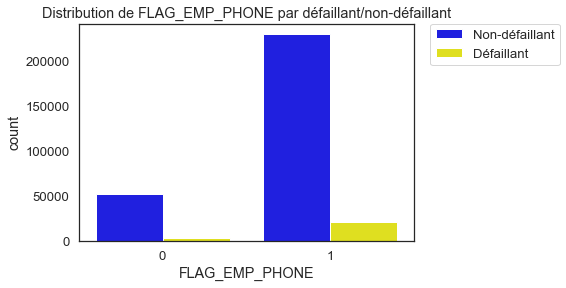

2:80: E501 line too long (82 > 79 characters)


In [28]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train, 'FLAG_EMP_PHONE')

*****
**Conclusion** :

Cette variable contient deux catégories, à savoir si le demandeur a fourni ou non son numéro de téléphone professionnel lors du processus d'inscription/demande.

- Dans le premier sous-graphe, nous constatons que la plupart des demandeurs fournissent leur numéro de téléphone professionnel (`82%`) et que seulement `18%` ne l'ont pas fourni.


- On peut également constater que la tendance des personnes en défaillance de paiement qui fournissent leur numéro de téléphone professionnel est plus importante que ceux qui ne sont pas défaillant. Cette caractéristique pourrait être attribuée au fait que les personnes en défaut de paiement fournissent leur numéro de téléphone professionnel afin de ne pas être dérangées sur leur téléphone personnel.
*****

<span>**Variable `REGION_RATING_CLIENT_W_CITY`**</span>

- Notre évaluation de la région où vit le demandeur en tenant compte de la ville (`1` ou `2` ou `3`).


- Cette variable correspond à la note attribuée par le Crédit immobilier à la région de chaque demandeur sur la base des enquêtes qu'il a pu réaliser. Cette notation tient également compte de la ville dans laquelle vit le demandeur.


- La prise en compte de la ville est importante, car même si certaines régions ont une bonne note dans une ville particulière, mais que cette ville n'a pas une note élevée, le demandeur se verra attribuer une note moyenne et non une note élevée.
- Les notes sont comprises entre `1 et 3`.

In [29]:
# Voyons d'abord les catégories uniques de 'REGION_RATING_CLIENT_W_CITY'
eda_kernel_fonctions.print_unique_categories(application_train, 'REGION_RATING_CLIENT_W_CITY')

# Tracer le graphique à secteurs pour la colonne
eda_kernel_fonctions. \
    plot_categorical_variables_pie(application_train, column_name='REGION_RATING_CLIENT_W_CITY')

_______________________________________________________________________________
Les catégories uniques de la variable 'REGION_RATING_CLIENT_W_CITY' sont :
[2 1 3]
_______________________________________________________________________________


2:80: E501 line too long (94 > 79 characters)
6:80: E501 line too long (96 > 79 characters)


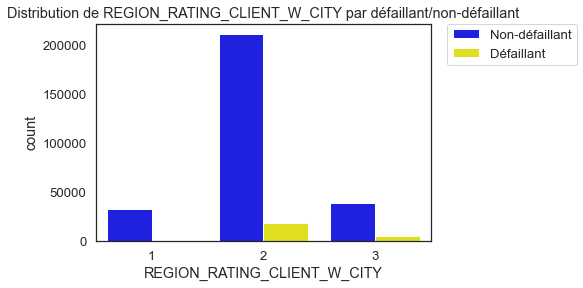

2:80: E501 line too long (95 > 79 characters)


In [30]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train, 'REGION_RATING_CLIENT_W_CITY')

*****
**Conclusion** :

Les graphiques ci-dessus nous permettent de tirer les conclusions suivantes :

- Dans le premier sous-graphe, nous constatons que :
    - La plupart des demandeur (`74,6%`) ont un indice de région de `2`. Il s'agit de la valeur moyenne qui correspond à la plupart des demandeurs.
    - Très peu de demandeurs ont un classement régional de `1` (seulement `11,1%`) et certains ont un classement de `3` --> (`14,3%`).
    
    
- Parmi les défaillants, on constate que :
    - la plupart d'entre eux ont un classement régional de `3` (`11,4%` cf survol sur le schéma, pourcentage parmi les notes de chaque catégorie), ce qui est comparativement plus élevé que les deux autres classements, c'est-à-dire que les demandeurs ayant un classement de `1` ont un pourcentage de défaillance de seulement `4,84%` (cf survol) et ceux ayant un classement de `2` ont un pourcentage de `7,92%` (cf survol).
    
Cela montre que la note `3` pourrait être un attribut important pour prendre une décision sur les caractéristiques de défaillance.
*****

<span>**Variable `NAME_EDUCATION_TYPE`**</span>

Cette variable décrit/énumére le niveau d'éducation le plus élevée obtenu par le demandeur.

_______________________________________________________________________________
Les catégories uniques de la variable 'NAME_EDUCATION_TYPE' sont :
['Secondary / secondary special' 'Higher education' 'Incomplete higher'
 'Lower secondary' 'Academic degree']
_______________________________________________________________________________
Répartition dans chaque catégorie :
Secondary / secondary special    218391
Higher education                  74863
Incomplete higher                 10277
Lower secondary                    3816
Academic degree                     164
Name: NAME_EDUCATION_TYPE, dtype: int64
_______________________________________________________________________________
Nombre de catégories uniques pour NAME_EDUCATION_TYPE = 5


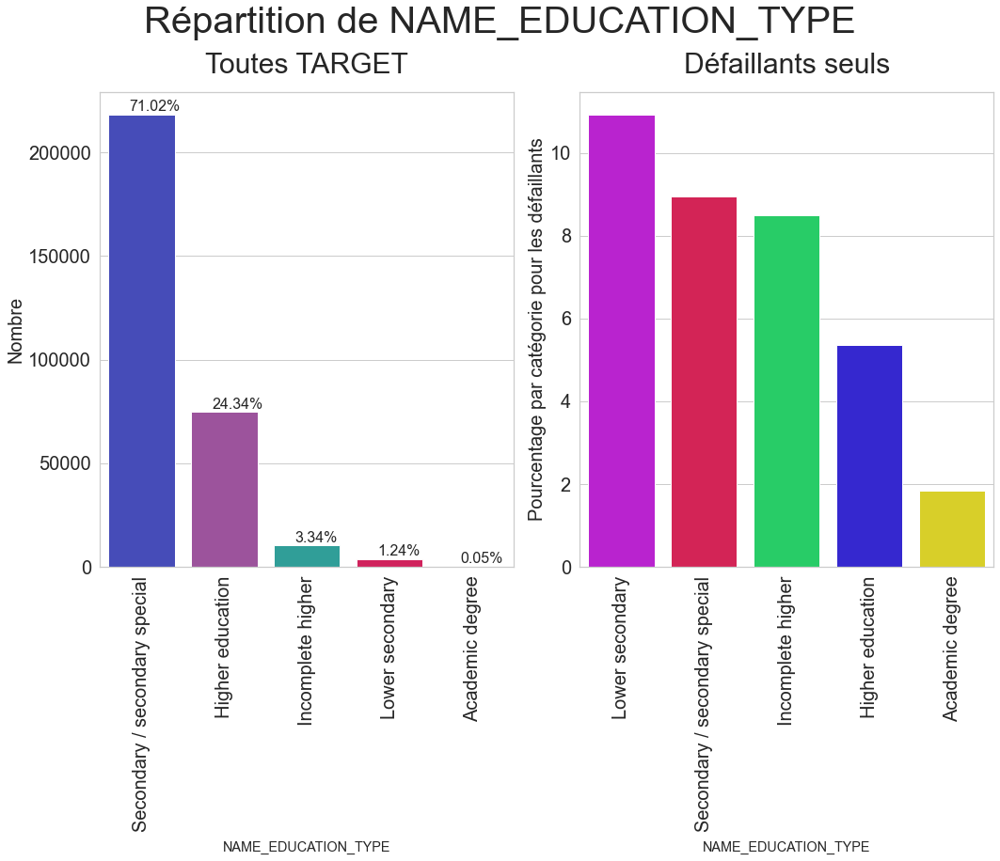

2:80: E501 line too long (104 > 79 characters)


In [31]:
# Voyons d'abord les catégories uniques de 'NAME_EDUCATION_TYPE'
eda_kernel_fonctions.print_unique_categories(application_train, 'NAME_EDUCATION_TYPE', show_counts=True)

# Tracer le graphique à barres pour la colonne
eda_kernel_fonctions. \
    plot_categorical_variables_bar(application_train,
                                   column_name='NAME_EDUCATION_TYPE',
                                   figsize=(15, 13), rotation=90,
                                   horizontal_adjust=0.25,
                                   fontsize_percent=16,
                                   palette1=['#333bcb', '#a847a8',
                                             '#1eb0a9', '#ed0552',
                                             '#f02f16'],
                                   palette2=['#ce07eb', '#f00749',
                                             '#0ce860', '#1e0ceb',
                                             '#f5e90c'])

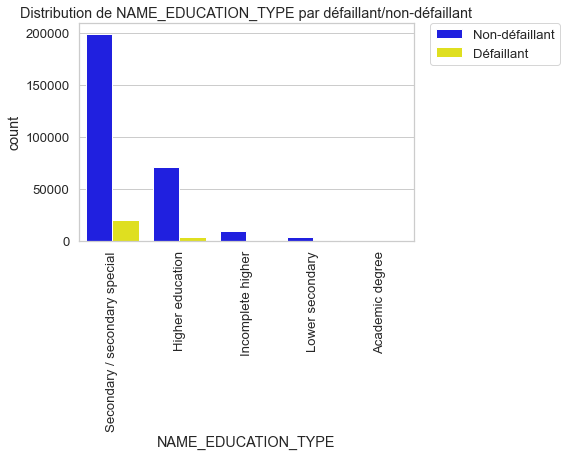

2:80: E501 line too long (100 > 79 characters)


In [32]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train, 'NAME_EDUCATION_TYPE', rotation=90)

*****
**Conclusion** :

En regardant les graphiques ci-dessus, nous pouvons conclure ce qui suit :

- Environ `71%` des personnes n'ont fait que des études secondaires ou des études secondaires spéciales et `24,34%` des demandeurs ont fait des études supérieures. Cela suggère que la plupart des demandeurs/emprunteurs n'ont pas un niveau d'éducation élevé.


- Le deuxième graphique montre que :
    - les personnes qui ont fait leurs études jusqu'au premier cycle du secondaire seulement, ont les taux de défaillance les plus élevés, les études dans le cycle secondaire et dans le cycle supérieur incomplet ayant des tendances similaires.
    - Le groupe des personnes ayant fait des études supérieures a une tendance à la défaillance comparativement plus faible, ce qui est aussi logique.
    - De même, les personnes titulaires d'un diplôme universitaire présentent le taux de défaillance le plus faible. Cependant, le groupe des titulaires d'un diplôme universitaire est très peu nombreux, ce qui peut ne pas être très utile.
*****

<span>**Variable `OCCUPATION_TYPE`**</span>

C'est la catégorie socioprofessionnelle (**CSP**)
- Cette variable indique la catégorie socio-professionnelle du demandeur. 
- Il peut s'agir d'une variable très importante qui pourrait décrire les variables de défaillance d'un demandeur. 

_______________________________________________________________________________
Les catégories uniques de la variable 'OCCUPATION_TYPE' sont :
['Laborers' 'Core staff' 'Accountants' 'Managers' nan 'Drivers'
 'Sales staff' 'Cleaning staff' 'Cooking staff' 'Private service staff'
 'Medicine staff' 'Security staff' 'High skill tech staff'
 'Waiters/barmen staff' 'Low-skill Laborers' 'Realty agents' 'Secretaries'
 'IT staff' 'HR staff']
_______________________________________________________________________________
Nombre de catégories uniques pour OCCUPATION_TYPE = 19


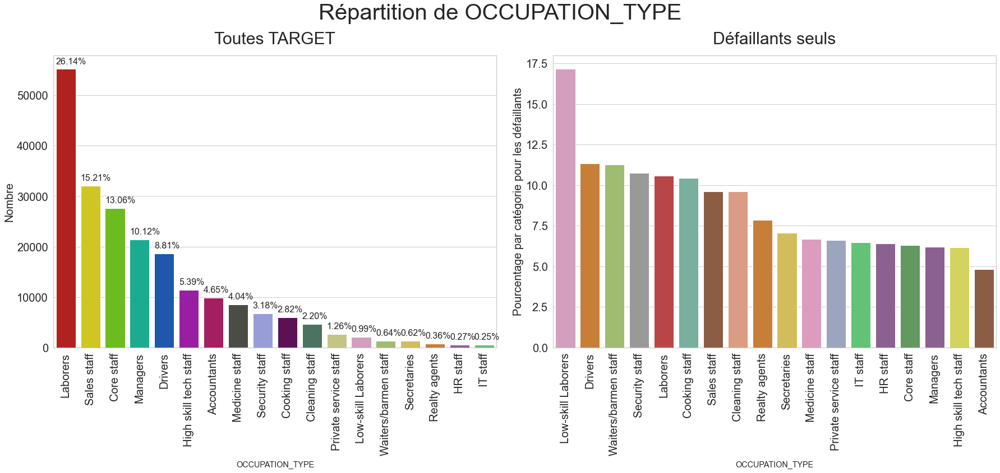

2:80: E501 line too long (82 > 79 characters)
19:1: W293 blank line contains whitespace


In [33]:
# Voyons d'abord les catégories uniques de 'OCCUPATION_TYPE'
eda_kernel_fonctions.print_unique_categories(application_train, 'OCCUPATION_TYPE')

# Tracer le graphique à barres pour la colonne
eda_kernel_fonctions. \
    plot_categorical_variables_bar(application_train, column_name='OCCUPATION_TYPE',
                                                                           figsize=(25, 12), rotation=90,
                                                                           fontsize_percent=16,
                                                                           palette1=['#c90906', '#ebdf07',
                                                                                     '#6bd606', '#06c29f',
                                                                                     '#0852c2', '#ac09b8',
                                                                                     '#ba0962', '#4d4d46',
                                                                                     '#8d94e3', '#69055f',
                                                                                     '#467861', '#cdcf7a',
                                                                                     '#db96c0', '#a2c865',
                                                                                     '#e5c949', '#df7f20',
                                                                                     '#905998', '#52d26c'],

                                                                           palette2=['#db96c0', '#df7f20',
                                                                                     '#a2c865', '#999999',
                                                                                     '#cb3335', '#72b6a1',
                                                                                     '#965a38', '#e99675',
                                                                                     '#df7f20', '#e5c949',
                                                                                     '#e890be', '#95a3c3',
                                                                                     '#52d26c', '#905998',
                                                                                     '#59a257', '#905998',
                                                                                     '#e6e64c', '#965a38'])

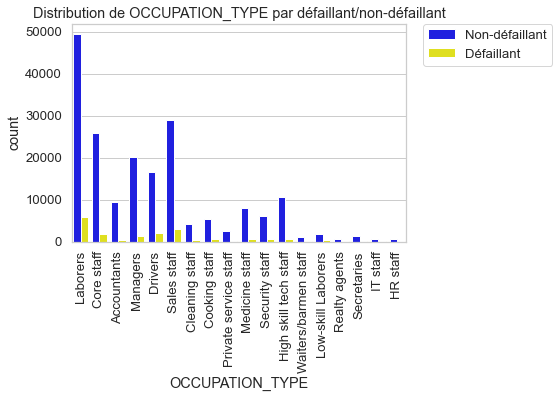

2:80: E501 line too long (96 > 79 characters)


In [34]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train, 'OCCUPATION_TYPE', rotation=90)

*****
**Conclusion** :

À partir des graphiques sur la catégorie socio-professionnelle, nous pouvons tirer les conclusions suivantes :

 - Parmi les demandeurs, la catégorie socio-professionnelle la plus courante est celle des ouvriers, qui représente près de `26%` des demandes. - La deuxième profession la plus fréquente est celle des responsables de vente, suivie par le personnel administratif publique et exécutif et les managers.
- Le taux de défaillance des travailleurs peu qualifiés est le plus élevé de tous les catégories (`~17,5%`). Viennent ensuite les chauffeurs, les serveurs, le personnel de sécurité, les ouvriers, le personnel de cuisine, etc. Tous ces emplois sont des emplois de bas niveau. Cela montre que les personnes occupant des emplois de bas niveau ont tendance à avoir un taux de défaillance plus élevé.
- Le taux de défaillance le plus faible se trouve parmi les comptables, le personnel administratif et exécutif publique, les gestionnaires, le personnel technique hautement qualifié, le personnel des RH, etc. qui sont des emplois de niveau moyen à élevé.
- On peut donc conclure que les travailleurs des emplois de bas niveau ont tendance à avoir un taux de défaillance plus élevé que ceux des emplois de niveau moyen à élevé.
*****

<span>**Variable `ORGANIZATION_TYPE`**</span>

- Tout comme la catégorie socio-professionnelle, le secteur d'activité auquel le demandeur appartient pourrait également être une caractéristique importante pour prédire le risque de défaillance de ce demandeur.

Nombre de catégories de la variable ORGANIZATION_TYPE = 58


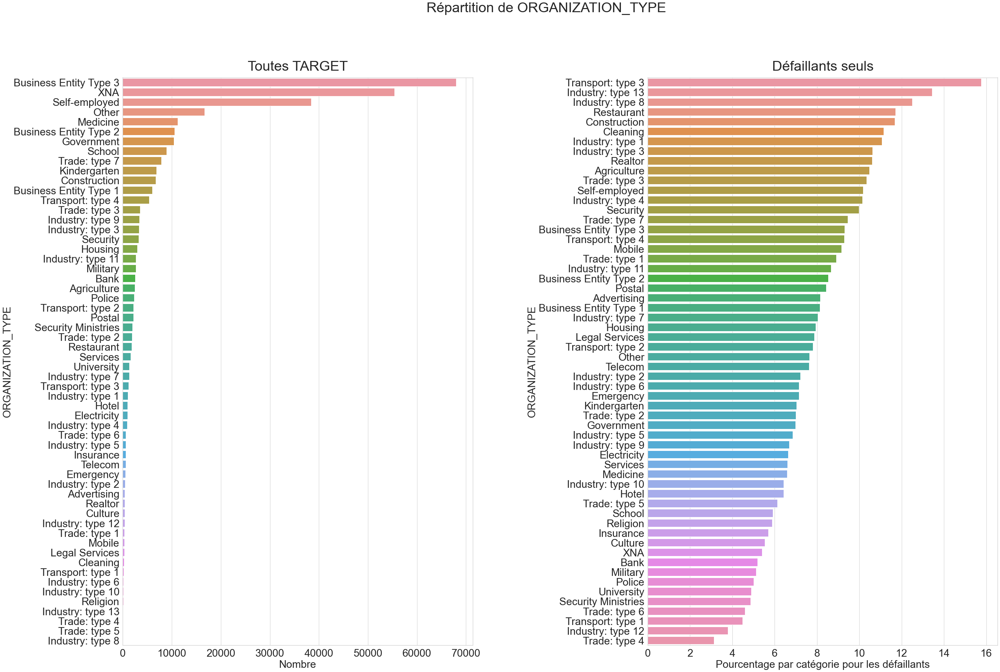

In [35]:
print(f"Nombre de catégories de la variable ORGANIZATION_TYPE = \
{len(application_train.ORGANIZATION_TYPE.unique())}")

plt.figure(figsize=(45, 30))
sns.set(style='whitegrid', font_scale=1.2)
plt.subplots_adjust(wspace=0.5)

plt.subplot(1, 2, 1)
count_organization = application_train.ORGANIZATION_TYPE.value_counts() \
    .sort_values(ascending=False)
sns.barplot(x=count_organization, y=count_organization.index)
plt.title('Toutes TARGET', pad=20, fontsize=40)
plt.xlabel('Nombre', fontsize=30)
plt.ylabel('ORGANIZATION_TYPE', fontsize=30)
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)

plt.subplot(1, 2, 2)
percentage_default_per_organization = \
    application_train[application_train.TARGET == 1].ORGANIZATION_TYPE. \
    value_counts() * 100 / count_organization
percentage_default_per_organization = \
    percentage_default_per_organization.dropna(). \
    sort_values(ascending=False)
sns.barplot(x=percentage_default_per_organization,
            y=percentage_default_per_organization.index)
plt.title('Défaillants seuls', pad=20, fontsize=40)
plt.xlabel('Pourcentage par catégorie pour les défaillants', fontsize=30)
plt.ylabel('ORGANIZATION_TYPE', fontsize=30)
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)

plt.suptitle(f'Répartition de ORGANIZATION_TYPE', fontsize=40)
plt.show()

*****
**Conclusion** :

Le demandeur appartient à un grand nombre de types d'organisations, `58` pour être précis. 

Les graphiques ci-dessus donnent les observations suivantes :

- **1**. Le premier graphique montre que la plupart des demandeurs travaillent dans des organisations de type "`entité commercialy Type3`", "`XNA`" ou "`Travailleurs indépendants`". Le type d'organisation "`XNA`" pourrait probablement désigner une organisation non classée en TYPE.


- **2**. Dans le deuxième graphique, nous remarquons que les candidats appartenant à "`Transport : type 3`" ont la plus forte tendance à la défaillance par rapport aux autres. Ils sont suivis par les organisations de type : "`Industrie : type 13`", "`Industrie : type 8`", "`Restaurant`", "`Construction`", ...


- Les organisations qui affichent les taux de défaillance les plus bas sont "`Commerce : type 4`", "`Industrie : type 12`", ...

Ces numéros de type pourraient également en dire plus sur l'organisation, cependant, nous n'avons pas d'informations à ce sujet, donc nous nous en tiendrons à la dénomination qui nous a été fournie.
*****

<span>**Variables `REG_CITY_NOT_LIVE_CITY` - `REG_CITY_NOT_WORK_CITY` - `LIVE_CITY_NOT_WORK_CITY`**</span>

- **`REG_CITY_NOT_LIVE_CITY`** et **`REG_CITY_NOT_WORK_CITY`** : ces variables comprennent des indicateurs informant si l'adresse permanente du demandeur correspond ou non à son adresse de contact pour la demande de prêt ou à son adresse professionnelle au niveau de la région.
    - **`1`** pour des **`adresses différentes`**;
    
    - **`0`** pour des **`adresses identiques`**.    
    
    
- **`LIVE_CITY_NOT_WORK_CITY`** : cette variable indique si l'adresse permanente du demandeur correspond ou non à son adresse de contact donnée pour la demande de prêt au niveau de la ville.
    - **`1`** pour des **`adresses différentes`**;
    
    - **`0`** pour des **`adresses identiques`**.    

Nombre de catégories uniques pour REG_CITY_NOT_LIVE_CITY = 2


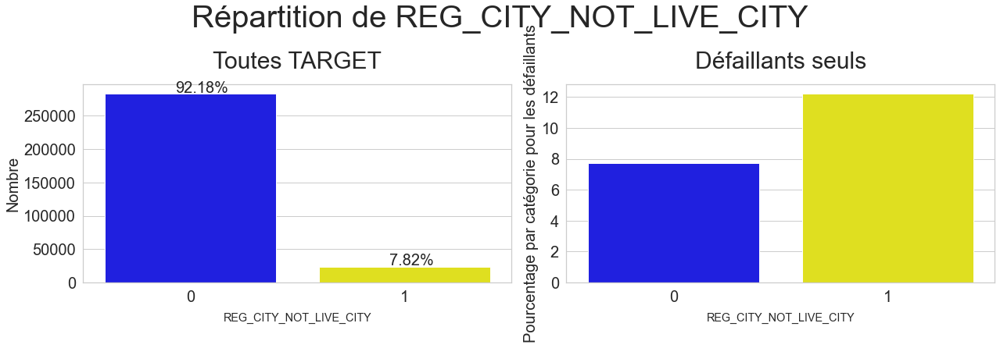

________________________________________________________________________________ 

Nombre de catégories uniques pour REG_CITY_NOT_WORK_CITY = 2


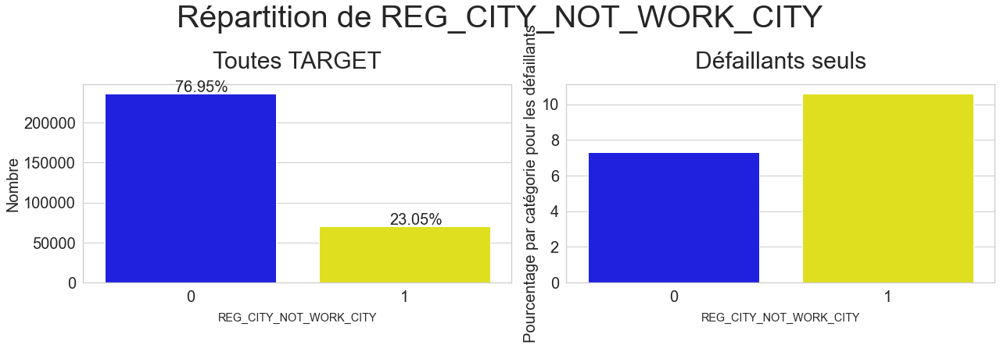

________________________________________________________________________________ 

Nombre de catégories uniques pour LIVE_CITY_NOT_WORK_CITY = 2


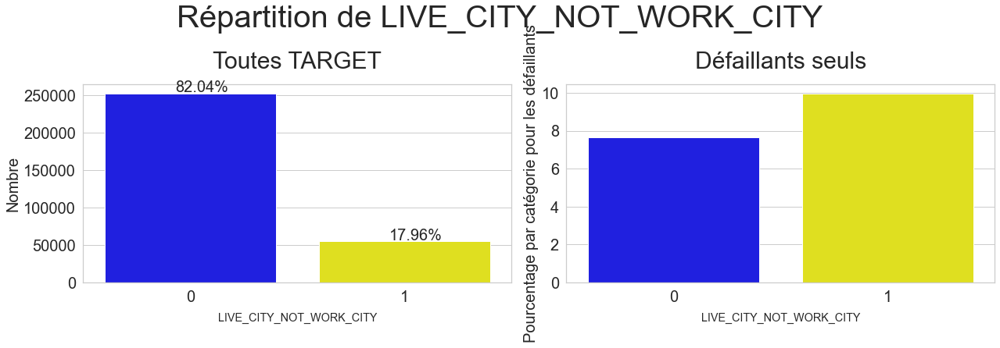

In [36]:
eda_kernel_fonctions.plot_categorical_variables_bar(
    application_train, column_name='REG_CITY_NOT_LIVE_CITY',
    figsize=(18, 6), horizontal_adjust=0.33, fontsize_percent=20,
    palette1=['Blue', 'yellow'], palette2=['Blue', 'yellow'])
print('_'*80, '\n')
eda_kernel_fonctions.plot_categorical_variables_bar(
    application_train, column_name='REG_CITY_NOT_WORK_CITY',
    figsize=(18, 6), horizontal_adjust=0.33, fontsize_percent=20,
    palette1=['Blue', 'yellow'], palette2=['Blue', 'yellow'])
print('_'*80, '\n')
eda_kernel_fonctions.plot_categorical_variables_bar(
    application_train, column_name='LIVE_CITY_NOT_WORK_CITY',
    figsize=(18, 6), horizontal_adjust=0.33, fontsize_percent=20,
    palette1=['Blue', 'yellow'], palette2=['Blue', 'yellow'])

*****
**Conclusion** :

Les trois graphiques ci-dessus permettent de tirer les conclusions suivantes :

- **1**. Parmi tous les demandeurs, il n'y a qu'une minorité de demandeurs dont les adresses ne correspondent pas.
    - Seulement `7,52%` des personnes ont une adresse permanente différente de leur adresse de contact au niveau régional.
    
    - Environ `23,05%` de personnes ont une adresse permanente différente de leur adresse professionnelle au niveau régional. Ce chiffre plus élevé s'explique par le fait qu'il est possible qu'elles travaillent dans une région différente de celle de leur adresse permanente.
    
    - Environ `17,96%` des personnes ont une adresse permanente différente de leur adresse de contact au niveau de la ville.
    
    
- **2**. Si nous examinons les caractéristiques de défaillance, nous constatons que la tendance à la défaillance est maximale chez les personnes dont l'adresse permanente et l'adresse de contact sont différentes au niveau de la région, suivie de l'adresse permanente et de l'adresse de travail différentes et enfin de l'adresse permanente et de l'adresse de contact différentes au niveau de la ville.

Dans tous les cas, on constate que la tendance au défaut de paiement des personnes ayant des adresses différentes est plus élevée que celle des personnes ayant la même adresse. Cela signifie que quelque part, cette différence d'adresse peut suggérer un risque de défaillance.
*****

<span>**Variable `NAME_HOUSING_TYPE`**</span>

Quelle est la situation du demandeur en matière de logement (location, logement chez les parents, ...) ?

_______________________________________________________________________________
Les catégories uniques de la variable 'NAME_HOUSING_TYPE' sont :
['House / apartment' 'Rented apartment' 'With parents'
 'Municipal apartment' 'Office apartment' 'Co-op apartment']
_______________________________________________________________________________
Répartition dans chaque catégorie :
House / apartment      272868
With parents            14840
Municipal apartment     11183
Rented apartment         4881
Office apartment         2617
Co-op apartment          1122
Name: NAME_HOUSING_TYPE, dtype: int64
_______________________________________________________________________________
Nombre de catégories uniques pour NAME_HOUSING_TYPE = 6


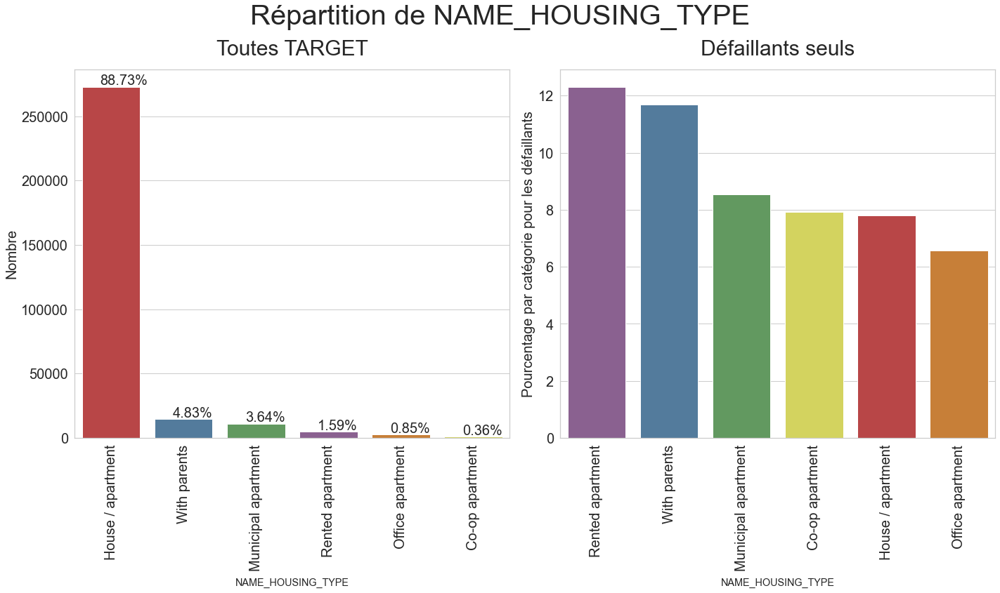

In [37]:
# Let us first see the unique categories of 'NAME_HOUSING_TYPE'
eda_kernel_fonctions. \
    print_unique_categories(application_train, 'NAME_HOUSING_TYPE',
                            show_counts=True)

# plotting the Bar Plot for the Column
eda_kernel_fonctions. \
    plot_categorical_variables_bar(application_train,
                                   column_name='NAME_HOUSING_TYPE',
                                   figsize=(20, 12),
                                   rotation=90, horizontal_adjust=0.25,
                                   fontsize_percent=20,
                                   palette1=['#cb3335', '#477ca8',
                                             '#59a257', '#905998',
                                             '#df7f20', '#e6e64c'],
                                   palette2=['#905998', '#477ca8',
                                             '#59a257', '#e6e64c',
                                             '#cb3335', '#df7f20'])

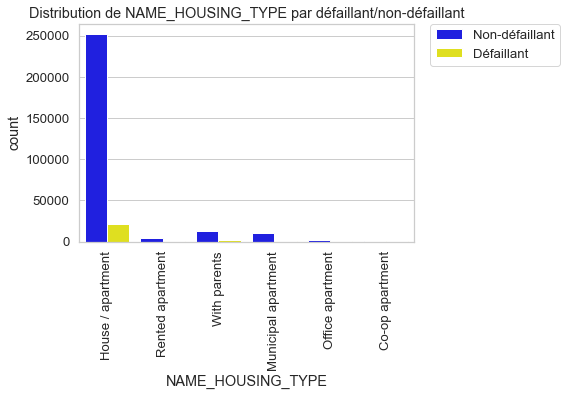

2:80: E501 line too long (98 > 79 characters)


In [38]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train, 'NAME_HOUSING_TYPE', rotation=90)

*****
**Conclusion** :

- Le premier graphique général montre que:
    - La majorité (`89%`) des demandeurs sont propriétaires d'une maison ou d'un appartement;
    
    - `5%` des demandeurs vivent chez leurs parents;
    
    - Les autres `5%` concernent les appartements de location, municipaux ou les co-locations.
    
- Le second graphique, qui effectue un zoom sur les défaillants, montre que les personnes qui ont le taux de défaillance le plus élevé, font partie des `5` restant du graphique général : la majorité loue un appartement ou habitent chez leurs parents mais ne sont pas propriétaire.

La situation du logement du demandeur pourra donc avoir une influence sur la défaillance potentielle du demandeur.
*****

<span>**Variable `NAME_FAMILY_STATUS`**</span>

Cette variable indique la Situation familiale du demandeur (Célibataire, marié, pacsé, séparé, divorcé, veuf, ...).

_______________________________________________________________________________
Les catégories uniques de la variable 'NAME_FAMILY_STATUS' sont :
['Single / not married' 'Married' 'Civil marriage' 'Widow' 'Separated'
 'Unknown']
_______________________________________________________________________________
Répartition dans chaque catégorie :
Married                 196432
Single / not married     45444
Civil marriage           29775
Separated                19770
Widow                    16088
Unknown                      2
Name: NAME_FAMILY_STATUS, dtype: int64
_______________________________________________________________________________
Nombre de catégories uniques pour NAME_FAMILY_STATUS = 6


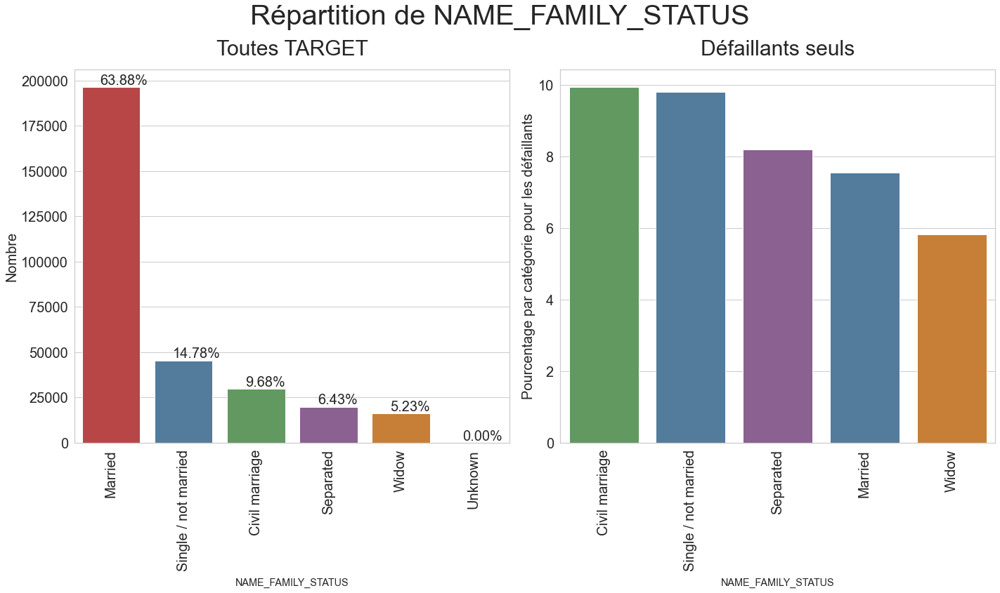

3:80: E501 line too long (86 > 79 characters)
7:80: E501 line too long (105 > 79 characters)


In [39]:
# Voyons d'abord les catégories uniques de 'NAME_FAMILY_STATUS'
eda_kernel_fonctions. \
    print_unique_categories(application_train, 'NAME_FAMILY_STATUS', show_counts=True)

# traçage du graphique à barres pour la colonne
eda_kernel_fonctions. \
    plot_categorical_variables_bar(application_train, column_name='NAME_FAMILY_STATUS', figsize=(20, 12),
                                   rotation=90, horizontal_adjust=0.25,
                                   fontsize_percent=20,
                                   palette1=['#cb3335', '#477ca8',
                                             '#59a257', '#905998',
                                             '#df7f20', '#e6e64c'],
                                   palette2=['#59a257', '#477ca8',
                                             '#905998', '#477ca8',
                                             '#df7f20'])

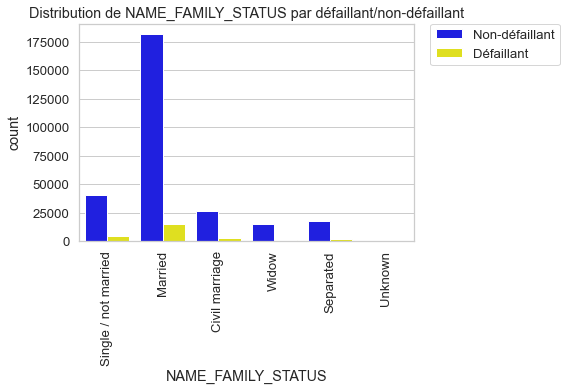

2:80: E501 line too long (99 > 79 characters)


In [40]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train, 'NAME_FAMILY_STATUS', rotation=90)

*****
**Conclusion** :

- Le premier graphique général montre que :
    - la majorité (`74%`) des demandeurs sont mariés (`64% mariés religieusement, 10% mariés civilement`);
    
    - près de `15%` des demandeurs sont célibataires;
    
    - le reste est réparti entre les séparés et les veufs (`6.5%`).
    
- Concernant les défaillants seuls, la règle du graphique général n'est pas respecté. Les demandeurs ayant les taux de défaillance le plus élevé sont mariés civilement ou célibataires (`autour de 10%`), puis suivent les séparés (`8%`), les mariés (`7.5%`) et les veufs (`6%`).

La situation familiale du demandeur pourra donc avoir une influence sur la défaillance du demandeur.
*****

<span>**Variable `NAME_INCOME_TYPE`**</span>

Cette variable représente le type des revenus des demandeurs (homme d'affaires, travailleur, congé maternité, ...)

_______________________________________________________________________________
Les catégories uniques de la variable 'NAME_INCOME_TYPE' sont :
['Working' 'State servant' 'Commercial associate' 'Pensioner' 'Unemployed'
 'Student' 'Businessman' 'Maternity leave']
_______________________________________________________________________________
Répartition dans chaque catégorie :
Working                 158774
Commercial associate     71617
Pensioner                55362
State servant            21703
Unemployed                  22
Student                     18
Businessman                 10
Maternity leave              5
Name: NAME_INCOME_TYPE, dtype: int64
_______________________________________________________________________________
Nombre de catégories uniques pour NAME_INCOME_TYPE = 8


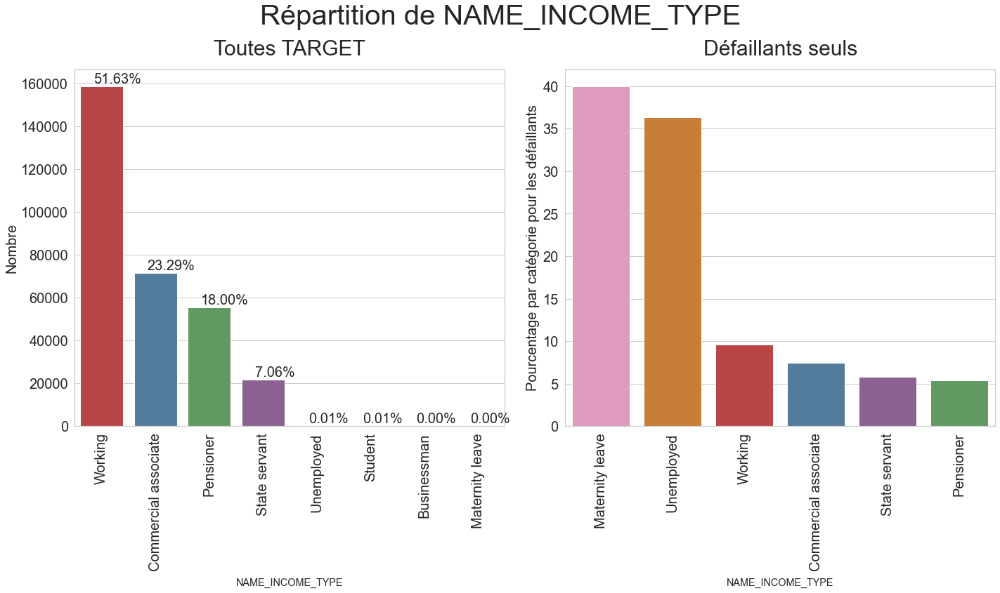

3:80: E501 line too long (84 > 79 characters)
7:80: E501 line too long (103 > 79 characters)


In [41]:
# Voyons d'abord les catégories uniques de 'NAME_INCOME_TYPE'
eda_kernel_fonctions. \
    print_unique_categories(application_train, 'NAME_INCOME_TYPE', show_counts=True)

# traçage du graphique à barres pour la colonne
eda_kernel_fonctions. \
    plot_categorical_variables_bar(application_train, column_name='NAME_INCOME_TYPE', figsize=(20, 12),
                                   rotation=90, horizontal_adjust=0.25,
                                   fontsize_percent=20,
                                   palette1=['#cb3335', '#477ca8',
                                             '#59a257', '#905998',
                                             '#df7f20', '#e6e64c',
                                             '#965a38', '#e890be'],
                                   palette2=['#e890be', '#df7f20',
                                             '#cb3335', '#477ca8',
                                             '#905998', '#59a257'])

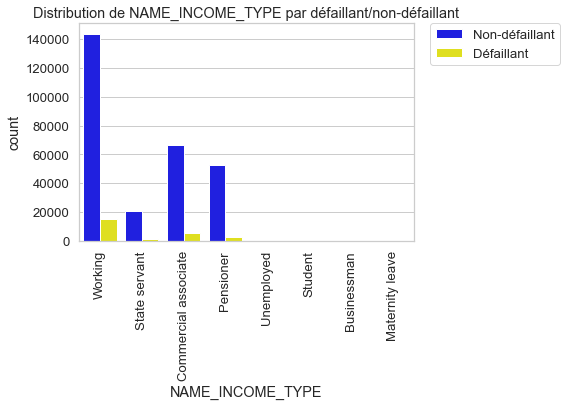

2:80: E501 line too long (97 > 79 characters)


In [42]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train, 'NAME_INCOME_TYPE', rotation=90)

*****
**Conclusion** :

- Le premier graphique général montre que :
    - la majorité des demandeurs sont des travailleurs (`52%`);
    
    - puis `23%` de commerciaux, `18%` de retraités et `7%` des vendeurs;
    
    - très peu de type de revenus passifs : non salariés, étudiants, hommes d'affaires et en congés de maternité : autour de `0%`.
    
- Concernant les défaillants, les pourcentages du graphique général ne sont pas respectés :
    - la majorité des demandeurs ayant le taux de défaillance le plus élevé sont les catégories les plus rares du graphique général : les congés de maternité et les non salariés (`près de 40%`);
    
    - puis seulement `10%` de la classe majoritaire des travailleurs;
    
    - `5%` de la classe des commerciaux;
    
    - Seulement `5% des 7%` des retraités ne remboursent pas leurs dettes.

Le type de revenu du demandeur pourra donc avoir une influence sur la défaillance du demandeur.
*****

<span>**Variable `NAME_TYPE_SUITE`**</span>

Qui accompagnait le demandeur lorsqu'il a demandé le prêt ?

_______________________________________________________________________________
Les catégories uniques de la variable 'NAME_TYPE_SUITE' sont :
['Unaccompanied' 'Family' 'Spouse, partner' 'Children' 'Other_A' nan
 'Other_B' 'Group of people']
_______________________________________________________________________________
Répartition dans chaque catégorie :
Unaccompanied      248526
Family              40149
Spouse, partner     11370
Children             3267
Other_B              1770
Other_A               866
Group of people       271
Name: NAME_TYPE_SUITE, dtype: int64
_______________________________________________________________________________
Nombre de catégories uniques pour NAME_TYPE_SUITE = 8


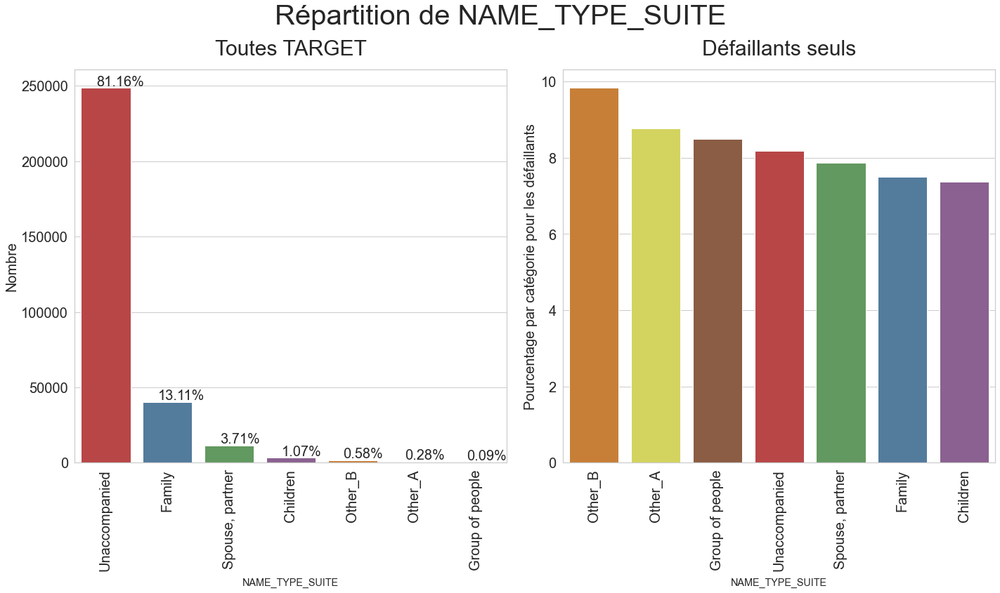

3:80: E501 line too long (83 > 79 characters)
7:80: E501 line too long (102 > 79 characters)


In [43]:
# Voyons d'abord les catégories uniques de 'NAME_TYPE_SUITE'
eda_kernel_fonctions. \
    print_unique_categories(application_train, 'NAME_TYPE_SUITE', show_counts=True)

# Traçage du graphique à barres pour la colonne
eda_kernel_fonctions. \
    plot_categorical_variables_bar(application_train, column_name='NAME_TYPE_SUITE', figsize=(20, 12),
                                   rotation=90, horizontal_adjust=0.25,
                                   fontsize_percent=20,
                                   palette1=['#cb3335', '#477ca8',
                                             '#59a257', '#905998',
                                             '#df7f20', '#e6e64c',
                                             '#965a38'],
                                   palette2=['#df7f20', '#e6e64c',
                                             '#965a38', '#cb3335',
                                             '#59a257', '#477ca8',
                                             '#905998'])

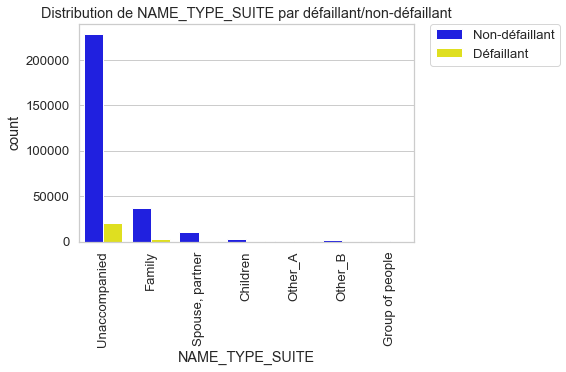

2:80: E501 line too long (96 > 79 characters)


In [44]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train, 'NAME_TYPE_SUITE', rotation=90)

*****
**Conclusion** :

- Le premier graphique général montre que :
    - La majorité des demandeurs n'ont pas été accompagnés lors du rendez-vous pour la demande de prêt (`81%`);
    
    - `13%` ont été accompagnés par leur famille;
    
    - `4%` ont été accompagnés par leur épouse ou conjoint;
    
    - Très peu ont été accompagnés par un enfant (`1%`), ou d'autres personnes (`<0.6%` et `0.3%` mais comment différencier `Other_B` de `Other_A`? pas précisé dans la documentation).
    
- Concernant les défaillants, les pourcentages du graphique général ne sont pas respectés :
    - les 3 catégories les plus défaillantes sont les 3 catégories représentant moins de `0.6%` et `0.3%` sur le graphique général :
        - `10%` des défaillants ont été accompagnés par les autres personnes `Other_B` qui ne représentent que `0.6%` des classes du graphique général;
        
        - `8.5%` des autres personnes `Other_A`;
        
        - `8%` par un groupe de personnes.

L'accompagnateur du demandeur lors du rendez-vous de la demande de prêt pourra donc avoir une influence sur la défaillance du demandeur.
*****

<span>**Variable `FLAG_CONT_MOBILE`**</span>

Le téléphone portable était-il joignable ? :
- **`1`** : `OUI`;

- **`0`** : `NON`.

Nombre de catégories uniques pour FLAG_CONT_MOBILE = 2


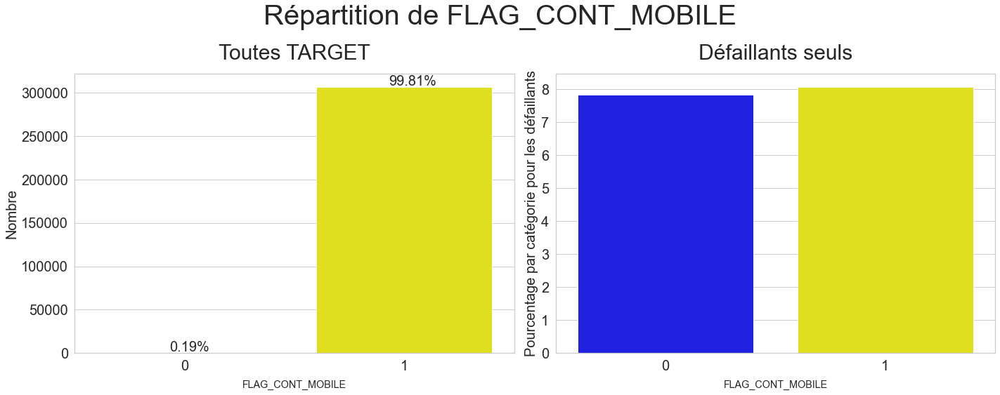

1:80: E501 line too long (102 > 79 characters)
2:5: E128 continuation line under-indented for visual indent


In [45]:
eda_kernel_fonctions.plot_categorical_variables_bar(application_train, column_name='FLAG_CONT_MOBILE',
    figsize=(20, 8), horizontal_adjust=0.33, fontsize_percent=20,
    palette1=['blue', 'yellow'], palette2=['blue', 'yellow'])

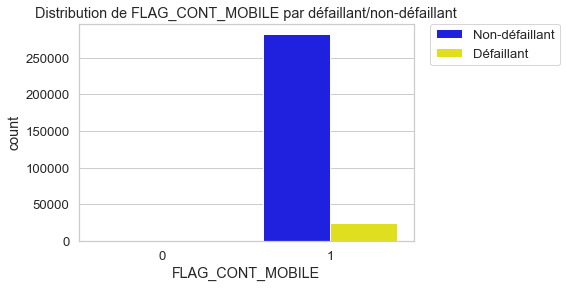

2:80: E501 line too long (84 > 79 characters)


In [46]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train, 'FLAG_CONT_MOBILE')

*****
**Conclusion** :

- sur l'ensemble des demandeurs, le téléphone portable est joignable à `99,8%` mais pour les défaillants le pourcentage passe à `50%`.

Cette variable pourra être utile pour départager les défaillants des non-défaillants sur la joignabilité du téléphone portable.
*****

<span>**Distribution des variables quantitatives**</span>

In [47]:
# Liste des variables quantitatives
cols_num = \
    application_train.select_dtypes(include=[np.number]).columns.to_list()
cols_num

['SK_ID_CURR',
 'TARGET',
 'CNT_CHILDREN',
 'AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY',
 'AMT_GOODS_PRICE',
 'REGION_POPULATION_RELATIVE',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH',
 'OWN_CAR_AGE',
 'FLAG_MOBIL',
 'FLAG_EMP_PHONE',
 'FLAG_WORK_PHONE',
 'FLAG_CONT_MOBILE',
 'FLAG_PHONE',
 'FLAG_EMAIL',
 'CNT_FAM_MEMBERS',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'HOUR_APPR_PROCESS_START',
 'REG_REGION_NOT_LIVE_REGION',
 'REG_REGION_NOT_WORK_REGION',
 'LIVE_REGION_NOT_WORK_REGION',
 'REG_CITY_NOT_LIVE_CITY',
 'REG_CITY_NOT_WORK_CITY',
 'LIVE_CITY_NOT_WORK_CITY',
 'EXT_SOURCE_1',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'APARTMENTS_AVG',
 'BASEMENTAREA_AVG',
 'YEARS_BEGINEXPLUATATION_AVG',
 'YEARS_BUILD_AVG',
 'COMMONAREA_AVG',
 'ELEVATORS_AVG',
 'ENTRANCES_AVG',
 'FLOORSMAX_AVG',
 'FLOORSMIN_AVG',
 'LANDAREA_AVG',
 'LIVINGAPARTMENTS_AVG',
 'LIVINGAREA_AVG',
 'NONLIVINGAPARTMENTS_AVG',
 'NONLIVINGAREA_AVG',
 'APARTMENTS_MODE',
 'BASEMENTAR

<span>**Variable `DAYS_BIRTH`**</span>

- Âge du demandeur en jours au moment de la demande.
- Pour l'ensemble de données donné, l'âge est indiqué en jours, ce qui peut être plus difficile à interpréter. 
- Nous allons donc créer une variable latente pour stocker les âges en années, ce qui sera plus facile à analyser et à interpréter.

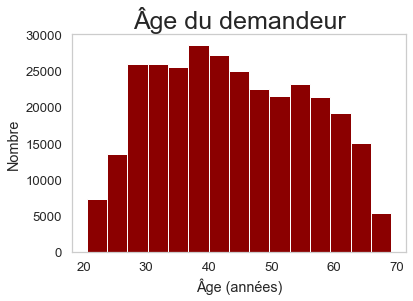

In [219]:
plt.hist(application_train['DAYS_BIRTH']*-1/365, color='darkred', bins=15)
plt.title('Âge du demandeur', size=25)
plt.xlabel('Âge (années)')
plt.ylabel('Nombre')
plt.grid(False)
plt.show()

In [49]:
# Transformer l'âge en années à partir du nombre de jours
application_train['AGE_YEARS'] = \
    application_train['DAYS_BIRTH'] * -1 / 365

_______________________________________________________________________________
Percentile de la variable AGE_YEARS
Percentile 0 = 20.517808219178082
Percentile 25 = 34.00821917808219
Percentile 50 = 43.15068493150685
Percentile 75 = 53.92328767123288
Percentile 90 = 60.76986301369863
Percentile 92 = 61.87397260273973
Percentile 94 = 62.99452054794521
Percentile 96 = 64.1945205479452
Percentile 98 = 65.6027397260274
Percentile 100 = 69.12054794520547
_______________________________________________________________________________


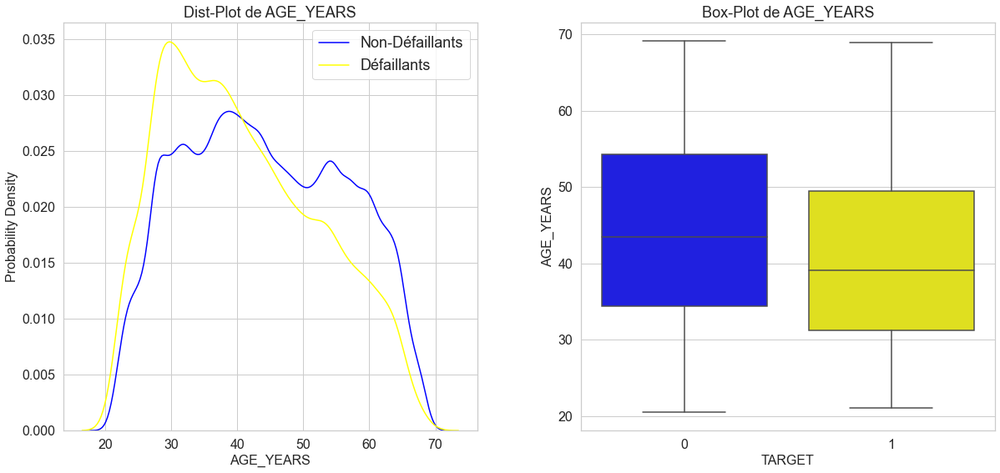

5:80: E501 line too long (105 > 79 characters)


In [50]:
# Affiche les quantiles
eda_kernel_fonctions.print_percentiles(application_train, 'AGE_YEARS')

# Affiche boxplot, distplot pour l'âge
eda_kernel_fonctions.plot_continuous_variables(application_train, 'AGE_YEARS', plots=['distplot', 'box'])

# Suppression de la variable nouvellement ajoutée
_ = application_train.pop('AGE_YEARS')

*****
**Conclusion**

Les deux graphiques ci-dessus nous permettent de tirer quelques renseignements importants.

- Dans le distplot, nous pouvons observer le pic d'âge des défaillants se rapproche de `30 ans`. De plus, à ce stade, les personnes qui ne sont pas en défaut de paiement ont un PDF assez faible. Une autre chose à noter est que la PDF de l'âge des défaillants commence un peu à gauche de celle des non défaillants, et qu'elle est également un peu plus étirée sur tous les âges. Cela signifie que les défaillants sont généralement plus jeunes que les non-défaillants.


- Le box-plot nous permet également de mieux visualiser la même chose. L'âge des défaillants est généralement inférieur à celui des non-défaillants. Tous les quantiles d'âge des défaillants sont inférieurs à ceux des non-défaillants. La valeur du 75e percentile des non-défaillants est d'environ `54 ans`, tandis que celle des défaillants est proche de `49 ans`.

Ces observations impliquent que les défaillants sont généralement plus jeunes que les non-défaillants.
*****

<span>**Variable `DAYS_EMPLOYED`**</span>

- Cette variable indique le nombre de jours depuis le jour de la demande où le demandeur a été employé.
- Pour faciliter l'interprétation, nous allons convertir les jours en années.

_______________________________________________________________________________
Percentile de la variable DAYS_EMPLOYED
Percentile 0 = -17912.0
Percentile 25 = -2760.0
Percentile 50 = -1213.0
Percentile 75 = -289.0
Percentile 90 = 365243.0
Percentile 92 = 365243.0
Percentile 94 = 365243.0
Percentile 96 = 365243.0
Percentile 98 = 365243.0
Percentile 100 = 365243.0
_______________________________________________________________________________
_______________________________________________________________________________
Percentile de la variable YEARS_EMPLOYED
Percentile 0 = -1000.6657534246575
Percentile 25 = 0.7917808219178082
Percentile 50 = 3.3232876712328765
Percentile 75 = 7.561643835616438
Percentile 90 = 13.372602739726027
Percentile 92 = 14.726027397260275
Percentile 94 = 16.958904109589042
Percentile 96 = 20.134246575342466
Percentile 98 = 25.15068493150685
Percentile 100 = 49.07397260273972
_______________________________________________________________________________


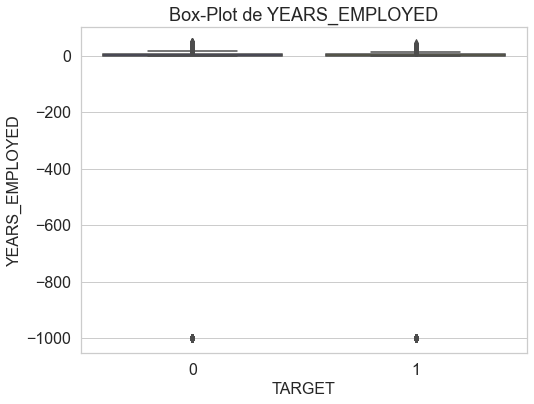

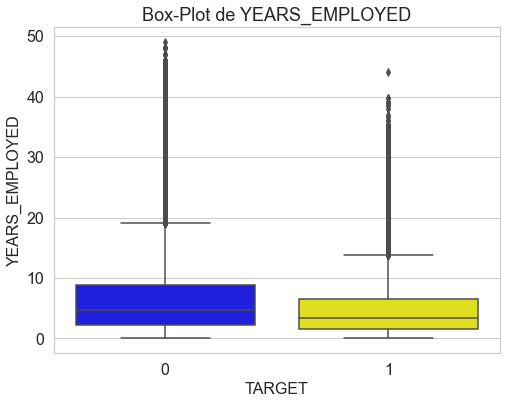

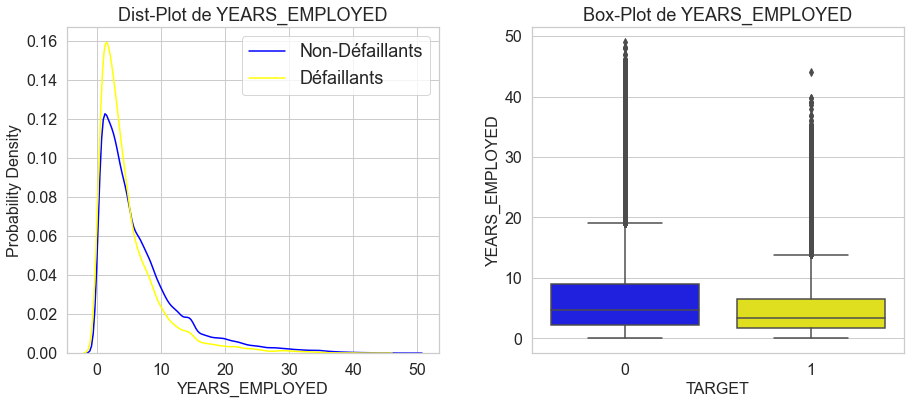

10:80: E501 line too long (114 > 79 characters)
11:80: E501 line too long (120 > 79 characters)
12:80: E501 line too long (122 > 79 characters)
12:108: E127 continuation line over-indented for visual indent
13:80: E501 line too long (110 > 79 characters)
14:80: E501 line too long (121 > 79 characters)
14:84: E127 continuation line over-indented for visual indent


In [51]:
# Transformer en années à partir du nombre de jours
application_train['YEARS_EMPLOYED'] = \
    application_train['DAYS_EMPLOYED'] * -1 / 365

# Affiche les quantiles
eda_kernel_fonctions.print_percentiles(application_train, 'DAYS_EMPLOYED')
eda_kernel_fonctions.print_percentiles(application_train, 'YEARS_EMPLOYED')

# Affiche boxplot
eda_kernel_fonctions.plot_continuous_variables(application_train, 'YEARS_EMPLOYED', plots=['box'], figsize=(8, 6))
eda_kernel_fonctions.plot_continuous_variables(application_train, 'YEARS_EMPLOYED', plots=['box'], scale_limits=[0, 70],
                                                                                                           figsize=(8, 6))
eda_kernel_fonctions.plot_continuous_variables(application_train, 'YEARS_EMPLOYED', plots=['distplot', 'box'],
                                                                                   scale_limits=[0, 70], figsize=(15, 6))
# Suppression de la variable nouvellement ajoutée
_ = application_train.pop('YEARS_EMPLOYED')

*****
**Conclusion** :

- Nous voyons que la colonne `DAYS_EMPLOYED` contient quelques points de données erronés avec les valeurs `365243`. Cela semble être des valeurs erronées/non sensorielles.

- Sur le boxplot, nous observons que les défaillants semblent avoir moins d'années d'emploi que les non-défaillants. Tous les quantiles `25`, `50` et `75` des défaillants sont inférieurs à ceux des non-défaillants.
*****

<span>**Variable `DAYS_REGISTRATION`**</span>

Cette variable indique depuis combien de jours le demandeur a effectué une modification sur le formulaire informatique enregistré sur la demande.

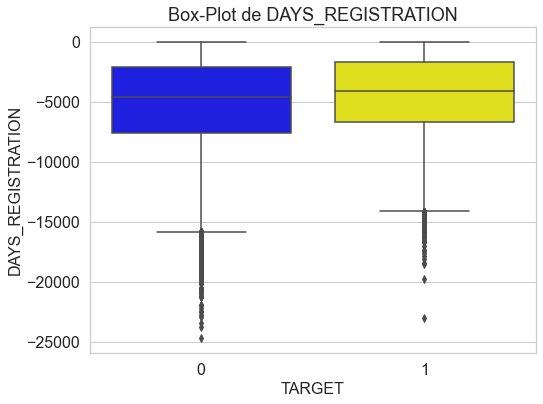

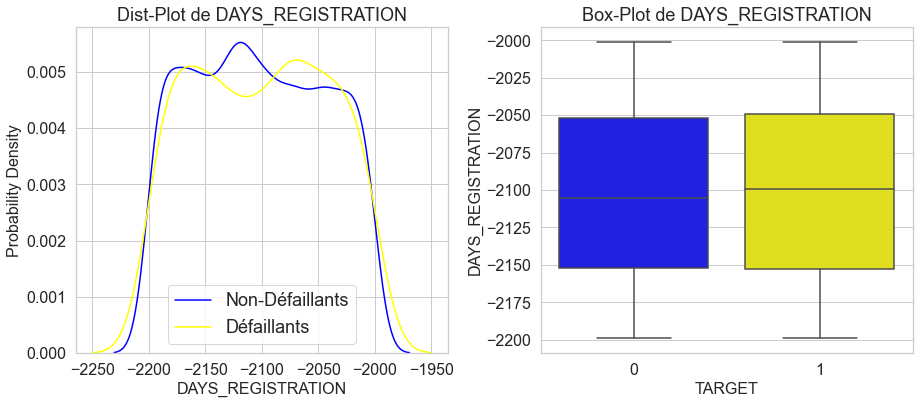

1:80: E501 line too long (117 > 79 characters)
3:80: E501 line too long (113 > 79 characters)
4:76: E127 continuation line over-indented for visual indent
4:80: E501 line too long (120 > 79 characters)


In [52]:
eda_kernel_fonctions.plot_continuous_variables(application_train, 'DAYS_REGISTRATION', plots=['box'], figsize=(8, 6))

eda_kernel_fonctions.plot_continuous_variables(application_train, 'DAYS_REGISTRATION', plots=['distplot', 'box'],
                                                                           scale_limits=[-2200, -2000], figsize=(15, 6))

*****
**Conclusion** :

- Le boxplot montre que le nombre de jours écoulés depuis le dernier enregistrement de modification de la demande des défaillants est généralement inférieur.

- Les non-défaillants affichent un nombre de jours plus élevé pour tous les quantiles depuis qu'ils ont changé leur document d'identité.
*****

<span>**Variable `DAYS_ID_PUBLISH`**</span>

Cette variable indique depuis combien de jours, à partir du jour de l'enregistrement, le demandeur a changé le document d'identité avec lequel il a demandé le prêt.

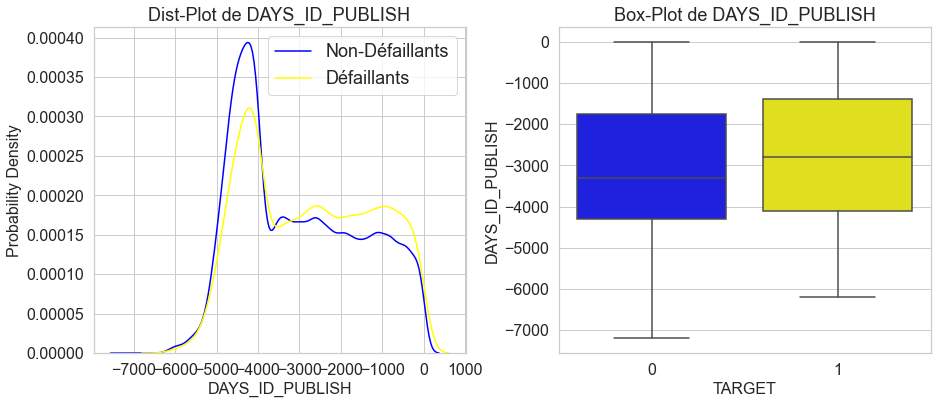

1:80: E501 line too long (111 > 79 characters)
2:80: E501 line too long (120 > 79 characters)
2:105: E127 continuation line over-indented for visual indent


In [53]:
eda_kernel_fonctions.plot_continuous_variables(application_train, 'DAYS_ID_PUBLISH', plots=['distplot', 'box'],
                                                                                                        figsize=(15, 6))

*****
**Conclusion** :

- Le boxplot montre une tendance similaire à celle de `DAYS_REGISTRATION`, où le nombre de jours écoulés depuis le changement d'identité des défaillants est généralement inférieur.

- Les non-défaillants affichent un nombre de jours plus élevé de dernier enregistrement de la demande pour tous les quantiles.
*****

<span>**Variables: `EXT_SOURCES_1`, `EXT_SOURCES_2`, `EXT_SOURCES_3`**</span>

- Il existe trois colonnes `EXT_SOURCES`, qui contiennent des valeurs comprises entre `0` et `1`. 

- Il s'agit de scores normalisés provenant de différentes sources pour lesquels nous n'avons pas plus d'information.

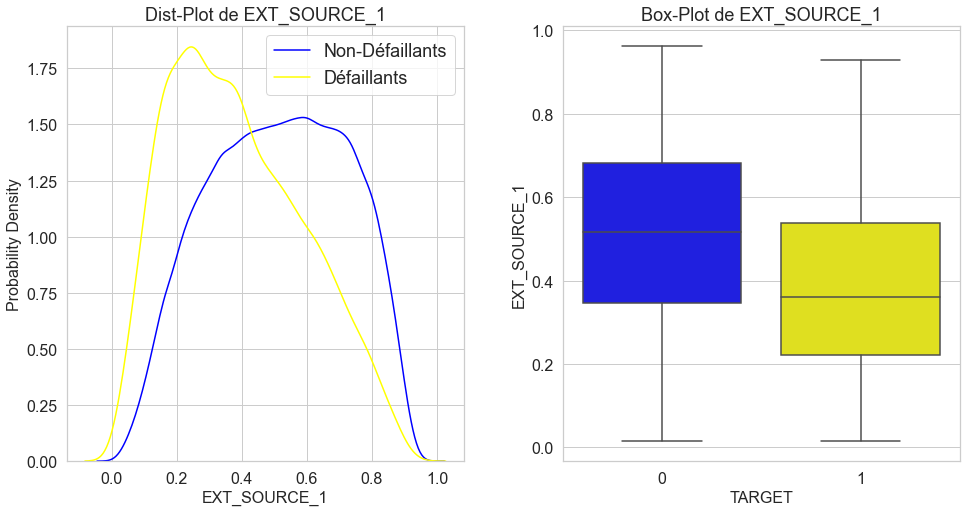

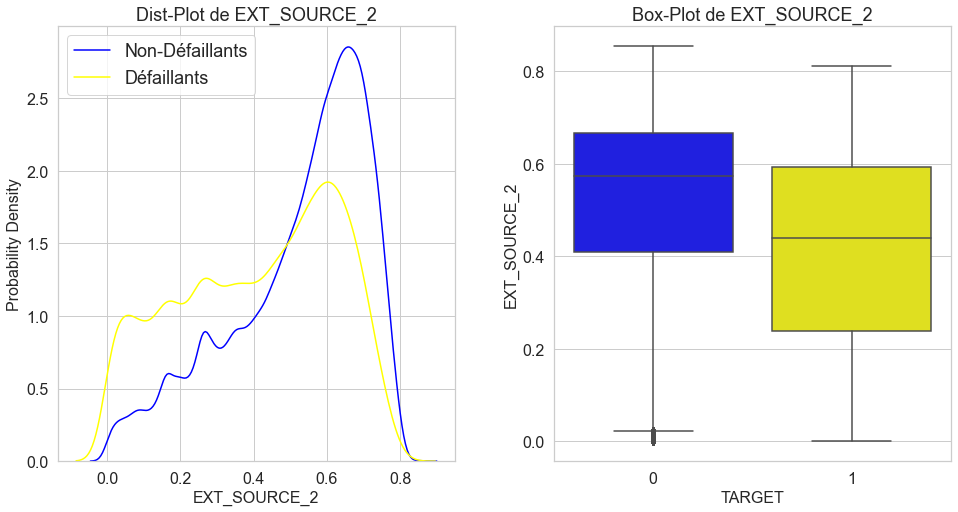

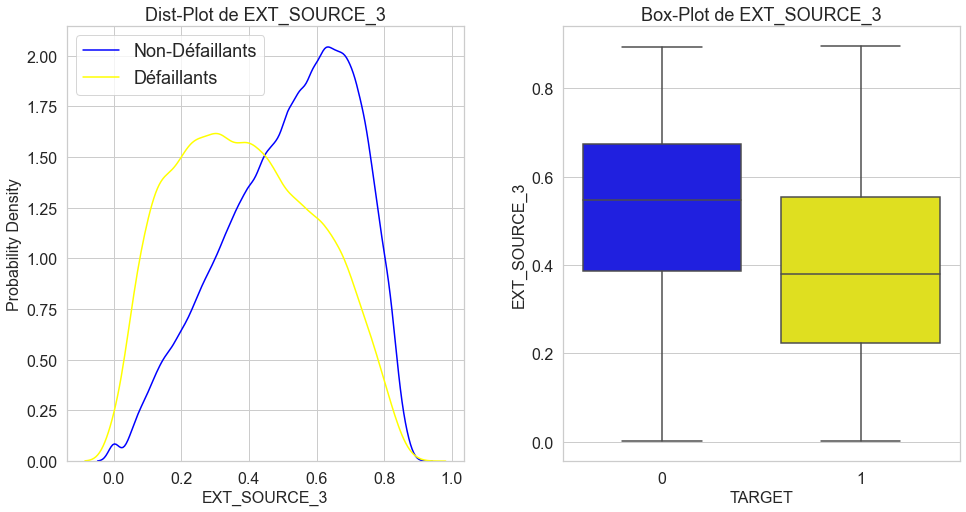

2:80: E501 line too long (108 > 79 characters)
2:109: W291 trailing whitespace
3:80: E501 line too long (120 > 79 characters)
3:105: E127 continuation line over-indented for visual indent
5:80: E501 line too long (108 > 79 characters)
6:80: E501 line too long (120 > 79 characters)
6:105: E127 continuation line over-indented for visual indent
8:80: E501 line too long (108 > 79 characters)
9:80: E501 line too long (120 > 79 characters)
9:105: E127 continuation line over-indented for visual indent


In [54]:
# Distplot et boxplot de EXT_SOURCE_1
eda_kernel_fonctions.plot_continuous_variables(application_train, 'EXT_SOURCE_1', plots=['distplot', 'box'], 
                                                                                                        figsize=(16, 8))
# Distplot et boxplot de EXT_SOURCE_2
eda_kernel_fonctions.plot_continuous_variables(application_train, 'EXT_SOURCE_2', plots=['distplot', 'box'],
                                                                                                        figsize=(16, 8))
# Distplot et boxplot de EXT_SOURCE_3
eda_kernel_fonctions.plot_continuous_variables(application_train, 'EXT_SOURCE_3', plots=['distplot', 'box'],
                                                                                                        figsize=(16, 8))

*****
**Conclusion** :

À partir des trois graphiques ci-dessus, nous pouvons tirer les conclusions suivantes :

- Si nous examinons les box-plots, nous pouvons clairement voir une tendance similaire pour les trois colonnes `EXT_SOURCE`, à savoir que les valeurs des défaillants ont tendance à avoir des valeurs considérablement plus basses que les non-défaillants.

- Cette tendance peut également être observée avec les PDF. Les non-défaillants montrent un pic plus élevé pour les valeurs élevées de `EXT_SOURCE`, et les densités de probabilité sont très faibles pour les valeurs faibles. Cela implique que les non-défaillants ont généralement des valeurs élevées pour ces scores.

- Il est intéressant de noter que la valeur médiane des défaillants est presque égale ou inférieure aux valeurs du 25ème percentile des non-défaillants.

- Les variables `EXT_SOURCE_1` et `EXT_SOURCE_3` tendent à montrer une meilleure discrimination/séparabilité par rapport à la variable `EXT_SOURCE_2`.

Ces 3 variables semblent être les meilleurs pour séparer linéairement les défaillants et les non-défaillants parmi toutes les variables utilisées jusqu'à présent.
*****

<span>**Variable `FLOORSMAX_AVG`**</span>

Cette variable décrit les scores normalisés de la moyenne du nombre maximum d'étages dans le bâtiment du demandeur.

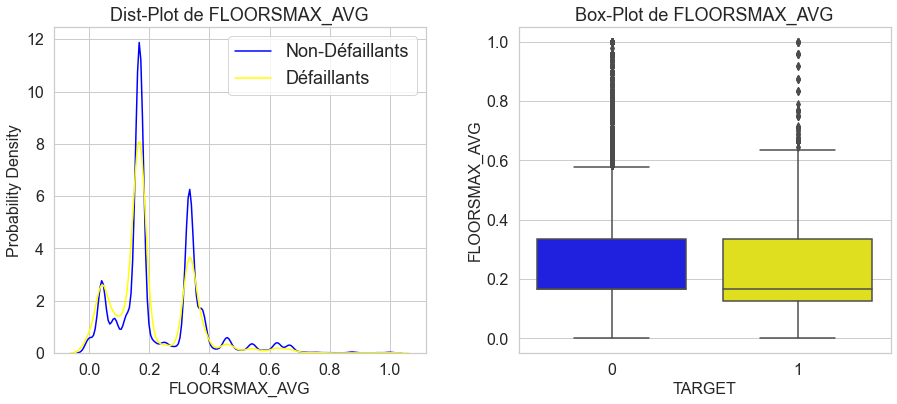

2:80: E501 line too long (109 > 79 characters)
3:80: E501 line too long (120 > 79 characters)
3:105: E127 continuation line over-indented for visual indent


In [55]:
# Boxplot de FLOORSMAX_AVG
eda_kernel_fonctions.plot_continuous_variables(application_train, 'FLOORSMAX_AVG', plots=['distplot', 'box'],
                                                                                                        figsize=(15, 6))

*****
**Conclusion**:

- Le boxplot montre que les défaillants ont une valeur médiane de la caractéristique `FLOORSMAX_AVG` inférieure à celle des non-défaillants.

- Les valeurs du 75e percentile des défaillants et des non-défaillants sont plus ou moins les mêmes, mais la valeur du 25e percentile des non-défaillants est presque supérieure à la médiane des défaillants.

Cette variable pourrait être une variable importante pour départager les défaillants des non-défaillants.
*****

<span>**Variable `FLOORSMAX_MEDI`**</span>

Cette variable décrit les scores normalisés de la médiane du nombre maximum d'étages dans le bâtiment du demandeur.

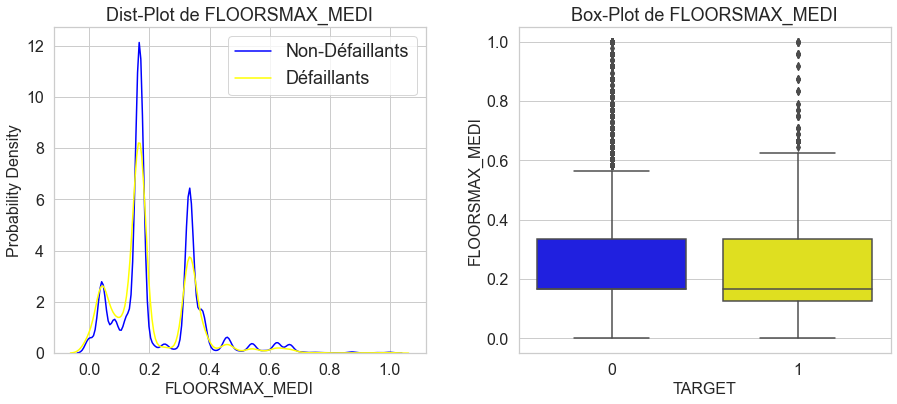

2:80: E501 line too long (110 > 79 characters)
3:80: E501 line too long (120 > 79 characters)
3:105: E127 continuation line over-indented for visual indent


In [56]:
# Boxplot de FLOORSMAX_MEDI
eda_kernel_fonctions.plot_continuous_variables(application_train, 'FLOORSMAX_MEDI', plots=['distplot', 'box'],
                                                                                                        figsize=(15, 6))

*****
**Conclusion**:

- Le boxplot montre que les défaillants ont une valeur médiane de la caractéristique `FLOORSMAX_MEDI` inférieure à celle des non-défaillants.

- Les valeurs du 75e percentile des défaillants et des non-défaillants sont plus ou moins les mêmes, mais la valeur du 25e percentile des non-défaillants est presque supérieure à la médiane des défaillants.

Cette variable pourrait être une variable importante pour départager les défaillants des non-défaillants.
*****

<span>**Variable `FLOORSMAX_MODE`**</span>

Cette variable décrit les scores normalisés de mode du nombre maximum d'étages dans le bâtiment du demandeur

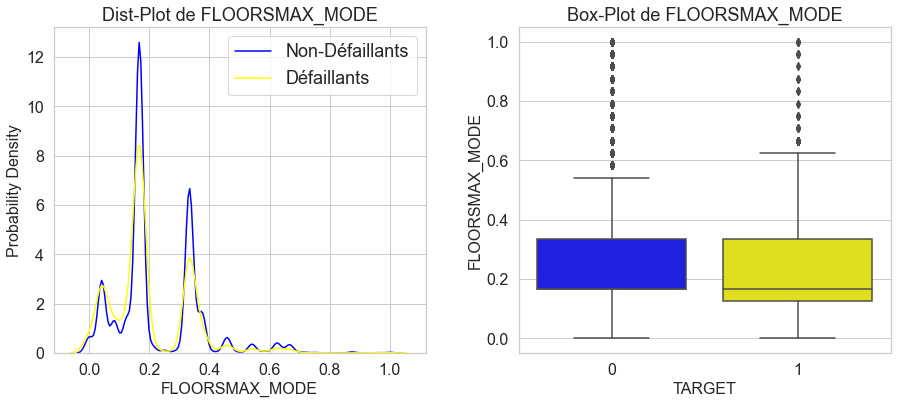

2:80: E501 line too long (110 > 79 characters)
3:80: E501 line too long (120 > 79 characters)
3:105: E127 continuation line over-indented for visual indent


In [57]:
# Boxplot de FLOORSMAX_MODE
eda_kernel_fonctions.plot_continuous_variables(application_train, 'FLOORSMAX_MODE', plots=['distplot', 'box'],
                                                                                                        figsize=(15, 6))

*****
**Conclusion**:

- Le boxplot montre que les défaillants ont une valeur médiane de la variable `FLOORSMAX_MODE` inférieure à celle des non-défaillants.

- Les valeurs du 75e percentile des défaillants et des non-défaillants sont plus ou moins les mêmes, mais la valeur du 25e percentile des non-défaillants est presque supérieure à la médiane des défaillants.

Cette variable pourrait être une variable importante pour départager les défaillants des non-défaillants.
*****

<span>**Variable `FLOORSMIN_MODE`**</span>

Cette variable décrit les scores normalisés du mode du nombre minimum d'étages dans le bâtiment du demandeur.

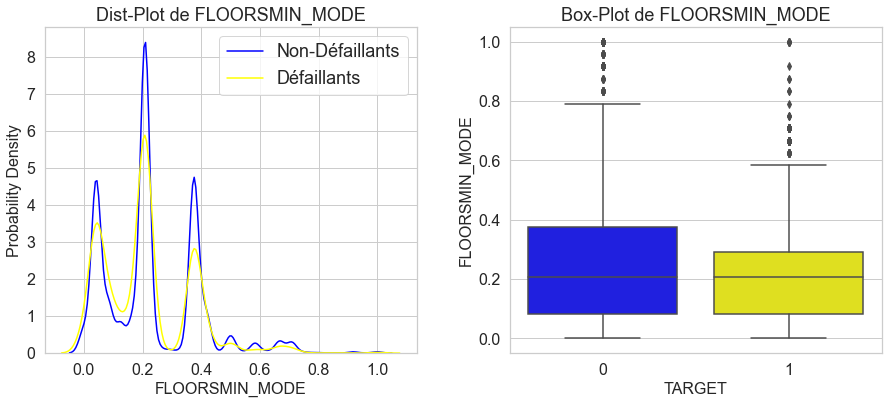

2:80: E501 line too long (110 > 79 characters)
3:80: E501 line too long (120 > 79 characters)
3:105: E127 continuation line over-indented for visual indent


In [58]:
# Boxplot de FLOORSMIN_MODE
eda_kernel_fonctions.plot_continuous_variables(application_train, 'FLOORSMIN_MODE', plots=['distplot', 'box'],
                                                                                                        figsize=(15, 6))

*****
**Conclusion**:

- Le boxplot montre que les non-défaillants ont tendance à montrer une valeur plus élevée de `FLOORSMIN_MODE` par rapport aux défaillants. 

- La valeur du 75ème percentile des non-défaillants est significativement plus élevée que celle du 75ème percentile des défaillants.

Cette variable pourrait être une variable importante pour départager les défaillants des non-défaillants.
*****

<span>**Variable `FLOORSMIN_AVG`**</span>

Cette variable décrit les scores normalisés de la moyenne du nombre minimum d'étages dans le bâtiment du demandeur.

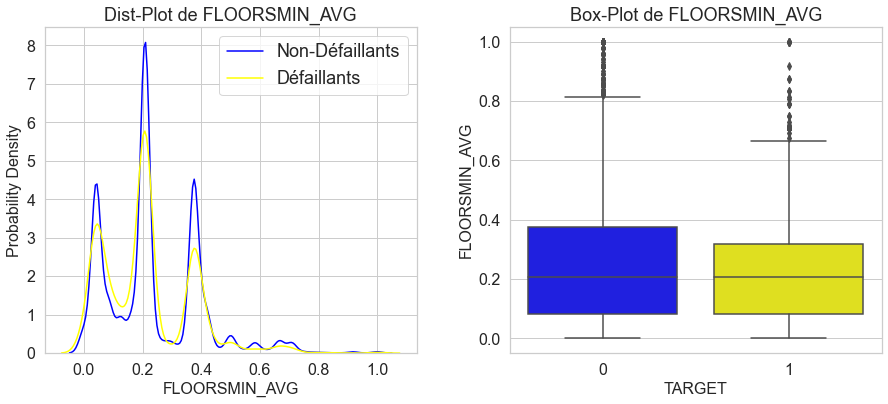

2:80: E501 line too long (109 > 79 characters)
3:80: E501 line too long (120 > 79 characters)
3:105: E127 continuation line over-indented for visual indent


In [59]:
# Boxplot de FLOORSMIN_AVG
eda_kernel_fonctions.plot_continuous_variables(application_train, 'FLOORSMIN_AVG', plots=['distplot', 'box'],
                                                                                                        figsize=(15, 6))

*****
**Conclusion**:

- Le boxplot montre que non-défaillants ont tendance à montrer une valeur plus élevée de `FLOORSMIN_AVG` par rapport aux défaillants. 

- La valeur du 75ème percentile des non-défaillants est significativement plus élevée que celle du 75ème percentile des défaillants.

Cette variable pourrait être une variable importante pour départager les défaillants des non-défaillants.
*****

<span>**Variable `FLOORSMIN_MEDI`**</span>

Cette variable décrit les scores normalisés de la médiane du nombre minimum d'étages dans le bâtiment du demandeur.

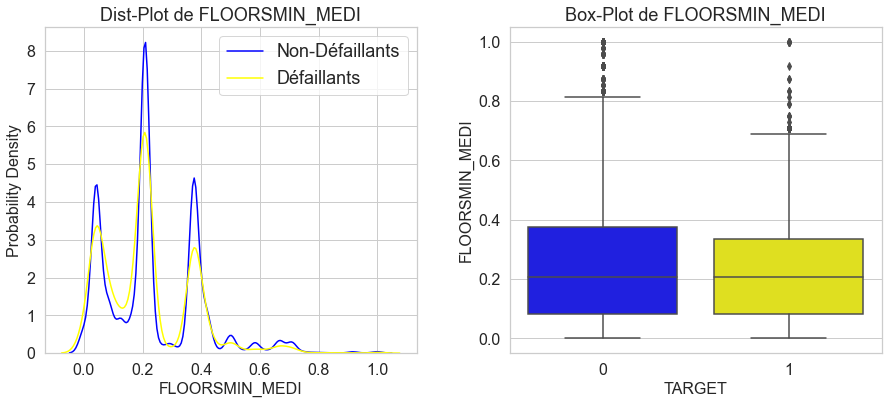

2:80: E501 line too long (110 > 79 characters)
3:80: E501 line too long (120 > 79 characters)
3:105: E127 continuation line over-indented for visual indent


In [60]:
# Boxplot de FLOORSMIN_MEDI
eda_kernel_fonctions.plot_continuous_variables(application_train, 'FLOORSMIN_MEDI', plots=['distplot', 'box'],
                                                                                                        figsize=(15, 6))

*****
**Conclusion**:

- Le boxplot montre que non-défaillants ont tendance à montrer une valeur plus élevée de `FLOORSMIN_MEDI` par rapport aux défaillants. 

- La valeur du 75ème percentile des non-défaillants est significativement plus élevée que celle du 75ème percentile des défaillants.

Cette variable pourrait être une variable importante pour départager les défaillants des non-défaillants.
*****

<span>**Variable `OWN_CAR_AGE`**</span>

Âge de la voiture du demandeur.

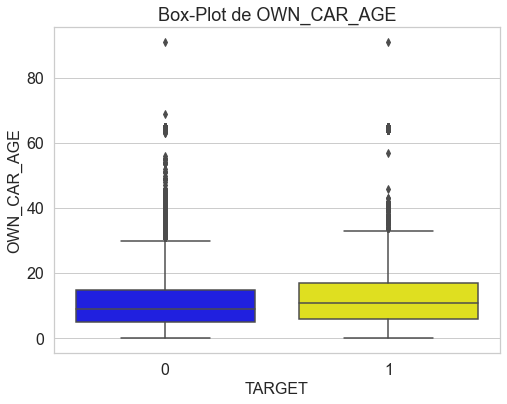

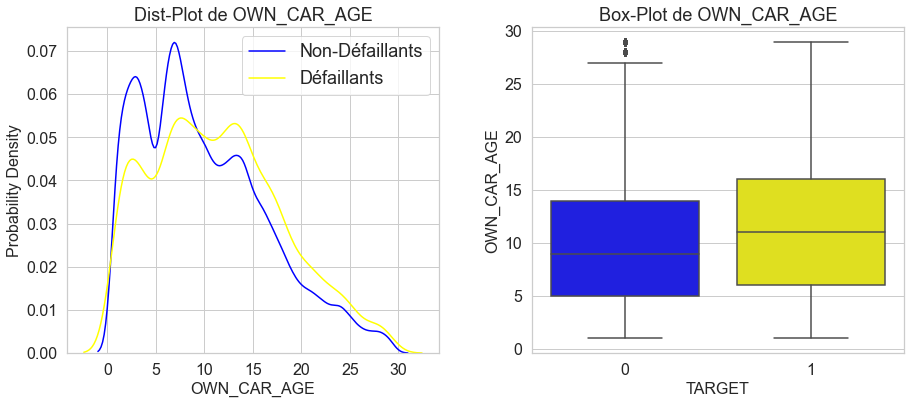

2:80: E501 line too long (111 > 79 characters)
4:80: E501 line too long (107 > 79 characters)
4:108: W291 trailing whitespace
5:80: E501 line too long (122 > 79 characters)
5:85: E127 continuation line over-indented for visual indent


In [61]:
# Boxplot de OWN_CAR_AGE
eda_kernel_fonctions.plot_continuous_variables(application_train, 'OWN_CAR_AGE', plots=['box'], figsize=(8, 6))

eda_kernel_fonctions.plot_continuous_variables(application_train, 'OWN_CAR_AGE', plots=['distplot', 'box'], 
                                                                                    figsize=(15, 6), scale_limits=[0, 30])

*****
**Conclusion**:

- Les défaillants ont des voitures plus anciennes que les non-défaillants.

Cette variable pourra être utile pour départager les défaillants  des non-défaillants.
*****

<span>**Variable `DEF_60_CNT_SOCIAL_CIRCLE`**</span>

Combien d'observations de l'environnement social du demandeur ont fait l'objet d'un défaut de paiement de 60 (jours d'arriérés) DPD.

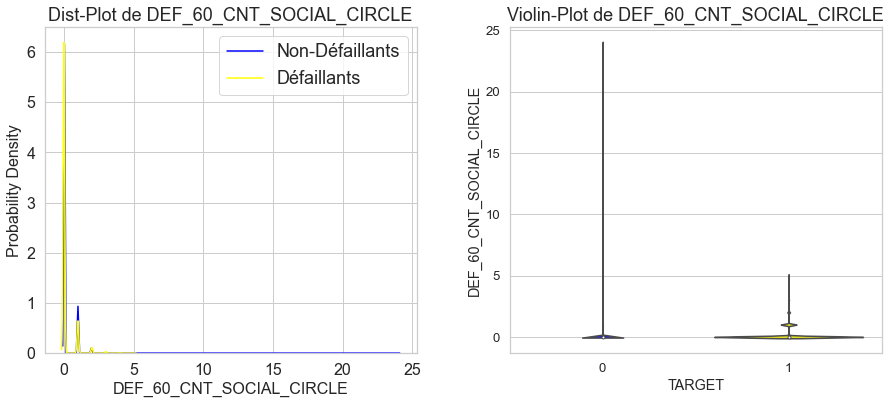

2:80: E501 line too long (93 > 79 characters)
2:94: W291 trailing whitespace
3:76: E127 continuation line over-indented for visual indent
3:80: E501 line too long (121 > 79 characters)


In [62]:
# Violinplot de DEF_60_CNT_SOCIAL_CIRCLE
eda_kernel_fonctions.plot_continuous_variables(application_train, 'DEF_60_CNT_SOCIAL_CIRCLE', 
                                                                           plots=['distplot', 'violin'], figsize=(15, 6))

*****
**Conclusion**:

- Les défaillants ont plus de défaut de paiement de jours d'arriérés.

Cette variable pourra être utilisée pour départager les demandeurs défaillants ou non-défaillants.
*****

<span>**Variable `DAYS_LAST_PHONE_CHANGE`**</span>

Combien de jours avant la demande le demaneur a-t-il changé de téléphone ?

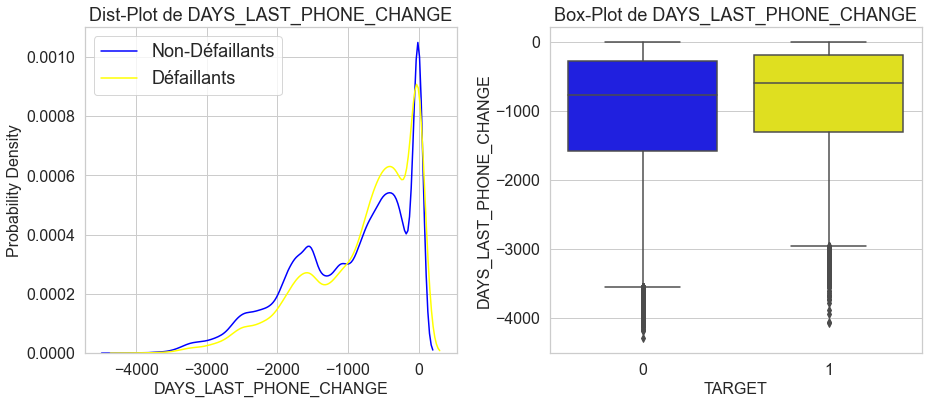

2:80: E501 line too long (118 > 79 characters)
3:80: E501 line too long (124 > 79 characters)
3:109: E127 continuation line over-indented for visual indent


In [63]:
# Boxplot de DAYS_LAST_PHONE_CHANGE
eda_kernel_fonctions.plot_continuous_variables(application_train, 'DAYS_LAST_PHONE_CHANGE', plots=['distplot', 'box'],
                                                                                                            figsize=(15, 6))

*****
**Conclusion**:

- Les défaillants ont changé de téléphone plus récemment que les non-défaillants, tous les quantiles sont plus hauts pour les défaillants que les non-défaillants.

Cette variable pourra être utile pour départager les demandeurs défaillants ou non-défaillants.
*****

#### <span>2.2.3. Analyse exploratoire multivariée</span>

<span>**i) Corrélation entre les variables catégorielles**</span>

**Matrice Phi-K**

- Nous allons tracer une carte thermique des valeurs du [`coefficient de corrélation Phi-K`](https://lemakistatheux.wordpress.com/2013/09/01/le-coefficient-phi-2/) entre les 2 variables.


- Le [`coefficient Phi-K`](https://en.wikipedia.org/wiki/Phi_coefficient) est similaire au coefficient de corrélation sauf qu'il peut être utilisé avec une paire de caractéristiques catégorielles pour vérifier si une variable montre une sorte d'association avec l'autre variable catégorielle. Sa valeur maximale peut être de 1, ce qui indique une association maximale entre deux variables catégorielles.

_______________________________________________________________________________


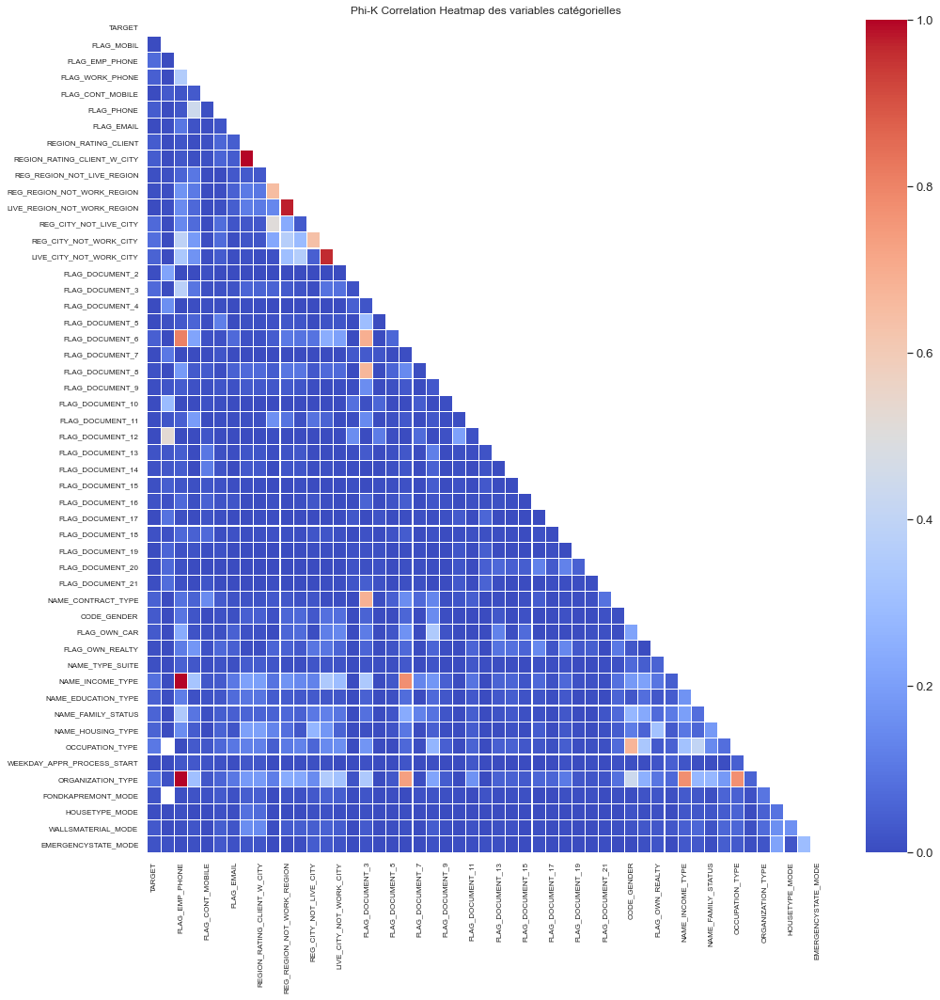

_______________________________________________________________________________
Les catégories présentant les valeurs les plus élevées de la corrélation Phi-K avec la variable cible sont les suivantes :


Variable,Phik-Correlation
OCCUPATION_TYPE,0.1028
ORGANIZATION_TYPE,0.0892
NAME_INCOME_TYPE,0.0848
REG_CITY_NOT_WORK_CITY,0.0799
FLAG_EMP_PHONE,0.0721
REG_CITY_NOT_LIVE_CITY,0.0696
FLAG_DOCUMENT_3,0.0695
NAME_FAMILY_STATUS,0.0560
NAME_HOUSING_TYPE,0.0511
LIVE_CITY_NOT_WORK_CITY,0.0510


_______________________________________________________________________________


In [64]:
categorical_columns = ['TARGET', 'FLAG_MOBIL', 'FLAG_EMP_PHONE',
                       'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE',
                       'FLAG_EMAIL', 'REGION_RATING_CLIENT',
                       'REGION_RATING_CLIENT_W_CITY',
                       'REG_REGION_NOT_LIVE_REGION',
                       'REG_REGION_NOT_WORK_REGION',
                       'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY',
                       'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY'] \
    + ['FLAG_DOCUMENT_' + str(i) for i in range(2, 22)] \
    + application_train.dtypes[application_train.dtypes == 'object'] \
    .index.tolist()
eda_kernel_fonctions.plot_phik_matrix(application_train,
                                      categorical_columns,
                                      figsize=(15, 15), fontsize=8,
                                      cmap='coolwarm')

*****
**Conclusion** :

- La carte thermique de la corrélation `Phi-K` ci-dessus montre que la plupart des variables catégorielles ne sont pas corrélées entre elles, mais que certaines d'entre elles présentent une forte corrélation.

- Certaines des paires de catégories fortement corrélées sont :
    - `REGION_RATING_CLIENT_W_CITY` et `REGION_RATING_CLIENT` - Ceci est compréhensible car elles racontent plus ou moins une histoire similaire.
    
    - `LIVE_REGION_NOT_WORK_REGION` et `REG_REGION_NOT_WORK_REGION`
    
    - `NAME_INCOME_TYPE`, `ORGANIZATION_TYPE` et `FLAG_EMP_PHONE`
    
- Nous pouvons également observer une certaine corrélation entre le type d'organisation et le type de revenu d'un demandeur. 
- De même, nous constatons une corrélation entre le type de profession et le type d'organisation.
- Nous constatons que les catégories : `OCCUPATION_TYPE`, `ORGANIZATION_TYPE`, `NAME_INCOME_TYPE` et `REG_CITY_NOT_WORK_CITY` sont parmi les catégories les plus fortement corrélées avec la variable TARGET. Elles peuvent être importantes dans la tâche de classification et nécessiteraient une analyse EDA plus approfondie.

<span>**ii) Corrélation entre les variables numériques**</span>

**Matrice de corrélation**

- Nous allons tracer une carte thermique de la corrélation de chaque variable numérique par rapport aux autres variables. 
- Nous avons exclu la variable `SK_ID_CURR`, car elle n'est pas pertinente.
- Cette carte thermique nous permettra d'identifier les variables numériques fortement corrélées et nous aidera également à identifier les variable fortement corrélées avec la variable cible.

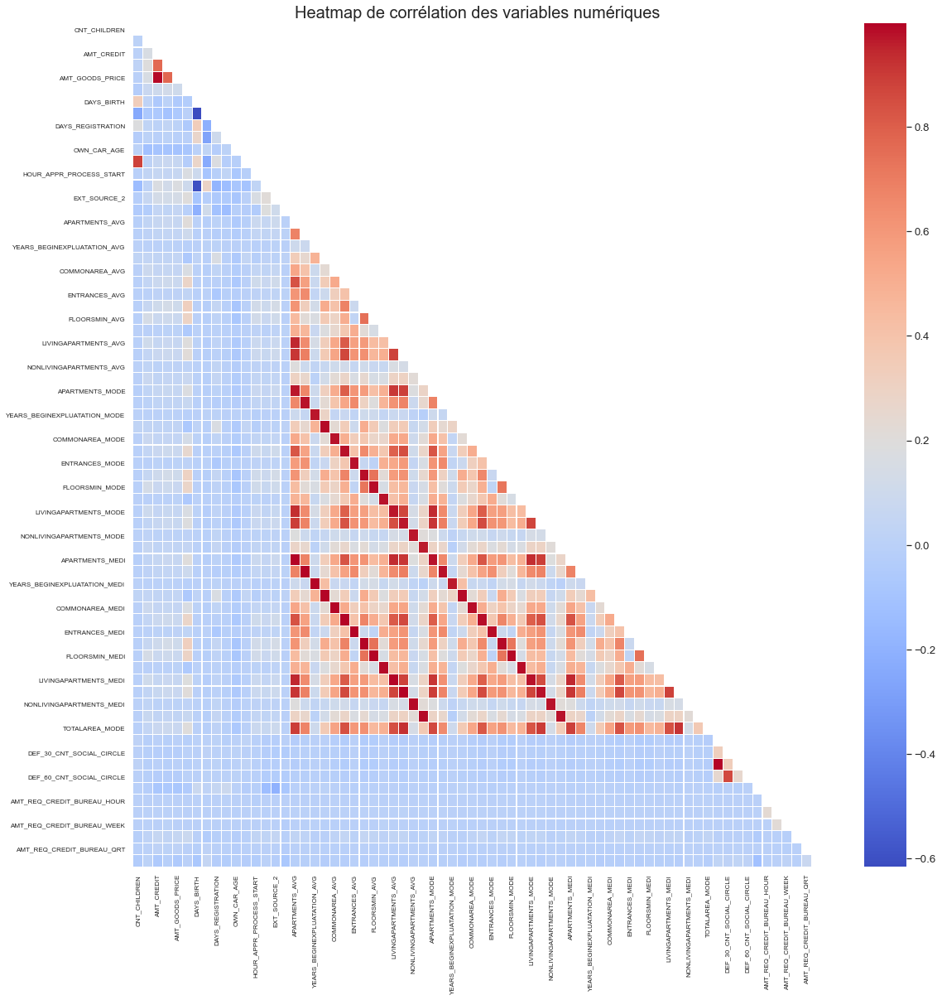

1:80: E501 line too long (83 > 79 characters)
3:80: E501 line too long (117 > 79 characters)
4:80: E501 line too long (120 > 79 characters)
4:105: E127 continuation line over-indented for visual indent


In [65]:
columns_to_drop = ['SK_ID_CURR'] + list(set(categorical_columns) - set(['TARGET']))

corr_mat = eda_kernel_fonctions.correlation_matrix(application_train, columns_to_drop, figsize=(17, 17),  fontsize=8,
                                                                                                        cmap='coolwarm')
corr_mat.plot_correlation_matrix()

### <span>2.3. Fichier application_test.csv</span>

#### <span>2.3.1. Description/statistiques</span>

<span>**Description**</span>

- Le fichier **`application_test.csv`** est constituée de **`données statiques relatives aux emprunteurs sans les étiquettes`**. 
- Chaque ligne représente une demande de prêt.
- Le dataframe `application_test.csv` contient l'ensemble de données de test, et est similaire à `application_train.csv`, sauf que la colonne TARGET a été omise, qui doit être prédite à l'aide de modèles prédictifs statistiques et d'apprentissage automatique.

<span>**Compréhension des variables**</span>

In [66]:
df_var_appli_test = \
    HomeCredit_columns_description[HomeCredit_columns_description['Table']
                                   == 'application_{train|test}.csv']

In [67]:
df_var_appli_test.style.hide_index()

Table,Row,Description,Special
application_{train|test}.csv,SK_ID_CURR,ID of loan in our sample,nan
application_{train|test}.csv,TARGET,"Target variable (1 - client with payment difficulties: he/she had late payment more than X days on at least one of the first Y installments of the loan in our sample, 0 - all other cases)",nan
application_{train|test}.csv,NAME_CONTRACT_TYPE,Identification if loan is cash or revolving,nan
application_{train|test}.csv,CODE_GENDER,Gender of the client,nan
application_{train|test}.csv,FLAG_OWN_CAR,Flag if the client owns a car,nan
application_{train|test}.csv,FLAG_OWN_REALTY,Flag if client owns a house or flat,nan
application_{train|test}.csv,CNT_CHILDREN,Number of children the client has,nan
application_{train|test}.csv,AMT_INCOME_TOTAL,Income of the client,nan
application_{train|test}.csv,AMT_CREDIT,Credit amount of the loan,nan
application_{train|test}.csv,AMT_ANNUITY,Loan annuity,nan


<span>**Statistiques**</span>

In [68]:
eda_kernel_fonctions.afficher_stats_basic(application_test)

_______________________________________________________________________________
Le dataset contient 48744 lignes et 121 variables.
_______________________________________________________________________________
Nombre de valeurs dupliquées dans application_train : 0
_______________________________________________________________________________
Contenu des 3 premières lignes :


,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,Unaccompanied,Working,Higher education,Married,House / apartment,0.0188,-19241,-2329,-5170.0,-812,NaN,1,1,0,1,0,1,NaN,2.0,2,2,TUESDAY,18,0,0,0,0,0,0,Kindergarten,0.7526,0.7897,0.1595,0.0660,0.0590,0.9732,NaN,NaN,NaN,0.1379,0.125,NaN,NaN,NaN,0.0505,NaN,NaN,0.0672,0.0612,0.9732,NaN,NaN,NaN,0.1379,0.125,NaN,NaN,NaN,0.0526,NaN,NaN,0.0666,0.0590,0.9732,NaN,NaN,NaN,0.1379,0.125,NaN,NaN,NaN,0.0514,NaN,NaN,NaN,block of flats,0.0392,"Stone, brick",No,0.0,0.0,0.0,0.0,-1740.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.0358,-18064,-4469,-9118.0,-1623,NaN,1,1,0,1,0,0,Low-skill Laborers,2.0,2,2,FRIDAY,9,0,0,0,0,0,0,Self-employed,0.5650,0.2917,0.4330,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,NaN,Working,Higher education,Married,House / apartment,0.0191,-20038,-4458,-2175.0,-3503,5.0,1,1,0,1,0,0,Drivers,2.0,2,2,MONDAY,14,0,0,0,0,0,0,Transport: type 3,NaN,0.6998,0.6110,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-856.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.0

____________________________________________________
Type des variables



SK_ID_CURR                        int64
NAME_CONTRACT_TYPE               object
CODE_GENDER                      object
FLAG_OWN_CAR                     object
FLAG_OWN_REALTY                  object
CNT_CHILDREN                      int64
AMT_INCOME_TOTAL                float64
AMT_CREDIT                      float64
AMT_ANNUITY                     float64
AMT_GOODS_PRICE                 float64
NAME_TYPE_SUITE                  object
NAME_INCOME_TYPE                 object
NAME_EDUCATION_TYPE              object
NAME_FAMILY_STATUS               object
NAME_HOUSING_TYPE                object
REGION_POPULATION_RELATIVE      float64
DAYS_BIRTH                        int64
DAYS_EMPLOYED                     int64
DAYS_REGISTRATION               float64
DAYS_ID_PUBLISH                   int64
OWN_CAR_AGE                     float64
FLAG_MOBIL                        int64
FLAG_EMP_PHONE                    int64
FLAG_WORK_PHONE                   int64
FLAG_CONT_MOBILE                  int64


,Nombre par type de variable,% des types de variable
float64,65,53.7200
int64,40,33.0600
object,16,13.2200


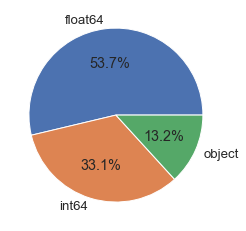

In [69]:
# Types des variables
outils_data.get_types_variables(application_test, True, True, True)

In [70]:
# Résumé des variables
desc_appli_test = outils_data.description_variables(application_test)
desc_appli_test

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
type,int64,object,object,object,object,int64,float64,float64,float64,float64,object,object,object,object,object,float64,int64,int64,float64,int64,float64,int64,int64,int64,int64,int64,int64,object,float64,int64,int64,object,int64,int64,int64,int64,int64,int64,int64,object,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,object,object,float64,object,object,float64,float64,float64,float64,float64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,float64,float64,float64,float64,float64,float64
nb_nan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,24.0,0.0,911.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,32312.0,0.0,0.0,0.0,0.0,0.0,0.0,15605.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,20532.0,8.0,8668.0,23887.0,27641.0,22856.0,31818.0,33495.0,25189.0,23579.0,23321.0,32466.0,28254.0,32780.0,23552.0,33347.0,26084.0,23887.0,27641.0,22856.0,31818.0,33495.0,25189.0,23579.0,23321.0,32466.0,28254.0,32780.0,23552.0,33347.0,26084.0,23887.0,27641.0,22856.0,31818.0,33495.0,25189.0,23579.0,23321.0,32466.0,28254.0,32780.0,23552.0,33347.0,26084.0,32797.0,23619.0,22624.0,23893.0,22209.0,29.0,29.0,29.0,29.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6049.0,6049.0,6049.0,6049.0,6049.0,6049.0
%_nan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0004,0.0,0.0154,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.5478,0.0,0.0,0.0,0.0,0.0,0.0,0.2646,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.3481,0.0001,0.147,0.405,0.468

*****
**Conclusion** :

- Le fichier `application_test.csv` contient environ **`487000 enregistrements`** et **`121 variables`**. 

- Ces variables sont exactement celles qui se trouvent dans le fichier `application_train.csv`, sauf qu'il s'agit des données de formation.

- Il y a `487000 SK_ID_CURR uniques` qui représentent des demandes de prêt uniques.

- La colonne TARGET a été omise et doit être prédite à l'aide de modèles statistiques prédictifs et de modèles d'apprentissage automatique.
*****

<span>**Valeurs manquantes**</span>

Valeurs manquantes : 1404419 NaN pour 5898024 données (23.81 %)
____________________________________________________
Nombre et % de valeurs manquantes par variable



,Nombres de valeurs manquantes,% de valeurs manquantes
COMMONAREA_MODE,33495,68.7200
COMMONAREA_MEDI,33495,68.7200
COMMONAREA_AVG,33495,68.7200
NONLIVINGAPARTMENTS_MEDI,33347,68.4100
NONLIVINGAPARTMENTS_AVG,33347,68.4100
NONLIVINGAPARTMENTS_MODE,33347,68.4100
FONDKAPREMONT_MODE,32797,67.2800
LIVINGAPARTMENTS_MODE,32780,67.2500
LIVINGAPARTMENTS_MEDI,32780,67.2500
LIVINGAPARTMENTS_AVG,32780,67.2500


____________________________________________________
Heatmap de visualisation des valeurs manquantes


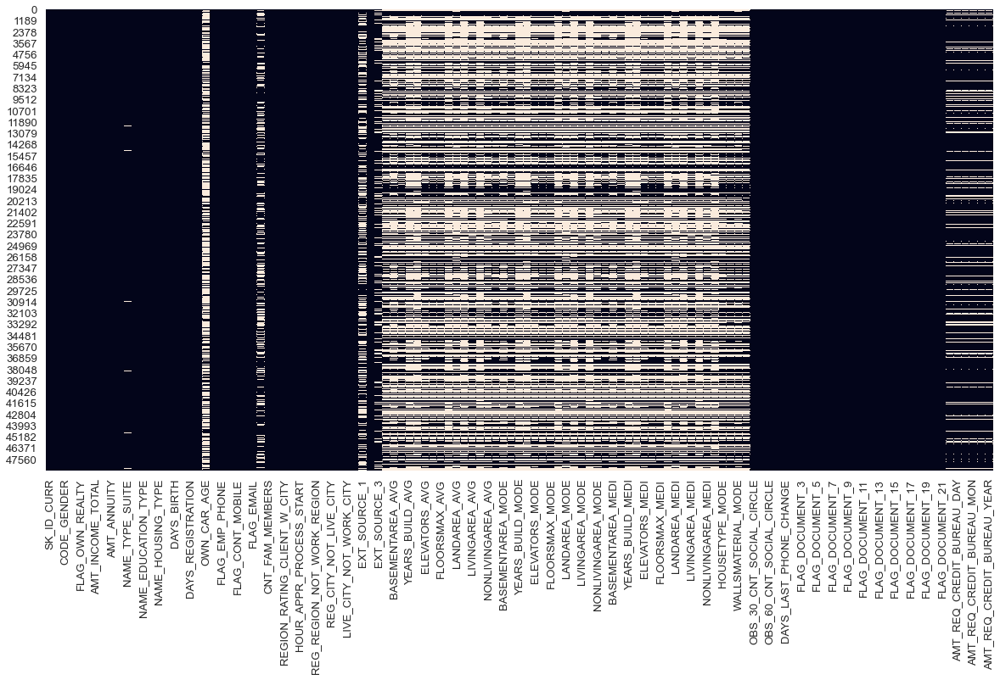

In [71]:
# Valeurs manquantes du dataframe
outils_data.get_missing_values(application_test, True, True)

Nombre de variables avec valeurs manquantes : 64


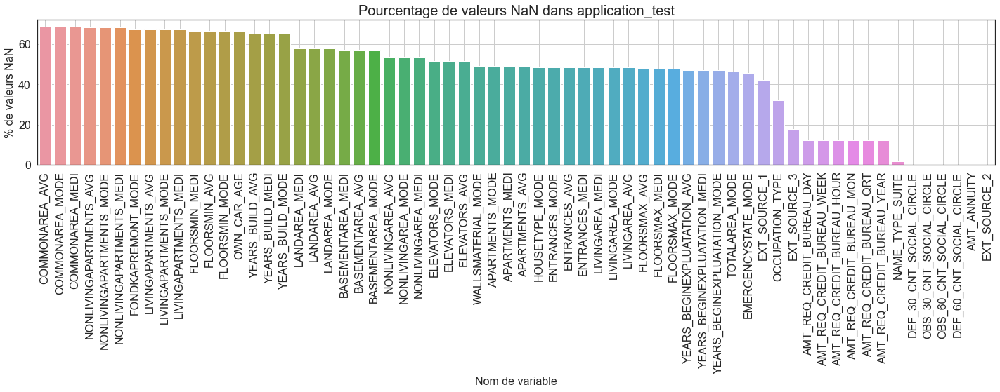

4:80: E501 line too long (81 > 79 characters)


In [72]:
# Réprésentation visuelle des valeurs manquantes
df_nan_test = eda_kernel_fonctions.nan_df_create(application_test)

eda_kernel_fonctions.plot_nan_percent(df_nan_test, 'application_test', grid=True)

*****
**Conclusion** :

- Le nombre de variables avec des valeurs NaN est très similaire (`64`) à celui de l'application_train.
- Les pourcentages de valeurs NaN sont également assez similaires à ceux présents dans le jeu de données d'entraînement (train set). Cela signifie que les ensembles d'entraînement (train set) et de test (test set) ont une distribution assez similaire.
*****

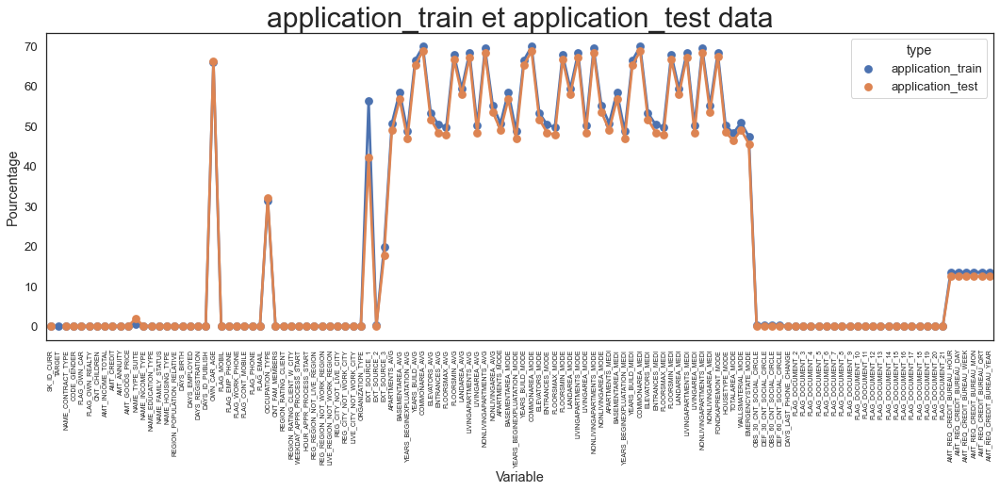

1:80: E501 line too long (84 > 79 characters)


In [73]:
# Comparaison des pourcentages de NaN pour les application_train et application_test
fig = plt.figure(figsize=(18, 6))

miss_train = pd.DataFrame((application_train.isnull().sum()) * 100 /
                          application_train.shape[0]).reset_index()
miss_test = pd.DataFrame((application_test.isnull().sum()) * 100 /
                         application_test.shape[0]).reset_index()
miss_train['type'] = 'application_train'
miss_test['type'] = 'application_test'
missing = pd.concat([miss_train, miss_test], axis=0)
ax = sns.pointplot('index', 0, data=missing, hue='type')
plt.xticks(rotation=90, fontsize=7)
var = 'Pourcentage de valeurs manquantes dans '
plt.title('application_train et application_test data', fontsize=30)
plt.ylabel('Pourcentage')
plt.xlabel('Variable')
plt.show()

### <span>2.4. Fichier bureau.csv</span>

#### <span>2.4.1. Description/statistiques</span>

<span>**Description**</span>

- **`bureau.csv`** comprend tous les **antécédents de crédit antérieurs du demandeur auprès d'institutions financières autres que le Home Credit Group**, qui ont été signalés par le bureau de crédit.

<span>**Compréhension des variables**</span>

In [74]:
df_var_bureau = \
    HomeCredit_columns_description[HomeCredit_columns_description['Table']
                                   == 'bureau.csv']

df_var_bureau.style.hide_index()

Table,Row,Description,Special
bureau.csv,SK_ID_CURR,"ID of loan in our sample - one loan in our sample can have 0,1,2 or more related previous credits in credit bureau",hashed
bureau.csv,SK_BUREAU_ID,Recoded ID of previous Credit Bureau credit related to our loan (unique coding for each loan application),hashed
bureau.csv,CREDIT_ACTIVE,Status of the Credit Bureau (CB) reported credits,nan
bureau.csv,CREDIT_CURRENCY,Recoded currency of the Credit Bureau credit,recoded
bureau.csv,DAYS_CREDIT,How many days before current application did client apply for Credit Bureau credit,time only relative to the application
bureau.csv,CREDIT_DAY_OVERDUE,Number of days past due on CB credit at the time of application for related loan in our sample,nan
bureau.csv,DAYS_CREDIT_ENDDATE,Remaining duration of CB credit (in days) at the time of application in Home Credit,time only relative to the application
bureau.csv,DAYS_ENDDATE_FACT,Days since CB credit ended at the time of application in Home Credit (only for closed credit),time only relative to the application
bureau.csv,AMT_CREDIT_MAX_OVERDUE,Maximal amount overdue on the Credit Bureau credit so far (at application date of loan in our sample),nan
bureau.csv,CNT_CREDIT_PROLONG,How many times was the Credit Bureau credit prolonged,nan


<span>**Statistiques**</span>

In [75]:
bureau.name = 'bureau'
application_train.name = 'application_train'
application_test.name = 'application_test'
eda_kernel_fonctions. \
    afficher_stats_basic_all(bureau, application_train, application_test, 'SK_ID_BUREAU')

_______________________________________________________________________________
Le dataset contient 1716428 lignes et 17 variables.
_______________________________________________________________________________
Nombre de valeurs uniques SK_ID_BUREAU dans bureau.csv : 1716428
Nombre de valeurs uniques SK_ID_CURR dans bureau.csv : 305811
Nombre de valeurs communes SK_ID_CURR dans application_train.csv et bureau.csv : 263491
Nombre de valeurs communes SK_ID_CURR dans application_train.csv et bureau.csv : 42320
_______________________________________________________________________________
Nombre de valeurs dupliquées dans bureau.csv : 0
_______________________________________________________________________________
Contenu des 3 premières lignes :


,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.0,0.0,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.0,171342.0,NaN,0.0,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.5,NaN,NaN,0.0,Consumer credit,-16,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.0,NaN,NaN,0.0,Credit card,-16,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.0,NaN,NaN,0.0,Consumer credit,-21,NaN


5:80: E501 line too long (89 > 79 characters)


____________________________________________________
Type des variables



SK_ID_CURR                  int64
SK_ID_BUREAU                int64
CREDIT_ACTIVE              object
CREDIT_CURRENCY            object
DAYS_CREDIT                 int64
CREDIT_DAY_OVERDUE          int64
DAYS_CREDIT_ENDDATE       float64
DAYS_ENDDATE_FACT         float64
AMT_CREDIT_MAX_OVERDUE    float64
CNT_CREDIT_PROLONG          int64
AMT_CREDIT_SUM            float64
AMT_CREDIT_SUM_DEBT       float64
AMT_CREDIT_SUM_LIMIT      float64
AMT_CREDIT_SUM_OVERDUE    float64
CREDIT_TYPE                object
DAYS_CREDIT_UPDATE          int64
AMT_ANNUITY               float64
dtype: object

,Nombre par type de variable,% des types de variable
float64,8,47.0600
int64,6,35.2900
object,3,17.6500


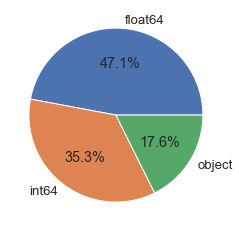

In [76]:
# Types des variables
outils_data.get_types_variables(bureau, True, True, True)

In [77]:
# Résumé des variables
desc_bureau = outils_data.description_variables(bureau)
desc_bureau

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
type,int64,int64,object,object,int64,int64,float64,float64,float64,int64,float64,float64,float64,float64,object,int64,float64
nb_nan,0.0,0.0,0.0,0.0,0.0,0.0,105553.0,633653.0,1124488.0,0.0,13.0,257669.0,591780.0,0.0,0.0,0.0,1226791.0
%_nan,0.0,0.0,0.0,0.0,0.0,0.0,0.3617,2.1716,3.8537,0.0,0.0,0.8831,2.0281,0.0,0.0,0.0,4.2043
count,1716428.0,1716428.0,1716428,1716428,1716428.0,1716428.0,1610875.0,1082775.0,591940.0,1716428.0,1716415.0,1458759.0,1124648.0,1716428.0,1716428,1716428.0,489637.0
unique,NaN,NaN,4,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15,NaN,NaN
top,NaN,NaN,Closed,currency 1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Consumer credit,NaN,NaN
freq,NaN,NaN,1079273,1715020,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1251615,NaN,NaN
mean,278214.9336,5924434.489,NaN,NaN,-1142.1077,0.8182,510.5174,-1017.4371,3825.4177,0.0064,354994.5919,137085.12,6229.515,37.9128,NaN,-593.7483,15712.7577
std,102938.5581,532265.7286,NaN,NaN,795.1649,36.5444,4994.2198,714.0106,206031.6062,0.0962,1149811.344,677401.131,45032.0315,5937.65,NaN,720.7473,325826.9491
min,100001.0,5000000.0,NaN,NaN,-2922.0,0.0,-42060.0,-42023.0,0.0,0.0,0.0,-4705600.32,-586406.115,0.0,NaN,-41947.0,0.0


*****
**Conclusion** :

- Le fichier `bureau.csv` contient près de `1,7 millions de points de données`, avec `17 variables`. 

- Parmi ces 17 variables, deux sont `SK_ID_CURR` et `SK_ID_BUREAU`.

    - `SK_ID_BUREAU` est l'identifiant du prêt précédent du demandeur auprès d'autres institutions financières. Il peut y avoir plusieurs prêts antérieurs correspondant à un seul `SK_ID_CURR`, ce qui dépend des habitudes d'emprunt du demandeur.
    
    - `SK_ID_CURR` est l'identifiant du prêt actuel du demandeur auprès de Home Credit.
    
- Le reste des variables contient d'autres statistiques telles que DAYS_CREDIT, AMT_CREDIT_SUM, CREDIT_TYPE, etc.

- Il y a `305000 SK_ID_CURR uniques` dans le fichier bureau, parmi lesquels :

    - Il y a `263000 SK_ID_CURR` dans le fichier  bureau qui sont présents dans `application_train` sur un total de 307000 de SK_ID_CURR uniques d'application_train. Cela signifie que certains des demandeurs dans la demande de prêt actuelle avec Home Credit Group n'ont pas d'antécédents de crédit avec le département du bureau de crédit.
    
- De même, il y a `42300 SK_ID_CURR` dans le fichier bureau qui sont présents dans application_test, sur un total de 48000 de SK_ID_CURR uniques de application_test.
*****

<span>**Valeurs manquantes**</span>

Valeurs manquantes : 3939947 NaN pour 29179276 données (13.5 %)
____________________________________________________
Nombre et % de valeurs manquantes par variable



,Nombres de valeurs manquantes,% de valeurs manquantes
AMT_ANNUITY,1226791,71.4700
AMT_CREDIT_MAX_OVERDUE,1124488,65.5100
DAYS_ENDDATE_FACT,633653,36.9200
AMT_CREDIT_SUM_LIMIT,591780,34.4800
AMT_CREDIT_SUM_DEBT,257669,15.0100
DAYS_CREDIT_ENDDATE,105553,6.1500
AMT_CREDIT_SUM,13,0.0000


____________________________________________________
Heatmap de visualisation des valeurs manquantes


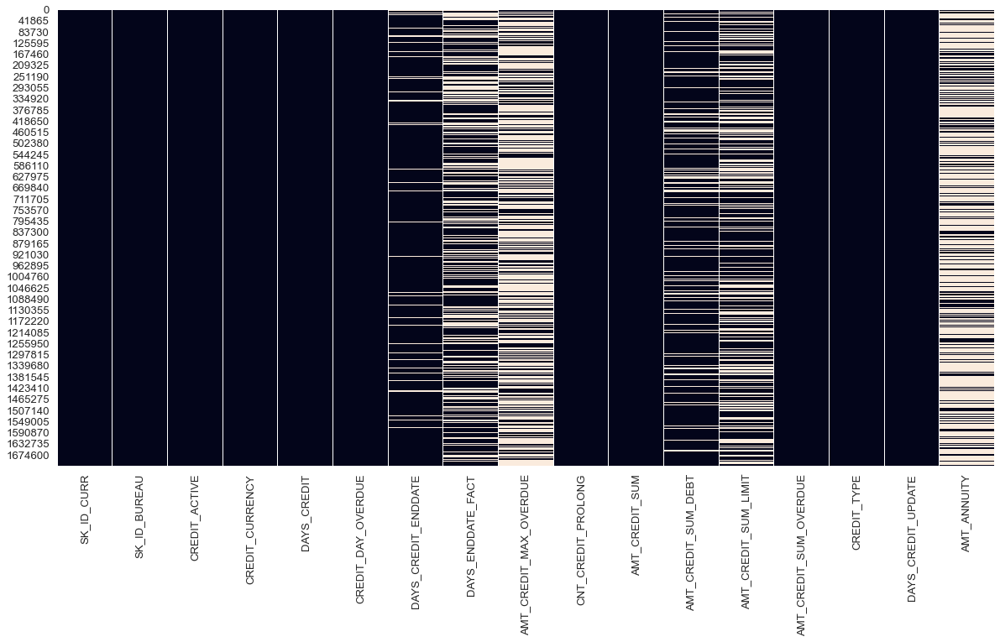

In [78]:
# Valeurs manquantes du dataframe
outils_data.get_missing_values(bureau, True, True)

Nombre de variables avec valeurs manquantes : 7


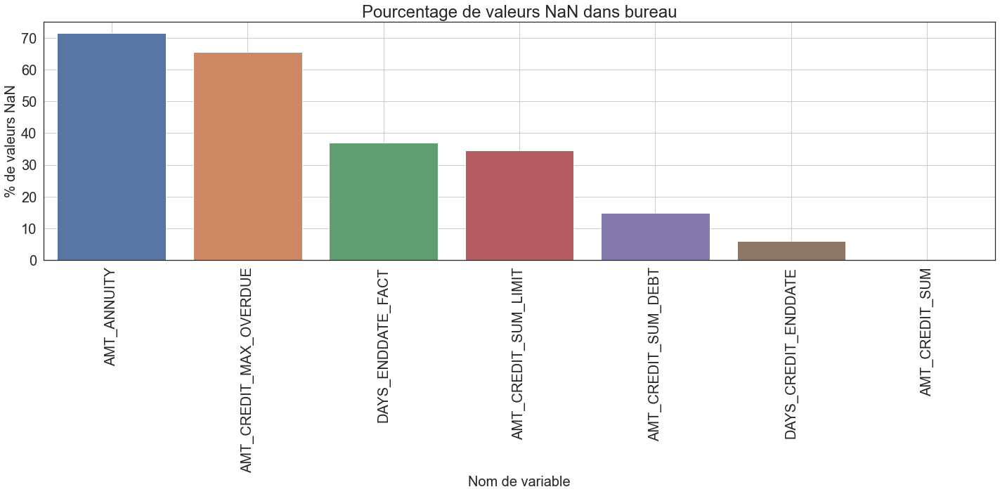

3:80: E501 line too long (104 > 79 characters)


In [79]:
# Réprésentation visuelle des valeurs manquantes
df_nan_bureau = eda_kernel_fonctions.nan_df_create(bureau)
eda_kernel_fonctions.plot_nan_percent(df_nan_bureau, 'bureau', grid=True, fontsize=20, figsize=(20, 10))

*****
**Conclusion** :

- Sur les 17 variables, 7 contiennent des valeurs NaN.
- Les valeurs NaN les plus élevées sont observées avec la variable `AMT_ANNUITY` qui a plus de `70%` de valeurs manquantes.

**Préparation du dataframe de travail**

In [80]:
# Ajout de la variable TARGET pour la répartition défaillants/non-défaillants
print('_'*70)
print('Création du dataframe de travail : merge TARGET avec dataframe bureau')
bureau_merged = application_train.iloc[:, :2].merge(bureau, on='SK_ID_CURR', how='left')
print("_"*70)

______________________________________________________________________
Création du dataframe de travail : merge TARGET avec dataframe bureau


4:80: E501 line too long (88 > 79 characters)


______________________________________________________________________


#### <span>2.4.2. Analyse exploratoire univariée</span>

<span>**Distribution des variables catégorielles**</span>

Nous allons maintenant représenter graphiquement certaines des variables catégorielles du dataframe `bureau`, et voir leur impact sur la variable cible.

In [81]:
# Liste des variables qualitatives
cols_cat_bureau = \
                bureau.select_dtypes(exclude=[np.number]).columns.to_list()
cols_cat_bureau

['CREDIT_ACTIVE', 'CREDIT_CURRENCY', 'CREDIT_TYPE']

<span>**Variable `CREDIT_ACTIVE`**</span>

Cette variable décrit l'état du prêt précédent rapporté par le bureau de crédit.

_______________________________________________________________________________
Les catégories uniques de la variable 'CREDIT_ACTIVE' sont :
['Closed' 'Active' nan 'Sold' 'Bad debt']
_______________________________________________________________________________
Répartition dans chaque catégorie :
Closed      917733
Active      541919
Sold          5653
Bad debt        20
Name: CREDIT_ACTIVE, dtype: int64
_______________________________________________________________________________
Nombre de catégories uniques pour CREDIT_ACTIVE = 5


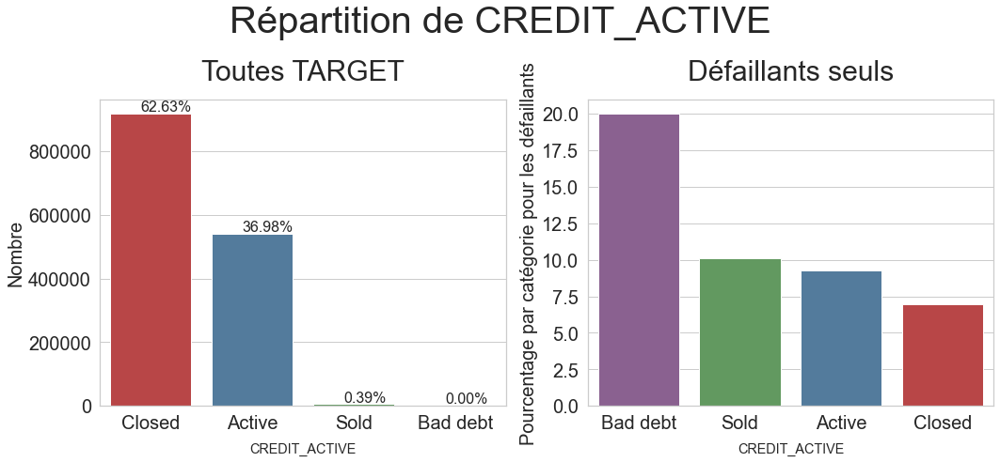

2:80: E501 line too long (94 > 79 characters)
6:80: E501 line too long (101 > 79 characters)
7:80: E127 continuation line over-indented for visual indent
7:80: E501 line too long (116 > 79 characters)
8:80: E127 continuation line over-indented for visual indent
8:80: E501 line too long (110 > 79 characters)
9:80: E501 line too long (111 > 79 characters)
10:80: E127 continuation line over-indented for visual indent
10:80: E501 line too long (110 > 79 characters)
11:80: E501 line too long (111 > 79 characters)


In [82]:
# Voyons d'abord les catégories uniques de 'CREDIT_ACTIVE'
eda_kernel_fonctions.print_unique_categories(bureau_merged, 'CREDIT_ACTIVE', show_counts=True)

# Tracer le graphique à barres pour la colonne
eda_kernel_fonctions. \
    plot_categorical_variables_bar(bureau_merged, column_name='CREDIT_ACTIVE', horizontal_adjust=0.3,
                                                                               figsize=(15, 7), fontsize_percent=16,
                                                                               palette1=['#cb3335', '#477ca8',
                                                                                         '#59a257', '#905998'],
                                                                               palette2=['#905998', '#59a257',
                                                                                         '#477ca8', '#cb3335'])

*****
**Conclusion** :

À partir du graphique ci-dessus, nous pouvons tirer les conclusions suivantes :

- Dans le premier sous-graphe, nous voyons que la majorité des prêts antérieurs d'autres institutions financières sont des prêts fermés (`62,63%`), suivis par `36,98%` de prêts actifs. Les prêts vendus et les prêts pour créances douteuses sont très peu nombreux.
- Si nous examinons le pourcentage de défaillants par catégorie, nous constatons qu'environ `20%` des personnes ayant des créances douteuses ont fait défaut, ce qui représente le taux de défaillance le plus élevé. Cette catégorie est suivie par les prêts vendus et les prêts actifs. Le taux de défaillance le plus faible concerne les prêts fermés, qui témoignent d'un bon historique du demandeur. La courbe observée ici est donc tout à fait logique et attendue.
*****

***NB*** :

Les '`Bad credit loans`' sont destinés aux personnes dont le dossier de crédit est loin d'être irréprochable ou qui ont peu ou pas d'antécédents de crédit. Ces prêts ont généralement des taux d'intérêt plus élevés et des restrictions plus importantes que les autres prêts, car cela permet aux prêteurs de réduire le risque que vous ne les remboursiez pas. Cependant, ils peuvent être utiles s'ils sont gérés de manière responsable.
*****

<span>**Variable `CREDIT_CURRENCY`**</span>

Cette variable décrit devise recodée du crédit du bureau de crédit.

In [83]:
# Voyons d'abord les catégories uniques de 'CREDIT_CURRENCY'
eda_kernel_fonctions.print_unique_categories(bureau_merged, 'CREDIT_CURRENCY')

# Tracer le graphique à secteurs pour la colonne
eda_kernel_fonctions. \
                    plot_categorical_variables_pie(bureau_merged, column_name='CREDIT_CURRENCY')

_______________________________________________________________________________
Les catégories uniques de la variable 'CREDIT_CURRENCY' sont :
['currency 1' nan 'currency 2' 'currency 3' 'currency 4']
_______________________________________________________________________________


6:80: E501 line too long (96 > 79 characters)


_______________________________________________________________________________
Les catégories uniques de la variable 'CREDIT_CURRENCY' sont :
['currency 1' nan 'currency 2' 'currency 3' 'currency 4']
_______________________________________________________________________________
Répartition dans chaque catégorie :
currency 1    1464094
currency 2       1072
currency 3        150
currency 4          9
Name: CREDIT_CURRENCY, dtype: int64
_______________________________________________________________________________
Nombre de catégories uniques pour CREDIT_CURRENCY = 5


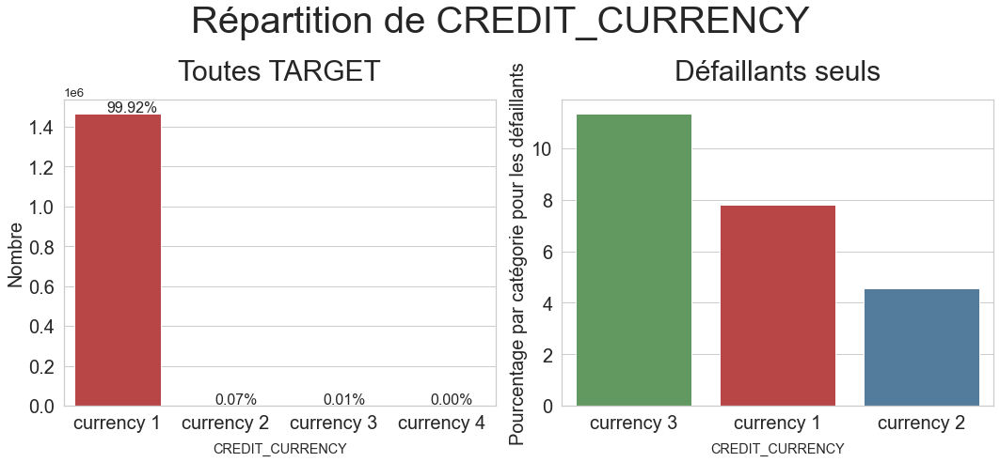

2:80: E501 line too long (96 > 79 characters)
6:80: E501 line too long (115 > 79 characters)
7:80: E501 line too long (121 > 79 characters)
7:85: E127 continuation line over-indented for visual indent
8:80: E501 line too long (115 > 79 characters)
8:85: E127 continuation line over-indented for visual indent
9:80: E501 line too long (118 > 79 characters)
9:97: E127 continuation line over-indented for visual indent
10:80: E501 line too long (127 > 79 characters)
10:85: E127 continuation line over-indented for visual indent


In [84]:
# Voyons d'abord les catégories uniques de 'CREDIT_CURRENCY'
eda_kernel_fonctions.print_unique_categories(bureau_merged, 'CREDIT_CURRENCY', show_counts=True)

# Tracer le graphique à barres pour la colonne
eda_kernel_fonctions. \
                plot_categorical_variables_bar(bureau_merged, column_name='CREDIT_CURRENCY', horizontal_adjust=0.3,
                                                                                    figsize=(15, 7), fontsize_percent=16,
                                                                                    palette1=['#cb3335', '#477ca8',
                                                                                                '#59a257', '#905998'],
                                                                                    palette2=['#59a257', '#cb3335', '#477ca8'])

*****
**Conclusion** :

À partir du graphique ci-dessus, nous pouvons tirer les conclusions suivantes :

- Dans le premier sous-graphe, nous voyons que la majorité des devises utilisées sont '`currency_1`'.
- Si nous examinons le pourcentage de défaillants par catégorie, nous constatons qu'environ `11,5%` des personnes ayant des prêts avec la devise '`currency_3`' ont été défaillants, ce qui représente le taux de défaillance le plus élevé. Cette catégorie est suivie par les devises `currency_1` (`8%`) et `currency_2` (`4%`). 

Les personnes utilisant les devises `currency_2` et `currency_3` ont plus de possibilités d'être défaillants.
*****

<span>**Variable `CREDIT_TYPE`**</span>

Cette variable décrit le type de crédit au bureau de crédit (exemple :voiture, argent liquide...).

_______________________________________________________________________________
Les catégories uniques de la variable 'CREDIT_TYPE' sont :
['Credit card' 'Consumer credit' nan 'Loan for business development'
 'Microloan' 'Mortgage' 'Car loan'
 'Loan for working capital replenishment' 'Another type of loan'
 'Unknown type of loan' 'Loan for the purchase of equipment'
 'Cash loan (non-earmarked)' 'Real estate loan' 'Interbank credit'
 'Loan for purchase of shares (margin lending)' 'Mobile operator loan']
_______________________________________________________________________________
Nombre de catégories uniques pour CREDIT_TYPE = 16


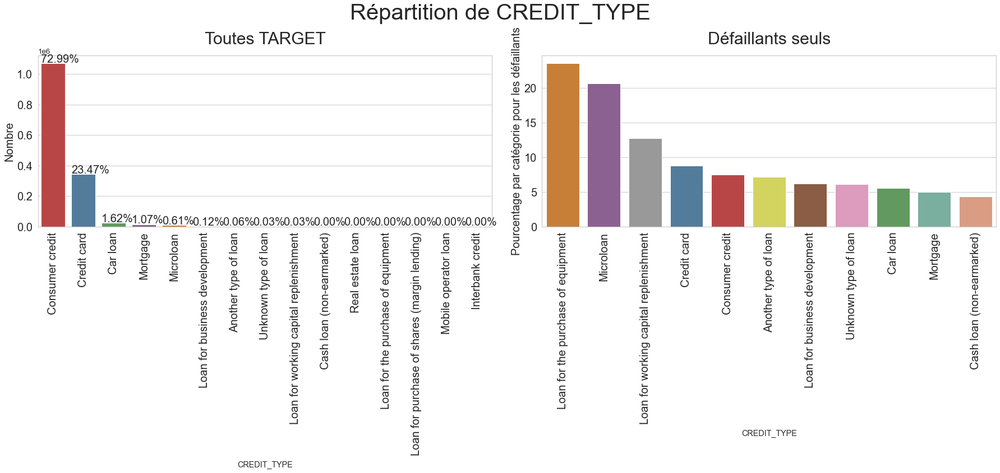

6:80: E501 line too long (119 > 79 characters)
7:80: E501 line too long (123 > 79 characters)
7:104: E127 continuation line over-indented for visual indent
8:80: E501 line too long (134 > 79 characters)
8:104: E127 continuation line over-indented for visual indent
9:80: E501 line too long (134 > 79 characters)
10:80: E501 line too long (134 > 79 characters)
11:80: E501 line too long (134 > 79 characters)
12:80: E501 line too long (134 > 79 characters)
13:80: E501 line too long (134 > 79 characters)
14:80: E501 line too long (134 > 79 characters)
15:80: E501 line too long (124 > 79 characters)
16:80: E501 line too long (134 > 79 characters)
16:104: E127 continuation line over-indented for visual indent
17:80: E501 line too long (134 > 79 characters)
18:80: E501 line too long (134 > 79 characters)
19:80: E501 line too long (134 > 79 characters)
20:80: E501 line too long (134 > 79 characters)
21:80: E501 line too long (124 > 79 characters)


In [85]:
# Voyons d'abord les catégories uniques de 'CREDIT_TYPE'
eda_kernel_fonctions.print_unique_categories(bureau_merged, 'CREDIT_TYPE')

# Tracer le graphique à barres pour la colonne
eda_kernel_fonctions. \
                plot_categorical_variables_bar(bureau_merged, column_name='CREDIT_TYPE', figsize=(25, 12), rotation=90,
                                                                                                       fontsize_percent=20,
                                                                                                       palette1=['#cb3335', '#477ca8',
                                                                                                                 '#59a257', '#905998',
                                                                                                                 '#df7f20', '#e6e64c',
                                                                                                                 '#965a38', '#e890be',
                                                                                                                 '#999999', '#72b6a1',
                                                                                                                 '#e99675', '#95a3c3',
                                                                                                                 '#db96c0', '#a2c865',
                                                                                                                 '#e5c949'],
                                                                                                       palette2=['#df7f20', '#905998',
                                                                                                                 '#999999', '#477ca8',
                                                                                                                 '#cb3335', '#e6e64c',
                                                                                                                 '#965a38', '#e890be',
                                                                                                                 '#59a257', '#72b6a1',
                                                                                                                 '#e99675'])

*****
**Conclusion** :

À partir du graphique ci-dessus, nous pouvons tirer les conclusions suivantes :

- Dans le premier sous-graphe, nous voyons que la majorité des types de prêts des prêts à la consommation ou des cartes de crédit.
- Les défaillants ont recours à d'autres types de crédits : `30%` pour l'achat de matériel, `20%` pour des micro-crédits et `12,5%` pour la reconstitution du fonds de roulement. 

Peut-on en déduire que les défaillants sont plus des auto-entreprenants qui remplacent du matériel et ont besoin de trésorerie pour payer les fournisseurs?
*****

<span>**Distribution des variables quantitatives**</span>

In [86]:
# Liste des variables quantitatives
cols_num_bureau = \
    bureau.select_dtypes(include=[np.number]).columns.to_list()
cols_num_bureau

['SK_ID_CURR',
 'SK_ID_BUREAU',
 'DAYS_CREDIT',
 'CREDIT_DAY_OVERDUE',
 'DAYS_CREDIT_ENDDATE',
 'DAYS_ENDDATE_FACT',
 'AMT_CREDIT_MAX_OVERDUE',
 'CNT_CREDIT_PROLONG',
 'AMT_CREDIT_SUM',
 'AMT_CREDIT_SUM_DEBT',
 'AMT_CREDIT_SUM_LIMIT',
 'AMT_CREDIT_SUM_OVERDUE',
 'DAYS_CREDIT_UPDATE',
 'AMT_ANNUITY']

<span>**Variable `DAYS_CREDIT`**</span>

- Cette variable décrit le nombre de jours avant la demande actuelle, lorsque le demaneur a fait une demande de crédit au bureau de crédit.
- Pour faciliter l'interprétation, nous allons convertir ces jours en années.

_______________________________________________________________________________
Percentile de la variable YEARS_CREDIT
Percentile 0 = -0.0
Percentile 25 = 1.2876712328767124
Percentile 50 = 2.6986301369863015
Percentile 75 = 4.578082191780822
Percentile 90 = 6.706849315068493
Percentile 92 = 6.945205479452055
Percentile 94 = 7.183561643835617
Percentile 96 = 7.4301369863013695
Percentile 98 = 7.712328767123289
Percentile 100 = 8.005479452054795
_______________________________________________________________________________


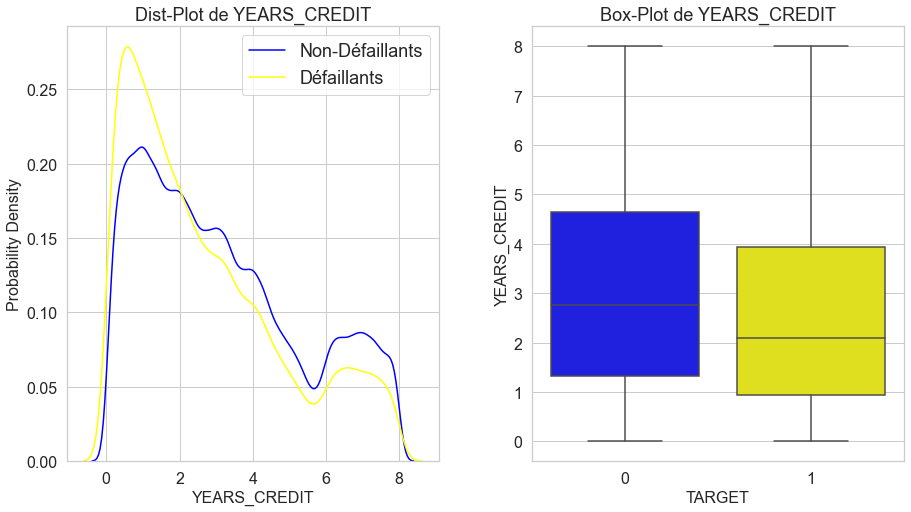

9:80: E501 line too long (121 > 79 characters)


In [87]:
# Transformer en années à partir du nombre de jours
bureau_merged['YEARS_CREDIT'] = \
    bureau_merged['DAYS_CREDIT'] * -1 / 365

# Affiche les quantiles
eda_kernel_fonctions.print_percentiles(bureau_merged, 'YEARS_CREDIT')

# Affiche boxplot, distplot
eda_kernel_fonctions.plot_continuous_variables(bureau_merged, 'YEARS_CREDIT', plots=['distplot', 'box'], figsize=(15, 8))

# Suppression de la variable nouvellement ajoutée
_ = bureau_merged.pop('YEARS_CREDIT')

*****
**Conclusion** :

A partir des graphiques ci-dessus, nous voyons que :

- D'après le PDF, nous constatons que les défaillants ont tendance à avoir des pics plus élevés que les non-défaillants lorsque le nombre d'années est inférieur. Cela implique que les demandeurs qui ont fait une demande de prêt au Bureau de crédit récemment ont montré une plus grande tendance à la défaillance que ceux qui ont fait une demande il y a longtemps. Le PDF des défaillants est également un peu plus à gauche que celui des non-défaillants.

- Sur le boxplot, nous voyons que les défaillants ont généralement moins d'années de crédit que les non-défaillants.
*****

<span>**Variable `DAYS_CREDIT_ENDDATE`**</span>

Cette variable indique la durée restante du crédit du Bureau de crédit au moment de la demande de prêt en crédit immobilier.

_______________________________________________________________________________
Percentile de la variable DAYS_CREDIT_ENDDATE
Percentile 0 = -42060.0
Percentile 2 = -2487.0
Percentile 4 = -2334.0
Percentile 6 = -2202.0
Percentile 8 = -2073.9199999999983
Percentile 10 = -1939.0
Percentile 25 = -1144.0
Percentile 50 = -334.0
Percentile 75 = 473.0
Percentile 100 = 31199.0
_______________________________________________________________________________


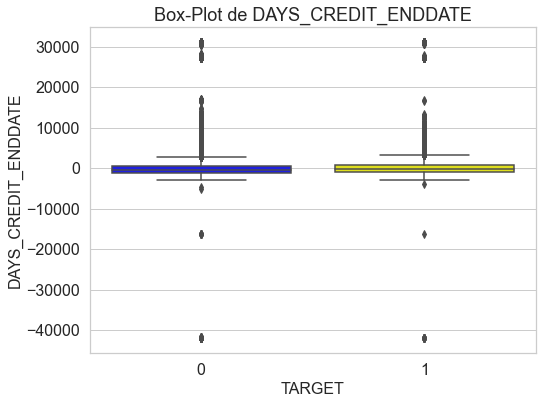

3:80: E501 line too long (114 > 79 characters)
6:80: E501 line too long (115 > 79 characters)


In [88]:
# Affiche les quantiles
eda_kernel_fonctions. \
    print_percentiles(bureau_merged, 'DAYS_CREDIT_ENDDATE', percentiles=list(range(0, 11, 2)) + [25, 50, 75, 100])

# Affiche boxplot
eda_kernel_fonctions.plot_continuous_variables(bureau_merged, 'DAYS_CREDIT_ENDDATE', plots=['box'], figsize=(8, 6))

*****
**Conclusion** :

- À partir des valeurs de quantile ci-dessus, et en regardant le boxplot, nous constatons qu'il semble y avoir une valeur erronée pour `DAYS_CREDIT_ENDDATE`, où la valeur du 0e quantile remonte jusqu'à 42060 jours ou 115 ans. Cela n'a pas beaucoup de sens car cela implique que le précédent prêt du demandeur remonte à 115 ans. 
- Il pourrait également s'agir d'un prêt hérité, mais nous ne pouvons pas nous prononcer à ce sujet.

Nous essaierons d'éliminer ces valeurs lors de l'étape de prétraitement des données.
*****

<span>**Variable `DAYS_ENDDATE_FACT`**</span>

- Cette variable indique le nombre de jours depuis lesquels le crédit du Bureau de Credit a été clôturé au moment de la demande de prêt du crédit immobilier. 
- Ces valeurs ne concernent que les crédits fermés.

_______________________________________________________________________________
Percentile de la variable DAYS_ENDDATE_FACT
Percentile 0 = -42023.0
Percentile 2 = -2561.0
Percentile 4 = -2450.0
Percentile 6 = -2351.0
Percentile 8 = -2265.0
Percentile 10 = -2173.0
Percentile 25 = -1503.0
Percentile 50 = -900.0
Percentile 75 = -427.0
Percentile 100 = 0.0
_______________________________________________________________________________


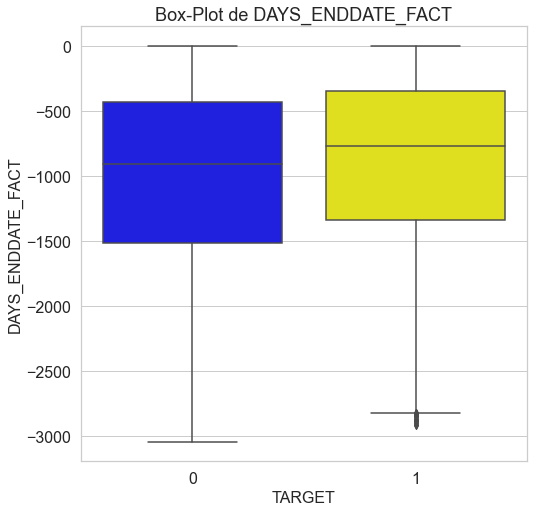

3:80: E501 line too long (112 > 79 characters)
6:80: E501 line too long (113 > 79 characters)
7:80: E501 line too long (124 > 79 characters)
7:100: E127 continuation line over-indented for visual indent


In [89]:
# Affiche les quantiles
eda_kernel_fonctions. \
    print_percentiles(bureau_merged, 'DAYS_ENDDATE_FACT', percentiles=list(range(0, 11, 2)) + [25, 50, 75, 100])

# Affiche boxplot
eda_kernel_fonctions.plot_continuous_variables(bureau_merged, 'DAYS_ENDDATE_FACT', plots=['box'], figsize=(8, 8),
                                                                                                   scale_limits=[-40000, 0])

*****
**Conclusion** :

- Tout comme la colonne précédente, nous constatons que le 0e quantile de cette variable semble également erroné, soit `42023 jours` ou `~115 ans`. Nous devrions supprimer ces valeurs, car elles n'ont pas beaucoup de sens.

- Sur le boxplot, nous voyons que les défaillants ont tendance à avoir un nombre de jours inférieur depuis que leur crédit au Bureau du Crédit a pris fin. 

- Les non-défaillants ont généralement leur crédit précédent terminé plus longtemps avant que les défaillants.
*****

<span>**Variable `DAYS_CREDIT_UPDATE`**</span>

Cette variable indique le nombre de jours depuis lesquels l'information du Bureau de crédit est parvenue au moment de la demande de prêt dans le cadre du crédit immobilier.

_______________________________________________________________________________
Percentile de la variable DAYS_CREDIT_UPDATE
Percentile 0 = -41947.0
Percentile 2 = -2415.0
Percentile 4 = -2213.0
Percentile 6 = -2002.0
Percentile 8 = -1766.0
Percentile 10 = -1582.0
Percentile 25 = -904.0
Percentile 50 = -406.0
Percentile 75 = -33.0
Percentile 100 = 372.0
_______________________________________________________________________________


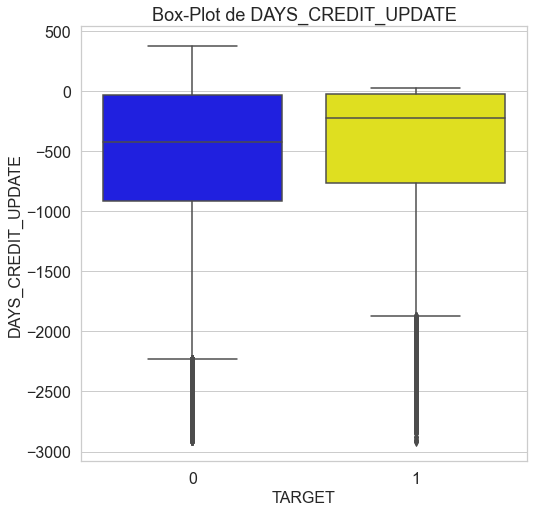

3:80: E501 line too long (113 > 79 characters)
6:80: E501 line too long (114 > 79 characters)
7:80: E501 line too long (123 > 79 characters)
7:97: E127 continuation line over-indented for visual indent


In [90]:
# Affiche les quantiles
eda_kernel_fonctions. \
    print_percentiles(bureau_merged, 'DAYS_CREDIT_UPDATE', percentiles=list(range(0, 11, 2)) + [25, 50, 75, 100])

# Affiche boxplot
eda_kernel_fonctions.plot_continuous_variables(bureau_merged, 'DAYS_CREDIT_UPDATE', plots=['box'], figsize=(8, 8),
                                                                                                scale_limits=[-40000, 400])

*****
**Conclusion** :

- La tendance des valeurs erronées est à nouveau très similaire à celle de la variable des autres jours, où la valeur du 0e quantile semble être erronée.

- De plus, étant donné que seule la valeur du 0e quantile est si étrange, et que le reste semble être correct, cette valeur est donc définitivement erronée. Nous allons également supprimer cette valeur.

- Sur le boxplot, on constate que les défaillants ont tendance à avoir moins de jours depuis la fin de leur crédit auprès du bureau de crédit.

- Leurs valeurs médianes, au 75e centile, sont toutes inférieures à celles des non défaillants.
*****

#### <span>2.4.3. Analyse exploratoire multivariée</span>

<span>**Corrélation entre les variables catégorielles**</span>

**Phi-K Matrix**

_______________________________________________________________________________


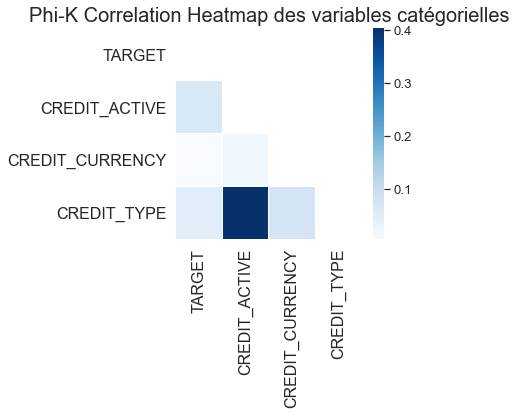

_______________________________________________________________________________
Les catégories présentant les valeurs les plus élevées de la corrélation Phi-K avec la variable cible sont les suivantes :


Variable,Phik-Correlation
CREDIT_ACTIVE,0.0645
CREDIT_TYPE,0.0500
CREDIT_CURRENCY,0.0050


3:80: E501 line too long (96 > 79 characters)


_______________________________________________________________________________


In [91]:
cols_for_phik = ['TARGET', 'CREDIT_ACTIVE', 'CREDIT_CURRENCY', 'CREDIT_TYPE']

eda_kernel_fonctions.plot_phik_matrix(bureau_merged, cols_for_phik, figsize=(6, 6), fontsize=16)

*****
**Conclusion** :

La carte thermique ci-dessus montre les valeurs de corrélation `Phi-K` entre les valeurs catégorielles.

- D'après le coefficient de corrélation Phi-K, nous voyons que la variable `CREDIT_TYPE` présente une certaine association avec la variable `CREDIT_ACTIVE`.

- Nous voyons que les variables catégorielles n'ont pas vraiment une association élevée avec la variable TARGET, en particulier la caractéristique `CREDIT_CURRENCY`.

<span>**Corrélation entre les variables numériques**</span>

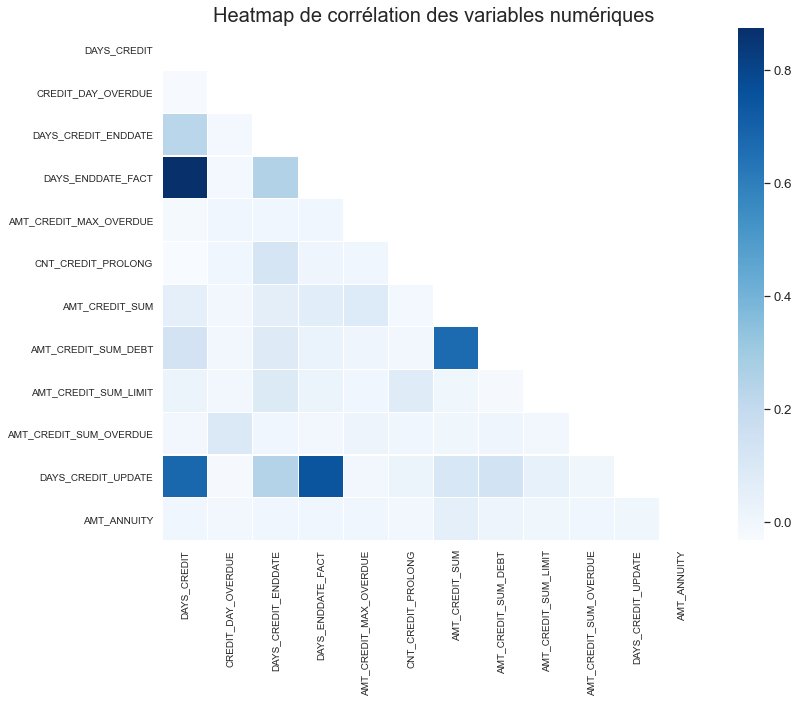

2:80: E501 line too long (122 > 79 characters)


In [92]:
corr_mat = \
    eda_kernel_fonctions.correlation_matrix(bureau_merged, ['SK_ID_CURR', 'SK_ID_BUREAU'], cmap='Blues', figsize=(12, 10))

corr_mat.plot_correlation_matrix()

*****
**Conclusion** :

- La carte thermique ci-dessus montre la corrélation entre chaque variables du dataframe bureau et le reste des variables.
- On peut observer que la plupart de la carte thermique a des couleurs claires, ce qui montre peu ou pas de corrélation.
- Cependant, nous pouvons voir quelques nuances foncées qui représentent une forte corrélation.
- La forte corrélation est particulièrement observée pour les variables :

    - `DAYS_CREDIT` et `DAYS_CREDIT_UPDATE`;
    
    - `DAYS_ENDDATE_FACT` et `DAYS_CREDIT_UPDATE`;
    
    - `AMT_CREDIT_SUM` et `AMT_CREDIT_SUM_DEBT`;
    
    - `DAYS_ENDDATE_FACT` et `DAYS_CREDIT`.
    
- Nous pouvons également constater que les variables ne présentent pas de corrélation particulièrement bonne/élevée avec la variable cible en tant que telle, à l'exception de la variable DAYS_CREDIT. 

Cela implique qu'il n'y a pas de relation linéaire directe entre la cible et les caractéristiques.
*****

### <span>2.5. Fichier `bureau_balance.csv`</span>

- Ce fichier est constitué du solde mensuel de chaque crédit pour chacun des crédits précédents que le demandeur a eu avec des institutions financières autres que Home Credit.

In [93]:
df_var_bureau_bal = \
    HomeCredit_columns_description[HomeCredit_columns_description['Table'] == 'bureau_balance.csv']

df_var_bureau_bal.style.hide_index()

Table,Row,Description,Special
bureau_balance.csv,SK_BUREAU_ID,Recoded ID of Credit Bureau credit (unique coding for each application) - use this to join to CREDIT_BUREAU table,hashed
bureau_balance.csv,MONTHS_BALANCE,Month of balance relative to application date (-1 means the freshest balance date),time only relative to the application
bureau_balance.csv,STATUS,"Status of Credit Bureau loan during the month (active, closed, DPD0-30,… [C means closed, X means status unknown, 0 means no DPD, 1 means maximal did during month between 1-30, 2 means DPD 31-60,… 5 means DPD 120+ or sold or written off ] )",nan


2:80: E501 line too long (99 > 79 characters)


In [94]:
print("_"*79)
print(f'\nLe nombre de SK_ID_BUREAU uniques dans bureau_balance.csv est: {len(bureau_balance.SK_ID_BUREAU.unique())}')
print('_'*79)
print(f'\nLe nombre de valeurs uniques pour STATUS est: {len(bureau_balance.STATUS.unique())}')
print(f"Les valeurs uniques de STATUS sont:\t{bureau_balance.STATUS.unique()}")
print('_'*79)
print(f"\nNombre maximum de mois pour le solde des mois: {np.abs(bureau_balance.MONTHS_BALANCE.min())}")
print('_'*79)

_______________________________________________________________________________

Le nombre de SK_ID_BUREAU uniques dans bureau_balance.csv est: 817395
_______________________________________________________________________________

Le nombre de valeurs uniques pour STATUS est: 8


2:80: E501 line too long (118 > 79 characters)
4:80: E501 line too long (95 > 79 characters)
7:80: E501 line too long (104 > 79 characters)


Les valeurs uniques de STATUS sont:	['C' '0' 'X' '1' '2' '3' '5' '4']
_______________________________________________________________________________

Nombre maximum de mois pour le solde des mois: 96
_______________________________________________________________________________


In [95]:
eda_kernel_fonctions.afficher_stats_basic(bureau_balance, 'bureau_balance')

_______________________________________________________________________________
Le dataset contient 27299925 lignes et 3 variables.
_______________________________________________________________________________
Nombre de valeurs dupliquées dans bureau_balance : 0
_______________________________________________________________________________
Contenu des 3 premières lignes :


,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0,C
1,5715448,-1,C
2,5715448,-2,C
3,5715448,-3,C
4,5715448,-4,C


In [96]:
print("_"*79)
val = len(bureau_balance.SK_ID_BUREAU.unique())
print(f'\nNombre de valeurs uniques SK_ID_BUREAU : {val}')
print('_'*79)
val1 = len(bureau_balance.STATUS.unique())
val2 = bureau_balance.STATUS.unique()
print(f'\nNombre de valeurs uniques STATUS : {val1}')
print(f"Liste des valeurs uniques de STATUS :\t{val2}")
print('_'*79)
val3 = np.abs(bureau_balance.MONTHS_BALANCE.min())
print(f"\nNombre maximal de mois pour le solde des mois : {val3}")
print('_'*79)

_______________________________________________________________________________

Nombre de valeurs uniques SK_ID_BUREAU : 817395
_______________________________________________________________________________

Nombre de valeurs uniques STATUS : 8
Liste des valeurs uniques de STATUS :	['C' '0' 'X' '1' '2' '3' '5' '4']
_______________________________________________________________________________

Nombre maximal de mois pour le solde des mois : 96
_______________________________________________________________________________


____________________________________________________
Type des variables



SK_ID_BUREAU       int64
MONTHS_BALANCE     int64
STATUS            object
dtype: object

,Nombre par type de variable,% des types de variable
int64,2,66.6700
object,1,33.3300


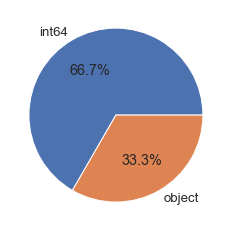

In [97]:
# Types des variables
outils_data.get_types_variables(bureau_balance, True, True, True)

In [98]:
# Résumé des variables
desc_bureau_bal = outils_data.description_variables(bureau_balance)

desc_bureau_bal

,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
type,int64,int64,object
nb_nan,0.0,0.0,0.0
%_nan,0.0,0.0,0.0
count,27299925.0,27299925.0,27299925
unique,NaN,NaN,8
top,NaN,NaN,C
freq,NaN,NaN,13646993
mean,6036297.333,-30.7417,NaN
std,492348.8569,23.8645,NaN
min,5001709.0,-96.0,NaN


*****
**Conclusion** :

- Le fichier bureau_balance.csv contient environ 27,29 millions de lignes et 3 variables.
- Ce fichier contient le statut mensuel de chacun des prêts précédents pour un demandeur particulier, rapporté par le département du Bureau de crédit.
- Il y a 8 valeurs uniques pour le STATUS qui sont codées. Chacune d'entre elles a une signification particulière :
    - `C` signifie `fermé`;
    
    - `X` signifie `statut inconnu`;
    
    - `0` signifie `pas de DPD`;
    
    - `1` signifie `DPD maximal pendant le mois entre 1-30`;
    
    - `2` signifie `DPD 31-60`, ...;
    
    - `5` signifie `DPD 120+ ou vendu ou radié`.
    
- Le solde du mois le plus ancien que nous avons est le statut de 96 mois en arrière, c'est-à-dire que le statut a été fourni jusqu'à 8 ans d'historique pour les prêts pour lesquels ils existent.
*****

<span>**Valeurs manquantes**</span>

Valeurs manquantes : 0 NaN pour 81899775 données (0.0 %)
____________________________________________________
Nombre et % de valeurs manquantes par variable



,Nombres de valeurs manquantes,% de valeurs manquantes


____________________________________________________
Heatmap de visualisation des valeurs manquantes


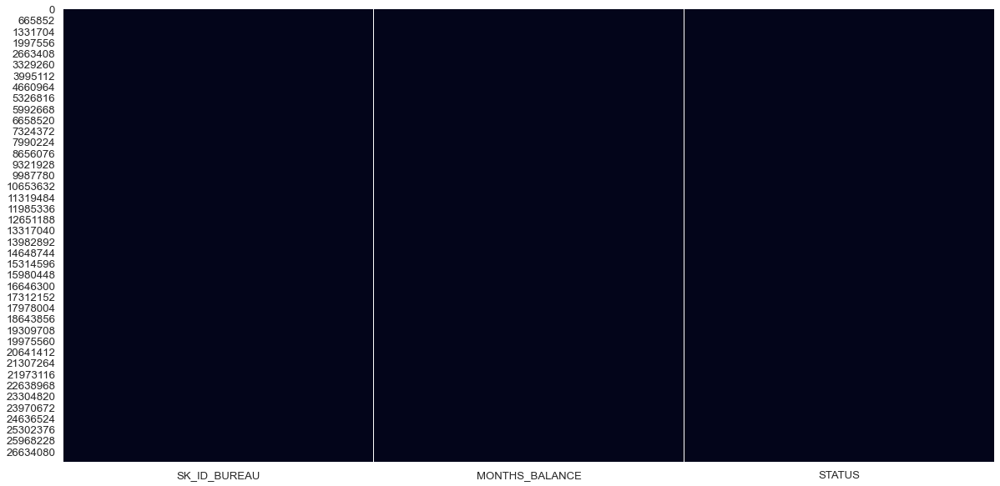

In [99]:
# Valeurs manquantes du dataframe
outils_data.get_missing_values(bureau_balance, True, True)

Aucune donnée manquante!

**Préparation du dataframe de travail**

In [100]:
# Ajout de la variable TARGET pour la répartition défaillants/non-défaillants
print('_'*79)
print('\nCréation dataframe de travail : merge TARGET avec dataframe bureau')
bureau_merged = application_train.iloc[:, :2].merge(bureau, on='SK_ID_CURR', how='left')
print("_"*79)

_______________________________________________________________________________

Création dataframe de travail : merge TARGET avec dataframe bureau


4:80: E501 line too long (88 > 79 characters)


_______________________________________________________________________________


#### <span>2.5.2. Analyse exploratoire univariée</span>

<span>**Distribution des variables catégorielles**</span>


Nous allons maintenant représenter graphiquement certaines des variables catégorielles du dataframe bureau_balance, et voir leur impact sur la variable cible.

In [101]:
# Liste des variables qualitatives
cols_cat_bureau_bal = \
    bureau_balance.select_dtypes(exclude=[np.number]).columns.to_list()

cols_cat_bureau_bal

['STATUS']

<span>**Variable `STATUS`**</span>

Statut du prêt du Bureau du crédit durant le mois (actif ou fermé ou DPD0-30... :

- C signifie fermé,
- X signifie état inconnu,
- 0 signifie pas de DPD,
- 1 signifie DPD maximal durant le mois entre 1-30,
- 2 signifie DPD 31-60...,
- 5 signifie DPD 120+ ou vendu ou amorti.

_______________________________________________________________________________
Les catégories uniques de la variable 'STATUS' sont :
['C' '0' 'X' '1' '2' '3' '5' '4']
_______________________________________________________________________________
Répartition dans chaque catégorie :
C    13646993
0     7499507
X     5810482
1      242347
5       62406
2       23419
3        8924
4        5847
Name: STATUS, dtype: int64
_______________________________________________________________________________
Nombre de catégories uniques pour STATUS = 8


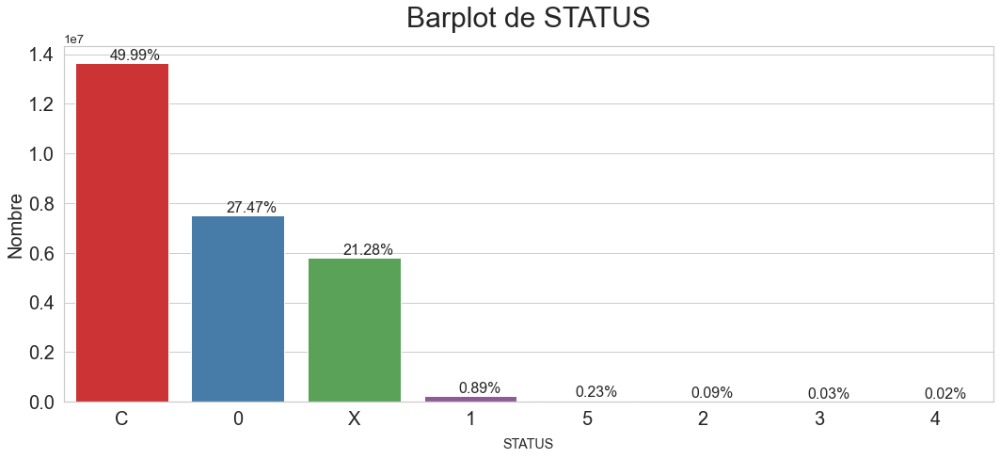

2:80: E501 line too long (88 > 79 characters)
6:80: E501 line too long (111 > 79 characters)
6:112: W291 trailing whitespace
7:80: E501 line too long (124 > 79 characters)
7:105: E127 continuation line over-indented for visual indent


In [102]:
# Voyons d'abord les catégories uniques de 'STATUT'
eda_kernel_fonctions.print_unique_categories(bureau_balance, 'STATUS', show_counts=True)

# Tracer le graphique à barres pour la colonne
eda_kernel_fonctions. \
    plot_categorical_variable_bar(bureau_balance, column_name='STATUS', horizontal_adjust=0.3, figsize=(15, 7), 
                                                                                                        fontsize_percent=16)

*****
**Conclusion** :

- Les états des prêts les plus rencontrés sont :

    - C pour prêt fermé (50%),
    - 0 pour 'pas de DPD' (27,5%),
    - X signifie état inconnu (21%).
    - le reste se partage entre les états 1 à 5.
    
- Plus de 21% des prêts sont dans l'état inconnu.
*****

<span>**Distribution des variables quantitatives**</span>

In [103]:
# Liste des variables quantitatives
cols_num = \
    bureau_balance.select_dtypes(include=[np.number]).columns.to_list()

cols_num

['SK_ID_BUREAU', 'MONTHS_BALANCE']

<span>**Variable `MONTHS_BALANCE`**</span>

- Mois du solde par rapport à la date de la demande :

    - `-1` signifie que l'information correspond à l'instantané mensuel le plus récent;
    
    - `0` signifie que l'information correspond à la date de la demande
    
- Il s'agit souvent de la même valeur que -1 car de nombreuses banques ne mettent pas régulièrement à jour les informations fournies au Bureau de crédit.

_______________________________________________________________________________
Percentile de la variable MONTHS_BALANCE
Percentile 0 = -96.0
Percentile 2 = -87.0
Percentile 4 = -81.0
Percentile 6 = -76.0
Percentile 8 = -72.0
Percentile 10 = -68.0
Percentile 25 = -46.0
Percentile 50 = -25.0
Percentile 75 = -11.0
Percentile 100 = 0.0
_______________________________________________________________________________


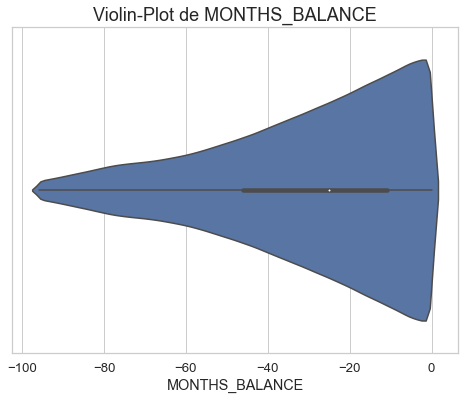

3:80: E501 line too long (110 > 79 characters)
6:80: E501 line too long (113 > 79 characters)


In [104]:
# Affiche les quantiles
eda_kernel_fonctions. \
    print_percentiles(bureau_balance, 'MONTHS_BALANCE', percentiles=list(range(0, 11, 2)) + [25, 50, 75, 100])

# Affiche violinplot
eda_kernel_fonctions.plot_continuous_variable(bureau_balance, 'MONTHS_BALANCE', plots=['violin'], figsize=(8, 6))

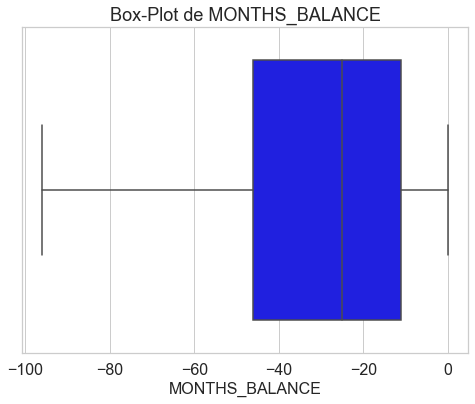

2:80: E501 line too long (110 > 79 characters)


In [105]:
# Affiche boxplot
eda_kernel_fonctions.plot_continuous_variable(bureau_balance, 'MONTHS_BALANCE', plots=['box'], figsize=(8, 6))

- La médiane est à -25 mois.

### <span>2.6. Fichier credit_card_balance.csv</span>

#### <span>2.6.1. Description/statistiques</span>

<span>**Description**</span>

- Ce fichier **`credit_card_balance.csv`** comprend les données mensuelles relatives à une ou plusieurs cartes de crédit que le demandeur avait auprès de Home Credit Group.
- Le fichier contient des champs tels que le solde, la limite de crédit, le montant des prélèvements, etc. pour chaque mois de la carte de crédit.

In [106]:
df_var_ccbal = \
    HomeCredit_columns_description[HomeCredit_columns_description['Table'] == 'credit_card_balance.csv']

df_var_ccbal.style.hide_index()

Table,Row,Description,Special
credit_card_balance.csv,SK_ID_PREV,"ID of previous credit in Home credit related to loan in our sample. (One loan in our sample can have 0,1,2 or more previous loans in Home Credit)",hashed
credit_card_balance.csv,SK_ID_CURR,ID of loan in our sample,hashed
credit_card_balance.csv,MONTHS_BALANCE,Month of balance relative to application date (-1 means the freshest balance date),time only relative to the application
credit_card_balance.csv,AMT_BALANCE,Balance during the month of previous credit,nan
credit_card_balance.csv,AMT_CREDIT_LIMIT_ACTUAL,Credit card limit during the month of the previous credit,nan
credit_card_balance.csv,AMT_DRAWINGS_ATM_CURRENT,Amount drawing at ATM during the month of the previous credit,nan
credit_card_balance.csv,AMT_DRAWINGS_CURRENT,Amount drawing during the month of the previous credit,nan
credit_card_balance.csv,AMT_DRAWINGS_OTHER_CURRENT,Amount of other drawings during the month of the previous credit,nan
credit_card_balance.csv,AMT_DRAWINGS_POS_CURRENT,Amount drawing or buying goods during the month of the previous credit,nan
credit_card_balance.csv,AMT_INST_MIN_REGULARITY,Minimal installment for this month of the previous credit,nan


2:80: E501 line too long (104 > 79 characters)


<span>**Statistiques**</span>

In [107]:
application_train.name = 'application_train'
application_test.name = 'application_test'

cc_balance.name = 'credit_card_balance'
eda_kernel_fonctions. \
    afficher_stats_basic_all(cc_balance, application_train, application_test, 'SK_ID_PREV')

_______________________________________________________________________________
Le dataset contient 3840312 lignes et 23 variables.
_______________________________________________________________________________
Nombre de valeurs uniques SK_ID_PREV dans credit_card_balance.csv : 104307
Nombre de valeurs uniques SK_ID_CURR dans credit_card_balance.csv : 103558
Nombre de valeurs communes SK_ID_CURR dans application_train.csv et credit_card_balance.csv : 86905
Nombre de valeurs communes SK_ID_CURR dans application_train.csv et credit_card_balance.csv : 16653
_______________________________________________________________________________
Nombre de valeurs dupliquées dans credit_card_balance.csv : 0
_______________________________________________________________________________
Contenu des 3 premières lignes :


,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,AMT_PAYMENT_CURRENT,AMT_PAYMENT_TOTAL_CURRENT,AMT_RECEIVABLE_PRINCIPAL,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,2562384,378907,-6,56.970,135000,0.0,877.5,0.0,877.5,1700.325,1800.0,1800.0,0.000,0.000,0.000,0.0,1,0.0,1.0,35.0,Active,0,0
1,2582071,363914,-1,63975.555,45000,2250.0,2250.0,0.0,0.0,2250.000,2250.0,2250.0,60175.080,64875.555,64875.555,1.0,1,0.0,0.0,69.0,Active,0,0
2,1740877,371185,-7,31815.225,450000,0.0,0.0,0.0,0.0,2250.000,2250.0,2250.0,26926.425,31460.085,31460.085,0.0,0,0.0,0.0,30.0,Active,0,0
3,1389973,337855,-4,236572.110,225000,2250.0,2250.0,0.0,0.0,11795.760,11925.0,11925.0,224949.285,233048.970,233048.970,1.0,1,0.0,0.0,10.0,Active,0,0
4,1891521,126868,-1,453919.455,450000,0.0,11547.0,0.0,11547.0,22924.890,27000.0,27000.0,443044.395,453919.455,453919.455,0.0,1,0.0,1.0,101.0,Active,0,0


6:80: E501 line too long (91 > 79 characters)


____________________________________________________
Type des variables



SK_ID_PREV                      int64
SK_ID_CURR                      int64
MONTHS_BALANCE                  int64
AMT_BALANCE                   float64
AMT_CREDIT_LIMIT_ACTUAL         int64
AMT_DRAWINGS_ATM_CURRENT      float64
AMT_DRAWINGS_CURRENT          float64
AMT_DRAWINGS_OTHER_CURRENT    float64
AMT_DRAWINGS_POS_CURRENT      float64
AMT_INST_MIN_REGULARITY       float64
AMT_PAYMENT_CURRENT           float64
AMT_PAYMENT_TOTAL_CURRENT     float64
AMT_RECEIVABLE_PRINCIPAL      float64
AMT_RECIVABLE                 float64
AMT_TOTAL_RECEIVABLE          float64
CNT_DRAWINGS_ATM_CURRENT      float64
CNT_DRAWINGS_CURRENT            int64
CNT_DRAWINGS_OTHER_CURRENT    float64
CNT_DRAWINGS_POS_CURRENT      float64
CNT_INSTALMENT_MATURE_CUM     float64
NAME_CONTRACT_STATUS           object
SK_DPD                          int64
SK_DPD_DEF                      int64
dtype: object

,Nombre par type de variable,% des types de variable
float64,15,65.2200
int64,7,30.4300
object,1,4.3500


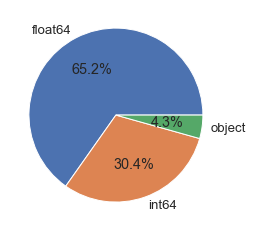

In [108]:
# Types des variables
outils_data.get_types_variables(cc_balance, True, True, True)

In [109]:
# Résumé des variables
desc_bureau = outils_data.description_variables(cc_balance)

desc_bureau

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,AMT_PAYMENT_CURRENT,AMT_PAYMENT_TOTAL_CURRENT,AMT_RECEIVABLE_PRINCIPAL,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
type,int64,int64,int64,float64,int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,int64,float64,float64,float64,object,int64,int64
nb_nan,0.0,0.0,0.0,0.0,0.0,749816.0,0.0,749816.0,749816.0,305236.0,767988.0,0.0,0.0,0.0,0.0,749816.0,0.0,749816.0,749816.0,305236.0,0.0,0.0,0.0
%_nan,0.0,0.0,0.0,0.0,0.0,0.8489,0.0,0.8489,0.8489,0.3456,0.8695,0.0,0.0,0.0,0.0,0.8489,0.0,0.8489,0.8489,0.3456,0.0,0.0,0.0
count,3840312.0,3840312.0,3840312.0,3840312.0,3840312.0,3090496.0,3840312.0,3090496.0,3090496.0,3535076.0,3072324.0,3840312.0,3840312.0,3840312.0,3840312.0,3090496.0,3840312.0,3090496.0,3090496.0,3535076.0,3840312,3840312.0,3840312.0
unique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7,NaN,NaN
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Active,NaN,NaN
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3698436,NaN,NaN
mean,1904503.5899,278324.2073,-34.5219,58300.1553,153807.9574,5961.3248,7433.3882,288.1696,2968.8048,3540.2041,10280.5377,7588.8567,55965.8769,58088.8112,58098.2855,0.3094,0.7031,0.0048,0.5595,20.8251,NaN,9.2837,0.3316
std,536469.4706,102704.4751,26.6678,106307.031,165145.6995,28225.6886,33846.0773,8201.9893,20796.887,5600.1541,36078.085,32005.9878,102533.6168,105965.3699,105971.8011,1.1004,3.1903,0.0826,3.2406,20.0515,NaN,97.5157,21.4792
min,1000018.0,100006.0,-96.0,-420250.185,0.0,-6827.31,-6211.62,0.0,0.0,0.0,0.0,0.0,-423305.82,-420250.185,-420250.185,0.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0


***
**Conclusion** :

- Il y a environ 3,84 millions de lignes dans le fichier credit_card_balance.csv, chacune d'entre elles correspondant au statut mensuel de la carte de crédit que le demandeur avait auprès de Home Credit Group.
- Cette table contient 23 variables qui contiennent les statistiques sur le statut de la carte de crédit de chaque mois, comme le montant du solde, le montant des retraits, le nombre de retraits, le statut, etc.
- Il y a 104300 cartes de crédit uniques dont les détails figurent dans ce tableau.
- Sur ces 104300, il y a 103500 SK_ID_CURR uniques.
- Cela signifie que la plupart des demandeurs n'avaient qu'une seule carte de crédit avec eux, et que seuls quelques-uns en avaient plus d'une.
- Ces SK_ID_CURR sont les ID des demandeurs qui ont actuellement demandé un prêt.
- Sur les 103000 SK_ID_CURR uniques, 86900 de ces demandeurs appartiennent à l'ensemble de formation et 16600 à l'ensemble de demandes de test.
- Sur les 307000 demandeurs du fichier application_train.csv, seuls 86900 d'entre eux avaient déjà une carte de crédit avec Home Credit Group.
*****

<span>**Valeurs manquantes**</span>

Valeurs manquantes : 5877356 NaN pour 88327176 données (6.65 %)
____________________________________________________
Nombre et % de valeurs manquantes par variable



,Nombres de valeurs manquantes,% de valeurs manquantes
AMT_PAYMENT_CURRENT,767988,20.0000
AMT_DRAWINGS_ATM_CURRENT,749816,19.5200
AMT_DRAWINGS_OTHER_CURRENT,749816,19.5200
AMT_DRAWINGS_POS_CURRENT,749816,19.5200
CNT_DRAWINGS_ATM_CURRENT,749816,19.5200
CNT_DRAWINGS_OTHER_CURRENT,749816,19.5200
CNT_DRAWINGS_POS_CURRENT,749816,19.5200
AMT_INST_MIN_REGULARITY,305236,7.9500
CNT_INSTALMENT_MATURE_CUM,305236,7.9500


____________________________________________________
Heatmap de visualisation des valeurs manquantes


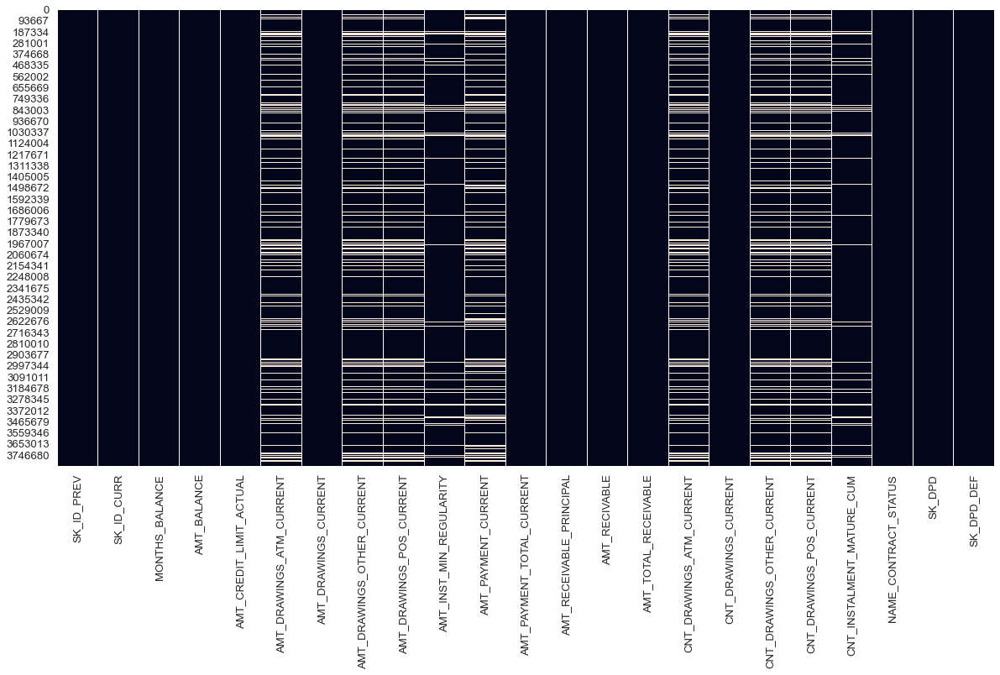

In [110]:
# Valeurs manquantes dans le dataframe
outils_data.get_missing_values(cc_balance, True, True)

Nombre de variables avec valeurs manquantes : 9


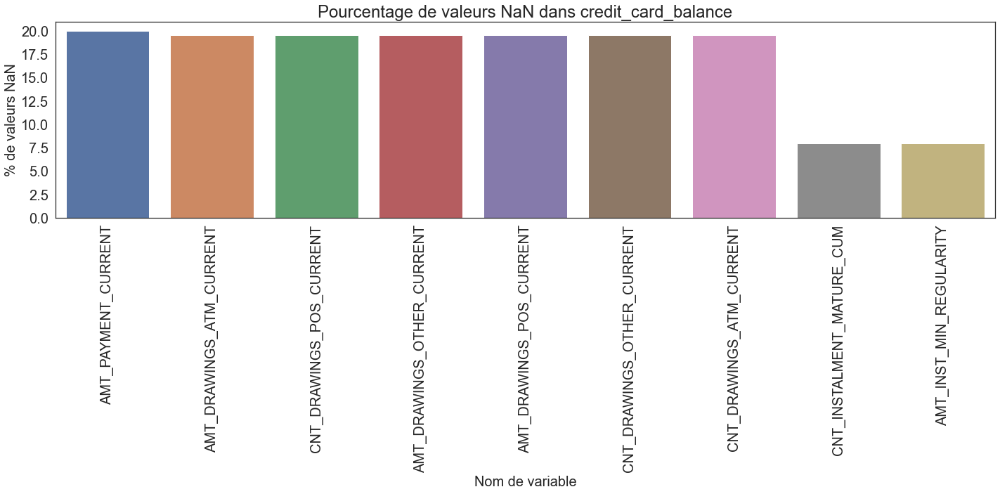

3:80: E501 line too long (117 > 79 characters)


In [111]:
# Réprésentation visuelle des valeurs manquantes
df_nan_ccbal = eda_kernel_fonctions.nan_df_create(cc_balance)
eda_kernel_fonctions.plot_nan_percent(df_nan_ccbal, 'credit_card_balance', grid=False, fontsize=20, figsize=(20, 10))

*****
**Conclusion** :

- Sur les 23 variables, 9 d'entre elles contiennent des valeurs NaN.
- Si nous regardons les pourcentages de valeurs NaN, ils sont considérablement inférieurs au reste des tableaux que nous avons vus jusqu'à présent.
- 7 de ces variables ont près de 20% de valeurs NaN.
- Ces variables sont principalement liées aux montants des tirages et aux nombres de tirages.
- Les deux autres caractéristiques sont liées aux statistiques sur les versements.
*****

**Préparation du dataframe de travail**

In [112]:
# Ajout de la variable TARGET pour la répartition défaillants/non-défaillants
print('_'*79)
print('\nCréation dataframe de travail : merge TARGET avec dataframe cc_balance')
cc_balance_merged = application_train.iloc[:, :2].merge(cc_balance, on='SK_ID_CURR', how='left')
print("_"*79)

_______________________________________________________________________________

Création dataframe de travail : merge TARGET avec dataframe cc_balance


3:80: E501 line too long (81 > 79 characters)
4:80: E501 line too long (96 > 79 characters)


_______________________________________________________________________________


#### <span>2.6.2. Analyse exploratoire univariée</span>

<span>**Distribution des variables catégorielles**</span>

Nous allons maintenant représenter graphiquement certaines des variables catégorielles du dataframe `credit_card_balance.csv`, et voir leur impact sur la variable cible.

In [113]:
# Liste des variables qualitatives
cols_cat_ccbal = \
    cc_balance_merged.select_dtypes(exclude=[np.number]).columns.to_list()

cols_cat_ccbal

['NAME_CONTRACT_STATUS']

<span>**Variable `NAME_CONTRACT_STATUS`**</span>

État du contrat au cours du mois

_______________________________________________________________________________
Les catégories uniques de la variable 'NAME_CONTRACT_STATUS' sont :
[nan 'Active' 'Completed' 'Signed' 'Sent proposal' 'Refused' 'Demand'
 'Approved']
_______________________________________________________________________________
Répartition dans chaque catégorie :
Active           3116673
Completed         100031
Signed              9939
Demand               843
Sent proposal        460
Refused               14
Approved               5
Name: NAME_CONTRACT_STATUS, dtype: int64
_______________________________________________________________________________
Nombre de catégories uniques pour NAME_CONTRACT_STATUS = 8


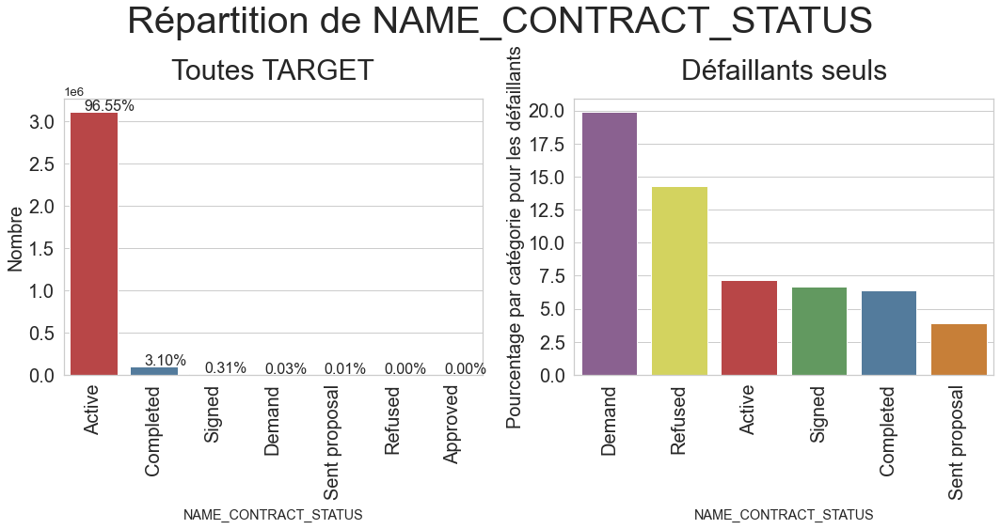

2:80: E501 line too long (105 > 79 characters)
6:80: E501 line too long (119 > 79 characters)
7:80: E501 line too long (114 > 79 characters)
7:92: E127 continuation line over-indented for visual indent
8:80: E501 line too long (111 > 79 characters)
8:92: E127 continuation line over-indented for visual indent
9:80: E501 line too long (122 > 79 characters)
9:92: E127 continuation line over-indented for visual indent
10:80: E501 line too long (122 > 79 characters)
11:80: E501 line too long (122 > 79 characters)
12:80: E501 line too long (112 > 79 characters)
13:80: E501 line too long (122 > 79 characters)
13:92: E127 continuation line over-indented for visual indent
14:80: E501 line too long (122 > 79 characters)
15:80: E501 line too long (123 > 79 characters)


In [114]:
# Voyons d'abord les catégories uniques de 'NAME_CONTRACT_STATUS'
eda_kernel_fonctions.print_unique_categories(cc_balance_merged, 'NAME_CONTRACT_STATUS', show_counts=True)

# Tracer le graphique à barres pour la colonne
eda_kernel_fonctions. \
    plot_categorical_variables_bar(cc_balance_merged, column_name='NAME_CONTRACT_STATUS', figsize=(15, 8), rotation=90,
                                                                                           horizontal_adjust=0.25,
                                                                                           fontsize_percent=16,
                                                                                           palette1=['#cb3335', '#477ca8',
                                                                                                     '#59a257', '#905998',
                                                                                                     '#df7f20', '#e6e64c',
                                                                                                     '#965a38'],
                                                                                           palette2=['#905998', '#e6e64c',
                                                                                                     '#cb3335', '#59a257',
                                                                                                     '#477ca8', '#df7f20'])

****
**Conclusion** :

- La majorité des états des contrats des prêts sont Actif ou Terminé.
- Pour les défaillants, l'état des contrat sont demandé, réfusé puis actif ou signé.
- Les non-défaillants ont plus de prêts actifs que les défaillants.
*****

<span>**Distribution des variables quantitatives**</span>

In [115]:
# Liste des variables quantitatives
cols_num = \
    cc_balance_merged.select_dtypes(include=[np.number]).columns.to_list()

cols_num

['SK_ID_CURR',
 'TARGET',
 'SK_ID_PREV',
 'MONTHS_BALANCE',
 'AMT_BALANCE',
 'AMT_CREDIT_LIMIT_ACTUAL',
 'AMT_DRAWINGS_ATM_CURRENT',
 'AMT_DRAWINGS_CURRENT',
 'AMT_DRAWINGS_OTHER_CURRENT',
 'AMT_DRAWINGS_POS_CURRENT',
 'AMT_INST_MIN_REGULARITY',
 'AMT_PAYMENT_CURRENT',
 'AMT_PAYMENT_TOTAL_CURRENT',
 'AMT_RECEIVABLE_PRINCIPAL',
 'AMT_RECIVABLE',
 'AMT_TOTAL_RECEIVABLE',
 'CNT_DRAWINGS_ATM_CURRENT',
 'CNT_DRAWINGS_CURRENT',
 'CNT_DRAWINGS_OTHER_CURRENT',
 'CNT_DRAWINGS_POS_CURRENT',
 'CNT_INSTALMENT_MATURE_CUM',
 'SK_DPD',
 'SK_DPD_DEF']

Tout d'abord, nous allons regrouper par le champ '`SK_ID_PREV`' et agréger avec la moyenne, afin d'obtenir une ligne moyenne pour chacun des prêts précédents du demandeur.

In [116]:
cc_balance_merged = cc_balance_merged.groupby('SK_ID_PREV').mean()

<span>**Variable `AMT_BALANCE`**</span>

Cette variable indique le montant moyen du solde qu'une personne avait habituellement sur son compte de carte de crédit pour le prêt précédent.

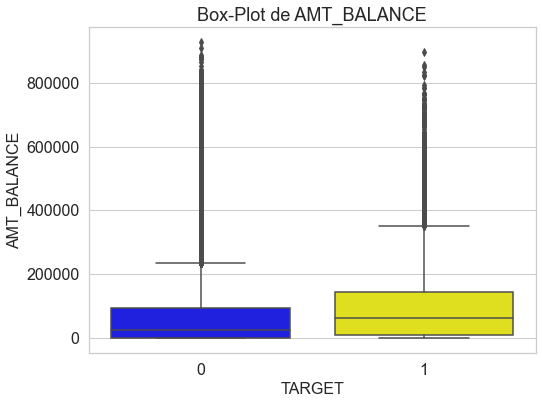

2:80: E501 line too long (111 > 79 characters)


In [117]:
# Affiche boxplot
eda_kernel_fonctions.plot_continuous_variables(cc_balance_merged, 'AMT_BALANCE', plots=['box'], figsize=(8, 6))

*****
**Conclusion** :

- Le graphique ci-dessus montre que les défaillants ont une valeur d'AMT_BALANCE plus élevée que les non-défaillants. Ils présentent des valeurs plus élevées pour tous les quantiles et même pour les moustaches. Cela pourrait signifier que le montant du crédit pour les défaillants pourrait aussi être relativement plus élevé que pour les non-défaillants.


- Nous constatons que les défaillants semblent ici aussi avoir un versement minimum plus élevé chaque mois par rapport aux non défaillants. Cela renseigne généralement sur les habitudes de dépense et d'emprunt des personnes. Les défaillants ont des habitudes de dépenses et d'emprunt plus élevées que les non défaillants.
*****

<span>**Variable `AMT_TOTAL_RECEIVABLE`**</span>

Cette variable décrit la moyenne du montant total à recevoir sur le crédit précédent.

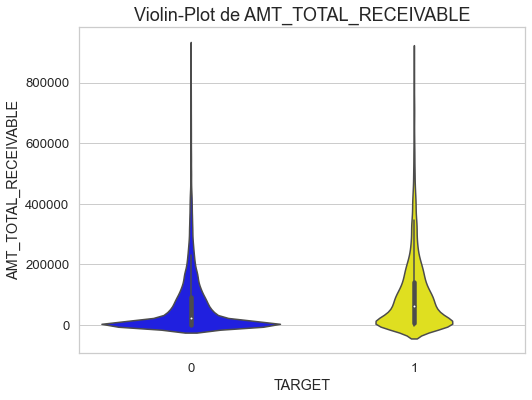

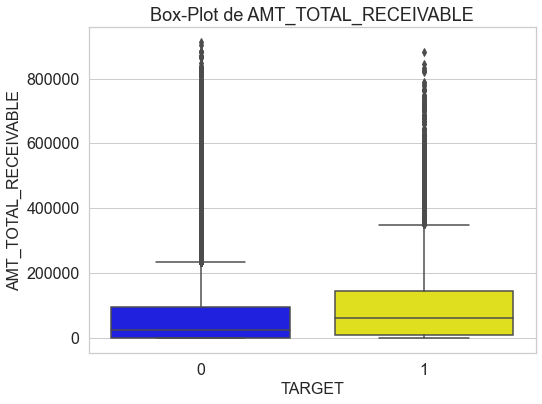

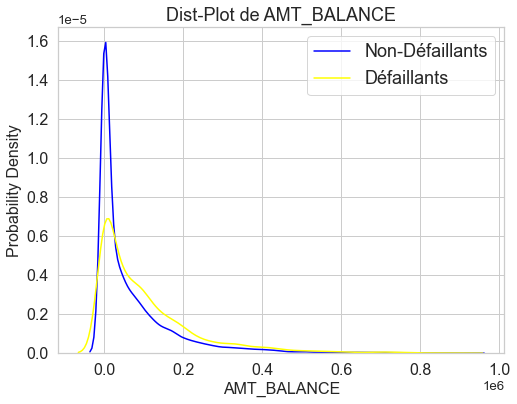

2:80: E501 line too long (123 > 79 characters)
5:80: E501 line too long (120 > 79 characters)
8:80: E501 line too long (116 > 79 characters)


In [118]:
# Affiche Violinplot
eda_kernel_fonctions.plot_continuous_variables(cc_balance_merged, 'AMT_TOTAL_RECEIVABLE', plots=['violin'], figsize=(8, 6))

# Affiche Boxplot
eda_kernel_fonctions.plot_continuous_variables(cc_balance_merged, 'AMT_TOTAL_RECEIVABLE', plots=['box'], figsize=(8, 6))

# Affiche PDF
eda_kernel_fonctions.plot_continuous_variables(cc_balance_merged, 'AMT_BALANCE', plots=['distplot'], figsize=(8, 6))

*****
**Conclusion** :

- En regardant le boxplot d'AMT_TOTAL_RECEIVABLE, nous constatons un comportement similaire à celui observé pour les autres montants, à savoir que les défaillants ont généralement un montant à recevoir plus élevé pour leur crédit précédent, ce qui peut impliquer des montants plus élevés de crédits qu'ils ont pu prendre.


- Le PDF montre également un pic très élevé à des montants inférieurs pour les non-défaillants par rapport aux défaillants.
*****

<span>**Variable `CNT_INSTALMENT_MATURE_CUM`**</span>

La variable décrit le nombre moyen de versements effectués sur les crédits précédents.

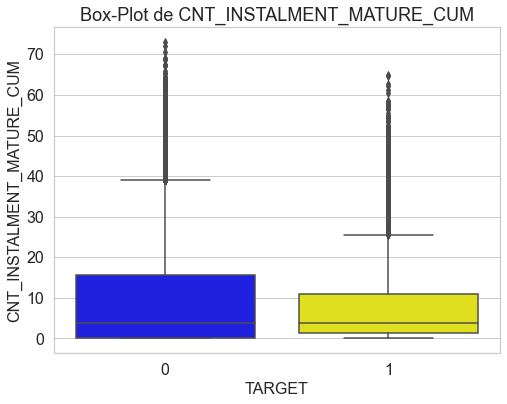

2:80: E501 line too long (125 > 79 characters)


In [119]:
# Affiche Boxplot
eda_kernel_fonctions.plot_continuous_variables(cc_balance_merged, 'CNT_INSTALMENT_MATURE_CUM', plots=['box'], figsize=(8, 6))

*****
**Conclusion** :

Le graphique ci-dessus montre un comportement très intéressant. Ce graphique montre que les non-défaillants ont généralement une fourchette de valeurs plus élevée pour le nombre de versements payés que les défaillants. Cela pourrait montrer le comportement des défaillants, qui paient généralement moins d'acomptes sur leur crédit précédent.
*****

<span>**Variable `MONTHS_BALANCE`**</span>

Mois du solde par rapport à la date d'application (`-1` correspond à la date de solde la plus récente).

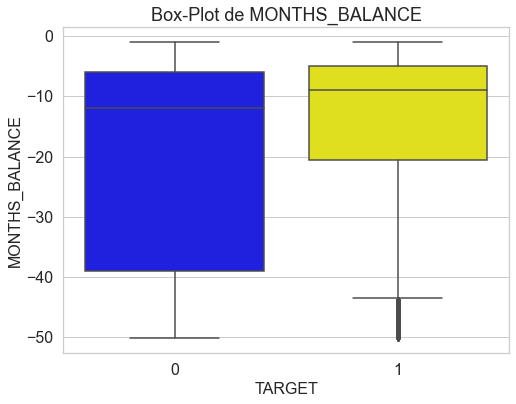

2:80: E501 line too long (114 > 79 characters)


In [120]:
# Affiche Boxplot
eda_kernel_fonctions.plot_continuous_variables(cc_balance_merged, 'MONTHS_BALANCE', plots=['box'], figsize=(8, 6))

- Le mois du solde des défaillants sont plus récent que celui des non-défaillants.

<span>**Variable `AMT_CREDIT_LIMIT_ACTUAL`**</span>

Limite de la carte de crédit au cours du mois du crédit précédent.

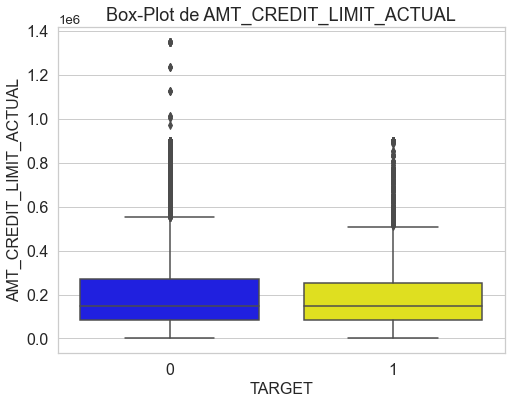

2:80: E501 line too long (123 > 79 characters)


In [121]:
# Affiche Boxplot
eda_kernel_fonctions.plot_continuous_variables(cc_balance_merged, 'AMT_CREDIT_LIMIT_ACTUAL', plots=['box'], figsize=(8, 6))

- La limite de la carte de crédit est légèrement inférieure pour les non-défailants.

<span>**Variable `AMT_DRAWINGS_ATM_CURRENT`**</span>

Montant retiré au guichet automatique pendant le mois du crédit précédent.

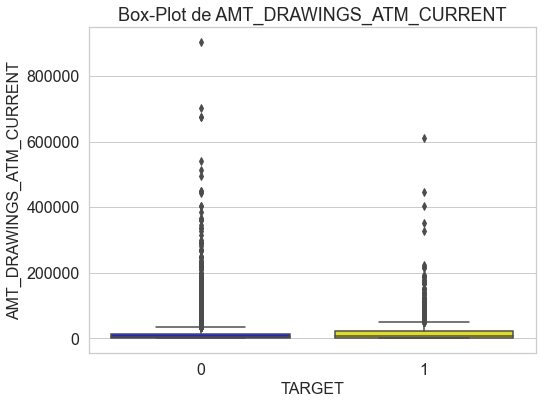

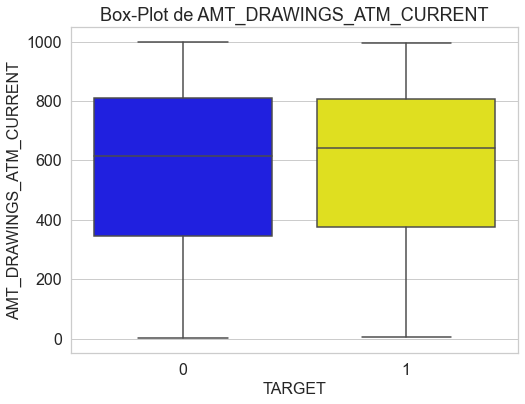

2:80: E501 line too long (124 > 79 characters)
5:80: E501 line too long (108 > 79 characters)
6:80: E501 line too long (124 > 79 characters)
6:86: E127 continuation line over-indented for visual indent


In [122]:
# Affiche Boxplot
eda_kernel_fonctions.plot_continuous_variables(cc_balance_merged, 'AMT_DRAWINGS_ATM_CURRENT', plots=['box'], figsize=(8, 6))

# Zoom
eda_kernel_fonctions.plot_continuous_variables(cc_balance_merged, 'AMT_DRAWINGS_ATM_CURRENT', plots=['box'],
                                                                                     figsize=(8, 6), scale_limits=[0, 1000])

- Le montant retiré au guichet automatique pendant le mois du crédit précédent est légèrement supérieur pour les défaillants que les non-défaillants.

<span>**Variable `AMT_DRAWINGS_CURRENT`**</span>

Montant prélevé au cours du mois du crédit précédent.

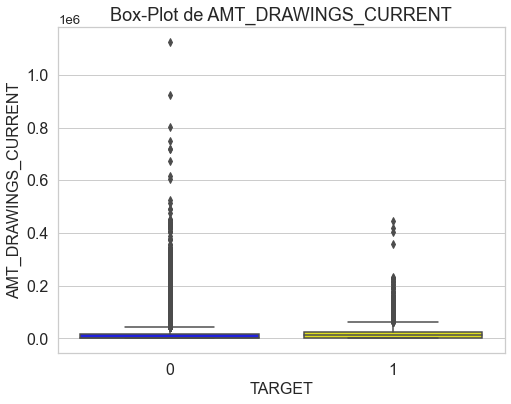

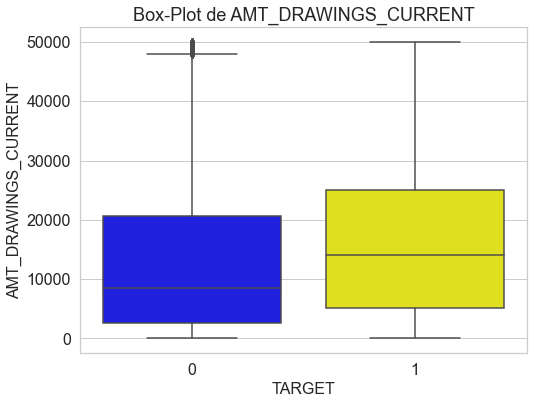

3:80: E501 line too long (101 > 79 characters)
5:80: E501 line too long (104 > 79 characters)
6:80: E501 line too long (124 > 79 characters)
6:84: E127 continuation line over-indented for visual indent


In [123]:
# Affiche Boxplot
eda_kernel_fonctions.plot_continuous_variables(cc_balance_merged,
                                               'AMT_DRAWINGS_CURRENT', plots=['box'], figsize=(8, 6))
# Zoom
eda_kernel_fonctions.plot_continuous_variables(cc_balance_merged, 'AMT_DRAWINGS_CURRENT', plots=['box'],
                                                                                   figsize=(8, 6), scale_limits=[0, 0.05e6])

- Le montant prélevé au cours du mois du crédit précédent est supérieur pour les défaillants que pour les non-défaillants. Les défaillants font plus de dépenses que les non-défaillants.

<span>**Variable `AMT_DRAWINGS_OTHER_CURRENT`**</span>

Montant des autres prélèvements au cours du mois du crédit précédent

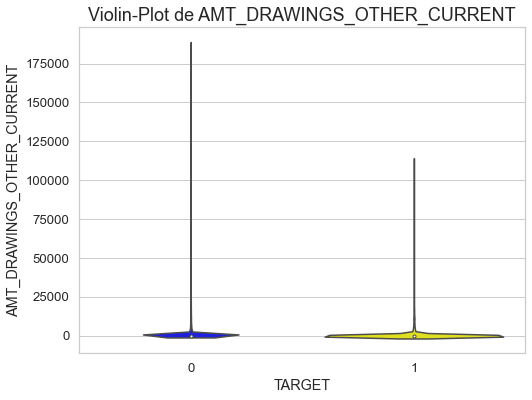

3:80: E501 line too long (110 > 79 characters)


In [124]:
# Affiche Violinplot
eda_kernel_fonctions.plot_continuous_variables(cc_balance_merged,
                                               'AMT_DRAWINGS_OTHER_CURRENT', plots=['violin'], figsize=(8, 6))

 - Plus de petits montants prélevés pour défaillants que les non-défaillants.

<span>**Variable `AMT_DRAWINGS_POS_CURRENT`**</span>

Montant des prélèvements ou des achats de marchandises au cours du mois du crédit précédent.

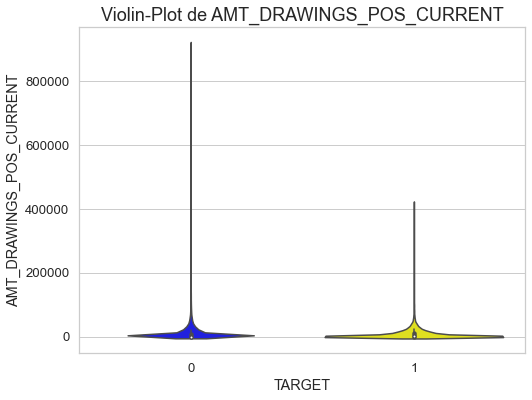

2:80: E501 line too long (111 > 79 characters)
3:80: E501 line too long (123 > 79 characters)
3:109: E127 continuation line over-indented for visual indent


In [125]:
# Affiche Violinplot
eda_kernel_fonctions.plot_continuous_variables(cc_balance_merged, 'AMT_DRAWINGS_POS_CURRENT', plots=['violin'],
                                                                                                            figsize=(8, 6))

- Les petits montants des prélèvements ou des achats de marchandises au cours du mois de la crédibilité précédente sont plus nombreux pour les défaillants et inversement.

<span>**Variable `AMT_INST_MIN_REGULARITY`**</span>

Versement minimal pour ce mois du crédit précédent.

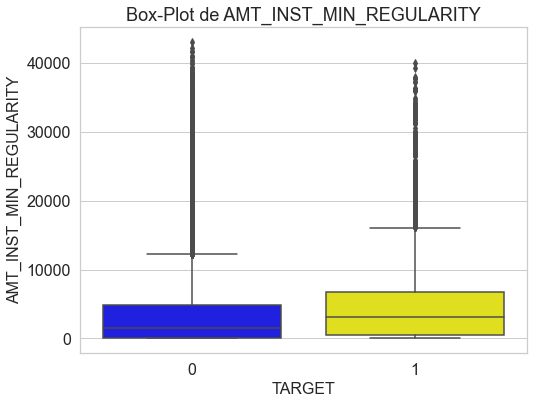

2:80: E501 line too long (107 > 79 characters)
3:80: E501 line too long (119 > 79 characters)
3:105: E127 continuation line over-indented for visual indent


In [126]:
# Affiche Boxplot
eda_kernel_fonctions.plot_continuous_variables(cc_balance_merged, 'AMT_INST_MIN_REGULARITY', plots=['box'],
                                                                                                        figsize=(8, 6))

- Le versement minimal est plus important pour les non-défaillants.

<span>**Variable `AMT_PAYMENT_CURRENT`**</span>

Combien le demandeur a-t-il payé pendant le mois sur le crédit précédent ?

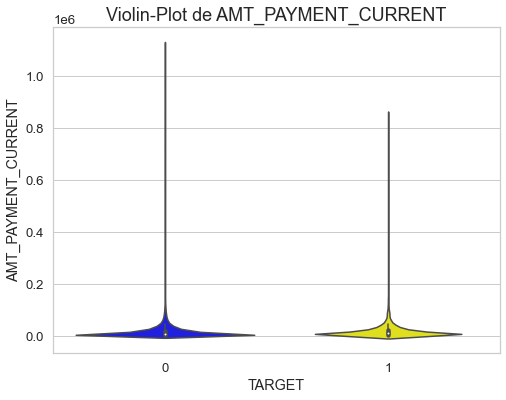

2:80: E501 line too long (106 > 79 characters)
3:80: E501 line too long (118 > 79 characters)
3:104: E127 continuation line over-indented for visual indent


In [127]:
# Affiche Violinplot
eda_kernel_fonctions.plot_continuous_variables(cc_balance_merged, 'AMT_PAYMENT_CURRENT', plots=['violin'],
                                                                                                       figsize=(8, 6))

- Peu des différences entre les défaillants ou non.
- Un outlier avec paiement > 4000000 à supprimer.

<span>**Variable `AMT_PAYMENT_TOTAL_CURRENT`**</span>

Combien le demandeur a-t-il payé au total pendant le mois sur le crédit précédent ?

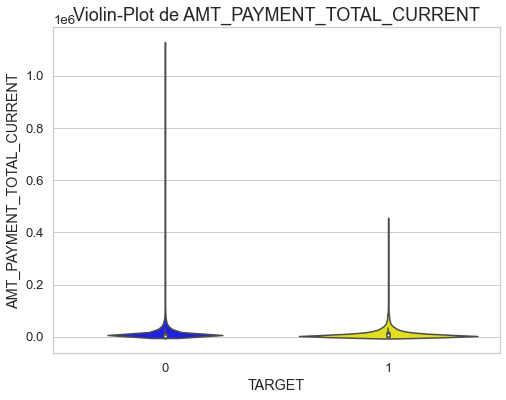

2:80: E501 line too long (112 > 79 characters)
3:80: E501 line too long (122 > 79 characters)
3:108: E127 continuation line over-indented for visual indent


In [128]:
# Affiche Violinplot
eda_kernel_fonctions.plot_continuous_variables(cc_balance_merged, 'AMT_PAYMENT_TOTAL_CURRENT', plots=['violin'],
                                                                                                           figsize=(8, 6))

- Les demandeurs non-défaillants ont payé plus au total pendant le mois sur le crédit précédent que les défaillants.

<span>**Variable `AMT_RECEIVABLE_PRINCIPAL`**</span>

Montant à recevoir pour le principal du crédit précédent.

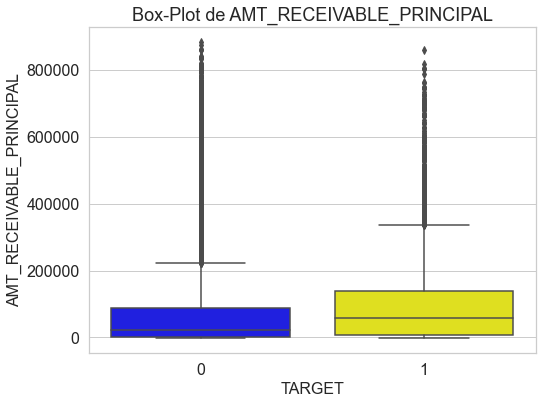

2:80: E501 line too long (108 > 79 characters)
3:80: E501 line too long (118 > 79 characters)
3:104: E127 continuation line over-indented for visual indent


In [129]:
# Affiche Boxplot
eda_kernel_fonctions.plot_continuous_variables(cc_balance_merged, 'AMT_RECEIVABLE_PRINCIPAL', plots=['box'],
                                                                                                       figsize=(8, 6))

- Le montant à recevoir pour le principal du crédit précédent est bien supérieur pour les non-défaillants que les défaillants.

<span>**Variable `AMT_RECIVABLE`**</span>

Montant à recevoir sur le crédit précédent.

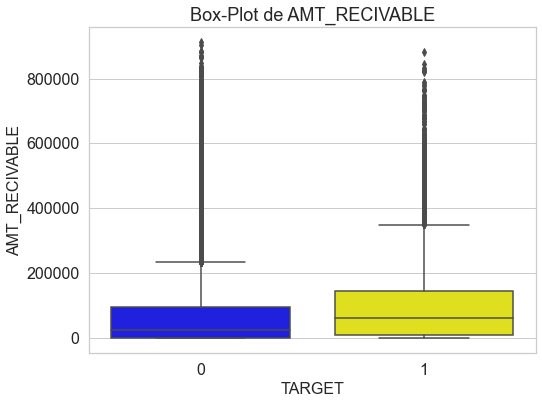

2:80: E501 line too long (113 > 79 characters)


In [130]:
# Affiche Boxplot
eda_kernel_fonctions.plot_continuous_variables(cc_balance_merged, 'AMT_RECIVABLE', plots=['box'], figsize=(8, 6))

- Le montant à recevoir sur le crédit précédent est bien supérieur pour les non-défaillants que les défaillants.

<span>**Variable `CNT_DRAWINGS_ATM_CURRENT`**</span>

Nombre de retraits au guichet automatique durant ce mois sur le crédit précédent.

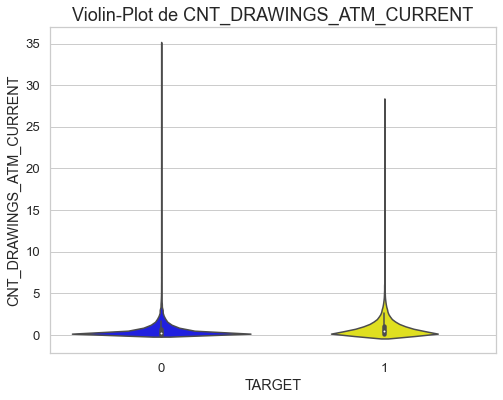

2:80: E501 line too long (111 > 79 characters)
3:80: E501 line too long (122 > 79 characters)
3:108: E127 continuation line over-indented for visual indent


In [131]:
# Affiche Violinplot
eda_kernel_fonctions.plot_continuous_variables(cc_balance_merged, 'CNT_DRAWINGS_ATM_CURRENT', plots=['violin'],
                                                                                                           figsize=(8, 6))

- Un peu moins de retraits automatiques pour les défaillants.

<span>**Variable `CNT_DRAWINGS_CURRENT`**</span>

Nombre de retraits pendant ce mois sur le crédit précédent.

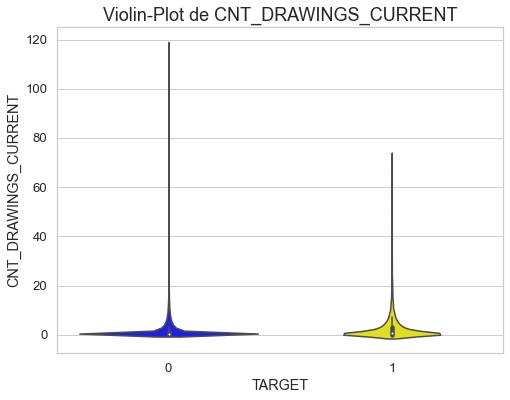

2:80: E501 line too long (123 > 79 characters)


In [132]:
# Affiche Violinplot
eda_kernel_fonctions.plot_continuous_variables(cc_balance_merged, 'CNT_DRAWINGS_CURRENT', plots=['violin'], figsize=(8, 6))

- Le nombre de retraits pendant ce mois sur le crédit précédent est plus important pour les non-défaillants.

<span>**Variable `CNT_DRAWINGS_OTHER_CURRENT`**</span>

Nombre d'autres retraits au cours de ce mois sur le crédit précédent.

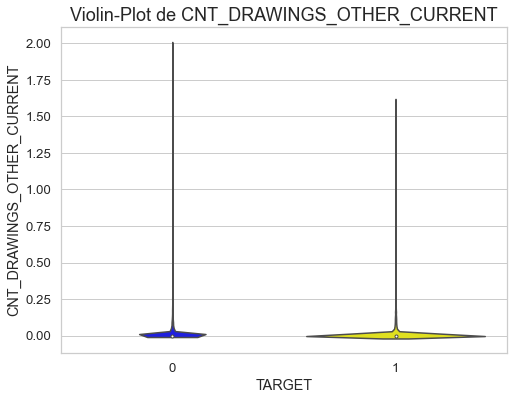

2:80: E501 line too long (113 > 79 characters)
3:80: E501 line too long (122 > 79 characters)
3:108: E127 continuation line over-indented for visual indent


In [133]:
# Affiche Violinplot
eda_kernel_fonctions.plot_continuous_variables(cc_balance_merged, 'CNT_DRAWINGS_OTHER_CURRENT', plots=['violin'],
                                                                                                           figsize=(8, 6))

- Le nombre d'autres retraits au cours de ce mois sur le crédit précédent est plus nombreux pour les défaillants.

<span>**Variable `CNT_DRAWINGS_POS_CURRENT`**</span>

Nombre de retraits de marchandises durant ce mois sur le crédit précédent.

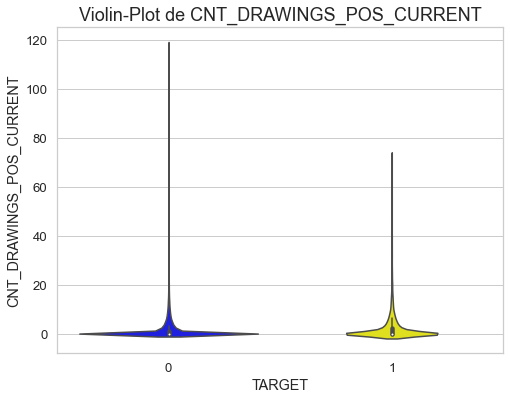

2:80: E501 line too long (111 > 79 characters)
3:80: E501 line too long (122 > 79 characters)
3:108: E127 continuation line over-indented for visual indent


In [134]:
# Affiche Violinplot
eda_kernel_fonctions.plot_continuous_variables(cc_balance_merged, 'CNT_DRAWINGS_POS_CURRENT', plots=['violin'],
                                                                                                           figsize=(8, 6))

- Le nombre de retraits de marchandises durant ce mois sur le crédit précédent est plus nombreux pour les non-défaillants.

<span>**Variable `SK_DPD`**</span>

DPD (jours de retard) au cours du mois sur le crédit précédent.

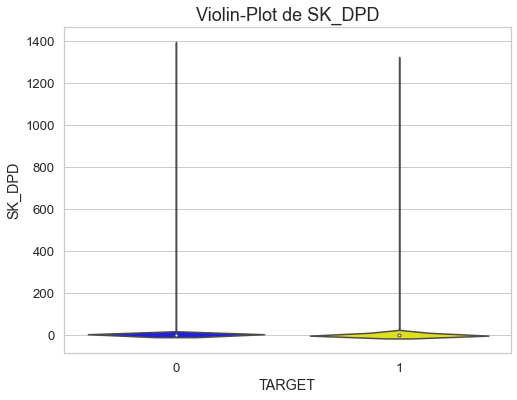

2:80: E501 line too long (109 > 79 characters)


In [135]:
# Affiche Violinplot
eda_kernel_fonctions.plot_continuous_variables(cc_balance_merged, 'SK_DPD', plots=['violin'], figsize=(8, 6))

- Peu de différence entre les défaillants et les non-défaillants.

<span>**Variable `SK_DPD_DEF`**</span>

DPD (jours de retard) au cours du mois sur le crédit précédent.

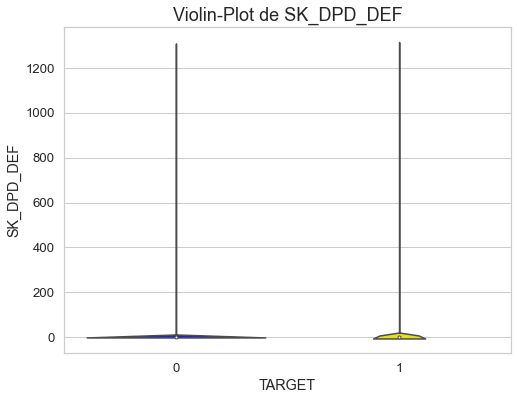

2:80: E501 line too long (113 > 79 characters)


In [136]:
# Affiche Violinplot
eda_kernel_fonctions.plot_continuous_variables(cc_balance_merged, 'SK_DPD_DEF', plots=['violin'], figsize=(8, 6))

- Les DPDs (jours de retard) au cours du mois sur le crédit précédent sont plus nombreux pour les non-défaillants.

### <span>2.7. Fichier installments_payments.csv</span>

#### <span>2.7.1. Description/statistiques</span>

<span>**Description**</span>

- Ce fichier **installments_payments.csv** présente l'historique de remboursement de chacun des prêts que le demandeur a contractés auprès de Home Credit Group.
- Le tableau contient des variables telles que le montant des versements, combien le demandeur a payé pour chaque versement, etc.

In [137]:
df_var_instpaie = \
    HomeCredit_columns_description[HomeCredit_columns_description['Table'] == 'installments_payments.csv']

df_var_instpaie.style.hide_index()

Table,Row,Description,Special
installments_payments.csv,SK_ID_PREV,"ID of previous credit in Home credit related to loan in our sample. (One loan in our sample can have 0,1,2 or more previous loans in Home Credit)",hashed
installments_payments.csv,SK_ID_CURR,ID of loan in our sample,hashed
installments_payments.csv,NUM_INSTALMENT_VERSION,Version of installment calendar (0 is for credit card) of previous credit. Change of installment version from month to month signifies that some parameter of payment calendar has changed,nan
installments_payments.csv,NUM_INSTALMENT_NUMBER,On which installment we observe payment,nan
installments_payments.csv,DAYS_INSTALMENT,When the installment of previous credit was supposed to be paid (relative to application date of current loan),time only relative to the application
installments_payments.csv,DAYS_ENTRY_PAYMENT,When was the installments of previous credit paid actually (relative to application date of current loan),time only relative to the application
installments_payments.csv,AMT_INSTALMENT,What was the prescribed installment amount of previous credit on this installment,nan
installments_payments.csv,AMT_PAYMENT,What the client actually paid on previous credit on this installment,nan


2:80: E501 line too long (106 > 79 characters)


<span>**Statistiques**</span>

In [138]:
installments_payments.name = 'installments_payments'

eda_kernel_fonctions. \
    afficher_stats_basic_all(installments_payments, application_train, application_test, 'SK_ID_PREV')

_______________________________________________________________________________
Le dataset contient 13605401 lignes et 8 variables.
_______________________________________________________________________________
Nombre de valeurs uniques SK_ID_PREV dans installments_payments.csv : 997752
Nombre de valeurs uniques SK_ID_CURR dans installments_payments.csv : 339587
Nombre de valeurs communes SK_ID_CURR dans application_train.csv et installments_payments.csv : 291643
Nombre de valeurs communes SK_ID_CURR dans application_train.csv et installments_payments.csv : 47944
_______________________________________________________________________________
Nombre de valeurs dupliquées dans installments_payments.csv : 0
_______________________________________________________________________________
Contenu des 3 premières lignes :


,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1054186,161674,1.0,6,-1180.0,-1187.0,6948.360,6948.360
1,1330831,151639,0.0,34,-2156.0,-2156.0,1716.525,1716.525
2,2085231,193053,2.0,1,-63.0,-63.0,25425.000,25425.000
3,2452527,199697,1.0,3,-2418.0,-2426.0,24350.130,24350.130
4,2714724,167756,1.0,2,-1383.0,-1366.0,2165.040,2160.585


4:80: E501 line too long (102 > 79 characters)


____________________________________________________
Type des variables



SK_ID_PREV                  int64
SK_ID_CURR                  int64
NUM_INSTALMENT_VERSION    float64
NUM_INSTALMENT_NUMBER       int64
DAYS_INSTALMENT           float64
DAYS_ENTRY_PAYMENT        float64
AMT_INSTALMENT            float64
AMT_PAYMENT               float64
dtype: object

,Nombre par type de variable,% des types de variable
float64,5,62.5000
int64,3,37.5000


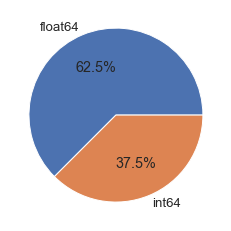

In [139]:
# Types des variables
outils_data.get_types_variables(installments_payments, True, True, True)

In [140]:
# Résumé des variables
desc_bureau = outils_data.description_variables(installments_payments)

desc_bureau

,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
type,int64,int64,float64,int64,float64,float64,float64,float64
nb_nan,0.0,0.0,0.0,0.0,0.0,2905.0,0.0,2905.0
%_nan,0.0,0.0,0.0,0.0,0.0,0.0027,0.0,0.0027
count,13605401.0,13605401.0,13605401.0,13605401.0,13605401.0,13602496.0,13605401.0,13602496.0
mean,1903364.9695,278444.8817,0.8566,18.8709,-1042.27,-1051.1137,17050.907,17238.2232
std,536202.9055,102718.3104,1.0352,26.6641,800.9463,800.5859,50570.2544,54735.784
min,1000001.0,100001.0,0.0,1.0,-2922.0,-4921.0,0.0,0.0
25%,1434191.0,189639.0,0.0,4.0,-1654.0,-1662.0,4226.085,3398.265
50%,1896520.0,278685.0,1.0,8.0,-818.0,-827.0,8884.08,8125.515
75%,2369094.0,367530.0,1.0,19.0,-361.0,-370.0,16710.21,16108.425


*****
**Conclusion** :

- Il y a environ 13,6 millions de points de données dans le fichier installments_payments.csv.
- Chaque ligne représente l'historique des versements liés à un prêt particulier que le demandeur a eu précédemment avec Home Credit Group.
- Il y a 997000 prêts antérieurs uniques dans le fichier installments_payments. Ils appartiennent à 339000 SK_ID_CURR uniques, qui sont les ID des demandeurs du prêt actuel.
- Sur ces 339000 SK_ID_CURR, 291000 appartiennent à l'ensemble de données d'apprentissage et 47900 à l'ensemble de données de test.
- Cela implique que sur les 307000 SK_ID_CURR uniques de l'application_train, 291000 ont déjà eu une forme de prêt avec Home Credit. - De même, pour 48700 de ceux qui sont dans l'ensemble de données de test, 47900 ont eu un prêt auparavant avec Home Credit.
- Le fichier a 8 variables uniques, dont 6 décrivent les statistiques de chaque versement pour le prêt précédent.
*****

<span>**Valeurs manquantes**</span>

Valeurs manquantes : 5810 NaN pour 108843208 données (0.01 %)
____________________________________________________
Nombre et % de valeurs manquantes par variable



,Nombres de valeurs manquantes,% de valeurs manquantes
DAYS_ENTRY_PAYMENT,2905,0.0200
AMT_PAYMENT,2905,0.0200


____________________________________________________
Heatmap de visualisation des valeurs manquantes


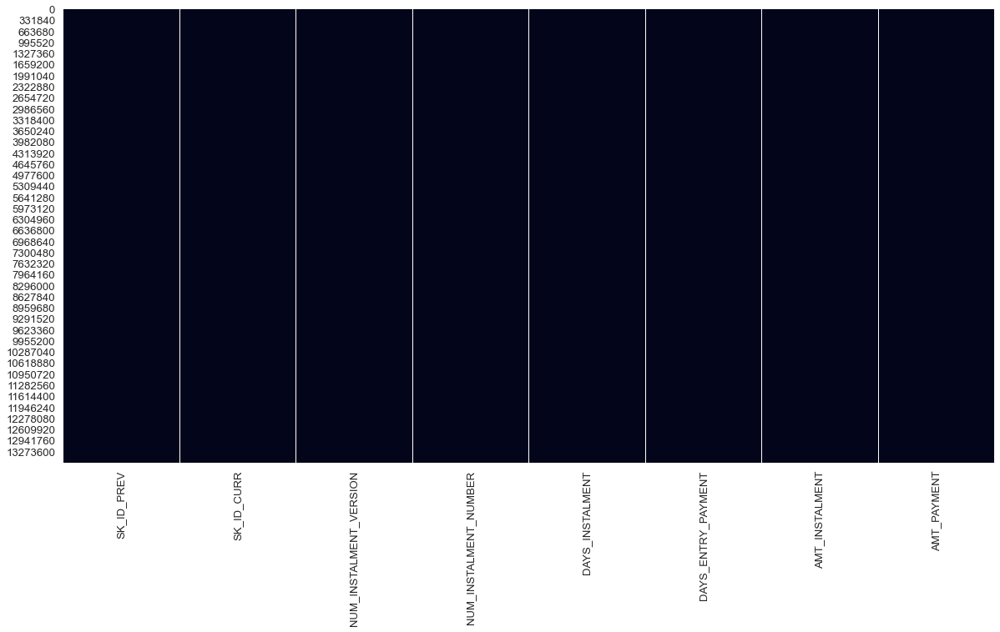

In [141]:
# Valeurs manquantes du dataframe
outils_data.get_missing_values(installments_payments, True, True)

Nombre de variables avec valeurs manquantes : 2


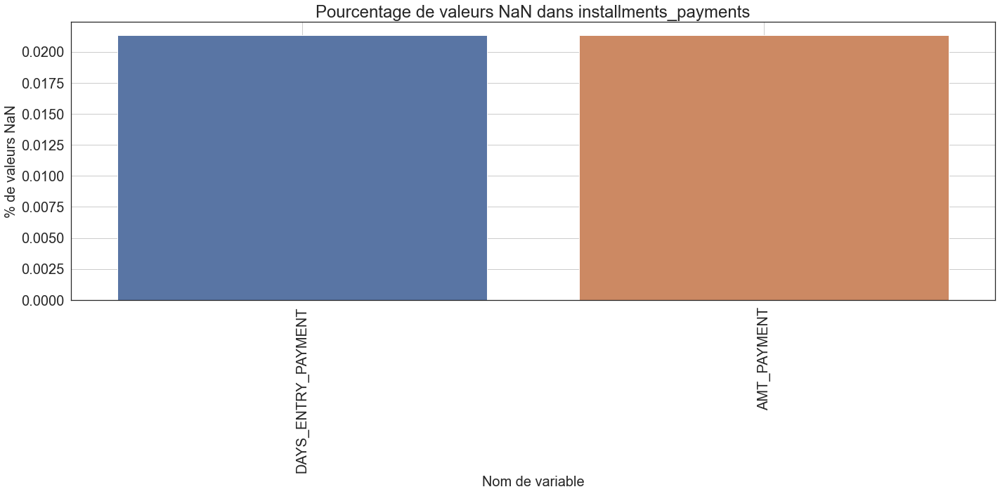

4:80: E501 line too long (121 > 79 characters)


In [142]:
# Réprésentation visuelle des valeurs manquantes
df_nan_instpaie = eda_kernel_fonctions.nan_df_create(installments_payments)

eda_kernel_fonctions.plot_nan_percent(df_nan_instpaie, 'installments_payments', grid=True, fontsize=20, figsize=(20, 10))

*****
**Conclusion** :

- Il n'y a que 2 variables qui contiennent des valeurs NaN sur les 8 variables de installments_payments.
- Ces variables contiennent également une proportion très minime de valeurs NaN, c'est-à-dire seulement 0,02%, ce qui n'est pas très inquiétant.
*****

**Préparation du dataframe de travail**

In [143]:
# Ajout de la variable TARGET pour la répartition défaillants/non-défaillants
print('_'*79)
part1 = '\nCréation dataframe de travail : merge TARGET '
print(part1 + 'avec dataframe installments_payments')
installments_merged = \
    application_train.iloc[:, :2].merge(installments_payments, on='SK_ID_CURR', how='left')
print("_"*79)

_______________________________________________________________________________

Création dataframe de travail : merge TARGET avec dataframe installments_payments


6:80: E501 line too long (91 > 79 characters)


_______________________________________________________________________________


#### <span>2.7.2. Analyse exploratoire univariée</span>

<span>**Distribution des variables quantitatives**</span>

In [144]:
# Liste des variables quantitatives
cols_num_instpaie = \
    installments_merged.select_dtypes(include=[np.number]).columns.to_list()

cols_num_instpaie

['SK_ID_CURR',
 'TARGET',
 'SK_ID_PREV',
 'NUM_INSTALMENT_VERSION',
 'NUM_INSTALMENT_NUMBER',
 'DAYS_INSTALMENT',
 'DAYS_ENTRY_PAYMENT',
 'AMT_INSTALMENT',
 'AMT_PAYMENT']

Premièrement, nous allons regrouper par le champ '`SK_ID_PREV`' et agréger avec la moyenne, afin d'obtenir une ligne moyenne pour chacun des prêts précédents du demandeur.

In [145]:
installments_merged = installments_merged.groupby('SK_ID_PREV').mean()

<span>**Variable `DAYS_INSTALMENT`**</span>

Cette variable indique les jours où le versement du crédit précédent devait être payé.

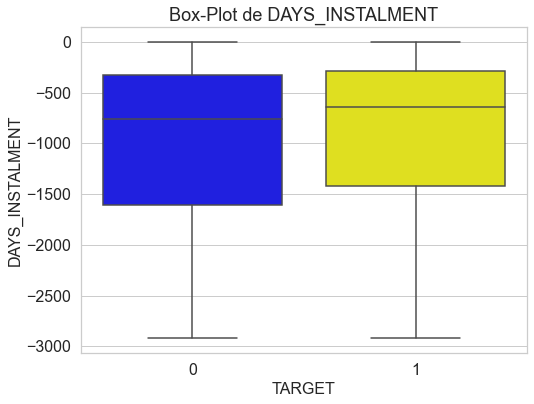

2:80: E501 line too long (117 > 79 characters)


In [146]:
# Affiche Boxplot
eda_kernel_fonctions.plot_continuous_variables(installments_merged, 'DAYS_INSTALMENT', plots=['box'], figsize=(8, 6))

- Les jours où le versement du précédent devait être payé est inférieur pour les défaillants.

<span>**Variable `DAYS_ENTRY_PAYMENT`**</span>

Cette variable indique les jours où le versement du crédit précédent a été effectivement payé.

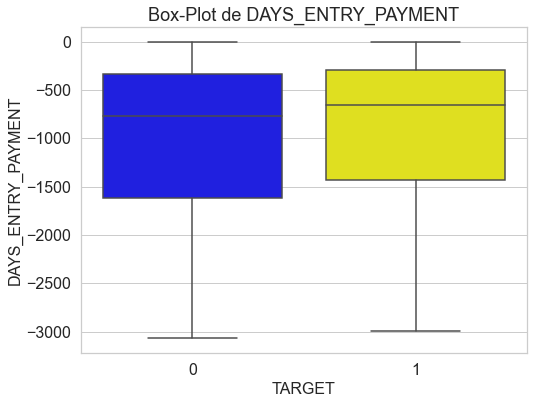

2:80: E501 line too long (120 > 79 characters)


In [147]:
# Affiche Boxplot
eda_kernel_fonctions.plot_continuous_variables(installments_merged, 'DAYS_ENTRY_PAYMENT', plots=['box'], figsize=(8, 6))

*****
**Conclusion** :

- Les deux graphiques ci-dessus montrent une tendance similaire : les mauvais payeurs ont tendance à avoir moins de jours depuis leur dernier paiement, tandis que les mauvais payeurs ont plus de jours depuis leur dernier paiement.
- Tous les quantiles des défaillants ont plus de jours récents que ceux des non-défaillants. Ainsi, les non-défaillants ont généralement plus d'écart dans leurs paiements depuis le jour de la demande que les défaillants.
*****

<span>**Variable `NUM_INSTALMENT_VERSION`**</span>

Version du calendrier des versements (0 pour la carte de crédit) du crédit précédent. Le changement de la version des versements d'un mois à l'autre signifie qu'un paramètre du calendrier de paiement a changé.

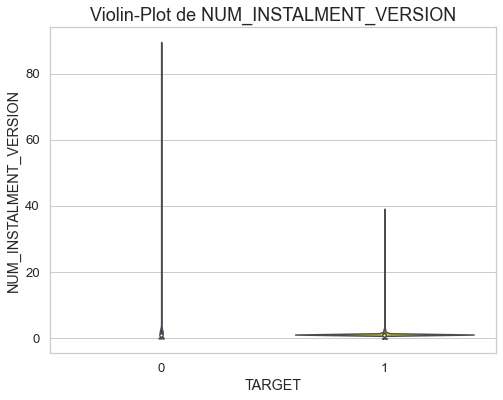

2:80: E501 line too long (111 > 79 characters)
2:112: W291 trailing whitespace
3:80: E501 line too long (122 > 79 characters)
3:108: E127 continuation line over-indented for visual indent


In [148]:
# Affiche Violinplot
eda_kernel_fonctions.plot_continuous_variables(installments_merged, 'NUM_INSTALMENT_VERSION', plots=['violin'], 
                                                                                                           figsize=(8, 6))

- Plus de modification de calendrier pour les non-défaillants.

<span>**Variable `NUM_INSTALMENT_NUMBER`**</span>

Sur quel versement nous observons le paiement.

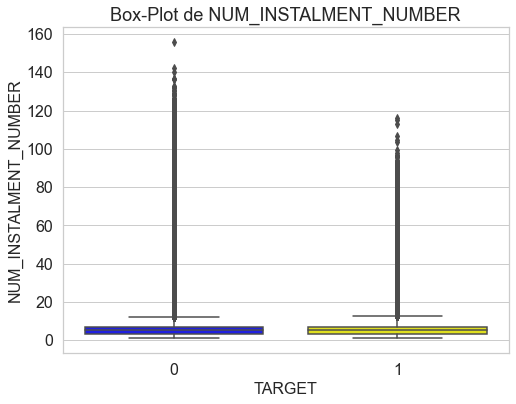

2:80: E501 line too long (123 > 79 characters)


In [149]:
# Affiche Boxplot
eda_kernel_fonctions.plot_continuous_variables(installments_merged, 'NUM_INSTALMENT_NUMBER', plots=['box'], figsize=(8, 6))

- Peu de différence.

<span>**Variable `AMT_INSTALMENT`**</span>

Quel était le montant de l'acompte prescrit du crédit précédent sur cet acompte ?

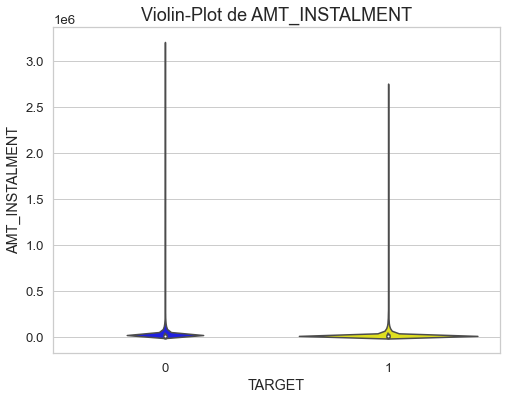

2:80: E501 line too long (119 > 79 characters)


In [150]:
# Affiche Violinplot
eda_kernel_fonctions.plot_continuous_variables(installments_merged, 'AMT_INSTALMENT', plots=['violin'], figsize=(8, 6))

- Peu de différence.

<span>**Variable `AMT_PAYMENT`**</span>

Ce que le demandeur a effectivement payé sur le crédit précédent pour ce versement.

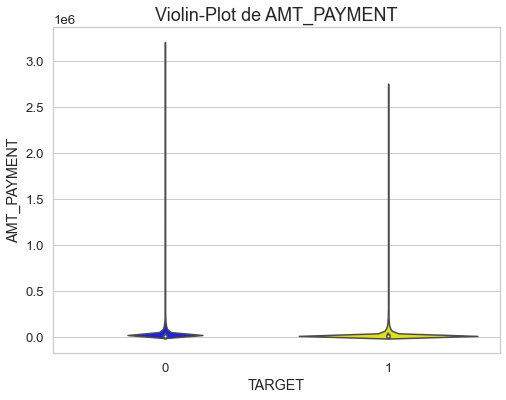

2:80: E501 line too long (116 > 79 characters)


In [151]:
# Affiche Violinplot
eda_kernel_fonctions.plot_continuous_variables(installments_merged, 'AMT_PAYMENT', plots=['violin'], figsize=(8, 6))

### <span>2.8. Fichier POS_CASH_balance.csv</span>

#### <span>2.8.1. Description/statistiques</span>

<span>**Description**</span>

- Ce fichier **POS_CASH_balance.csv** contient les instantanés des soldes mensuels des prêts aux points de vente et des prêts en espèces que le demandeur a obtenus auprès de Home Credit Group.
- Le fichier contient des colonnes telles que le statut du contrat, le nombre de versements restants, etc.

In [152]:
df_var_posh = \
    HomeCredit_columns_description[HomeCredit_columns_description['Table'] == 'POS_CASH_balance.csv']

df_var_posh.style.hide_index()

Table,Row,Description,Special
POS_CASH_balance.csv,SK_ID_PREV,"ID of previous credit in Home Credit related to loan in our sample. (One loan in our sample can have 0,1,2 or more previous loans in Home Credit)",nan
POS_CASH_balance.csv,SK_ID_CURR,ID of loan in our sample,nan
POS_CASH_balance.csv,MONTHS_BALANCE,"Month of balance relative to application date (-1 means the information to the freshest monthly snapshot, 0 means the information at application - often it will be the same as -1 as many banks are not updating the information to Credit Bureau regularly )",time only relative to the application
POS_CASH_balance.csv,CNT_INSTALMENT,Term of previous credit (can change over time),nan
POS_CASH_balance.csv,CNT_INSTALMENT_FUTURE,Installments left to pay on the previous credit,nan
POS_CASH_balance.csv,NAME_CONTRACT_STATUS,Contract status during the month,nan
POS_CASH_balance.csv,SK_DPD,DPD (days past due) during the month of previous credit,nan
POS_CASH_balance.csv,SK_DPD_DEF,DPD during the month with tolerance (debts with low loan amounts are ignored) of the previous credit,nan


2:80: E501 line too long (101 > 79 characters)


<span>**Statistiques**</span>

In [153]:
POS_CASH_balance.name = 'POS_CASH_balance'
application_train.name = 'application_train'
application_test.name = 'application_test'
eda_kernel_fonctions. \
    afficher_stats_basic_all(POS_CASH_balance, application_train, application_test, 'SK_ID_PREV')

_______________________________________________________________________________
Le dataset contient 10001358 lignes et 8 variables.
_______________________________________________________________________________
Nombre de valeurs uniques SK_ID_PREV dans POS_CASH_balance.csv : 936325
Nombre de valeurs uniques SK_ID_CURR dans POS_CASH_balance.csv : 337252
Nombre de valeurs communes SK_ID_CURR dans application_train.csv et POS_CASH_balance.csv : 289444
Nombre de valeurs communes SK_ID_CURR dans application_train.csv et POS_CASH_balance.csv : 47808
_______________________________________________________________________________
Nombre de valeurs dupliquées dans POS_CASH_balance.csv : 0
_______________________________________________________________________________
Contenu des 3 premières lignes :


,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1803195,182943,-31,48.0,45.0,Active,0,0
1,1715348,367990,-33,36.0,35.0,Active,0,0
2,1784872,397406,-32,12.0,9.0,Active,0,0
3,1903291,269225,-35,48.0,42.0,Active,0,0
4,2341044,334279,-35,36.0,35.0,Active,0,0


5:80: E501 line too long (97 > 79 characters)


____________________________________________________
Type des variables



SK_ID_PREV                 int64
SK_ID_CURR                 int64
MONTHS_BALANCE             int64
CNT_INSTALMENT           float64
CNT_INSTALMENT_FUTURE    float64
NAME_CONTRACT_STATUS      object
SK_DPD                     int64
SK_DPD_DEF                 int64
dtype: object

,Nombre par type de variable,% des types de variable
int64,5,62.5000
float64,2,25.0000
object,1,12.5000


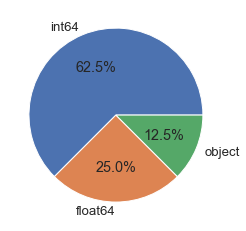

In [154]:
# Types des variables
outils_data.get_types_variables(POS_CASH_balance, True, True, True)

In [155]:
# Résumé des variables
desc_bureau = outils_data.description_variables(POS_CASH_balance)

desc_bureau

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
type,int64,int64,int64,float64,float64,object,int64,int64
nb_nan,0.0,0.0,0.0,26071.0,26087.0,0.0,0.0,0.0
%_nan,0.0,0.0,0.0,0.0326,0.0326,0.0,0.0,0.0
count,10001358.0,10001358.0,10001358.0,9975287.0,9975271.0,10001358,10001358.0,10001358.0
unique,NaN,NaN,NaN,NaN,NaN,9,NaN,NaN
top,NaN,NaN,NaN,NaN,NaN,Active,NaN,NaN
freq,NaN,NaN,NaN,NaN,NaN,9151119,NaN,NaN
mean,1903216.599,278403.8633,-35.0126,17.0897,10.4838,NaN,11.6069,0.6545
std,535846.5307,102763.7451,26.0666,11.9951,11.1091,NaN,132.714,32.7625
min,1000001.0,100001.0,-96.0,1.0,0.0,NaN,0.0,0.0


*****
**Conclusion** :

- Le fichier POSH_CASH_BALANCE.csv contient environ 10 millions de points de données, où chaque ligne correspond à l'instantané mensuel de l'état du POS et du prêt d'argent précédent que le demandeur a eu avec Home Credit Group.
- Elle se compose de 8 variables, dont deux sont SK_ID_CURR et SK_ID_PREV.
- Il y a 936000 identifiants uniques de prêts précédents dans le fichier, qui correspondent à 337000 demandeurs actuels uniques (SK_ID_CURR).
- Sur ces 337000 SK_ID_CURR, 289000 appartiennent à l'ensemble de formation et 47800 à l'ensemble de test.
*****

<span>**Valeurs manquantes**</span>

Valeurs manquantes : 52158 NaN pour 80010864 données (0.07 %)
____________________________________________________
Nombre et % de valeurs manquantes par variable



,Nombres de valeurs manquantes,% de valeurs manquantes
CNT_INSTALMENT,26071,0.2600
CNT_INSTALMENT_FUTURE,26087,0.2600


____________________________________________________
Heatmap de visualisation des valeurs manquantes


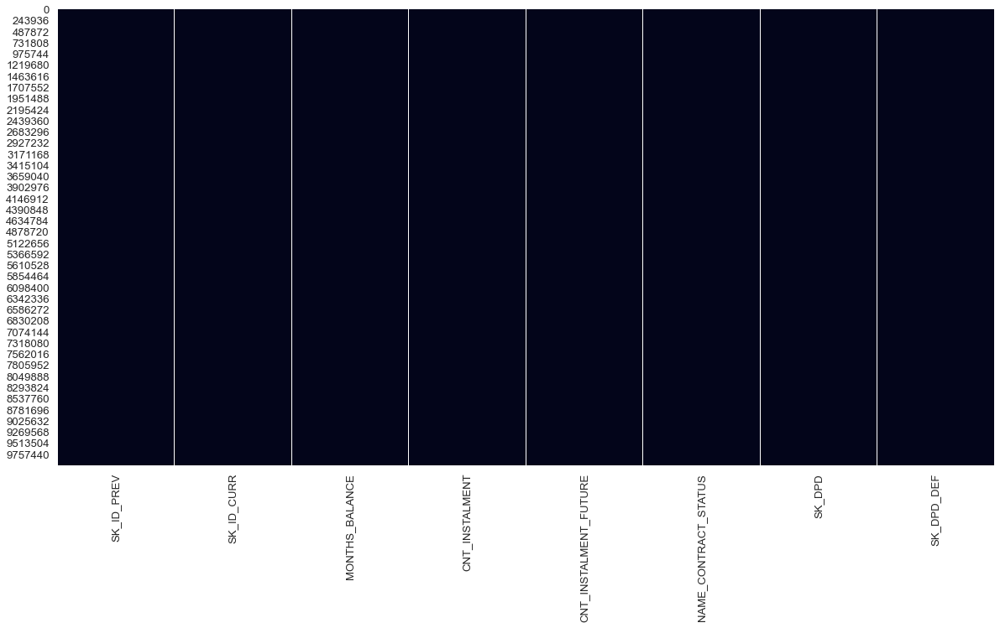

In [156]:
# Valeurs manquantes du dataframe
outils_data.get_missing_values(POS_CASH_balance, True, True)

Nombre de variables avec valeurs manquantes : 2


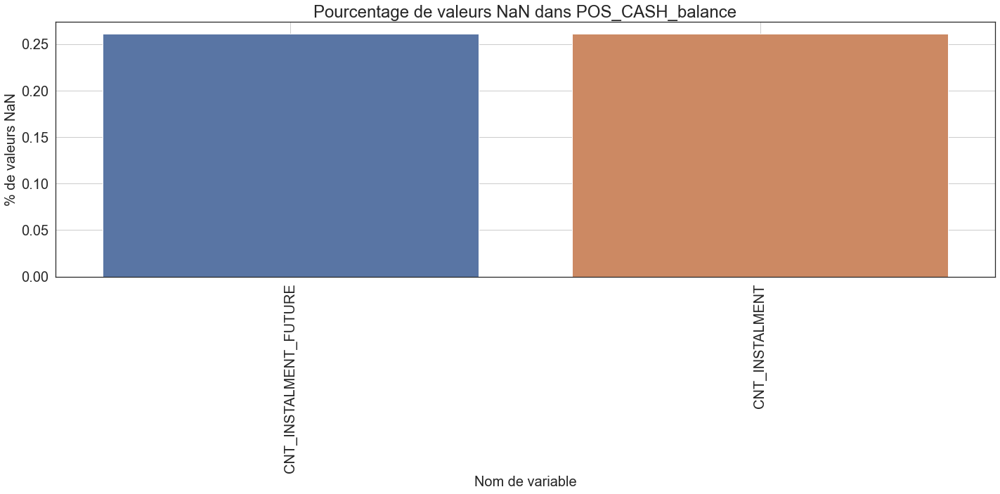

4:80: E501 line too long (112 > 79 characters)


In [157]:
# Réprésentation visuelle des valeurs manquantes
df_nan_posh = eda_kernel_fonctions.nan_df_create(POS_CASH_balance)

eda_kernel_fonctions.plot_nan_percent(df_nan_posh, 'POS_CASH_balance', grid=True, fontsize=20, figsize=(20, 10))

*****
**Conclusion** :

- Il y a seulement 2 variables qui contiennent des valeurs NaN des 8 variables de POS_CASH_balance.
- Ces variables sont le nombre de versements restants et la durée du prêt.
- Ces variables contiennent également une proportion très minime de valeurs NaN, c'est-à-dire seulement 0,26 %, ce qui n'est pas très préoccupant.
*****

**Préparation du dataframe de travail**

In [158]:
# Ajout de la variable TARGET pour la répartition défaillants/non-défaillants
print('_'*79)
var1 = '\nCréation dataframe de travail : merge TARGET '
print(var1 + 'avec dataframe POS_CASH_balance')
pos_cash_merged = application_train.iloc[:, :2].merge(POS_CASH_balance, on='SK_ID_CURR', how='left')
print("_"*79)

_______________________________________________________________________________

Création dataframe de travail : merge TARGET avec dataframe POS_CASH_balance


5:80: E501 line too long (100 > 79 characters)


_______________________________________________________________________________


#### <span>2.8.2. Analyse exploratoire univariée</span>

<span>**Distribution des variables catégorielles**</span>

Tout d'abord, nous allons regrouper par le champ 'SK_ID_PREV' et agréger avec la moyenne, afin d'obtenir une ligne moyenne pour chacun des prêts précédents du demandeur.

In [159]:
# Liste des variables qualitatives
cols_cat_posh = \
    pos_cash_merged.select_dtypes(exclude=[np.number]).columns.to_list()

cols_cat_posh

['NAME_CONTRACT_STATUS']

<span>**Variable `NAME_CONTRACT_STATUS`**</span>

État du contrat au cours du mois.

_______________________________________________________________________________
Les catégories uniques de la variable 'NAME_CONTRACT_STATUS' sont :
['Active' 'Completed' 'Returned to the store' 'Signed' nan 'Approved'
 'Demand' 'Amortized debt' 'Canceled' 'XNA']
_______________________________________________________________________________
Nombre de catégories uniques pour NAME_CONTRACT_STATUS = 10


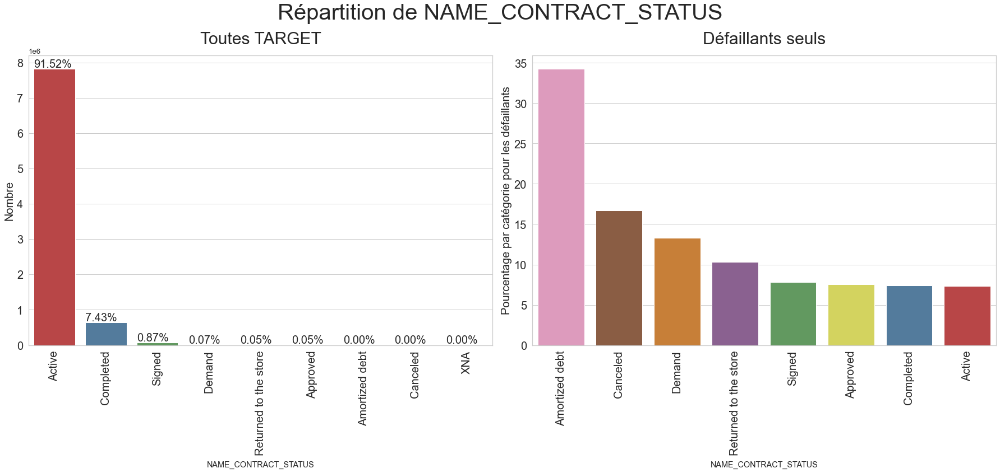

2:80: E501 line too long (85 > 79 characters)
6:80: E501 line too long (118 > 79 characters)
7:80: E501 line too long (111 > 79 characters)
7:92: E127 continuation line over-indented for visual indent
8:80: E501 line too long (122 > 79 characters)
8:92: E127 continuation line over-indented for visual indent
9:80: E501 line too long (122 > 79 characters)
10:80: E501 line too long (122 > 79 characters)
11:80: E501 line too long (122 > 79 characters)
12:80: E501 line too long (112 > 79 characters)
13:80: E501 line too long (122 > 79 characters)
13:92: E127 continuation line over-indented for visual indent
14:80: E501 line too long (122 > 79 characters)
15:80: E501 line too long (122 > 79 characters)
16:80: E501 line too long (123 > 79 characters)


In [160]:
# Let us first see the unique categories of 'NAME_CONTRACT_STATUS'
eda_kernel_fonctions.print_unique_categories(pos_cash_merged, 'NAME_CONTRACT_STATUS')

# Plotting the Bar Plot for the Column
eda_kernel_fonctions. \
    plot_categorical_variables_bar(pos_cash_merged, column_name='NAME_CONTRACT_STATUS', figsize=(25, 12), rotation=90,
                                                                                           fontsize_percent=20,
                                                                                           palette1=['#cb3335', '#477ca8',
                                                                                                     '#59a257', '#905998',
                                                                                                     '#df7f20', '#e6e64c',
                                                                                                     '#965a38', '#e890be',
                                                                                                     '#999999'],
                                                                                           palette2=['#e890be', '#965a38',
                                                                                                     '#df7f20', '#905998',
                                                                                                     '#59a257', '#e6e64c',
                                                                                                     '#477ca8', '#cb3335'])

*****
**Conclusion** :

- La majorité des états des contrats des prêts sont Actif ou Terminé.
- Pour les défaillants, l'état des contrat sont en priorité tous sauf ceux de la majorité des demandeurs Actifs ou Terminés.
- Les non-défaillants ont plus de prêts actifs que les défaillants.
*****

<span>**Distribution des variables quantitatives**</span>

In [161]:
# Liste des variables quantitatives
cols_num_posh = \
    pos_cash_merged.select_dtypes(include=[np.number]).columns.to_list()

cols_num_posh

['SK_ID_CURR',
 'TARGET',
 'SK_ID_PREV',
 'MONTHS_BALANCE',
 'CNT_INSTALMENT',
 'CNT_INSTALMENT_FUTURE',
 'SK_DPD',
 'SK_DPD_DEF']

<span>**Variable `MONTHS_BALANCE`**</span>

Mois du solde par rapport à la date d'application (-1 signifie la date de solde la plus récente).

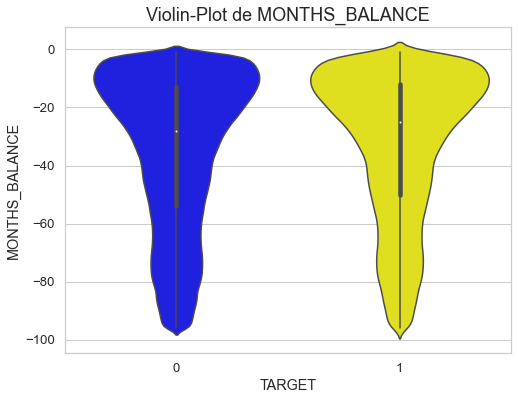

2:80: E501 line too long (115 > 79 characters)


In [162]:
# Affiche Violinplot
eda_kernel_fonctions.plot_continuous_variables(pos_cash_merged, 'MONTHS_BALANCE', plots=['violin'], figsize=(8, 6))

- Peu de différence.

<span>**Variable `CNT_INSTALMENT`**</span>

Durée du crédit précédent (peut changer avec le temps).

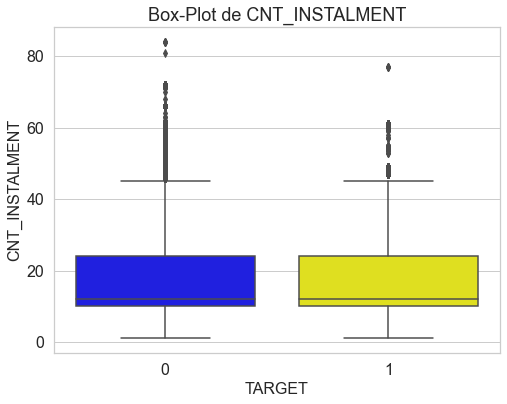

2:80: E501 line too long (112 > 79 characters)


In [163]:
# Affiche Boxplot
eda_kernel_fonctions.plot_continuous_variables(pos_cash_merged, 'CNT_INSTALMENT', plots=['box'], figsize=(8, 6))

- Peu de différence.

<span>**Variable `CNT_INSTALMENT_FUTURE`**</span>

Versements restant à payer sur le crédit précédent.

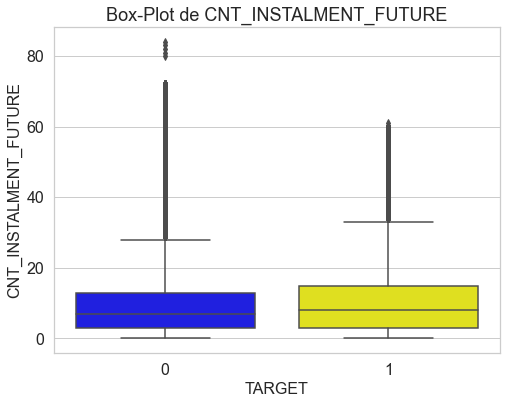

2:80: E501 line too long (119 > 79 characters)


In [164]:
# Affiche Boxplot
eda_kernel_fonctions.plot_continuous_variables(pos_cash_merged, 'CNT_INSTALMENT_FUTURE', plots=['box'], figsize=(8, 6))

- Les versements sont légèrement plus élevés pour les défaillants.

<span>**Variable `SK_DPD`**</span>

DPD (jours de retard) au cours du mois du crédit précédent.

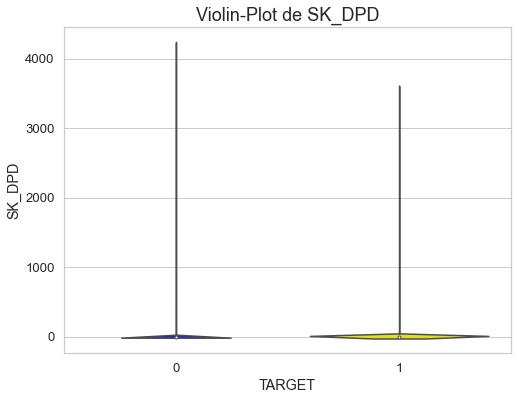

2:80: E501 line too long (107 > 79 characters)


In [165]:
# Affiche Violinplot
eda_kernel_fonctions.plot_continuous_variables(pos_cash_merged, 'SK_DPD', plots=['violin'], figsize=(8, 6))

- Peu de différence.

<span>**Variable `SK_DPD_DEF`**</span>

DPD au cours du mois avec tolérance (les dettes de faible montant sont ignorées) du crédit précédent.

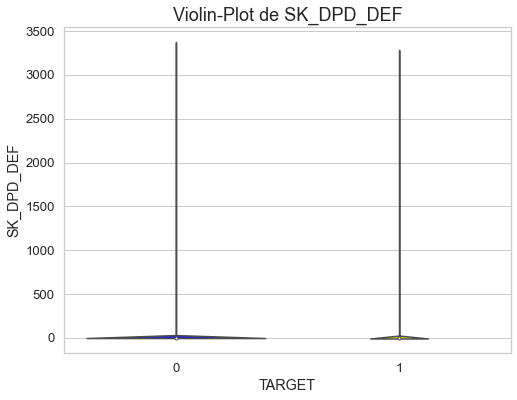

2:80: E501 line too long (111 > 79 characters)


In [166]:
# Affiche Violinplot
eda_kernel_fonctions.plot_continuous_variables(pos_cash_merged, 'SK_DPD_DEF', plots=['violin'], figsize=(8, 6))

- Peu de différence.

#### <span>2.8.3. Analyse exploratoire multivariée</span>

<span>**Corrélation entre les variables numériques**</span>

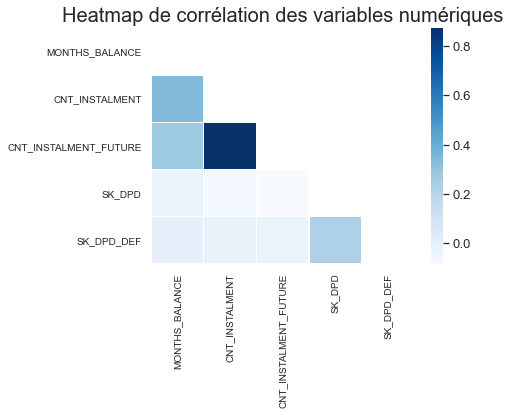

2:80: E501 line too long (120 > 79 characters)


In [167]:
corr_mat = \
    eda_kernel_fonctions.correlation_matrix(pos_cash_merged, ['SK_ID_CURR', 'SK_ID_PREV'], cmap='Blues', figsize=(7, 6))

corr_mat.plot_correlation_matrix()

In [168]:
# Seeing the top columns with highest phik-correlation with the target variable in pos_cash_merged table
top_corr_target_df = corr_mat.target_top_corr()
print('_' * 79)
titre1 = '\nLes variables ayant les valeurs les plus élevées de Phi-k'
print(titre1 + '-corrélation avec la variable cible sont les suivantes :')
display(top_corr_target_df.style.hide_index())
print('_'*79)

interval columns not set, guessing: ['TARGET', 'MONTHS_BALANCE']
interval columns not set, guessing: ['TARGET', 'CNT_INSTALMENT']
interval columns not set, guessing: ['TARGET', 'CNT_INSTALMENT_FUTURE']
interval columns not set, guessing: ['TARGET', 'SK_DPD']
interval columns not set, guessing: ['TARGET', 'SK_DPD_DEF']
_______________________________________________________________________________

Les variables ayant les valeurs les plus élevées de Phi-k-corrélation avec la variable cible sont les suivantes :


TypeError: 'module' object is not callable

1:80: E501 line too long (104 > 79 characters)


*****
**Conclusion** :

- La carte thermique ci-dessus montre la corrélation entre les variables.
- A partir de la carte de chaleur de la matrice de corrélation, nous avons un ensemble de variables modérément corrélées, qui sont : 
    - CNT_INSTALMENT et CNT_INSTALMENT_FUTURE.
- La corrélation des variables avec la cible est très faible, ce qui montre l'absence d'une relation linéaire entre la variables et la variable cible.
*****

### <span>2.9. Fichier previous_application.csv</span>

#### <span>2.9.1. Description/statistiques</span>

<span>**Description**</span>

- Ce fichier **`previous_application.csv`** contient les données statiques du précédent prêt que le demmdeur a eu avec Home Credit. 

In [169]:
df_var_prev = \
    HomeCredit_columns_description[HomeCredit_columns_description['Table'] == 'previous_application.csv']

df_var_prev.style.hide_index()

Table,Row,Description,Special
previous_application.csv,SK_ID_PREV,"ID of previous credit in Home credit related to loan in our sample. (One loan in our sample can have 0,1,2 or more previous loan applications in Home Credit, previous application could, but not necessarily have to lead to credit)",hashed
previous_application.csv,SK_ID_CURR,ID of loan in our sample,hashed
previous_application.csv,NAME_CONTRACT_TYPE,"Contract product type (Cash loan, consumer loan [POS] ,...) of the previous application",nan
previous_application.csv,AMT_ANNUITY,Annuity of previous application,nan
previous_application.csv,AMT_APPLICATION,For how much credit did client ask on the previous application,nan
previous_application.csv,AMT_CREDIT,"Final credit amount on the previous application. This differs from AMT_APPLICATION in a way that the AMT_APPLICATION is the amount for which the client initially applied for, but during our approval process he could have received different amount - AMT_CREDIT",nan
previous_application.csv,AMT_DOWN_PAYMENT,Down payment on the previous application,nan
previous_application.csv,AMT_GOODS_PRICE,Goods price of good that client asked for (if applicable) on the previous application,nan
previous_application.csv,WEEKDAY_APPR_PROCESS_START,On which day of the week did the client apply for previous application,nan
previous_application.csv,HOUR_APPR_PROCESS_START,Approximately at what day hour did the client apply for the previous application,rounded


2:80: E501 line too long (105 > 79 characters)


<span>**Statistiques**</span>

In [170]:
previous_application.name = 'credit_card_balance'
application_train.name = 'application_train'
application_test.name = 'application_test'

eda_kernel_fonctions. \
    afficher_stats_basic_all(previous_application, application_train, application_test, 'SK_ID_PREV')

_______________________________________________________________________________
Le dataset contient 1670214 lignes et 37 variables.
_______________________________________________________________________________
Nombre de valeurs uniques SK_ID_PREV dans credit_card_balance.csv : 1670214
Nombre de valeurs uniques SK_ID_CURR dans credit_card_balance.csv : 338857
Nombre de valeurs communes SK_ID_CURR dans application_train.csv et credit_card_balance.csv : 291057
Nombre de valeurs communes SK_ID_CURR dans application_train.csv et credit_card_balance.csv : 47800
_______________________________________________________________________________
Nombre de valeurs dupliquées dans credit_card_balance.csv : 0
_______________________________________________________________________________
Contenu des 3 premières lignes :


,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,Y,1,0.0,0.1828,0.8673,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,Y,1,NaN,NaN,NaN,XNA,Approved,-512,Cash through the bank,XAP,NaN,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,Y,1,NaN,NaN,NaN,Repairs,Refused,-781,Cash through the bank,HC,NaN,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


6:80: E501 line too long (101 > 79 characters)


____________________________________________________
Type des variables



SK_ID_PREV                       int64
SK_ID_CURR                       int64
NAME_CONTRACT_TYPE              object
AMT_ANNUITY                    float64
AMT_APPLICATION                float64
AMT_CREDIT                     float64
AMT_DOWN_PAYMENT               float64
AMT_GOODS_PRICE                float64
WEEKDAY_APPR_PROCESS_START      object
HOUR_APPR_PROCESS_START          int64
FLAG_LAST_APPL_PER_CONTRACT     object
NFLAG_LAST_APPL_IN_DAY           int64
RATE_DOWN_PAYMENT              float64
RATE_INTEREST_PRIMARY          float64
RATE_INTEREST_PRIVILEGED       float64
NAME_CASH_LOAN_PURPOSE          object
NAME_CONTRACT_STATUS            object
DAYS_DECISION                    int64
NAME_PAYMENT_TYPE               object
CODE_REJECT_REASON              object
NAME_TYPE_SUITE                 object
NAME_CLIENT_TYPE                object
NAME_GOODS_CATEGORY             object
NAME_PORTFOLIO                  object
NAME_PRODUCT_TYPE               object
CHANNEL_TYPE             

,Nombre par type de variable,% des types de variable
object,16,43.2400
float64,15,40.5400
int64,6,16.2200


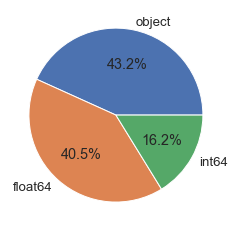

In [171]:
# Types des variables
outils_data.get_types_variables(previous_application, True, True, True)

In [172]:
# Résumé des variables
desc_bureau = outils_data.description_variables(previous_application)

desc_bureau

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
type,int64,int64,object,float64,float64,float64,float64,float64,object,int64,object,int64,float64,float64,float64,object,object,int64,object,object,object,object,object,object,object,object,int64,object,float64,object,object,float64,float64,float64,float64,float64,float64
nb_nan,0.0,0.0,0.0,372235.0,0.0,1.0,895844.0,385515.0,0.0,0.0,0.0,0.0,895844.0,1664263.0,1664263.0,0.0,0.0,0.0,0.0,0.0,820405.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,372230.0,0.0,346.0,673065.0,673065.0,673065.0,673065.0,673065.0,673065.0
%_nan,0.0,0.0,0.0,0.6023,0.0,0.0,1.4496,0.6238,0.0,0.0,0.0,0.0,1.4496,2.6931,2.6931,0.0,0.0,0.0,0.0,0.0,1.3276,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.6023,0.0,0.0006,1.0891,1.0891,1.0891,1.0891,1.0891,1.0891
count,1670214.0,1670214.0,1670214,1297979.0,1670214.0,1670213.0,774370.0,1284699.0,1670214,1670214.0,1670214,1670214.0,774370.0,5951.0,5951.0,1670214,1670214,1670214.0,1670214,1670214,849809,1670214,1670214,1670214,1670214,1670214,1670214.0,1670214,1297984.0,1670214,1669868,997149.0,997149.0,997149.0,997149.0,997149.0,997149.0
unique,NaN,NaN,4,NaN,NaN,NaN,NaN,NaN,7,NaN,2,NaN,NaN,NaN,NaN,25,4,NaN,4,9,7,4,28,5,3,8,NaN,11,NaN,5,17,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,NaN,Cash loans,NaN,NaN,NaN,NaN,NaN,TUESDAY,NaN,Y,NaN,NaN,NaN,NaN,XAP,Approved,NaN,Cash through the bank,XAP,Unaccompanied,Repeater,XNA,POS,XNA,Credit and cash offices,NaN,XNA,NaN,XNA,Cash,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,NaN,747553,NaN,NaN,NaN,NaN,NaN,255118,NaN,1661739,NaN,NaN,NaN,NaN,922661,1036781,NaN,1033552,1353093,508970,1231261,950809,691011,1063666,719968,NaN,855720,NaN,517215,285990,NaN,NaN,NaN,NaN,NaN,NaN
mean,1923089.1353,278357.1741,NaN,15955.1207,175233.8604,196114.0212,6697.4021,227847.2793,NaN,12.4842,NaN,0.9965,0.0796,0.1884,0.7735,NaN,NaN,-880.6797,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,313.9511,NaN,16.0541,NaN,NaN,342209.855,13826.2693,33767.7741,76582.4031,81992.3438,0.3326
std,532597.9587,102814.8238,NaN,14782.1373,292779.7624,318574.6165,20921.4954,315396.5579,NaN,3.334,NaN,0.0593,0.1078,0.0877,0.1009,NaN,NaN,779.0997,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7127.4435,NaN,14.5673,NaN,NaN,88916.1158,72444.8697,106857.0348,149647.4151,153303.5167,0.4711
min,1000001.0,100001.0,NaN,0.0,0.0,0.0,-0.9,0.0,NaN,0.0,NaN,0.0,-0.0,0.0348,0.3732,NaN,NaN,-2922.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1.0,NaN,0.0,NaN,NaN,-2922.0,-2892.0,-2801.0,-2889.0,-2874.0,0.0


*****
**Conclusion** :

- Le fichier previous_application.csv est composée de 1.67 millions de lignes au total.
- Chaque ligne correspond à chacun des prêts précédents que le demandeur a eu avec Home Credit Group. 
- Il est possible pour un même demandeur de la demande actuelle d'avoir plusieurs prêts précédents avec Home Credit Group.
- Il y a 37 variables dans previous_application.csv, qui contiennent les détails sur le prêt précédent.
- Il y a 338000 SK_ID_CURR uniques dans previous_application, dont 291000 correspondent aux SK_ID_CURR de l'application_train et 47800 correspondent aux SK_ID_CURR de l'application_test.
*****

<span>**Valeurs manquantes**</span>

Valeurs manquantes : 11109336 NaN pour 61797918 données (17.98 %)
____________________________________________________
Nombre et % de valeurs manquantes par variable



,Nombres de valeurs manquantes,% de valeurs manquantes
RATE_INTEREST_PRIMARY,1664263,99.6400
RATE_INTEREST_PRIVILEGED,1664263,99.6400
AMT_DOWN_PAYMENT,895844,53.6400
RATE_DOWN_PAYMENT,895844,53.6400
NAME_TYPE_SUITE,820405,49.1200
DAYS_FIRST_DRAWING,673065,40.3000
DAYS_FIRST_DUE,673065,40.3000
DAYS_LAST_DUE_1ST_VERSION,673065,40.3000
DAYS_LAST_DUE,673065,40.3000
DAYS_TERMINATION,673065,40.3000


____________________________________________________
Heatmap de visualisation des valeurs manquantes


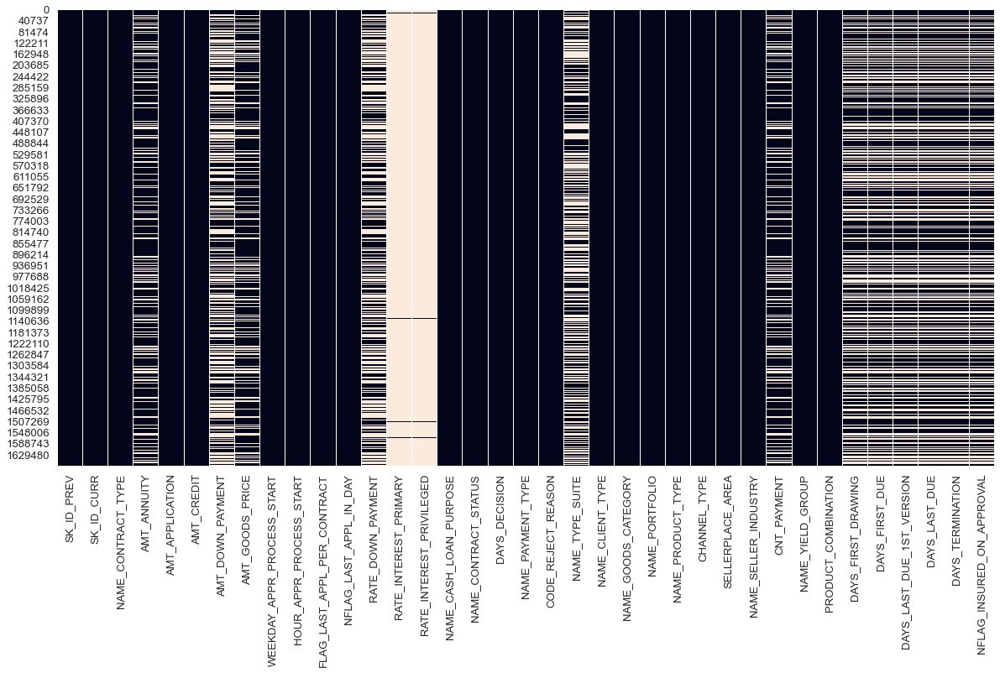

In [173]:
# Valeurs manquantes du dataframe
outils_data.get_missing_values(previous_application, True, True)

Nombre de variables avec valeurs manquantes : 16


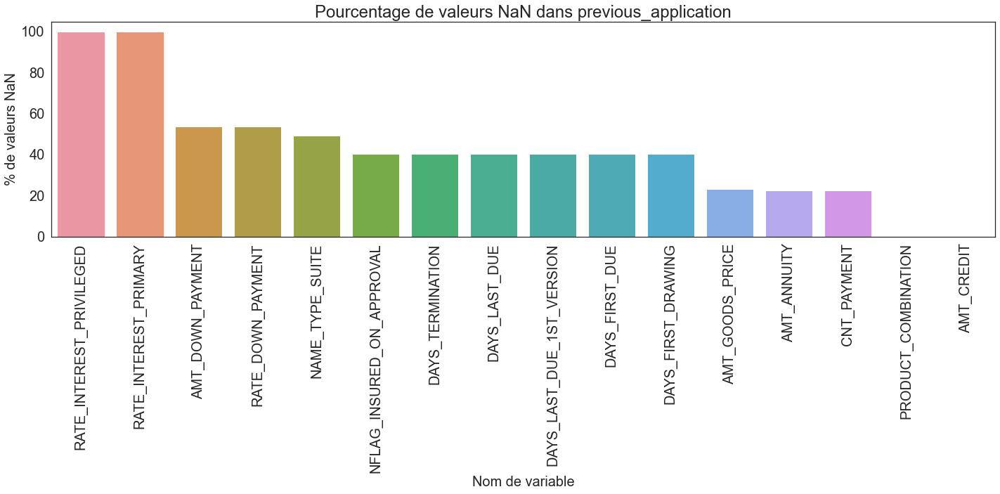

4:80: E501 line too long (117 > 79 characters)


In [174]:
# Réprésentation visuelle des valeurs manquantes
df_nan_prev = eda_kernel_fonctions.nan_df_create(previous_application)

eda_kernel_fonctions.plot_nan_percent(df_nan_prev, 'previous_application', grid=False, fontsize=20, figsize=(20, 10))

*****
**Conclusion** :

- Il y a 16 variables sur les 37 variables qui contiennent des valeurs NaN.
- Deux de ces variables ont 99,64% de valeurs manquantes, ce qui est très élevé, et nous devrons trouver un moyen intelligent de gérer des valeurs NaN aussi élevées. 
- Nous ne pouvons pas directement écarter une variable à ce stade.
- En dehors de ces deux variables, le reste des variables contient également > 40% de valeurs NaN, à l'exception de 5 variables.
*****

**Préparation du dataframe de travail**

In [175]:
# Ajout de la variable TARGET pour la répartition défaillants/non-défaillants
print('_'*79)
var = '\nCréation dataframe de travail : merge TARGET '
print(var + 'avec dataframe previous_application')
prev_merged = application_train.iloc[:, :2].merge(previous_application, on='SK_ID_CURR', how='left')
print("_"*79)

_______________________________________________________________________________

Création dataframe de travail : merge TARGET avec dataframe previous_application


5:80: E501 line too long (100 > 79 characters)


_______________________________________________________________________________


#### <span>2.9.2. Analyse exploratoire univariée</span>

<span>**Distribution des variables catégorielles**</span>

Nous allons maintenant représenter graphiquement certaines des variables catégorielles du dataframe previous_application, et voir leur impact sur la variable cible.

In [176]:
# Liste des variables qualitatives
cols_cat_prev = \
    prev_merged.select_dtypes(exclude=[np.number]).columns.to_list()

cols_cat_prev

['NAME_CONTRACT_TYPE',
 'WEEKDAY_APPR_PROCESS_START',
 'FLAG_LAST_APPL_PER_CONTRACT',
 'NAME_CASH_LOAN_PURPOSE',
 'NAME_CONTRACT_STATUS',
 'NAME_PAYMENT_TYPE',
 'CODE_REJECT_REASON',
 'NAME_TYPE_SUITE',
 'NAME_CLIENT_TYPE',
 'NAME_GOODS_CATEGORY',
 'NAME_PORTFOLIO',
 'NAME_PRODUCT_TYPE',
 'CHANNEL_TYPE',
 'NAME_SELLER_INDUSTRY',
 'NAME_YIELD_GROUP',
 'PRODUCT_COMBINATION']

<span>**Variable `NAME_CONTRACT_TYPE`**</span>

Type de produit contractuel (prêt d'argent ou prêt à la consommation [POS]...) de la demande précédente.

_______________________________________________________________________________
Les catégories uniques de la variable 'NAME_CONTRACT_TYPE' sont :
['Consumer loans' 'Cash loans' 'Revolving loans' nan 'XNA']
_______________________________________________________________________________
Répartition dans chaque catégorie :
Cash loans         626764
Consumer loans     625256
Revolving loans    161368
XNA                   313
Name: NAME_CONTRACT_TYPE, dtype: int64
_______________________________________________________________________________
Nombre de catégories uniques pour NAME_CONTRACT_TYPE = 5


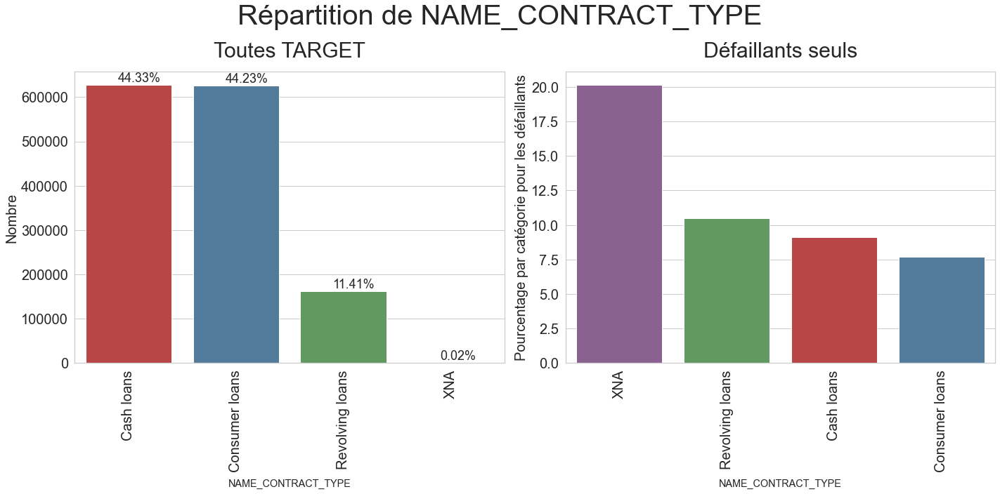

2:80: E501 line too long (97 > 79 characters)
6:80: E501 line too long (104 > 79 characters)
7:80: E501 line too long (125 > 79 characters)
7:88: E127 continuation line over-indented for visual indent
8:80: E501 line too long (99 > 79 characters)
8:88: E127 continuation line over-indented for visual indent
9:80: E501 line too long (118 > 79 characters)
9:88: E127 continuation line over-indented for visual indent
10:80: E501 line too long (119 > 79 characters)
11:80: E501 line too long (118 > 79 characters)
11:88: E127 continuation line over-indented for visual indent
12:80: E501 line too long (119 > 79 characters)


In [177]:
# Let us first see the unique categories of 'NAME_CONTRACT_TYPE'
eda_kernel_fonctions.print_unique_categories(prev_merged, 'NAME_CONTRACT_TYPE', show_counts=True)

# Plotting the Bar Plot for the Column
eda_kernel_fonctions. \
    plot_categorical_variables_bar(prev_merged, column_name='NAME_CONTRACT_TYPE', horizontal_adjust=0.3,
                                                                                       figsize=(20, 10), fontsize_percent=18,
                                                                                       rotation=90,
                                                                                       palette1=['#cb3335', '#477ca8',
                                                                                                 '#59a257', '#905998'],
                                                                                       palette2=['#905998', '#59a257',
                                                                                                 '#cb3335', '#477ca8'])

*****
**Conclusion** :

À partir des graphiques ci-dessus, nous pouvons observer ce qui suit :

- D'après le premier sous-graphe, nous voyons que la plupart des prêts précédents ont été des prêts d'argent ou des prêts à la consommation, qui correspondent à environ 44% des prêts chacun. 
- Les 11,41% restants correspondent à des prêts revolving, et il y a quelques prêts nommés XNA dont les types ne sont en fait pas connus, mais ils sont très peu nombreux.
- En regardant le deuxième sous-graphe, nous voyons que le pourcentage de défaillants pour le type de prêt XNA est le plus élevé, avec un taux de défaillance de 20%.
- Le deuxième taux de défaut le plus élevé est celui des prêts revolving, qui est proche de 10,5 %.
- Les prêts d'argent ont des taux de défaillance moins élevés, environ 9%, tandis que les prêts à la consommation ont tendance à avoir le plus faible pourcentage de défaillants, qui est proche de 7,5%.
*****

<span>**Variable `NAME_CONTRACT_STATUS`**</span>

État du contrat (approuvé ou annulé, ...) de la demande précédente.

_______________________________________________________________________________
Les catégories uniques de la variable 'NAME_CONTRACT_STATUS' sont :
['Approved' 'Canceled' 'Refused' nan 'Unused offer']
_______________________________________________________________________________
Répartition dans chaque catégorie :
Approved        886099
Canceled        259441
Refused         245390
Unused offer     22771
Name: NAME_CONTRACT_STATUS, dtype: int64
_______________________________________________________________________________
Nombre de catégories uniques pour NAME_CONTRACT_STATUS = 5


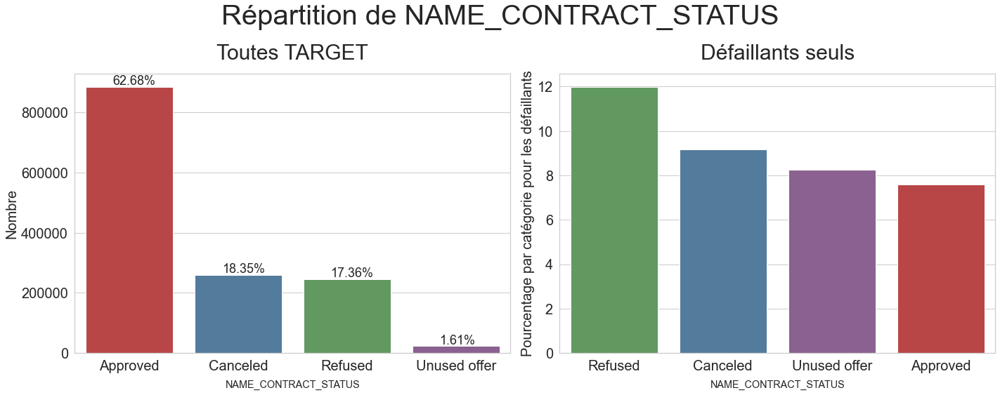

2:80: E501 line too long (99 > 79 characters)
6:80: E501 line too long (83 > 79 characters)
7:76: E127 continuation line over-indented for visual indent
7:80: E501 line too long (98 > 79 characters)
8:76: E127 continuation line over-indented for visual indent
8:80: E501 line too long (112 > 79 characters)
9:76: E127 continuation line over-indented for visual indent
9:80: E501 line too long (106 > 79 characters)
10:80: E501 line too long (107 > 79 characters)
11:76: E127 continuation line over-indented for visual indent
11:80: E501 line too long (106 > 79 characters)
12:80: E501 line too long (107 > 79 characters)


In [178]:
# Let us first see the unique categories of 'NAME_CONTRACT_STATUS'
eda_kernel_fonctions.print_unique_categories(prev_merged, 'NAME_CONTRACT_STATUS', show_counts=True)

# Plotting the Bar Plot for the Column
eda_kernel_fonctions. \
    plot_categorical_variables_bar(prev_merged, column_name='NAME_CONTRACT_STATUS',
                                                                           horizontal_adjust=0.25,
                                                                           figsize=(20, 8), fontsize_percent=18,
                                                                           palette1=['#cb3335', '#477ca8',
                                                                                     '#59a257', '#905998'],
                                                                           palette2=['#59a257', '#477ca8',
                                                                                     '#905998', '#cb3335'])

*****
**Conclusion** :

D'après les graphiques ci-dessus, nous constatons que :

- Le type le plus courant de statut de contrat est le statut approuvé. Environ 63% des crédits précédents ont un statut approuvé. Les deux statuts les plus courants suivants sont Annulé et Refusé, qui correspondent tous deux à environ 18% des prêts. Cela implique que la plupart des prêts sont approuvés et que seule une partie d'entre eux ne le sont pas. Le type d'état contractuel le moins fréquent est Offre non utilisée, qui correspond à seulement 1,61% de tous les prêts.
- Si l'on regarde le deuxième graphique secondaire pour le pourcentage de défaillants, on constate que les prêts qui avaient auparavant le statut Refusé ont tendance à être les plus défaillants dans les prêts actuels. Ils correspondent à environ 12% des défaillants de cette catégorie. Ils sont suivis par les prêts annulés qui correspondent à près de 9% du taux de défaillance. Ce comportement est assez attendu logiquement, puisque ces personnes ont dû être refusées parce qu'elles n'avaient pas le profil adéquat. Le taux de défaillance le plus faible est observé pour le statut de contrat Approuvé.
*****

<span>**Variable `CODE_REJECT_REASON`**</span>

Pourquoi la demande précédente a-t-elle été rejetée ?

_______________________________________________________________________________
Les catégories uniques de la variable 'CODE_REJECT_REASON' sont :
['XAP' 'LIMIT' nan 'HC' 'SCO' 'SCOFR' 'VERIF' 'CLIENT' 'XNA' 'SYSTEM']
_______________________________________________________________________________
Répartition dans chaque catégorie :
XAP       1145533
HC         145984
LIMIT       47773
SCO         32636
CLIENT      22771
SCOFR       10875
XNA          4378
VERIF        3079
SYSTEM        672
Name: CODE_REJECT_REASON, dtype: int64
_______________________________________________________________________________
Nombre de catégories uniques pour CODE_REJECT_REASON = 10


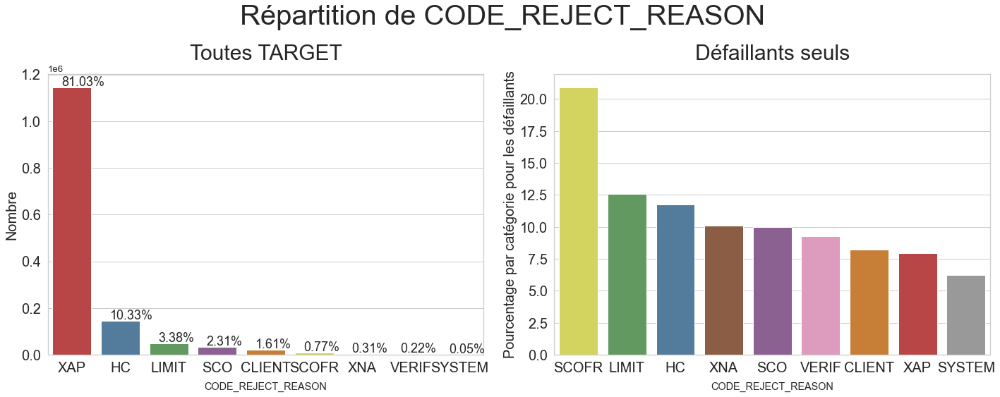

2:80: E501 line too long (97 > 79 characters)
6:80: E501 line too long (105 > 79 characters)
7:80: E501 line too long (124 > 79 characters)
7:88: E127 continuation line over-indented for visual indent
8:80: E501 line too long (118 > 79 characters)
8:88: E127 continuation line over-indented for visual indent
9:80: E501 line too long (118 > 79 characters)
10:80: E501 line too long (118 > 79 characters)
11:80: E501 line too long (118 > 79 characters)
12:80: E501 line too long (108 > 79 characters)
13:80: E501 line too long (118 > 79 characters)
13:88: E127 continuation line over-indented for visual indent
14:80: E501 line too long (118 > 79 characters)
15:80: E501 line too long (118 > 79 characters)
16:80: E501 line too long (118 > 79 characters)
17:80: E501 line too long (108 > 79 characters)


In [179]:
# Let us first see the unique categories of 'CODE_REJECT_REASON'
eda_kernel_fonctions.print_unique_categories(prev_merged, 'CODE_REJECT_REASON', show_counts=True)

# Plotting the Bar Plot for the Column
eda_kernel_fonctions. \
    plot_categorical_variables_bar(prev_merged, column_name='CODE_REJECT_REASON', horizontal_adjust=0.18,
                                                                                       figsize=(20, 8), fontsize_percent=18,
                                                                                       palette1=['#cb3335', '#477ca8',
                                                                                                 '#59a257', '#905998',
                                                                                                 '#df7f20', '#e6e64c',
                                                                                                 '#965a38', '#e890be',
                                                                                                 '#999999'],
                                                                                       palette2=['#e6e64c', '#59a257',
                                                                                                 '#477ca8', '#965a38',
                                                                                                 '#905998', '#e890be',
                                                                                                 '#df7f20', '#cb3335',
                                                                                                 '#999999'])

*****
**Conclusion** :

Le graphique ci-dessus montre la distribution de la variable catégorielle CODE_REJECT_REASON. 

Les idées suivantes peuvent être générées à partir du graphique ci-dessus :
- Le type de raison de rejet le plus courant est XAP, qui représente environ ~81%. Les autres raisons ne représentent qu'une petite partie des raisons de rejet. HC est le deuxième motif de rejet le plus fréquent avec seulement 10,33% d'occurrences.
- La distribution du pourcentage de défaillants pour chaque catégorie de CODE_REJECT_REASON est assez intéressante. Les demandeurs dont les demandes précédentes ont été rejetées par le code SCOFT ont le pourcentage le plus élevé de défaillants parmi eux (~21%). Ils sont suivis par LIMIT et HC, qui comptent respectivement 12,5 % et 12 % de défaillants.
- Le motif de rejet le plus courant, XAP, ne correspond qu'à 7,5 % des défaillants, et représente le deuxième plus faible pourcentage de défaillants après le code SYSTEM.
*****

<span>**Variable `CHANNEL_TYPE`**</span>

Cette variable décrit le canal par lequel le demander a été acquis pour le prêt précédent dans Home Credit.

_______________________________________________________________________________
Les catégories uniques de la variable 'CHANNEL_TYPE' sont :
['Stone' 'Credit and cash offices' 'Country-wide' 'Regional / Local'
 'AP+ (Cash loan)' 'Contact center' nan 'Channel of corporate sales'
 'Car dealer']
_______________________________________________________________________________
Répartition dans chaque catégorie :
Credit and cash offices       600342
Country-wide                  423062
Stone                         183508
Regional / Local               92472
Contact center                 58891
AP+ (Cash loan)                49624
Channel of corporate sales      5396
Car dealer                       406
Name: CHANNEL_TYPE, dtype: int64
_______________________________________________________________________________
Nombre de catégories uniques pour CHANNEL_TYPE = 9


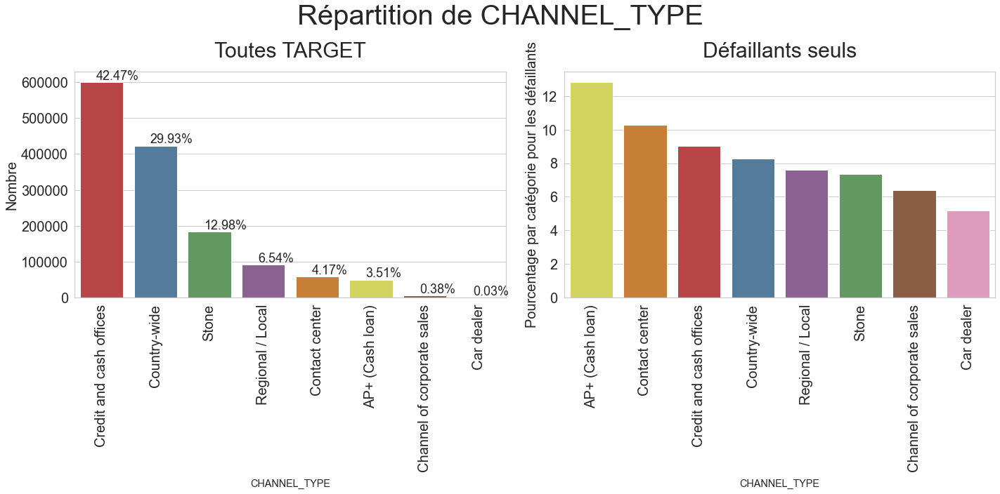

2:80: E501 line too long (91 > 79 characters)
7:68: E127 continuation line over-indented for visual indent
7:80: E501 line too long (102 > 79 characters)
8:68: E127 continuation line over-indented for visual indent
8:80: E501 line too long (105 > 79 characters)
9:68: E127 continuation line over-indented for visual indent
9:80: E501 line too long (98 > 79 characters)
10:80: E501 line too long (98 > 79 characters)
11:80: E501 line too long (98 > 79 characters)
12:80: E501 line too long (99 > 79 characters)
13:68: E127 continuation line over-indented for visual indent
13:80: E501 line too long (98 > 79 characters)
14:80: E501 line too long (98 > 79 characters)
15:80: E501 line too long (98 > 79 characters)
16:80: E501 line too long (99 > 79 characters)


In [180]:
# Let us first see the unique categories of 'CHANNEL_TYPE'
eda_kernel_fonctions.print_unique_categories(prev_merged, 'CHANNEL_TYPE', show_counts=True)

# Plotting the Bar Plot for the Column
eda_kernel_fonctions. \
    plot_categorical_variables_bar(prev_merged, column_name='CHANNEL_TYPE',
                                                                   horizontal_adjust=0.3, rotation=90,
                                                                   figsize=(20, 10), fontsize_percent=18,
                                                                   palette1=['#cb3335', '#477ca8',
                                                                             '#59a257', '#905998',
                                                                             '#df7f20', '#e6e64c',
                                                                             '#965a38', '#e890be'],
                                                                   palette2=['#e6e64c', '#df7f20',
                                                                             '#cb3335', '#477ca8',
                                                                             '#905998', '#59a257',
                                                                             '#965a38', '#e890be'])

*****
**Conclusion** :

Les deux graphiques ci-dessus montrent la distribution de CHANNEL_TYPE pour les prêts antérieurs dans Home Credit.

- Le premier graphique montre que la plupart des demandes ont été acquises par le biais des bureaux de crédit et de caisse, soit environ 42,47% des demandes, suivies par le canal national qui correspond à 29,93% des demandes. Le reste des types de canaux ne correspondait qu'à un nombre restreint de demandes.
- Le pourcentage de défaillance le plus élevé a été observé parmi les demandes pour lesquelles le type de canal était AP+ (prêt en espèces), ce qui correspondait à environ 13% de défaillants dans cette catégorie. Les autres canaux présentaient des pourcentages de défaillance plus faibles que celui-ci. Le canal Car Dealer a montré le plus faible pourcentage de défaillants dans cette catégorie (seulement 5%).
*****

<span>**Variable `PRODUCT_COMBINATION`**</span>

Combinaison détaillée des produits de la demande précédente.

_______________________________________________________________________________
Les catégories uniques de la variable 'PRODUCT_COMBINATION' sont :
['POS other with interest' 'Cash X-Sell: low' 'POS industry with interest'
 'POS household with interest' 'POS mobile without interest' 'Card Street'
 'Card X-Sell' 'Cash X-Sell: high' 'Cash' 'Cash Street: high'
 'Cash X-Sell: middle' 'POS mobile with interest'
 'POS household without interest' 'POS industry without interest'
 'Cash Street: low' nan 'Cash Street: middle'
 'POS others without interest']
_______________________________________________________________________________
Répartition dans chaque catégorie :
Cash                              235101
POS household with interest       226464
POS mobile with interest          190850
Cash X-Sell: middle               120036
Cash X-Sell: low                  110599
Card Street                        94594
POS industry with interest         83508
POS household without interest     71519
Car

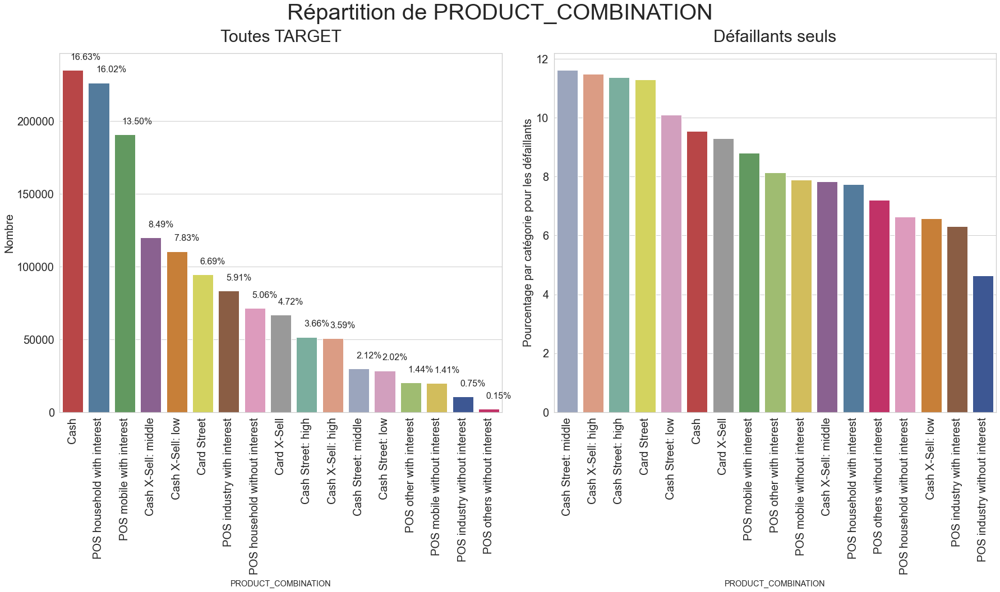

2:80: E501 line too long (98 > 79 characters)
6:80: E501 line too long (82 > 79 characters)
7:72: E127 continuation line over-indented for visual indent
7:80: E501 line too long (106 > 79 characters)
8:72: E127 continuation line over-indented for visual indent
8:80: E501 line too long (109 > 79 characters)
9:72: E127 continuation line over-indented for visual indent
9:80: E501 line too long (102 > 79 characters)
10:80: E501 line too long (102 > 79 characters)
11:80: E501 line too long (102 > 79 characters)
12:80: E501 line too long (102 > 79 characters)
13:80: E501 line too long (102 > 79 characters)
14:80: E501 line too long (102 > 79 characters)
15:80: E501 line too long (102 > 79 characters)
16:80: E501 line too long (102 > 79 characters)
17:80: E501 line too long (92 > 79 characters)
18:72: E127 continuation line over-indented for visual indent
18:80: E501 line too long (102 > 79 characters)
19:80: E501 line too long (102 > 79 characters)
20:80: E501 line too long (102 > 79 charact

In [181]:
# Let us first see the unique categories of 'CREDIT_ACTIVE'
eda_kernel_fonctions.print_unique_categories(prev_merged, 'PRODUCT_COMBINATION', show_counts=True)

# Plotting the Bar Plot for the Column
eda_kernel_fonctions. \
    plot_categorical_variables_bar(prev_merged, column_name='PRODUCT_COMBINATION',
                                                                       horizontal_adjust=0.3, rotation=90,
                                                                       figsize=(25, 15), fontsize_percent=16,
                                                                       palette1=['#cb3335', '#477ca8',
                                                                                 '#59a257', '#905998',
                                                                                 '#df7f20', '#e6e64c',
                                                                                 '#965a38', '#e890be',
                                                                                 '#999999', '#72b6a1',
                                                                                 '#e99675', '#95a3c3',
                                                                                 '#db96c0', '#a2c865',
                                                                                 '#e5c949', '#2f51a1',
                                                                                 '#d91a61'],
                                                                       palette2=['#95a3c3', '#e99675',
                                                                                 '#72b6a1', '#e6e64c',
                                                                                 '#db96c0', '#cb3335',
                                                                                 '#999999', '#59a257',
                                                                                 '#a2c865', '#e5c949',
                                                                                 '#905998', '#477ca8',
                                                                                 '#d91a61', '#e890be',
                                                                                 '#df7f20', '#965a38',
                                                                                 '#2f51a1'])

*****
**Conclusion** :

A partir de la distribution de PRODUCT_COMBINATION, nous pouvons générer les informations suivantes :
- Les trois types de combinaison de produits les plus courants sont l'argent liquide, les points de vente domestiques avec intérêt et les points de vente mobiles avec intérêt. Ils correspondent à environ 50% de toutes les demandes.
- En regardant le graphique du pourcentage de défaillants par catégorie, nous constatons que la tendance à la défaillance est la plus élevée chez Cash Street : catégorie mobile, Cash X-sell : élevé, Cash Street : élevé et Card Street qui sont tous proches de 11-11,5% de défaillants par catégorie. Le pourcentage le plus faible de défaillants se trouve dans la catégorie POS Industry without interest, qui correspond à environ 4,5% de défaillants.
*****

<span>**Variable `WEEKDAY_APPR_PROCESS_START`**</span>

Quel jour de la semaine le demandeur a-t-il demandé le prêt ?

_______________________________________________________________________________
Les catégories uniques de la variable 'WEEKDAY_APPR_PROCESS_START' sont :
['SATURDAY' 'FRIDAY' 'SUNDAY' 'THURSDAY' 'TUESDAY' 'MONDAY' 'WEDNESDAY'
 nan]
_______________________________________________________________________________
Répartition dans chaque catégorie :
WEDNESDAY    215519
TUESDAY      215058
MONDAY       214509
FRIDAY       213373
THURSDAY     211005
SATURDAY     204159
SUNDAY       140078
Name: WEEKDAY_APPR_PROCESS_START, dtype: int64
_______________________________________________________________________________
Nombre de catégories uniques pour WEEKDAY_APPR_PROCESS_START = 8


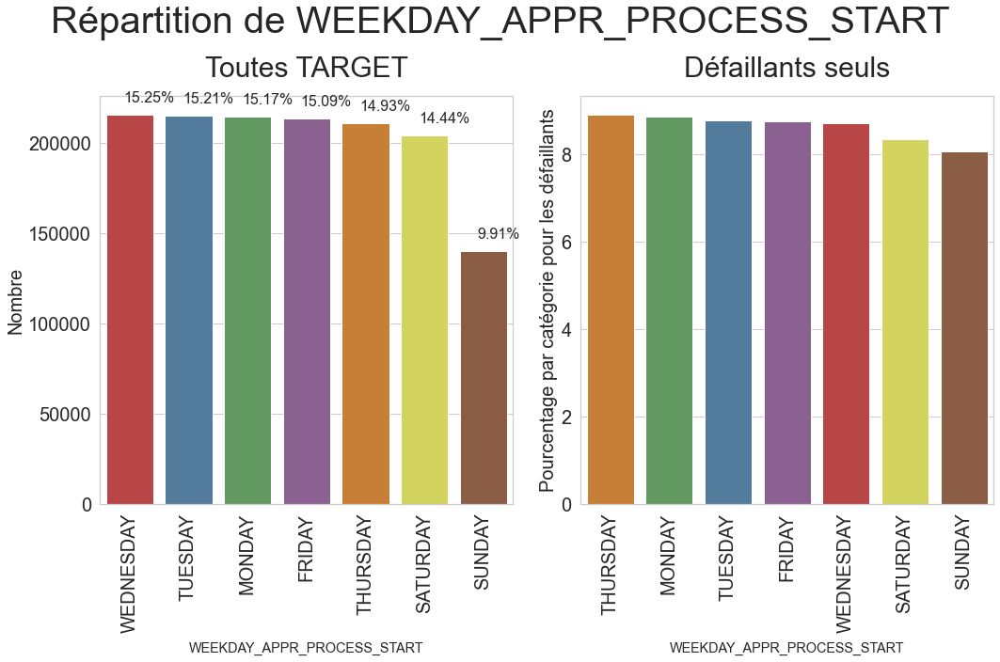

2:80: E501 line too long (105 > 79 characters)
6:80: E501 line too long (89 > 79 characters)
7:80: E127 continuation line over-indented for visual indent
7:80: E501 line too long (114 > 79 characters)
8:80: E127 continuation line over-indented for visual indent
8:80: E501 line too long (117 > 79 characters)
9:80: E127 continuation line over-indented for visual indent
9:80: E501 line too long (110 > 79 characters)
10:80: E501 line too long (110 > 79 characters)
11:80: E501 line too long (110 > 79 characters)
12:80: E501 line too long (100 > 79 characters)
13:80: E127 continuation line over-indented for visual indent
13:80: E501 line too long (110 > 79 characters)
14:80: E501 line too long (110 > 79 characters)
15:80: E501 line too long (110 > 79 characters)
16:80: E501 line too long (100 > 79 characters)


In [182]:
# Let us first see the unique categories of 'WEEKDAY_APPR_PROCESS_START'
eda_kernel_fonctions.print_unique_categories(prev_merged, 'WEEKDAY_APPR_PROCESS_START', show_counts=True)

# Plotting the Bar Plot for the Column
eda_kernel_fonctions. \
    plot_categorical_variables_bar(prev_merged, column_name='WEEKDAY_APPR_PROCESS_START',
                                                                               horizontal_adjust=0.3, rotation=90,
                                                                               figsize=(15, 10), fontsize_percent=16,
                                                                               palette1=['#cb3335', '#477ca8',
                                                                                         '#59a257', '#905998',
                                                                                         '#df7f20', '#e6e64c',
                                                                                         '#965a38'],
                                                                               palette2=['#df7f20', '#59a257',
                                                                                         '#477ca8', '#905998',
                                                                                         '#cb3335', '#e6e64c',
                                                                                         '#965a38'])

- Plutôt en semaine qu'en week-end, indifféremment des jours que ce soit pour les défaillants ou les non-défaillants.

<span>**Variable `FLAG_LAST_APPL_PER_CONTRACT`**</span>

- Indicateur si c'était la dernière demande pour le contrat précédent :
    - **`Y`** : OUI;
    
    - **`N`** : NON.
- Parfois par erreur du demandeur ou de notre greffier il peut y avoir plusieurs demandes pour un seul contrat.

_______________________________________________________________________________
Les catégories uniques de la variable 'FLAG_LAST_APPL_PER_CONTRACT' sont :
['Y' nan 'N']
_______________________________________________________________________________
Répartition dans chaque catégorie :
Y    1406387
N       7314
Name: FLAG_LAST_APPL_PER_CONTRACT, dtype: int64
_______________________________________________________________________________
Nombre de catégories uniques pour FLAG_LAST_APPL_PER_CONTRACT = 3


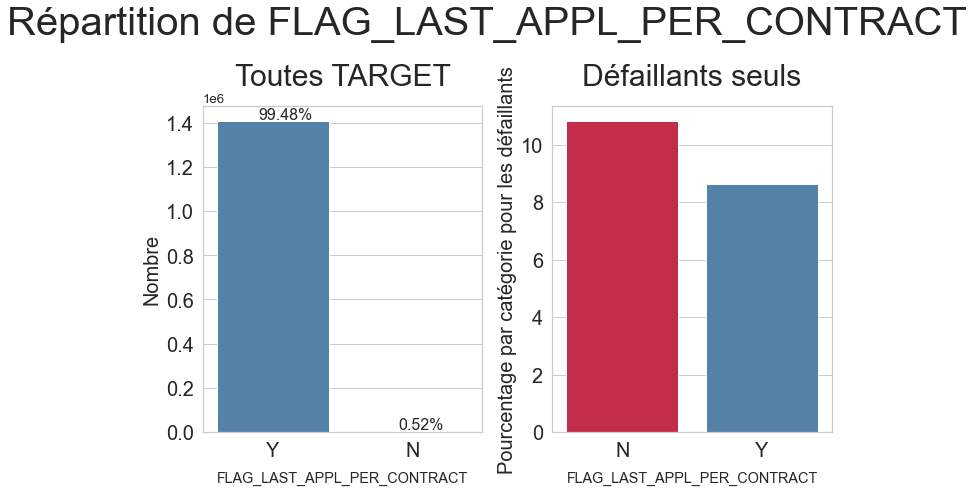

2:80: E501 line too long (106 > 79 characters)
6:80: E501 line too long (90 > 79 characters)
7:80: E501 line too long (105 > 79 characters)
7:84: E127 continuation line over-indented for visual indent
8:80: E501 line too long (120 > 79 characters)
8:84: E127 continuation line over-indented for visual indent
9:80: E501 line too long (117 > 79 characters)
9:84: E127 continuation line over-indented for visual indent
10:80: E501 line too long (117 > 79 characters)
10:84: E127 continuation line over-indented for visual indent


In [183]:
# Let us first see the unique categories of 'FLAG_LAST_APPL_PER_CONTRACT'
eda_kernel_fonctions.print_unique_categories(prev_merged, 'FLAG_LAST_APPL_PER_CONTRACT', show_counts=True)

# Plotting the Bar Plot for the Column
eda_kernel_fonctions. \
    plot_categorical_variables_bar(prev_merged, column_name='FLAG_LAST_APPL_PER_CONTRACT',
                                                                                   horizontal_adjust=0.3,
                                                                                   figsize=(10, 7), fontsize_percent=16,
                                                                                   palette1=['SteelBlue', 'crimson'],
                                                                                   palette2=['crimson', 'SteelBlue'])

- La dernière demande pour le dernier contrat est de 99,5%, mais pour plus de 10% des défaillants, ce n'était pas la dernière demande.

<span>**Variable `NAME_CASH_LOAN_PURPOSE`**</span>

Objectif du prêt d'argent.

_______________________________________________________________________________
Les catégories uniques de la variable 'NAME_CASH_LOAN_PURPOSE' sont :
['XAP' 'XNA' nan 'Other' 'Payments on other loans' 'Buying a used car'
 'Repairs' 'Education' 'Buying a new car' 'Everyday expenses' 'Medicine'
 'Car repairs' 'Urgent needs' 'Buying a holiday home / land'
 'Building a house or an annex' 'Furniture' 'Journey'
 'Purchase of electronic equipment' 'Wedding / gift / holiday'
 'Buying a home' 'Business development' 'Gasification / water supply'
 'Buying a garage' 'Hobby' 'Money for a third person'
 'Refusal to name the goal']
_______________________________________________________________________________
Répartition dans chaque catégorie :
XAP                                 786937
XNA                                 567351
Repairs                              20117
Other                                13432
Urgent needs                          7236
Buying a used car                     2469
B

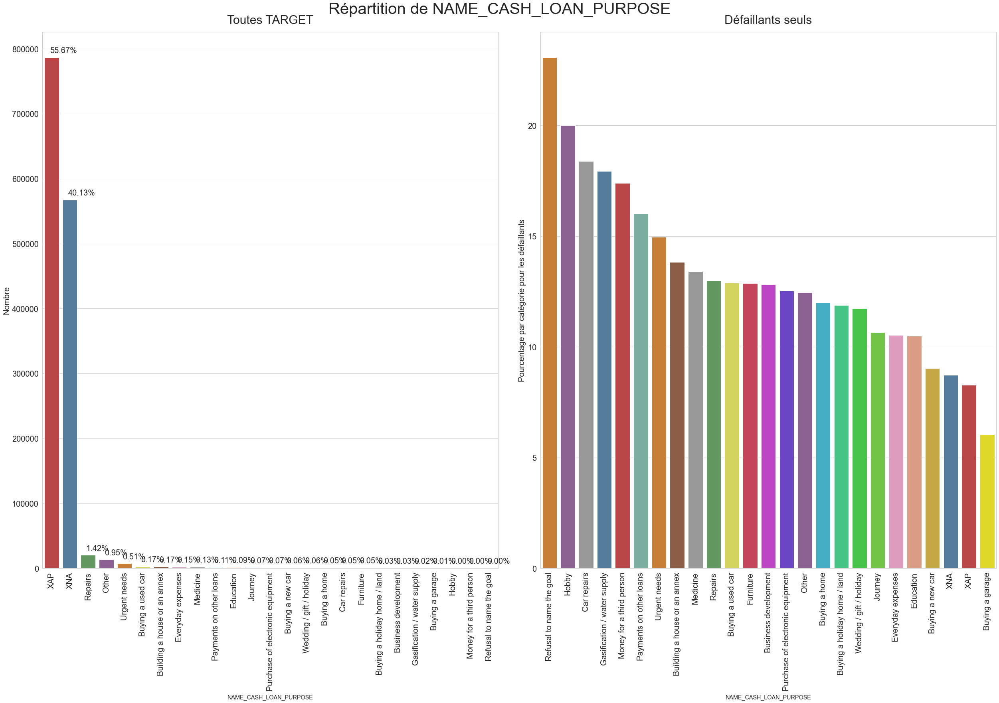

2:80: E501 line too long (101 > 79 characters)
6:80: E501 line too long (85 > 79 characters)
7:76: E127 continuation line over-indented for visual indent
7:80: E501 line too long (110 > 79 characters)
8:76: E127 continuation line over-indented for visual indent
8:80: E501 line too long (113 > 79 characters)
9:76: E127 continuation line over-indented for visual indent
9:80: E501 line too long (106 > 79 characters)
10:80: E501 line too long (106 > 79 characters)
11:80: E501 line too long (106 > 79 characters)
12:80: E501 line too long (106 > 79 characters)
13:80: E501 line too long (106 > 79 characters)
14:80: E501 line too long (106 > 79 characters)
15:80: E501 line too long (106 > 79 characters)
16:80: E501 line too long (106 > 79 characters)
17:80: E501 line too long (106 > 79 characters)
18:80: E501 line too long (106 > 79 characters)
19:80: E501 line too long (106 > 79 characters)
20:80: E501 line too long (106 > 79 characters)
21:80: E501 line too long (96 > 79 characters)
22:76: E

In [184]:
# Let us first see the unique categories of 'NAME_CASH_LOAN_PURPOSE'
eda_kernel_fonctions.print_unique_categories(prev_merged, 'NAME_CASH_LOAN_PURPOSE', show_counts=True)

# Plotting the Bar Plot for the Column
eda_kernel_fonctions. \
    plot_categorical_variables_bar(prev_merged, column_name='NAME_CASH_LOAN_PURPOSE',
                                                                           horizontal_adjust=0.3, rotation=90,
                                                                           figsize=(35, 25), fontsize_percent=20,
                                                                           palette1=['#cb3335', '#477ca8',
                                                                                     '#59a257', '#905998',
                                                                                     '#df7f20', '#e6e64c',
                                                                                     '#965a38', '#e890be',
                                                                                     '#999999', '#72b6a1',
                                                                                     '#e99675', '#95a3c3',
                                                                                     '#db96c0', '#a2c865',
                                                                                     '#e5c949', '#df7f20',
                                                                                     '#905998', '#52d26c',
                                                                                     '#c48f1e', '#cc5bdb',
                                                                                     '#7b358b', '#ebf633',
                                                                                     '#cb245d', '#51e787',
                                                                                     '#33f3f6'],
                                                                           palette2=['#df7f20', '#905998',
                                                                                     '#999999', '#477ca8',
                                                                                     '#cb3335', '#72b6a1',
                                                                                     '#df7f20', '#965a38',
                                                                                     '#999999', '#59a257',
                                                                                     '#e6e64c', '#d9314b',
                                                                                     '#cf31d9', '#6231d9',
                                                                                     '#905998', '#31bcd9',
                                                                                     '#31d983', '#31d935',
                                                                                     '#6cd931', '#e890be',
                                                                                     '#e99675', '#d9b331',
                                                                                     '#477ca8', '#cb3335',
                                                                                     '#fcf40a'])

- Les catégories des défaillants ne sont pas celles de l'ensemble catégories : XAP et XNA.

<span>**Variable `NAME_PAYMENT_TYPE`**</span>

Mode de paiement que le demandeur a choisi pour payer la demande précédente.

_______________________________________________________________________________
Les catégories uniques de la variable 'NAME_PAYMENT_TYPE' sont :
['XNA' 'Cash through the bank' nan 'Non-cash from your account'
 'Cashless from the account of the employer']
_______________________________________________________________________________
Répartition dans chaque catégorie :
Cash through the bank                        882700
XNA                                          522960
Non-cash from your account                     7100
Cashless from the account of the employer       941
Name: NAME_PAYMENT_TYPE, dtype: int64
_______________________________________________________________________________
Nombre de catégories uniques pour NAME_PAYMENT_TYPE = 5


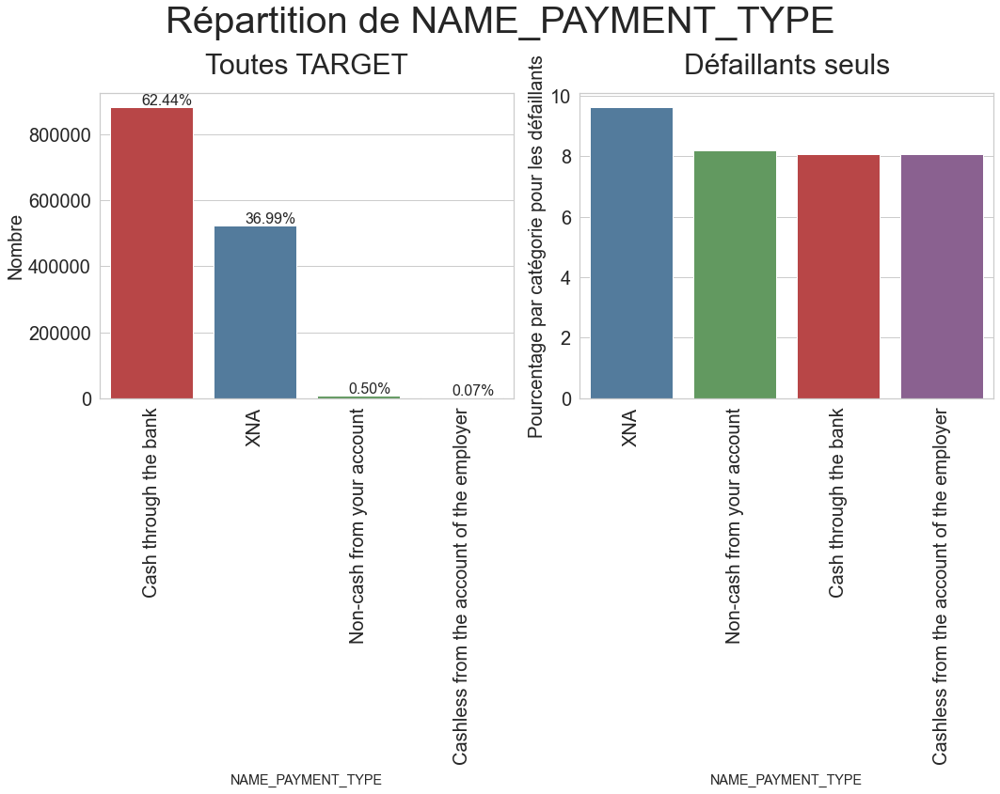

2:80: E501 line too long (96 > 79 characters)
6:80: E501 line too long (80 > 79 characters)
7:76: E127 continuation line over-indented for visual indent
7:80: E501 line too long (110 > 79 characters)
8:76: E127 continuation line over-indented for visual indent
8:80: E501 line too long (113 > 79 characters)
9:76: E127 continuation line over-indented for visual indent
9:80: E501 line too long (106 > 79 characters)
10:80: E501 line too long (107 > 79 characters)
11:76: E127 continuation line over-indented for visual indent
11:80: E501 line too long (106 > 79 characters)
12:80: E501 line too long (107 > 79 characters)


In [185]:
# Let us first see the unique categories of 'NAME_PAYMENT_TYPE'
eda_kernel_fonctions.print_unique_categories(prev_merged, 'NAME_PAYMENT_TYPE', show_counts=True)

# Plotting the Bar Plot for the Column
eda_kernel_fonctions. \
    plot_categorical_variables_bar(prev_merged, column_name='NAME_PAYMENT_TYPE',
                                                                           horizontal_adjust=0.3, rotation=90,
                                                                           figsize=(15, 12), fontsize_percent=16,
                                                                           palette1=['#cb3335', '#477ca8',
                                                                                     '#59a257', '#905998'],
                                                                           palette2=['#477ca8', '#59a257',
                                                                                     '#cb3335', '#905998'])

- Les défaillants ont des catégories différentes de celles de toutes les catégories 'Cash through the bank'.

<span>**Variable `NAME_TYPE_SUITE`**</span>

Qui a accompagné le demandeur lors de la demande précédente?

_______________________________________________________________________________
Les catégories uniques de la variable 'NAME_TYPE_SUITE' sont :
[nan 'Unaccompanied' 'Family' 'Spouse, partner' 'Children' 'Other_A'
 'Other_B' 'Group of people']
_______________________________________________________________________________
Répartition dans chaque catégorie :
Unaccompanied      427635
Family             181880
Spouse, partner     57586
Children            27106
Other_B             15073
Other_A              7820
Group of people      1929
Name: NAME_TYPE_SUITE, dtype: int64
_______________________________________________________________________________
Nombre de catégories uniques pour NAME_TYPE_SUITE = 8


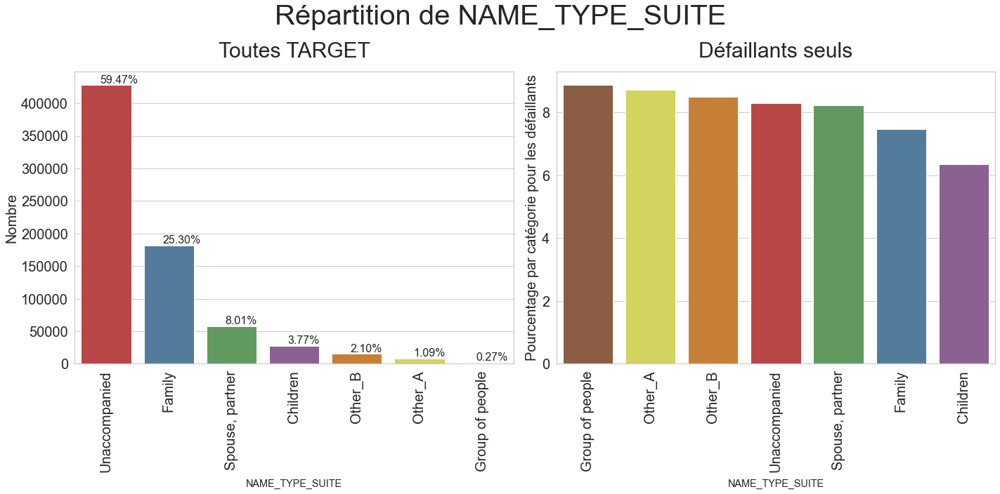

2:80: E501 line too long (94 > 79 characters)
7:72: E127 continuation line over-indented for visual indent
7:80: E501 line too long (106 > 79 characters)
8:72: E127 continuation line over-indented for visual indent
8:80: E501 line too long (109 > 79 characters)
9:72: E127 continuation line over-indented for visual indent
9:80: E501 line too long (102 > 79 characters)
10:80: E501 line too long (102 > 79 characters)
11:80: E501 line too long (102 > 79 characters)
12:80: E501 line too long (92 > 79 characters)
13:72: E127 continuation line over-indented for visual indent
13:80: E501 line too long (102 > 79 characters)
14:80: E501 line too long (102 > 79 characters)
15:80: E501 line too long (102 > 79 characters)
16:80: E501 line too long (92 > 79 characters)


In [186]:
# Let us first see the unique categories of 'NAME_TYPE_SUITE'
eda_kernel_fonctions.print_unique_categories(prev_merged, 'NAME_TYPE_SUITE', show_counts=True)

# Plotting the Bar Plot for the Column
eda_kernel_fonctions. \
    plot_categorical_variables_bar(prev_merged, column_name='NAME_TYPE_SUITE',
                                                                       horizontal_adjust=0.3, rotation=90,
                                                                       figsize=(20, 10), fontsize_percent=16,
                                                                       palette1=['#cb3335', '#477ca8',
                                                                                 '#59a257', '#905998',
                                                                                 '#df7f20', '#e6e64c',
                                                                                 '#965a38'],
                                                                       palette2=['#965a38', '#e6e64c',
                                                                                 '#df7f20', '#cb3335',
                                                                                 '#59a257', '#477ca8',
                                                                                 '#905998'])

- Les défaillants sont accompagnés (groupe de personne, Other_A et Other_B...) lors de leur demande de prêt alors que les non-défaillants ne sont pas accompagnés.

<span>**Variable `NAME_CLIENT_TYPE`**</span>

Le demandeur était-il un ancien ou un nouveau demandeur lors de la demande précédente ?

_______________________________________________________________________________
Les catégories uniques de la variable 'NAME_CLIENT_TYPE' sont :
['New' 'Repeater' 'Refreshed' 'XNA' nan]
_______________________________________________________________________________
Répartition dans chaque catégorie :
Repeater     1037682
New           259540
Refreshed     114936
XNA             1543
Name: NAME_CLIENT_TYPE, dtype: int64
_______________________________________________________________________________
Nombre de catégories uniques pour NAME_CLIENT_TYPE = 5


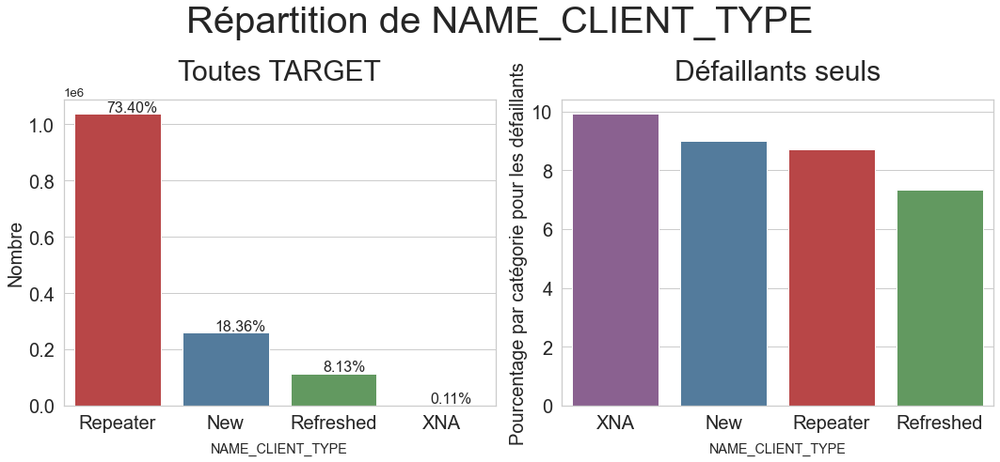

2:80: E501 line too long (95 > 79 characters)
7:72: E127 continuation line over-indented for visual indent
7:80: E501 line too long (93 > 79 characters)
8:72: E127 continuation line over-indented for visual indent
8:80: E501 line too long (108 > 79 characters)
9:72: E127 continuation line over-indented for visual indent
9:80: E501 line too long (102 > 79 characters)
10:80: E501 line too long (103 > 79 characters)
11:72: E127 continuation line over-indented for visual indent
11:80: E501 line too long (102 > 79 characters)
12:80: E501 line too long (103 > 79 characters)


In [187]:
# Let us first see the unique categories of 'NAME_CLIENT_TYPE'
eda_kernel_fonctions.print_unique_categories(prev_merged, 'NAME_CLIENT_TYPE', show_counts=True)

# Plotting the Bar Plot for the Column
eda_kernel_fonctions. \
    plot_categorical_variables_bar(prev_merged, column_name='NAME_CLIENT_TYPE',
                                                                       horizontal_adjust=0.3,
                                                                       figsize=(15, 7), fontsize_percent=16,
                                                                       palette1=['#cb3335', '#477ca8',
                                                                                 '#59a257', '#905998'],
                                                                       palette2=['#905998', '#477ca8',
                                                                                 '#cb3335', '#59a257'])

- La majorité des demandeurs non-défaillants ont déjà effectué un prêt mais pour les non-défaillants, la plupart sont nouveaux nouveaux ou n'ont pas voulu donner cette information.

<span>**Variable `NAME_GOODS_CATEGORY`**</span>

Quel type de marchandises le demandeur a-t-il demandé dans la demande précédente ?

_______________________________________________________________________________
Les catégories uniques de la variable 'NAME_GOODS_CATEGORY' sont :
['Vehicles' 'XNA' 'Furniture' 'Consumer Electronics' 'Mobile'
 'Audio/Video' 'Construction Materials' 'Gardening'
 'Photo / Cinema Equipment' 'Computers' 'Clothing and Accessories' nan
 'Homewares' 'Medical Supplies' 'Other' 'Jewelry' 'Office Appliances'
 'Tourism' 'Auto Accessories' 'Sport and Leisure' 'Medicine' 'Weapon'
 'Direct Sales' 'Fitness' 'Insurance' 'Additional Service' 'Education'
 'Animals']
_______________________________________________________________________________
Répartition dans chaque catégorie :
XNA                         797209
Mobile                      193743
Consumer Electronics        104785
Computers                    89923
Audio/Video                  85502
Furniture                    45439
Photo / Cinema Equipment     21707
Construction Materials       21356
Clothing and Accessories     19590
Auto Accessori

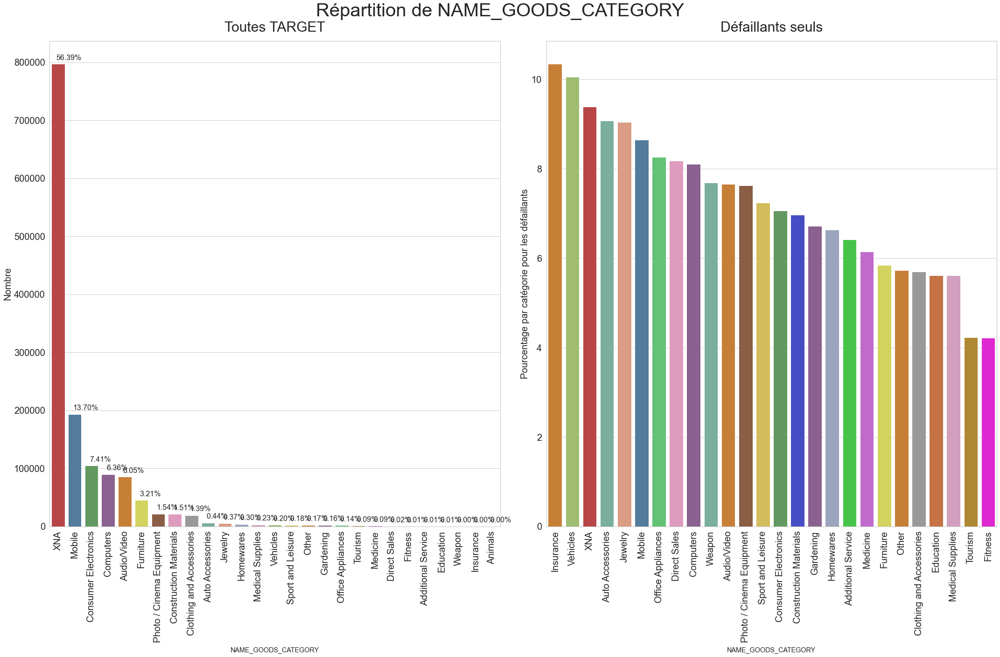

2:80: E501 line too long (98 > 79 characters)
6:80: E501 line too long (82 > 79 characters)
7:76: E127 continuation line over-indented for visual indent
7:80: E501 line too long (110 > 79 characters)
8:76: E127 continuation line over-indented for visual indent
8:80: E501 line too long (113 > 79 characters)
9:76: E127 continuation line over-indented for visual indent
9:80: E501 line too long (106 > 79 characters)
10:80: E501 line too long (106 > 79 characters)
11:80: E501 line too long (106 > 79 characters)
12:80: E501 line too long (106 > 79 characters)
13:80: E501 line too long (106 > 79 characters)
14:80: E501 line too long (106 > 79 characters)
15:80: E501 line too long (106 > 79 characters)
16:80: E501 line too long (106 > 79 characters)
17:80: E501 line too long (106 > 79 characters)
18:80: E501 line too long (106 > 79 characters)
19:80: E501 line too long (106 > 79 characters)
20:80: E501 line too long (106 > 79 characters)
21:80: E501 line too long (106 > 79 characters)
22:80: E

In [188]:
# Let us first see the unique categories of 'NAME_GOODS_CATEGORY'
eda_kernel_fonctions.print_unique_categories(prev_merged, 'NAME_GOODS_CATEGORY', show_counts=True)

# Plotting the Bar Plot for the Column
eda_kernel_fonctions. \
    plot_categorical_variables_bar(prev_merged, column_name='NAME_GOODS_CATEGORY',
                                                                           horizontal_adjust=0.3, rotation=90,
                                                                           figsize=(30, 20), fontsize_percent=16,
                                                                           palette1=['#cb3335', '#477ca8',
                                                                                     '#59a257', '#905998',
                                                                                     '#df7f20', '#e6e64c',
                                                                                     '#965a38', '#e890be',
                                                                                     '#999999', '#72b6a1',
                                                                                     '#e99675', '#95a3c3',
                                                                                     '#db96c0', '#a2c865',
                                                                                     '#e5c949', '#df7f20',
                                                                                     '#905998', '#52d26c',
                                                                                     '#c48f1e', '#cc5bdb',
                                                                                     '#7b358b', '#ebf633',
                                                                                     '#cb245d', '#51e787',
                                                                                     '#33f3f6', '#9c75aa',
                                                                                     '#423d78'],
                                                                           palette2=['#df7f20', '#a2c865',
                                                                                     '#cb3335', '#72b6a1',
                                                                                     '#e99675', '#477ca8',
                                                                                     '#52d26c', '#e890be',
                                                                                     '#905998', '#72b6a1',
                                                                                     '#df7f20', '#965a38',
                                                                                     '#e5c949', '#59a257',
                                                                                     '#313ad9', '#905998',
                                                                                     '#95a3c3', '#31d935',
                                                                                     '#cc5bdb', '#e6e64c',
                                                                                     '#df7f20', '#999999',
                                                                                     '#d96b31', '#db96c0',
                                                                                     '#c48f1e', '#fc0aec'])

- La majorité ne précisent pas l'objet de leur future dépense mais les équipements achetés sont plutôt de haute technologie alors que les défaillants ont des préoccupations plus terre à terre que loisirs... les assurance et les véhicules.

<span>**Variable `NAME_PORTFOLIO`**</span>

Est-ce que l'application précédente était pour CASH ou POS ou CAR ... ?

_______________________________________________________________________________
Les catégories uniques de la variable 'NAME_PORTFOLIO' sont :
['POS' 'Cash' 'XNA' 'Cards' nan 'Cars']
_______________________________________________________________________________
Répartition dans chaque catégorie :
POS      592460
Cash     391663
XNA      307213
Cards    121985
Cars        380
Name: NAME_PORTFOLIO, dtype: int64
_______________________________________________________________________________
Nombre de catégories uniques pour NAME_PORTFOLIO = 6


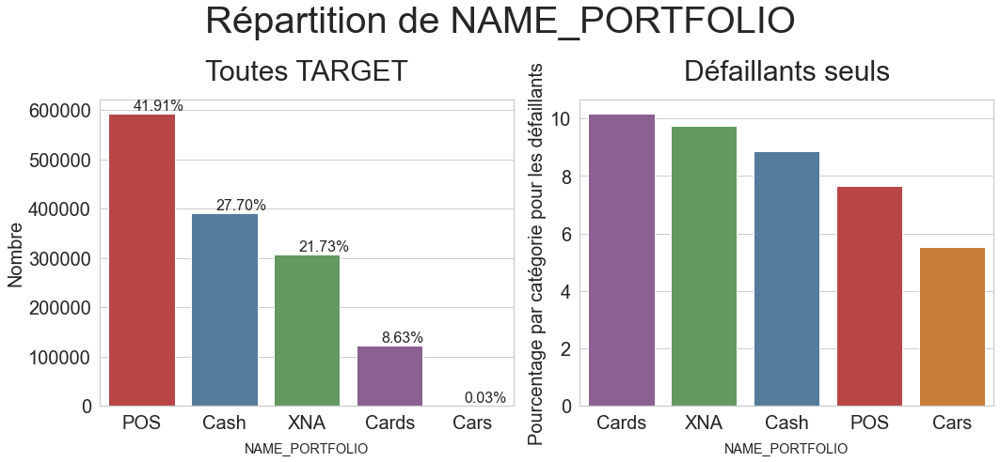

2:80: E501 line too long (93 > 79 characters)
7:72: E127 continuation line over-indented for visual indent
7:80: E501 line too long (93 > 79 characters)
8:72: E127 continuation line over-indented for visual indent
8:80: E501 line too long (108 > 79 characters)
9:72: E127 continuation line over-indented for visual indent
9:80: E501 line too long (102 > 79 characters)
10:80: E501 line too long (102 > 79 characters)
11:80: E501 line too long (92 > 79 characters)
12:72: E127 continuation line over-indented for visual indent
12:80: E501 line too long (102 > 79 characters)
13:80: E501 line too long (102 > 79 characters)
14:80: E501 line too long (92 > 79 characters)


In [189]:
# Let us first see the unique categories of 'NAME_PORTFOLIO'
eda_kernel_fonctions.print_unique_categories(prev_merged, 'NAME_PORTFOLIO', show_counts=True)

# Plotting the Bar Plot for the Column
eda_kernel_fonctions. \
    plot_categorical_variables_bar(prev_merged, column_name='NAME_PORTFOLIO',
                                                                       horizontal_adjust=0.3,
                                                                       figsize=(15, 7), fontsize_percent=16,
                                                                       palette1=['#cb3335', '#477ca8',
                                                                                 '#59a257', '#905998',
                                                                                 '#df7f20'],
                                                                       palette2=['#905998', '#59a257',
                                                                                 '#477ca8', '#cb3335',
                                                                                 '#df7f20'])

- L'application précédente de la majorité était POSH (42%) mais pour les défaillants l'application est Cards.

<span>**Variable `NAME_PRODUCT_TYPE`**</span>

L'application précédente était-elle x-sell o walk-in ?

_______________________________________________________________________________
Les catégories uniques de la variable 'NAME_PRODUCT_TYPE' sont :
['XNA' 'x-sell' 'walk-in' nan]
_______________________________________________________________________________
Répartition dans chaque catégorie :
XNA        900053
x-sell     385394
walk-in    128254
Name: NAME_PRODUCT_TYPE, dtype: int64
_______________________________________________________________________________
Nombre de catégories uniques pour NAME_PRODUCT_TYPE = 4


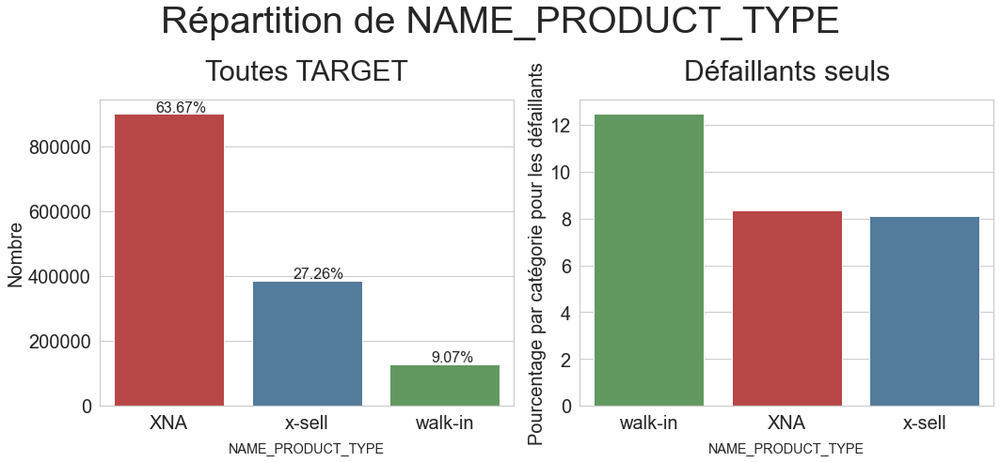

2:80: E501 line too long (96 > 79 characters)
6:80: E501 line too long (80 > 79 characters)
7:76: E127 continuation line over-indented for visual indent
7:80: E501 line too long (97 > 79 characters)
8:76: E127 continuation line over-indented for visual indent
8:80: E501 line too long (112 > 79 characters)
9:76: E127 continuation line over-indented for visual indent
9:80: E501 line too long (106 > 79 characters)
10:80: E501 line too long (96 > 79 characters)
11:76: E127 continuation line over-indented for visual indent
11:80: E501 line too long (106 > 79 characters)
12:80: E501 line too long (96 > 79 characters)


In [190]:
# Let us first see the unique categories of 'NAME_PRODUCT_TYPE'
eda_kernel_fonctions.print_unique_categories(prev_merged, 'NAME_PRODUCT_TYPE', show_counts=True)

# Plotting the Bar Plot for the Column
eda_kernel_fonctions. \
    plot_categorical_variables_bar(prev_merged, column_name='NAME_PRODUCT_TYPE',
                                                                           horizontal_adjust=0.3,
                                                                           figsize=(15, 7), fontsize_percent=16,
                                                                           palette1=['#cb3335', '#477ca8',
                                                                                     '#59a257'],
                                                                           palette2=['#59a257', '#cb3335',
                                                                                     '#477ca8'])

*****
**Conclusion** :

- Parmi les personnes qui ont répondu, l'ordre du type d'application précédente est inversée entre les défaillants (walk-in puis x-sell) et les non-défaillants (x-sell puis walk-in).
- L'information est également plus renseignée pour les non-défaillants.
*****

<span>**Variable `NAME_SELLER_INDUSTRY`**</span>

Secteur d'activité du vendeur.

_______________________________________________________________________________
Les catégories uniques de la variable 'NAME_SELLER_INDUSTRY' sont :
['Auto technology' 'XNA' 'Furniture' 'Consumer electronics' 'Connectivity'
 'Construction' 'Clothing' nan 'Industry' 'Tourism' 'Jewelry'
 'MLM partners']
_______________________________________________________________________________
Répartition dans chaque catégorie :
XNA                     715322
Consumer electronics    341701
Connectivity            238350
Furniture                48966
Construction             25417
Clothing                 19896
Industry                 16567
Auto technology           4080
Jewelry                   2107
MLM partners               921
Tourism                    374
Name: NAME_SELLER_INDUSTRY, dtype: int64
_______________________________________________________________________________
Nombre de catégories uniques pour NAME_SELLER_INDUSTRY = 12


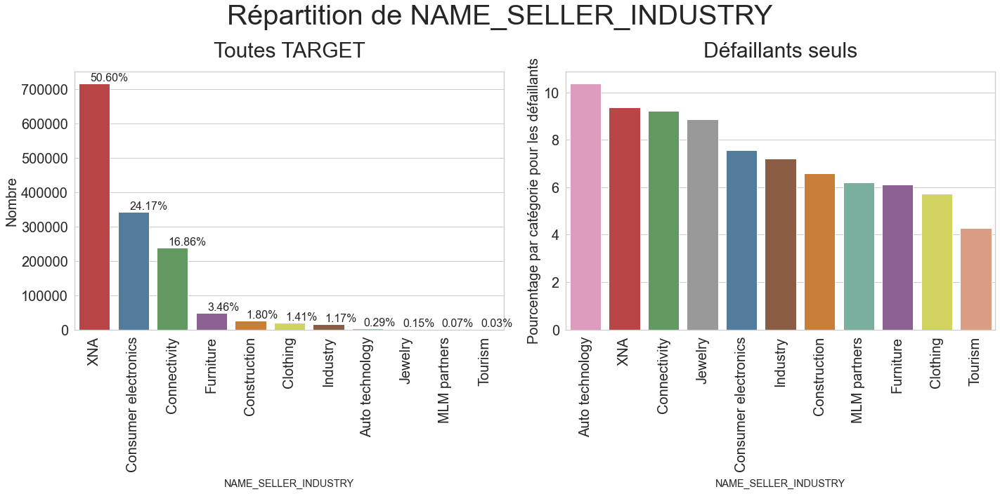

2:80: E501 line too long (99 > 79 characters)
6:80: E501 line too long (83 > 79 characters)
7:76: E127 continuation line over-indented for visual indent
7:80: E501 line too long (110 > 79 characters)
8:76: E127 continuation line over-indented for visual indent
8:80: E501 line too long (113 > 79 characters)
9:76: E127 continuation line over-indented for visual indent
9:80: E501 line too long (106 > 79 characters)
10:80: E501 line too long (106 > 79 characters)
11:80: E501 line too long (106 > 79 characters)
12:80: E501 line too long (106 > 79 characters)
13:80: E501 line too long (106 > 79 characters)
14:80: E501 line too long (96 > 79 characters)
15:76: E127 continuation line over-indented for visual indent
15:80: E501 line too long (106 > 79 characters)
16:80: E501 line too long (106 > 79 characters)
17:80: E501 line too long (106 > 79 characters)
18:80: E501 line too long (106 > 79 characters)
19:80: E501 line too long (106 > 79 characters)
20:80: E501 line too long (96 > 79 characte

In [191]:
# Let us first see the unique categories of 'NAME_SELLER_INDUSTRY'
eda_kernel_fonctions.print_unique_categories(prev_merged, 'NAME_SELLER_INDUSTRY', show_counts=True)

# Plotting the Bar Plot for the Column
eda_kernel_fonctions. \
    plot_categorical_variables_bar(prev_merged, column_name='NAME_SELLER_INDUSTRY',
                                                                           horizontal_adjust=0.3, rotation=90,
                                                                           figsize=(20, 10), fontsize_percent=16,
                                                                           palette1=['#cb3335', '#477ca8',
                                                                                     '#59a257', '#905998',
                                                                                     '#df7f20', '#e6e64c',
                                                                                     '#965a38', '#e890be',
                                                                                     '#999999', '#72b6a1',
                                                                                     '#e99675'],
                                                                           palette2=['#e890be', '#cb3335',
                                                                                     '#59a257', '#999999',
                                                                                     '#477ca8', '#965a38',
                                                                                     '#df7f20', '#72b6a1',
                                                                                     '#905998', '#e6e64c',
                                                                                     '#e99675'])

<span>**Variable `NAME_YIELD_GROUP`**</span>

Taux d'intérêt groupé en petit moyen et élevé de la demande précédente.

_______________________________________________________________________________
Les catégories uniques de la variable 'NAME_YIELD_GROUP' sont :
['low_normal' 'middle' 'XNA' 'high' 'low_action' nan]
_______________________________________________________________________________
Répartition dans chaque catégorie :
XNA           429198
middle        324971
high          306061
low_normal    274884
low_action     78587
Name: NAME_YIELD_GROUP, dtype: int64
_______________________________________________________________________________
Nombre de catégories uniques pour NAME_YIELD_GROUP = 6


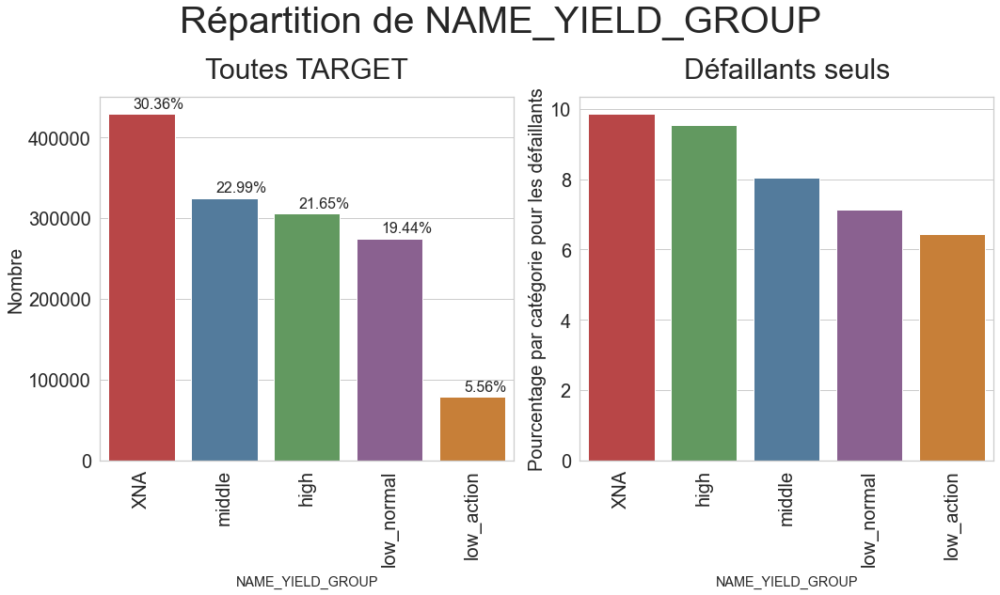

2:80: E501 line too long (95 > 79 characters)
7:76: E127 continuation line over-indented for visual indent
7:80: E501 line too long (110 > 79 characters)
8:76: E127 continuation line over-indented for visual indent
8:80: E501 line too long (112 > 79 characters)
9:76: E127 continuation line over-indented for visual indent
9:80: E501 line too long (106 > 79 characters)
10:80: E501 line too long (106 > 79 characters)
11:80: E501 line too long (96 > 79 characters)
12:76: E127 continuation line over-indented for visual indent
12:80: E501 line too long (106 > 79 characters)
13:80: E501 line too long (106 > 79 characters)
14:80: E501 line too long (96 > 79 characters)


In [192]:
# Let us first see the unique categories of 'NAME_YIELD_GROUP'
eda_kernel_fonctions.print_unique_categories(prev_merged, 'NAME_YIELD_GROUP', show_counts=True)

# Plotting the Bar Plot for the Column
eda_kernel_fonctions. \
    plot_categorical_variables_bar(prev_merged, column_name='NAME_YIELD_GROUP',
                                                                           horizontal_adjust=0.3, rotation=90,
                                                                           figsize=(15, 9), fontsize_percent=16,
                                                                           palette1=['#cb3335', '#477ca8',
                                                                                     '#59a257', '#905998',
                                                                                     '#df7f20'],
                                                                           palette2=['#cb3335', '#59a257',
                                                                                     '#477ca8', '#905998',
                                                                                     '#df7f20'])

- Les taux d'intérêt groupé de la demande précédente sont moyens pour les non-défaillants et élevés pour les défaillants.

<span>**Distribution des variables quantitatives**</span>

In [193]:
# Liste des variables quantitatives
cols_num_prev = \
    prev_merged.select_dtypes(include=[np.number]).columns.to_list()

cols_num_prev

['SK_ID_CURR',
 'TARGET',
 'SK_ID_PREV',
 'AMT_ANNUITY',
 'AMT_APPLICATION',
 'AMT_CREDIT',
 'AMT_DOWN_PAYMENT',
 'AMT_GOODS_PRICE',
 'HOUR_APPR_PROCESS_START',
 'NFLAG_LAST_APPL_IN_DAY',
 'RATE_DOWN_PAYMENT',
 'RATE_INTEREST_PRIMARY',
 'RATE_INTEREST_PRIVILEGED',
 'DAYS_DECISION',
 'SELLERPLACE_AREA',
 'CNT_PAYMENT',
 'DAYS_FIRST_DRAWING',
 'DAYS_FIRST_DUE',
 'DAYS_LAST_DUE_1ST_VERSION',
 'DAYS_LAST_DUE',
 'DAYS_TERMINATION',
 'NFLAG_INSURED_ON_APPROVAL']

<span>**Variable `DAYS_DECISION`**</span>

Cette variable indique le nombre de jours, par rapport à la demande actuelle, où la décision a été prise concernant la demande précédente.

_______________________________________________________________________________
Percentile de la variable DAYS_DECISION
Percentile 0 = -2922.0
Percentile 2 = -2748.0
Percentile 4 = -2612.0
Percentile 6 = -2499.0
Percentile 8 = -2383.0
Percentile 10 = -2257.0
Percentile 25 = -1313.0
Percentile 50 = -582.0
Percentile 75 = -271.0
Percentile 100 = -1.0
_______________________________________________________________________________


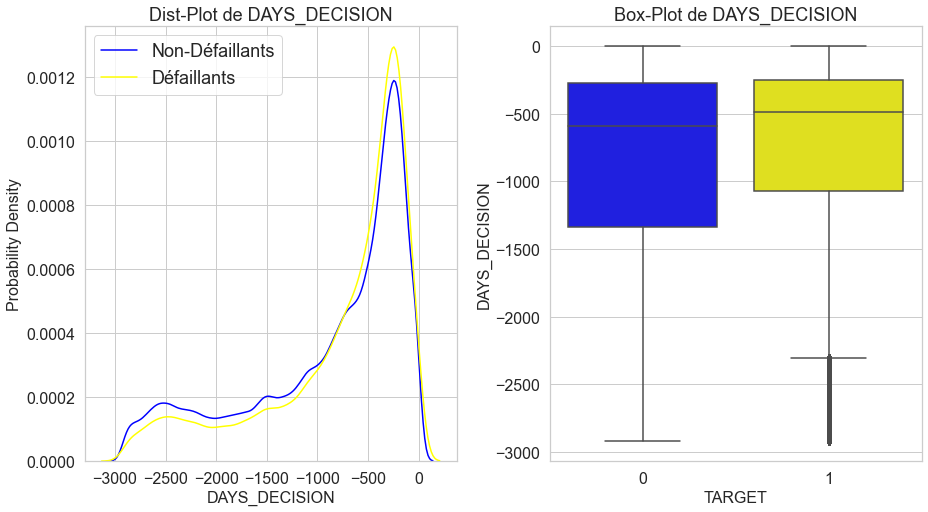

3:80: E501 line too long (106 > 79 characters)
6:80: E501 line too long (120 > 79 characters)


In [194]:
# Affiche les quantiles
eda_kernel_fonctions. \
    print_percentiles(prev_merged, 'DAYS_DECISION', percentiles=list(range(0, 11, 2)) + [25, 50, 75, 100])

# Affiche boxplot
eda_kernel_fonctions.plot_continuous_variables(prev_merged, 'DAYS_DECISION', plots=['distplot', 'box'], figsize=(15, 8))

*****
**Conclusion** :

- Dans le graphique ci-dessus, nous remarquons que pour les défaillants, le nombre de jours depuis lequel la décision a été prise est un peu moins élevé que pour les non-défaillants.
- Cela implique que la décision sur les demandes précédentes des défaillants est généralement plus récente que celle des non-défaillants.
*****

<span>**Variable `DAYS_FIRST_DRAWING`**</span>

Cette variable indique le nombre de jours depuis la demande actuelle où le premier déboursement de la demande précédente a été effectué.

_______________________________________________________________________________
Percentile de la variable DAYS_FIRST_DRAWING
Percentile 0 = -2922.0
Percentile 1 = -2451.0
Percentile 2 = -1179.0
Percentile 3 = -674.0
Percentile 4 = -406.0
Percentile 5 = -262.0
Percentile 6 = -156.0
Percentile 7 = 365243.0
Percentile 8 = 365243.0
Percentile 9 = 365243.0
Percentile 10 = 365243.0
Percentile 20 = 365243.0
Percentile 40 = 365243.0
Percentile 60 = 365243.0
Percentile 80 = 365243.0
Percentile 100 = 365243.0
_______________________________________________________________________________


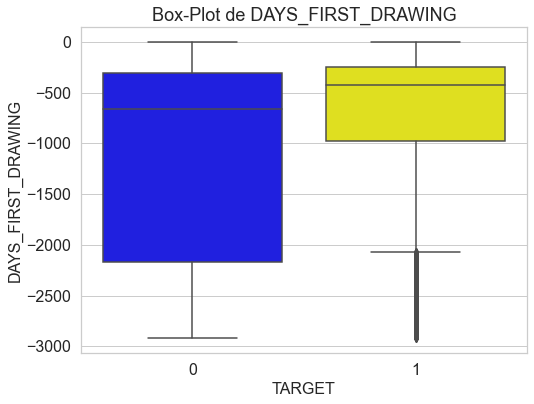

3:80: E501 line too long (115 > 79 characters)
7:80: E501 line too long (124 > 79 characters)


In [195]:
# Affiche les quantiles
eda_kernel_fonctions. \
    print_percentiles(prev_merged, 'DAYS_FIRST_DRAWING', percentiles=list(range(0, 11)) + list(range(20, 101, 20)))

# Affiche boxplot
eda_kernel_fonctions.plot_continuous_variables(prev_merged,
                                               'DAYS_FIRST_DRAWING', plots=['box'], figsize=(8, 6), scale_limits=[-3000, 0])

*****
**Conclusion** :

- En regardant les valeurs du quantile de DAYS_FIRST_DRAWING, il semble que la plupart des valeurs soient erronées, à commencer par les valeurs du 7ème percentile lui-même.
- Ces valeurs erronées devront être éliminées.
- Si nous essayons d'analyser la distribution de cette variable en supprimant les ponts erronés, nous constatons que la plupart des défaillants ont eu leur premier versement sur un crédit précédent plus récemment que les non-défaillants. 
- La valeur du 75e percentile pour les défaillants est également nettement inférieure à celle des non-défaillants.
*****

**Ces variables décrivent également le nombre de jours depuis l'application actuelle où certaines activités ont eu lieu.**

<span>**Variable `DAYS_FIRST_DUE`**</span>

Par rapport à la date d'application de l'application actuelle quand la première échéance était-elle censée être celle de l'application précédente ?

_______________________________________________________________________________
Percentile de la variable DAYS_FIRST_DUE
Percentile 0 = -2892.0
Percentile 2 = -2759.0
Percentile 4 = -2648.0
Percentile 6 = -2555.0
Percentile 8 = -2471.0
Percentile 10 = -2388.0
Percentile 20 = -1882.0
Percentile 40 = -1070.0
Percentile 60 = -647.0
Percentile 80 = -329.0
Percentile 100 = 365243.0
_______________________________________________________________________________


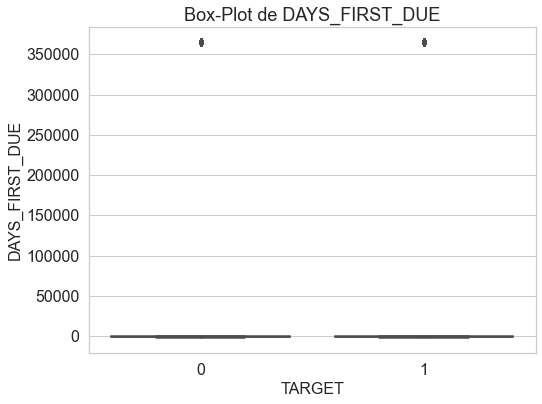

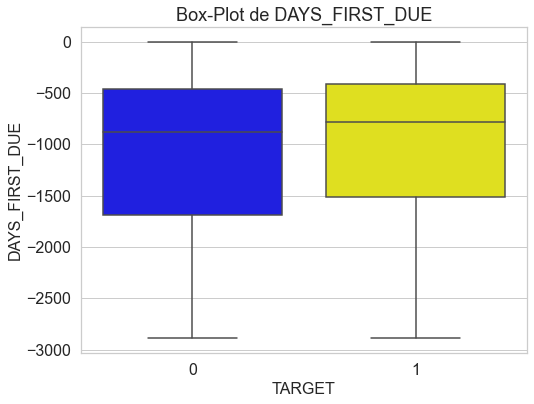

3:80: E501 line too long (111 > 79 characters)
6:80: E501 line too long (108 > 79 characters)
10:80: E501 line too long (120 > 79 characters)


In [196]:
# Affiche les quantiles
eda_kernel_fonctions. \
    print_percentiles(prev_merged, 'DAYS_FIRST_DUE', percentiles=list(range(0, 11, 2)) + [20, 40, 60, 80, 100])

# Affiche boxplot
eda_kernel_fonctions.plot_continuous_variables(prev_merged, 'DAYS_FIRST_DUE', plots=['box'], figsize=(8, 6))

# Zoom
eda_kernel_fonctions.plot_continuous_variables(prev_merged,
                                               'DAYS_FIRST_DUE', plots=['box'], figsize=(8, 6), scale_limits=[-3000, 0])

<span>**Variable `DAYS_LAST_DUE`**</span>

Par rapport à la date de demande de la demande actuelle quelle était la première échéance de la demande précédente ?

_______________________________________________________________________________
Percentile de la variable DAYS_LAST_DUE
Percentile 0 = -2889.0
Percentile 2 = -2534.0
Percentile 4 = -2400.0
Percentile 6 = -2290.0
Percentile 8 = -2186.0
Percentile 10 = -2079.0
Percentile 20 = -1554.0
Percentile 40 = -784.0
Percentile 60 = -333.0
Percentile 80 = 365243.0
Percentile 100 = 365243.0
_______________________________________________________________________________


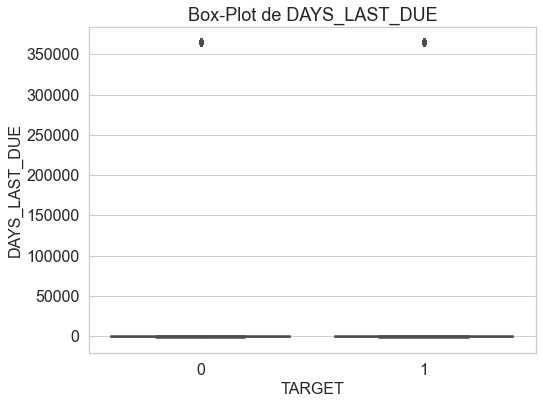

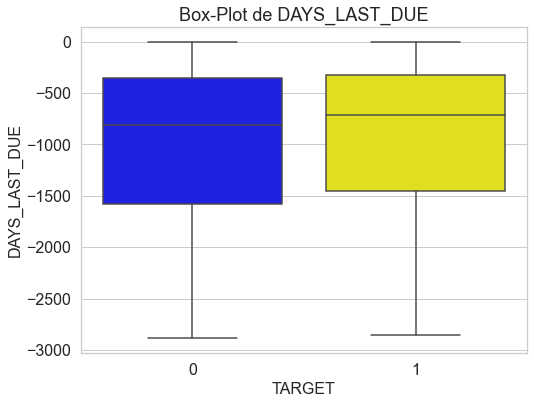

4:80: E501 line too long (80 > 79 characters)
7:80: E501 line too long (107 > 79 characters)
11:80: E501 line too long (119 > 79 characters)


In [197]:
# Affiche les quantiles
eda_kernel_fonctions. \
    print_percentiles(prev_merged, 'DAYS_LAST_DUE',
                      percentiles=list(range(0, 11, 2)) + [20, 40, 60, 80, 100])

# Affiche boxplot
eda_kernel_fonctions.plot_continuous_variables(prev_merged, 'DAYS_LAST_DUE', plots=['box'], figsize=(8, 6))

# Affiche boxplot
eda_kernel_fonctions.plot_continuous_variables(prev_merged,
                                               'DAYS_LAST_DUE', plots=['box'], figsize=(8, 6), scale_limits=[-3000, 0])

<span>**Variable `DAYS_LAST_DUE_1ST_VERSION`**</span>

Par rapport à la date de demande de la demande actuelle quelle était la première échéance de la demande précédente ?

_______________________________________________________________________________
Percentile de la variable DAYS_LAST_DUE_1ST_VERSION
Percentile 0 = -2801.0
Percentile 2 = -2516.0
Percentile 4 = -2380.0
Percentile 6 = -2267.0
Percentile 8 = -2159.0
Percentile 10 = -2045.0
Percentile 20 = -1498.0
Percentile 40 = -644.0
Percentile 60 = -146.0
Percentile 80 = 273.0
Percentile 100 = 365243.0
_______________________________________________________________________________


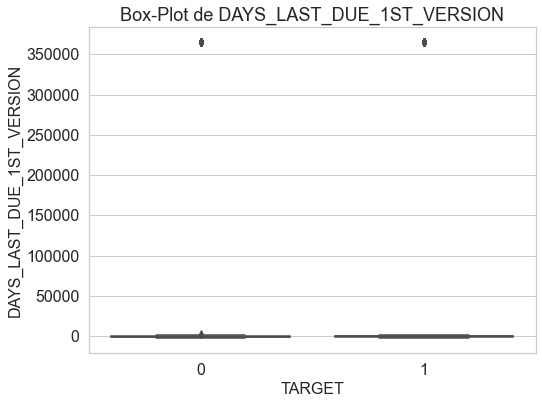

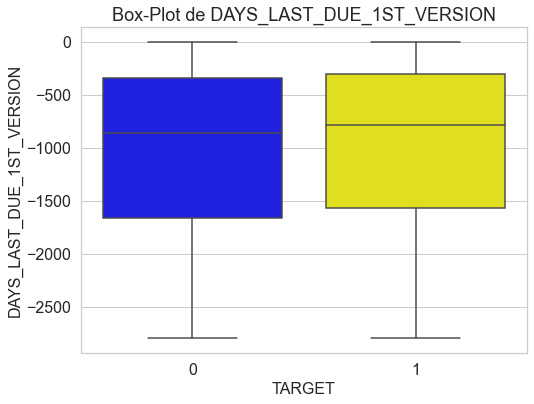

4:80: E501 line too long (80 > 79 characters)
8:80: E501 line too long (106 > 79 characters)
12:80: E501 line too long (106 > 79 characters)
13:80: E501 line too long (119 > 79 characters)
13:96: E127 continuation line over-indented for visual indent


In [198]:
# Affiche les quantiles
eda_kernel_fonctions. \
    print_percentiles(prev_merged, 'DAYS_LAST_DUE_1ST_VERSION',
                      percentiles=list(range(0, 11, 2)) + [20, 40, 60, 80, 100])

# Affiche boxplot
eda_kernel_fonctions.plot_continuous_variables(prev_merged,
                                               'DAYS_LAST_DUE_1ST_VERSION', plots=['box'], figsize=(8, 6))

# Affiche boxplot
eda_kernel_fonctions.plot_continuous_variables(prev_merged,
                                               'DAYS_LAST_DUE_1ST_VERSION', plots=['box'], figsize=(8, 6),
                                                                                               scale_limits=[-3000, 0])

<span>**Variable `DAYS_TERMINATION`**</span>

Par rapport à la date d'application de l'application actuelle quand était prévue la fin de l'application précédente ?

_______________________________________________________________________________
Percentile de la variable DAYS_TERMINATION
Percentile 0 = -2874.0
Percentile 2 = -2523.0
Percentile 4 = -2383.0
Percentile 6 = -2270.0
Percentile 8 = -2161.0
Percentile 10 = -2048.0
Percentile 20 = -1508.0
Percentile 40 = -743.0
Percentile 60 = -297.0
Percentile 80 = 365243.0
Percentile 100 = 365243.0
_______________________________________________________________________________


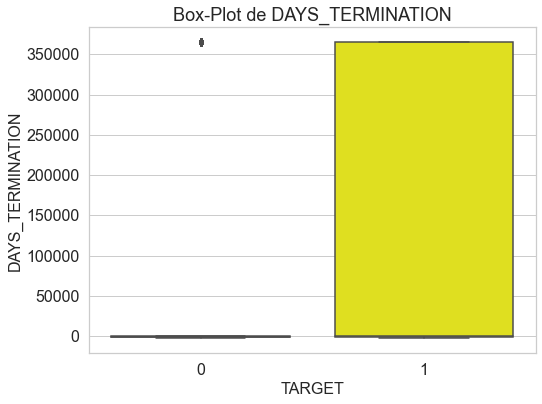

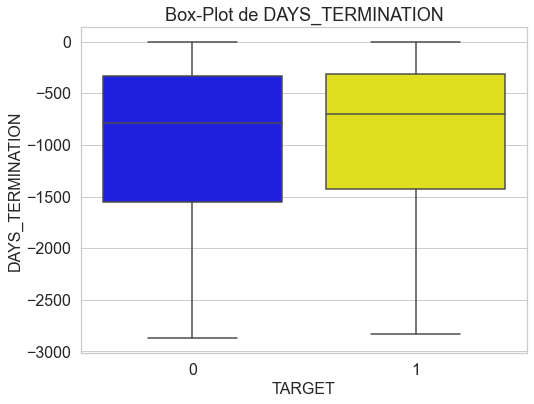

4:80: E501 line too long (80 > 79 characters)
7:80: E501 line too long (110 > 79 characters)
11:80: E501 line too long (122 > 79 characters)


In [199]:
# Affiche les quantiles
eda_kernel_fonctions. \
    print_percentiles(prev_merged, 'DAYS_TERMINATION',
                      percentiles=list(range(0, 11, 2)) + [20, 40, 60, 80, 100])

# Affiche boxplot
eda_kernel_fonctions.plot_continuous_variables(prev_merged, 'DAYS_TERMINATION', plots=['box'], figsize=(8, 6))

# Affiche boxplot
eda_kernel_fonctions.plot_continuous_variables(prev_merged,
                                               'DAYS_TERMINATION', plots=['box'], figsize=(8, 6), scale_limits=[-3000, 0])

*****
**Conclusion** :

- A partir de toutes les valeurs de percentile ci-dessus, nous nous rendons compte que toutes les variables Days ont ces valeurs erronées quelque part. - Ces valeurs doivent donc être remplacées afin que notre modèle ne soit pas affecté par celles-ci.
*****

<span>**Variable `AMT_ANNUITY`**</span>

Annuité de la demande précédente.

_______________________________________________________________________________
Percentile de la variable AMT_ANNUITY
Percentile 0 = 0.0
Percentile 2 = 2250.0
Percentile 4 = 2396.79
Percentile 6 = 2984.4414
Percentile 8 = 3375.0
Percentile 10 = 3790.9890000000005
Percentile 25 = 6257.8575
Percentile 50 = 11223.765
Percentile 75 = 20420.775
Percentile 100 = 418058.145
_______________________________________________________________________________


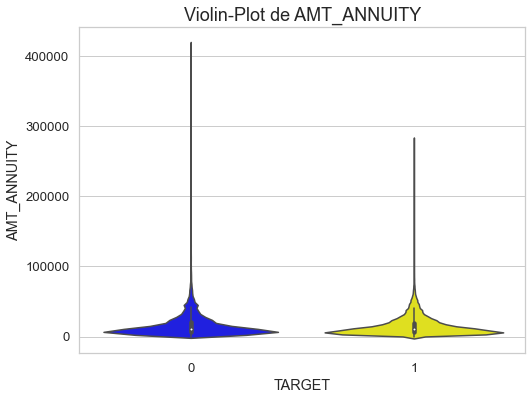

7:80: E501 line too long (108 > 79 characters)


In [200]:
# Affiche les quantiles
eda_kernel_fonctions. \
    print_percentiles(prev_merged, 'AMT_ANNUITY',
                      percentiles=list(range(0, 11, 2)) + [25, 50, 75, 100])

# Affiche violinplot
eda_kernel_fonctions.plot_continuous_variables(prev_merged, 'AMT_ANNUITY', plots=['violin'], figsize=(8, 6))

- Peu de différence.

<span>**Variable `AMT_APPLICATION`**</span>

Pour quel montant de crédit le demandeur a-t-il demandé lors de la demande précédente ?

_______________________________________________________________________________
Percentile de la variable AMT_APPLICATION
Percentile 0 = 0.0
Percentile 2 = 0.0
Percentile 4 = 0.0
Percentile 6 = 0.0
Percentile 8 = 0.0
Percentile 10 = 0.0
Percentile 25 = 19750.5
Percentile 50 = 70870.5
Percentile 75 = 180000.0
Percentile 100 = 5850000.0
_______________________________________________________________________________


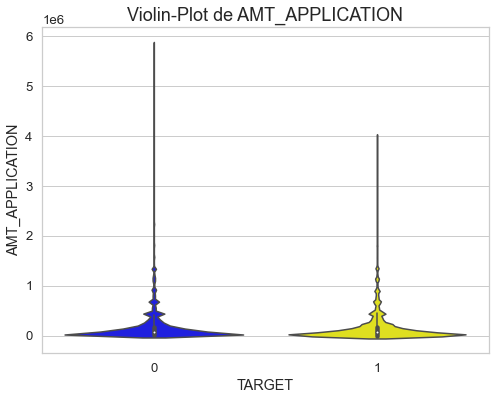

7:80: E501 line too long (112 > 79 characters)


In [201]:
# Affiche les quantiles
eda_kernel_fonctions. \
    print_percentiles(prev_merged, 'AMT_APPLICATION',
                      percentiles=list(range(0, 11, 2)) + [25, 50, 75, 100])

# Affiche violinplot
eda_kernel_fonctions.plot_continuous_variables(prev_merged, 'AMT_APPLICATION', plots=['violin'], figsize=(8, 6))

- Peu de différence.

<span>**Variable `AMT_CREDIT`**</span>

- Montant final du crédit sur la demande précédente.
- Il diffère de AMT_APPLICATION dans la mesure où AMT_APPLICATION est le montant pour lequel le demandeur a initialement fait une demande mais au cours de notre processus d'approbation il aurait pu recevoir un montant différent - AMT_CREDIT.

_______________________________________________________________________________
Percentile de la variable AMT_CREDIT
Percentile 0 = 0.0
Percentile 2 = 0.0
Percentile 4 = 0.0
Percentile 6 = 0.0
Percentile 8 = 0.0
Percentile 10 = 0.0
Percentile 25 = 24880.5
Percentile 50 = 80595.0
Percentile 75 = 215640.0
Percentile 100 = 4509688.5
_______________________________________________________________________________


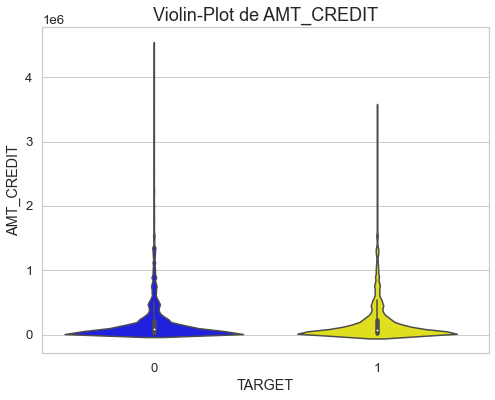

7:80: E501 line too long (107 > 79 characters)


In [202]:
# Affiche les quantiles
eda_kernel_fonctions. \
    print_percentiles(prev_merged, 'AMT_CREDIT',
                      percentiles=list(range(0, 11, 2)) + [25, 50, 75, 100])

# Affiche bviolinlot
eda_kernel_fonctions.plot_continuous_variables(prev_merged, 'AMT_CREDIT', plots=['violin'], figsize=(8, 6))

- Peu de différence.

<span>**Variable `AMT_DOWN_PAYMENT`**</span>

Acompte sur la demande précédente.

_______________________________________________________________________________
Percentile de la variable AMT_DOWN_PAYMENT
Percentile 0 = -0.9
Percentile 2 = 0.0
Percentile 4 = 0.0
Percentile 6 = 0.0
Percentile 8 = 0.0
Percentile 10 = 0.0
Percentile 25 = 0.0
Percentile 50 = 1791.0
Percentile 75 = 7695.0
Percentile 100 = 3060045.0
_______________________________________________________________________________


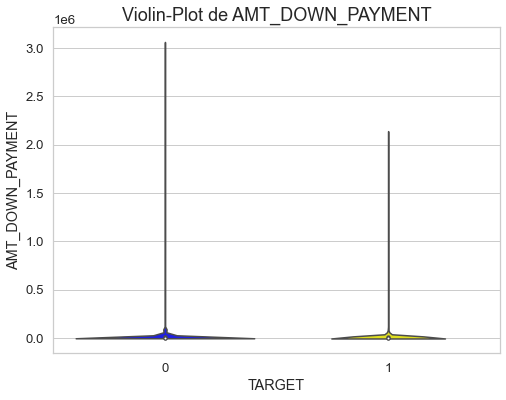

7:80: E501 line too long (113 > 79 characters)


In [203]:
# Affiche les quantiles
eda_kernel_fonctions. \
    print_percentiles(prev_merged, 'AMT_DOWN_PAYMENT',
                      percentiles=list(range(0, 11, 2)) + [25, 50, 75, 100])

# Affiche violinplot
eda_kernel_fonctions.plot_continuous_variables(prev_merged, 'AMT_DOWN_PAYMENT', plots=['violin'], figsize=(8, 6))

- Peu de différence.

<span>**Variable `AMT_GOODS_PRICE`**</span>

Prix du bien que le demandeur a demandé (le cas échéant) sur la demande précédente.

_______________________________________________________________________________
Percentile de la variable AMT_GOODS_PRICE
Percentile 0 = 0.0
Percentile 2 = 17730.0
Percentile 4 = 21240.0
Percentile 6 = 24259.23
Percentile 8 = 26995.5
Percentile 10 = 30140.55
Percentile 25 = 49828.5
Percentile 50 = 110245.5
Percentile 75 = 229500.0
Percentile 100 = 5850000.0
_______________________________________________________________________________


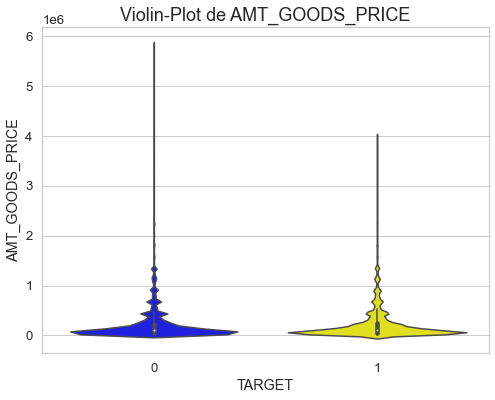

7:80: E501 line too long (112 > 79 characters)


In [204]:
# Affiche les quantiles
eda_kernel_fonctions. \
    print_percentiles(prev_merged, 'AMT_GOODS_PRICE',
                      percentiles=list(range(0, 11, 2)) + [25, 50, 75, 100])

# Affiche violinplot
eda_kernel_fonctions.plot_continuous_variables(prev_merged, 'AMT_GOODS_PRICE', plots=['violin'], figsize=(8, 6))

- Peu de différence.

<span>**Variable `HOUR_APPR_PROCESS_START`**</span>

À quelle heure environ le demandeur a-t-il fait sa demande pour la demande précédente ?

_______________________________________________________________________________
Percentile de la variable HOUR_APPR_PROCESS_START
Percentile 0 = 0.0
Percentile 2 = 6.0
Percentile 4 = 7.0
Percentile 6 = 7.0
Percentile 8 = 8.0
Percentile 10 = 8.0
Percentile 25 = 10.0
Percentile 50 = 12.0
Percentile 75 = 15.0
Percentile 100 = 23.0
_______________________________________________________________________________


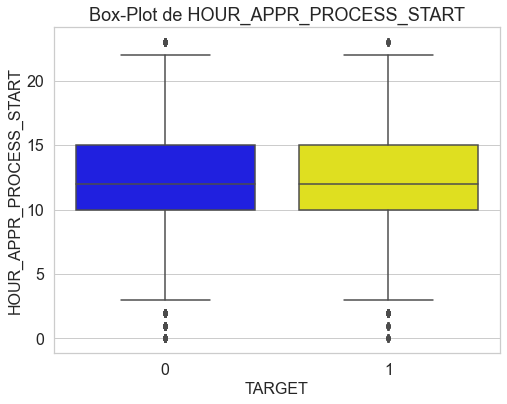

7:80: E501 line too long (117 > 79 characters)


In [205]:
# Affiche les quantiles
eda_kernel_fonctions. \
    print_percentiles(prev_merged, 'HOUR_APPR_PROCESS_START',
                      percentiles=list(range(0, 11, 2)) + [25, 50, 75, 100])

# Affiche boxplot
eda_kernel_fonctions.plot_continuous_variables(prev_merged, 'HOUR_APPR_PROCESS_START', plots=['box'], figsize=(8, 6))

- Peu de différence.

<span>**Variable `NFLAG_LAST_APPL_IN_DAY`**</span>

- Indicateur indiquant si la demande était la dernière demande par jour du demandeur.
- Il arrive que les demandeurs postulent pour plusieurs demandes par jour. - Dans de rares cas il peut aussi s'agir d'une erreur de notre système qui fait qu'une demande figure deux fois dans la base de données.

_______________________________________________________________________________
Percentile de la variable NFLAG_LAST_APPL_IN_DAY
Percentile 0 = 0.0
Percentile 2 = 1.0
Percentile 4 = 1.0
Percentile 6 = 1.0
Percentile 8 = 1.0
Percentile 10 = 1.0
Percentile 25 = 1.0
Percentile 50 = 1.0
Percentile 75 = 1.0
Percentile 100 = 1.0
_______________________________________________________________________________


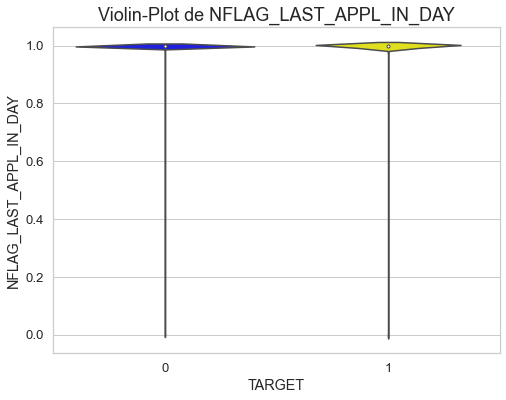

7:80: E501 line too long (119 > 79 characters)


In [206]:
# Affiche les quantiles
eda_kernel_fonctions. \
    print_percentiles(prev_merged, 'NFLAG_LAST_APPL_IN_DAY',
                      percentiles=list(range(0, 11, 2)) + [25, 50, 75, 100])

# Affiche violinplot
eda_kernel_fonctions.plot_continuous_variables(prev_merged, 'NFLAG_LAST_APPL_IN_DAY', plots=['violin'], figsize=(8, 6))

- Peu de différence.

<span>**Variable `RATE_DOWN_PAYMENT`**</span>

Taux d'acompte normalisé sur le crédit antérieur.

_______________________________________________________________________________
Percentile de la variable RATE_DOWN_PAYMENT
Percentile 0 = -1.4978763414307848e-05
Percentile 2 = 0.0
Percentile 4 = 0.0
Percentile 6 = 0.0
Percentile 8 = 0.0
Percentile 10 = 0.0
Percentile 25 = 0.0
Percentile 50 = 0.0624893282871192
Percentile 75 = 0.108911808824418
Percentile 100 = 1.0
_______________________________________________________________________________


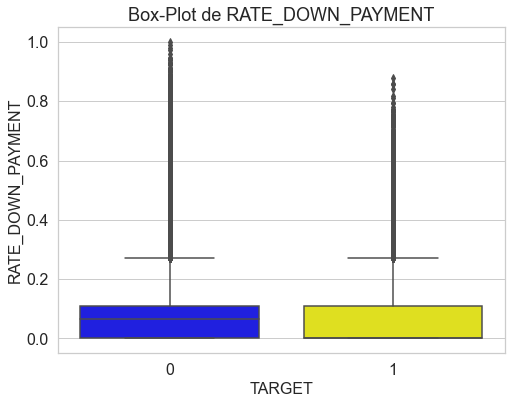

7:80: E501 line too long (111 > 79 characters)


In [207]:
# Affiche les quantiles
eda_kernel_fonctions. \
    print_percentiles(prev_merged, 'RATE_DOWN_PAYMENT',
                      percentiles=list(range(0, 11, 2)) + [25, 50, 75, 100])

# Affiche boxplot
eda_kernel_fonctions.plot_continuous_variables(prev_merged, 'RATE_DOWN_PAYMENT', plots=['box'], figsize=(8, 6))

- Peu de différence.

<span>**Variable `RATE_INTEREST_PRIMARY`**</span>

Taux d'intérêt normalisé sur le crédit antérieur.

_______________________________________________________________________________
Percentile de la variable RATE_INTEREST_PRIMARY
Percentile 0 = 0.0347812535418791
Percentile 2 = 0.1421426952283803
Percentile 4 = 0.1424402130794514
Percentile 6 = 0.1424402130794514
Percentile 8 = 0.1424402130794514
Percentile 10 = 0.1424402130794514
Percentile 25 = 0.1607163096452454
Percentile 50 = 0.1891363481808909
Percentile 75 = 0.1933299331293211
Percentile 100 = 1.0
_______________________________________________________________________________


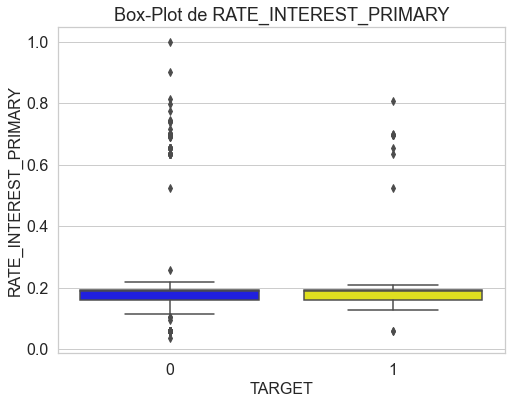

7:80: E501 line too long (115 > 79 characters)


In [208]:
# Affiche les quantiles
eda_kernel_fonctions. \
    print_percentiles(prev_merged, 'RATE_INTEREST_PRIMARY',
                      percentiles=list(range(0, 11, 2)) + [25, 50, 75, 100])

# Affiche boxplot
eda_kernel_fonctions.plot_continuous_variables(prev_merged, 'RATE_INTEREST_PRIMARY', plots=['box'], figsize=(8, 6))

- Peu de différence.

<span>**Variable `RATE_INTEREST_PRIVILEGED`**</span>

Taux d'intérêt normalisé sur le crédit antérieur.

_______________________________________________________________________________
Percentile de la variable RATE_INTEREST_PRIVILEGED
Percentile 0 = 0.3731501057082452
Percentile 2 = 0.5687103594080338
Percentile 4 = 0.5687103594080338
Percentile 6 = 0.6379492600422833
Percentile 8 = 0.6379492600422833
Percentile 10 = 0.6379492600422833
Percentile 25 = 0.715644820295983
Percentile 50 = 0.8350951374207188
Percentile 75 = 0.852536997885835
Percentile 100 = 1.0
_______________________________________________________________________________


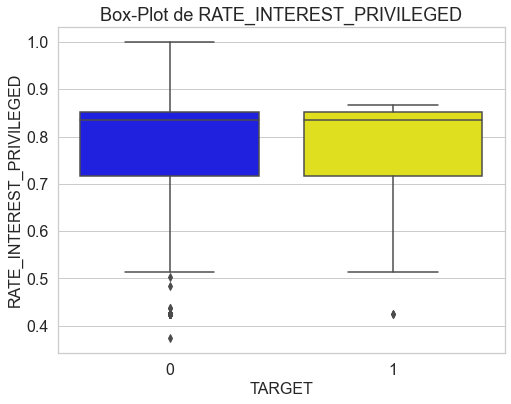

7:80: E501 line too long (118 > 79 characters)


In [209]:
# Affiche les quantiles
eda_kernel_fonctions. \
    print_percentiles(prev_merged, 'RATE_INTEREST_PRIVILEGED',
                      percentiles=list(range(0, 11, 2)) + [25, 50, 75, 100])

# Affiche boxplot
eda_kernel_fonctions.plot_continuous_variables(prev_merged, 'RATE_INTEREST_PRIVILEGED', plots=['box'], figsize=(8, 6))

- Peu de différence.

<span>**Variable `SELLERPLACE_AREA`**</span>

Zone de vente du vendeur, lieu de la demande précédente.

_______________________________________________________________________________
Percentile de la variable SELLERPLACE_AREA
Percentile 0 = -1.0
Percentile 2 = -1.0
Percentile 4 = -1.0
Percentile 6 = -1.0
Percentile 8 = -1.0
Percentile 10 = -1.0
Percentile 25 = -1.0
Percentile 50 = 4.0
Percentile 75 = 85.0
Percentile 100 = 4000000.0
_______________________________________________________________________________


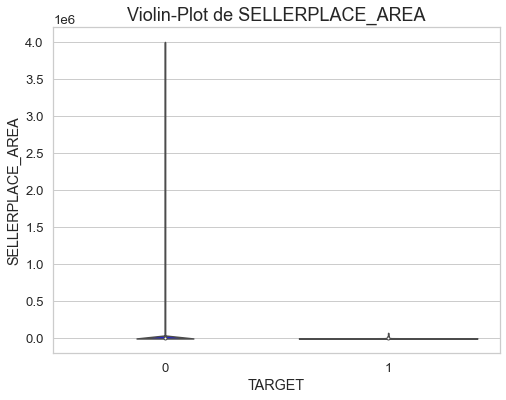

7:80: E501 line too long (113 > 79 characters)


In [210]:
# Affiche les quantiles
eda_kernel_fonctions. \
    print_percentiles(prev_merged, 'SELLERPLACE_AREA',
                      percentiles=list(range(0, 11, 2)) + [25, 50, 75, 100])

# Affiche violinplot
eda_kernel_fonctions.plot_continuous_variables(prev_merged, 'SELLERPLACE_AREA', plots=['violin'], figsize=(8, 6))

- Peu de différence.

<span>**Variable `CNT_PAYMENT`**</span>

Durée du crédit précédent à la demande de la demande précédente.

_______________________________________________________________________________
Percentile de la variable CNT_PAYMENT
Percentile 0 = 0.0
Percentile 2 = 0.0
Percentile 4 = 0.0
Percentile 6 = 0.0
Percentile 8 = 0.0
Percentile 10 = 0.0
Percentile 25 = 6.0
Percentile 50 = 12.0
Percentile 75 = 24.0
Percentile 100 = 84.0
_______________________________________________________________________________


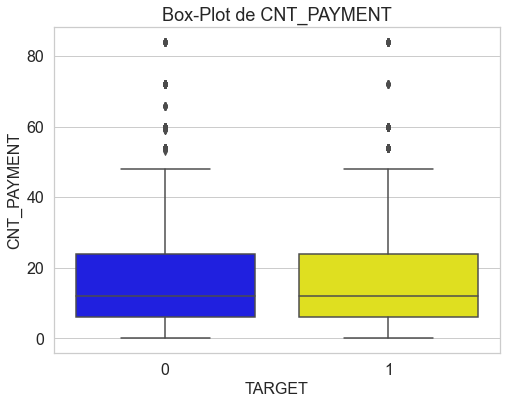

7:80: E501 line too long (105 > 79 characters)


In [211]:
# Affiche les quantiles
eda_kernel_fonctions. \
    print_percentiles(prev_merged, 'CNT_PAYMENT',
                      percentiles=list(range(0, 11, 2)) + [25, 50, 75, 100])

# Affiche boxplot
eda_kernel_fonctions.plot_continuous_variables(prev_merged, 'CNT_PAYMENT', plots=['box'], figsize=(8, 6))

- Peu de différence.

<span>**Variable `NFLAG_INSURED_ON_APPROVAL`**</span>

Le demandeur a-t-il demandé une assurance lors de la demande précédente ?

_______________________________________________________________________________
Percentile de la variable NFLAG_INSURED_ON_APPROVAL
Percentile 0 = 0.0
Percentile 2 = 0.0
Percentile 4 = 0.0
Percentile 6 = 0.0
Percentile 8 = 0.0
Percentile 10 = 0.0
Percentile 25 = 0.0
Percentile 50 = 0.0
Percentile 75 = 1.0
Percentile 100 = 1.0
_______________________________________________________________________________


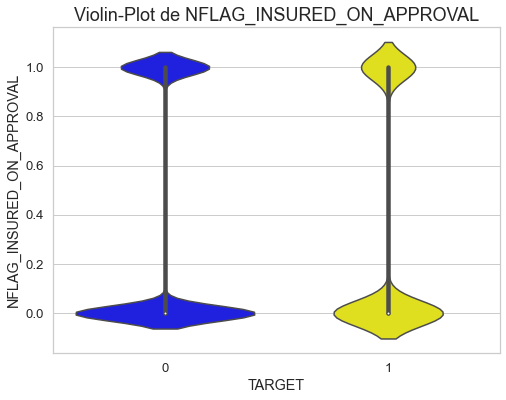

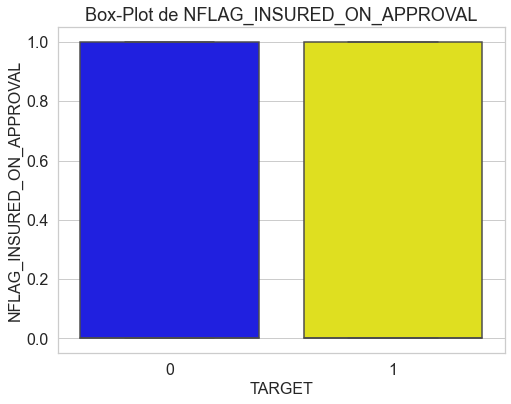

8:80: E501 line too long (109 > 79 characters)
12:80: E501 line too long (106 > 79 characters)


In [212]:
# Affiche les quantiles
eda_kernel_fonctions. \
    print_percentiles(prev_merged, 'NFLAG_INSURED_ON_APPROVAL',
                      percentiles=list(range(0, 11, 2)) + [25, 50, 75, 100])

# Affiche violinplot
eda_kernel_fonctions.plot_continuous_variables(prev_merged,
                                               'NFLAG_INSURED_ON_APPROVAL', plots=['violin'], figsize=(8, 6))

# Affiche boxplot
eda_kernel_fonctions.plot_continuous_variables(prev_merged,
                                               'NFLAG_INSURED_ON_APPROVAL', plots=['box'], figsize=(8, 6))

- Peu de différence.

#### <span>2.9.3. Analyse exploratoire multivariée</span>

<span>**Corrélation entre les variables catégorielles**</span>

**Phi-K Matrix**

_______________________________________________________________________________


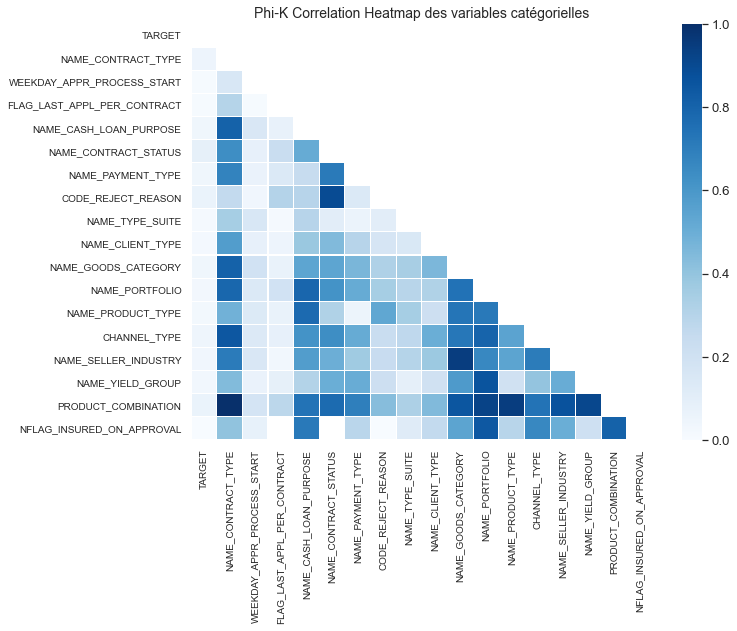

_______________________________________________________________________________
Les catégories présentant les valeurs les plus élevées de la corrélation Phi-K avec la variable cible sont les suivantes :


Variable,Phik-Correlation
NAME_CONTRACT_STATUS,0.0883
PRODUCT_COMBINATION,0.0638
CODE_REJECT_REASON,0.0628
NAME_CONTRACT_TYPE,0.0509
CHANNEL_TYPE,0.0503
NAME_GOODS_CATEGORY,0.0430
NAME_CASH_LOAN_PURPOSE,0.0403
NAME_PAYMENT_TYPE,0.0398
NAME_SELLER_INDUSTRY,0.0381
NAME_YIELD_GROUP,0.0346


4:80: E501 line too long (95 > 79 characters)


_______________________________________________________________________________


In [213]:
cols_for_phik = ['TARGET'] + \
    prev_merged.dtypes[prev_merged.dtypes == 'object'].index.tolist() \
    + ['NFLAG_INSURED_ON_APPROVAL']
eda_kernel_fonctions.plot_phik_matrix(prev_merged, cols_for_phik, figsize=(11, 9), fontsize=10)

*****
**Conclusion** :

À partir de la carte thermique ci-dessus des valeurs du coefficient Phi-K pour les variables catégorielles, nous observons que :
- La variables PRODUCT_COMBINATION montre une association avec beaucoup d'autres variables telles que NAME_CONTRACT_TYPE, NAME_PRODUCT_TYPE, NAME_PORTFOLIO, etc.
- La variable NOM_GOODS_CATEGORY est également fortement associée à NOM_SELLER_INDUSTRY.
- Si nous examinons l'association avec la variable TARGET, nous constatons que les variables NAME_CONTRACT_STATUS, PRODUCT_COMBINATION, CODE_REJECT_REASON font partie des variables les plus fortement associées et devraient faire l'objet d'une étude plus approfondie.
*****

<span>**Corrélation entre les variables numériques**</span>

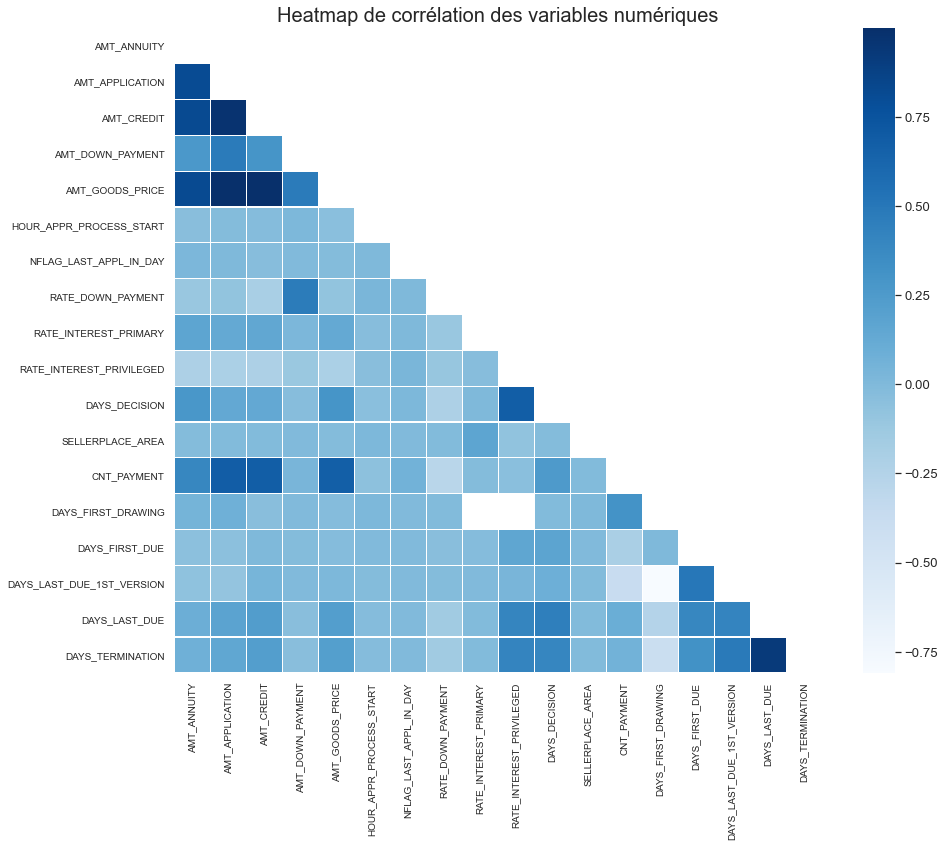

In [214]:
corr_mat = \
    eda_kernel_fonctions.correlation_matrix(prev_merged,
                                            ['SK_ID_CURR', 'SK_ID_PREV',
                                             'NFLAG_INSURED_ON_APPROVAL'],
                                            cmap='Blues',
                                            figsize=(14, 12))

corr_mat.plot_correlation_matrix()

In [215]:
# Seeing the top columns with highest phik-correlation with the target variable in bureau table
top_corr_target_df = corr_mat.target_top_corr()
print('_' * 79)
titre1 = '\nLes variables ayant les valeurs les plus élevées de Phik'
print(titre1 + '-corrélation avec la variable cible sont les suivantes :')
display(top_corr_target_df.style.hide_index())
print('_'*79)

interval columns not set, guessing: ['TARGET', 'AMT_ANNUITY']
interval columns not set, guessing: ['TARGET', 'AMT_APPLICATION']
interval columns not set, guessing: ['TARGET', 'AMT_CREDIT']
interval columns not set, guessing: ['TARGET', 'AMT_DOWN_PAYMENT']
interval columns not set, guessing: ['TARGET', 'AMT_GOODS_PRICE']
interval columns not set, guessing: ['TARGET', 'HOUR_APPR_PROCESS_START']
interval columns not set, guessing: ['TARGET', 'NFLAG_LAST_APPL_IN_DAY']
interval columns not set, guessing: ['TARGET', 'RATE_DOWN_PAYMENT']
interval columns not set, guessing: ['TARGET', 'RATE_INTEREST_PRIMARY']
interval columns not set, guessing: ['TARGET', 'RATE_INTEREST_PRIVILEGED']
interval columns not set, guessing: ['TARGET', 'DAYS_DECISION']
interval columns not set, guessing: ['TARGET', 'SELLERPLACE_AREA']
interval columns not set, guessing: ['TARGET', 'CNT_PAYMENT']
interval columns not set, guessing: ['TARGET', 'DAYS_FIRST_DRAWING']
interval columns not set, guessing: ['TARGET', 'DAYS_F

TypeError: 'module' object is not callable

1:80: E501 line too long (95 > 79 characters)


*****
**Conclusion** :

- La carte thermique ci-dessus montre la corrélation entre chaque variable du fichier previous_application et le reste des caractéristiques.
- Sur la carte thermique, nous pouvons voir certaines variables fortement corrélées qui ont une couleur plus foncée.
- La forte corrélation est particulièrement observée pour les variables :
    - DAYS_TERMINATION et DAYS_DERNIER_DUE,
    - AMT_CREDIT et AMT_APPLICATION,
    - AMT_APPLICATION et AMT_GOODS_PRICE,
    - AMT_CREDIT et AMT_ANNUITE,
    - AMT_ANNUITY et AMT_CREDIT,
    - AMT_CREDIT et AMT_GOODS_PRICE.
- Nous pouvons également constater que les variables ne présentent pas une corrélation particulièrement bonne/élevée avec Target en tant que tel. 

Cela implique qu'il n'y a pas vraiment de relation linéaire directe entre Target et les variables.
*****

### <span>3. Conclusions générale sur la partie EDA</span>

**Généralités**

À partir de l'analyse exhaustive des données que nous avons effectuée, nous pouvons tirer quelques conclusions sur notre ensemble de données.

- [x] Tout d'abord, l'ensemble des données devra être fusionné d'une manière ingénieuse pour que les données fusionnées aient un sens.
- [x] Certaines variables sont très discriminantes entre les défaillants et les non-défaillants, ce qui pourrait être important pour la classification.
- [x] Il y a quelques variables numériques continues qui contiennent des points erronés, nous devrions traiter ces points.
- [x] Nous avons également remarqué quelques variables corrélées, qui ne feraient qu'augmenter la dimensionnalité des données, et n'ajouteraient pas beaucoup de valeur. Nous voudrions supprimer ces variables.
- [x] Dans l'ensemble, le jeu de données est déséquilibré, et nous devrions trouver des techniques pour gérer ce déséquilibre.
- [x] Pour la prédiction du risque de défaillance, les défaillants ont généralement tendance à avoir un comportement qui n'est pas normal, et donc, nous ne pouvons pas supprimer les points aberrants ou éloignés, car ils peuvent suggérer une tendance importante de défaillance.

**Variables intéressantes/avec valeurs aberrantes**

| Fichier | Var. intéressante | Var. avec valeurs aberrantes |
| --- | --- | --- |
| <p style='text-align: justify;'>**application_train.csv** </p> | <ul style='text-align: justify;'><li>NAME_CONTRACT_TYPE</li> <li>CODE_GENDER</li> <li>FLAG_EMP_PHONE</li> <li>REGION_RATING_CLIENT_W_CITY</li> <li>NAME_EDUCATION_TYPE</li> <li>OCCUPATION_TYPE</li> <li>ORGANIZATION_TYPE</li> <li>REG_CITY_NOT_LIVE_CITY</li> <li>REG_CITY_NOT_WORK_CITY</li> <li>LIVE_CITY_NOT_WORK_CITY</li> <li>FLAG_DOCUMENT_3</li> <li>FLAG_DOCUMENT_2</li> <li>FLAG_DOCUMENT_13</li> <li>FLAG_DOCUMENT_14</li> <li>FLAG_DOCUMENT_15</li> <li>FLAG_DOCUMENT_17</li> <li>FLAG_DOCUMENT_21</li> <li>NAME_HOUSING_TYPE</li> <li>NAME_FAMILY_STATUS</li> <li>NAME_INCOME_TYPE</li> <li>NAME_TYPE_SUITE</li> <li>EMERGENCYSTATE_MODE</li> <li>FLAG_CONT_MOBILE</li> <li>DAYS_BIRTH</li> <li>DAYS_EMPLOYED</li> <li>DAYS_REGISTRATION</li> <li>DAYS_ID_PUBLISH</li> <li>EXT_SOURCE_1</li> <li>EXT_SOURCE_2</li> <li>EXT_SOURCE_3</li> <li>FLOORSMAX_AVG</li> <li>FLOORSMIN_AVG</li> <li>DAYS_LAST_PHONE_CHANGE</li> </ul> | <ul style='text-align: justify;'><li>DAYS_EMPLOYED : à partir du percentile 90, valeur de 365243 jours donc 1000 ans !</li> </ul> |
| <p style='text-align: justify;'>**bureau.csv** </p> | <ul style='text-align: justify;'><li>CREDIT_ACTIVE</li> <li>CREDIT_CURRENCY</li> <li>CREDIT_TYPE</li> <li>DAYS_CREDIT</li> <li>DAYS_ENDDATE_FACT</li> <li>DAYS_CREDIT_UPDATE</li> </ul> | <ul style='text-align: justify;'><li>DAYS_CREDIT_ENDDATE : 42060 jours ou 115 ans. Cela n'a pas beaucoup de sens car cela implique que le précédent prêt du demandeur remonte à 115 ans.</li> <li>DAYS_CREDIT_UPDATE : 41947 jours ou 114 ans. Cela n'a pas beaucoup de sens car cela implique que l'information du Bureau du Crédit remonte à 114 ans.</li> </ul> |
| <p style='text-align: justify;'>**bureau_balance.csv** </p> | <ul style='text-align: justify;'><li>STATUS</li> <li>MONTHS_BALANCE</li> </ul> |  |
| <p style='text-align: justify;'>**credit_card_balance.csv** </p> | <ul style='text-align: justify;'><li>NAME_CONTRACT_STATUS</li> <li>AMT_BALANCE</li> <li>AMT_TOTAL_RECEIVABLE</li> <li>CNT_INSTALMENT_MATURE_CUM</li> <li>MONTHS_BALANCE</li> <li>AMT_DRAWINGS_CURRENT</li> <li>AMT_INST_MIN_REGULARITY</li> <li>AMT_RECEIVABLE_PRINCIPAL</li> <li>AMT_RECIVABLE</li> </ul> |  |
| <p style='text-align: justify;'>**installments_payments.csv** </p> | <ul style='text-align: justify;'><li>DAYS_INSTALMENT</li> <li>DAYS_ENTRY_PAYMENT</li> </ul> |  |
| <p style='text-align: justify;'>**POS_CASH_balance.csv** </p> | <ul style='text-align: justify;'><li>NAME_CONTRACT_STATUS</li> </ul> |  |
| <p style='text-align: justify;'>**previous_application.csv** </p> | <ul style='text-align: justify;'><li>NAME_CONTRACT_TYPE</li> <li>NAME_CONTRACT_STATUS</li> <li>CODE_REJECT_REASON</li> <li>CHANNEL_TYPE</li> <li>PRODUCT_COMBINATION</li> <li>NAME_CASH_LOAN_PURPOSE</li> <li>NAME_PAYMENT_TYPE</li> <li>NAME_TYPE_SUITE</li> <li>NAME_CLIENT_TYPE</li> <li>NAME_GOODS_CATEGORY</li> <li>NAME_PORTFOLIO</li> <li>NAME_PRODUCT_TYPE</li> <li>DAYS_DECISION</li> <li>DAYS_FIRST_DRAWING</li> <li>DAYS_FIRST_DUE</li> </ul> | <ul style='text-align: justify;'><li>DAYS_FIRST_DRAWING : à partir du 7ième percentile, la valeur est erronée (365243 jours ~ 1000 ans).</li> <li>DAYS_FIRST_DUE : pour le percentile 100, la valeur est erronée (365243 jours ~ 1000 ans).</li> <li>DAYS_LAST_DUE : à partir du 80ième percentile, la valeur est erronée (365243 jours ~ 1000 ans).</li> <li>DAYS_LAST_DUE_1ST_VERSION : pour le percentile 100, la valeur est erronée (365243 jours ~ 1000 ans).</li> <li>DAYS_TERMINATION : à partir du percentile 80, la valeur est erronée (365243 jours ~ 1000 ans).</li> </ul>  |

In [216]:
import datetime

timeEnd = datetime.datetime.now()
print("___________________ END ___________________")
print("\nFin de traitement :\t" + timeEnd.strftime("%d/%m/%Y %H:%M:%S"))
print("_" * 43)

___________________ END ___________________

Fin de traitement :	21/11/2021 22:24:42
___________________________________________


In [217]:
# PRINT HOW MUCH TIME IT TOOK TO RUN THE CELL
timedelta = round((timeEnd-timeStart).total_seconds(), 2)
print("_____________ TIMEDELTA ______________")
print("\nTemps d'exécution :\t" + str(timedelta) + " seconds")
print("_" * 38)

_____________ TIMEDELTA ______________

Temps d'exécution :	6385.69 seconds
______________________________________
